In [4]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import numpy as np
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
# модули библиотеки PyTorch
import torch
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
import torch
from torch import nn
from torch.nn import functional as F
import tensorflow as tf
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score
from pathlib import Path
from PIL import Image
import os
from torchsummary import summary
import datetime
from torchmetrics import JaccardIndex
import torch.optim as optim
import statistics

In [5]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
device = torch.device(device)
print(device)

cpu


Данную задачу будем решать как задачу регрессии с допустимым значением ошибки для MAE +-0.5

Формируем pandas таблицу с путями к файлам изображений, соответствующим им маскам и значениями количества этажей

In [11]:
alls_images = os.listdir('/house/train/images')
alls_images_train = []
for i in range(len(alls_images)):
    alls_images_train.append(Path('/house/train/images/'+alls_images[i]))

alls_masks = os.listdir('/house/train/masks')
alls_masks_new = []
for i in range(len(alls_images)):
    for j in range(len(alls_masks)):
        if alls_images[i][0:3] == alls_masks[j][0:3]:
            alls_masks_new.append(alls_masks[j])

alls_masks_train = []
for i in range(len(alls_masks_new)):
    alls_masks_train.append(Path('/house/train/masks/'+alls_masks_new[i]))
    
floor = [11, 9, 8, 9, 15, 9, 14, 9, 26, 10, 9, 10, 14, 17, 10, 14, 17, 9, 15, 5, 9, 9, 12, 18, 13, 4, 10, 19, 6, 9, 13, 8, 6, 12, 9]    

torch.manual_seed(17)
X_train, X_val, y_train, y_val, z_train, z_val = train_test_split(alls_images_train, alls_masks_train, floor, train_size=6/7)

df_train = pd.DataFrame(list(zip(X_train, y_train, z_train)), columns = ['images', 'masks', 'floors'])
df_val = pd.DataFrame(list(zip(X_val, y_val, z_val)), columns = ['images', 'masks', 'floors'])

In [6]:
class Dataset_new():
    
    def __init__(self, image_dir):
        self.image_dir = image_dir
        
        
        
    def __len__(self):
        return len(self.image_dir)
    
    def __getitem__(self, index):
        image_fn = self.image_dir['images'][index]
        image_fp = os.path.join(image_fn)
        image = Image.open(image_fp)
        transform_img_tensor = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    
        image = transform_img_tensor(image)
        floor = self.image_dir['floors'][index]
        if image.shape[1]>image.shape[2]:
            image = transforms.Resize((256, round(256*image.shape[2]/image.shape[1])), Image.NEAREST)(image)
            image = F.pad(image, ((256 - image.shape[2])//2, round((256 - image.shape[2])/2+0.01)))
    
        elif image.shape[1]<image.shape[2]:
            image = transforms.Resize((round(256*image.shape[1]/image.shape[2]), 256), Image.NEAREST)(image)
           
            image = F.pad(image, (0, 0, (256 - image.shape[1])//2, round((256 - image.shape[1])/2+0.01)))
           
        else:
            image = transforms.Resize((256, 256), Image.NEAREST)(image)
           
        '''
        x = np.random.randint(0, 2)
        y = np.random.randint(0, 2)
        image = self.__crop__(image, y, x)
        mask = self.__crop__(mask, y, x)
        '''
        
        z = np.random.randint(0, 2)
        if z == 0:
            image = transforms.functional.hflip(image)
        #elif z == 1:
            #image = transforms.functional.vflip(image)
            #mask = transforms.functional.vflip(mask)
        #elif z == 2:
            #image = transforms.functional.vflip(image)
            #mask = transforms.functional.vflip(mask)
            #image = transforms.functional.hflip(image)
            #mask = transforms.functional.hflip(mask)
        t = np.random.randint(0, 2)
        if t == 0:
            image = transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))(image)

        return image, floor
    


In [30]:
dataset = Dataset_new(df_train)
print(len(dataset))
data_loader = DataLoader(dataset, batch_size=15)
print(len(dataset), len(data_loader))

X, Y = iter(data_loader).next()
print(X.shape, Y.shape)

30
30 2
torch.Size([15, 3, 256, 256]) torch.Size([15])


Импортируем модель resnet_18 и веса с imagenet

In [7]:
import torchvision
import pretrainedmodels
import torchvision.models as models
pretrained_model = pretrainedmodels.__dict__['resnet18'](num_classes=1000, pretrained='imagenet')
class resnet18(nn.Module):
    def __init__(self, pretrained_model):
        super(resnet18, self).__init__()
        self.pretrained = pretrained_model
        self.new_layers_1 = nn.Linear(1000, 200)
        self.new_layers_2 = nn.Linear(200, 1)
        
    
    def forward(self, X):
        X = self.pretrained(X)
        X = self.new_layers_1(X)
        X = self.new_layers_2(X)
        return X

model = resnet18(pretrained_model=pretrained_model)
model

resnet18(
  (pretrained): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [32]:
from torchsummary import summary
summary(model, (3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
├─ResNet: 1-1                            [-1, 1000]                --
|    └─Conv2d: 2-1                       [-1, 64, 128, 128]        9,408
|    └─BatchNorm2d: 2-2                  [-1, 64, 128, 128]        128
|    └─ReLU: 2-3                         [-1, 64, 128, 128]        --
|    └─MaxPool2d: 2-4                    [-1, 64, 64, 64]          --
|    └─Sequential: 2-5                   [-1, 64, 64, 64]          --
|    |    └─BasicBlock: 3-1              [-1, 64, 64, 64]          73,984
|    |    └─BasicBlock: 3-2              [-1, 64, 64, 64]          73,984
|    └─Sequential: 2-6                   [-1, 128, 32, 32]         --
|    |    └─BasicBlock: 3-3              [-1, 128, 32, 32]         230,144
|    |    └─BasicBlock: 3-4              [-1, 128, 32, 32]         295,424
|    └─Sequential: 2-7                   [-1, 256, 16, 16]         --
|    |    └─BasicBlock: 3-5              [-1, 256, 16, 16]     

Layer (type:depth-idx)                   Output Shape              Param #
├─ResNet: 1-1                            [-1, 1000]                --
|    └─Conv2d: 2-1                       [-1, 64, 128, 128]        9,408
|    └─BatchNorm2d: 2-2                  [-1, 64, 128, 128]        128
|    └─ReLU: 2-3                         [-1, 64, 128, 128]        --
|    └─MaxPool2d: 2-4                    [-1, 64, 64, 64]          --
|    └─Sequential: 2-5                   [-1, 64, 64, 64]          --
|    |    └─BasicBlock: 3-1              [-1, 64, 64, 64]          73,984
|    |    └─BasicBlock: 3-2              [-1, 64, 64, 64]          73,984
|    └─Sequential: 2-6                   [-1, 128, 32, 32]         --
|    |    └─BasicBlock: 3-3              [-1, 128, 32, 32]         230,144
|    |    └─BasicBlock: 3-4              [-1, 128, 32, 32]         295,424
|    └─Sequential: 2-7                   [-1, 256, 16, 16]         --
|    |    └─BasicBlock: 3-5              [-1, 256, 16, 16]     

In [34]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
LR = 0.01
#model = resnet18(pretrained_model=pretrained_model)
optimizer = optim.Adam(model.parameters(), lr=LR)
criterion = nn.L1Loss()
epochs = 200
scheduler = ReduceLROnPlateau(optimizer, 'min', patience = 10)

In [35]:
dataset_val = Dataset_new(df_val)
data_loader_val = DataLoader(dataset_val, batch_size=5)
X, Y = iter(data_loader_val).next()
print(X.shape, Y.shape)

torch.Size([5, 3, 256, 256]) torch.Size([5])


Эксперимент №1: Лосс функция MAE

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(318.7135, grad_fn=<L1LossBackward0>)
tensor(131.5083, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

C:\anaconda3\lib\site-packages\torch\nn\modules\loss.py:96: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch 0	 \Training Loss: 225.11090850830078	     Validation Loss:13129874.0	 \ LR:0.01


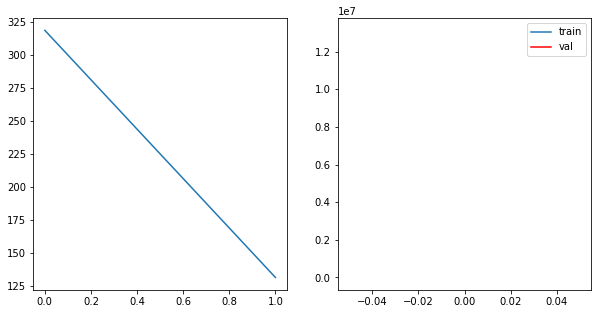

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(41.0280, grad_fn=<L1LossBackward0>)
tensor(29.7286, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 35.37830638885498	     Validation Loss:466542.25	 \ LR:0.01


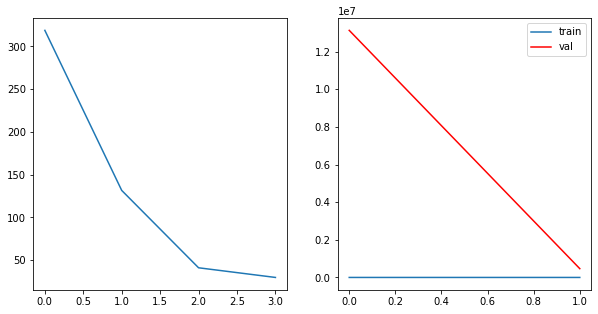

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(29.9073, grad_fn=<L1LossBackward0>)
tensor(13.0701, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 21.48868751525879	     Validation Loss:135711.328125	 \ LR:0.01


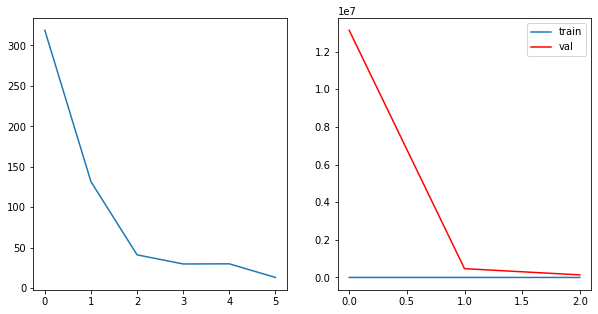

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(36.3990, grad_fn=<L1LossBackward0>)
tensor(50.0382, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 43.21860694885254	     Validation Loss:1207886.75	 \ LR:0.01


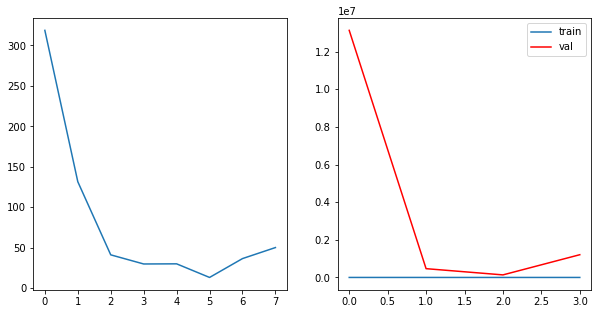

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(58.4393, grad_fn=<L1LossBackward0>)
tensor(31.9260, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 45.18266201019287	     Validation Loss:45205.26953125	 \ LR:0.01


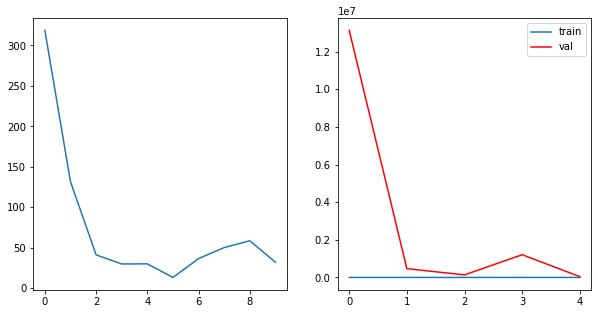

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(12.9990, grad_fn=<L1LossBackward0>)
tensor(5.3892, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 9.19413447380066	     Validation Loss:3983.591796875	 \ LR:0.01


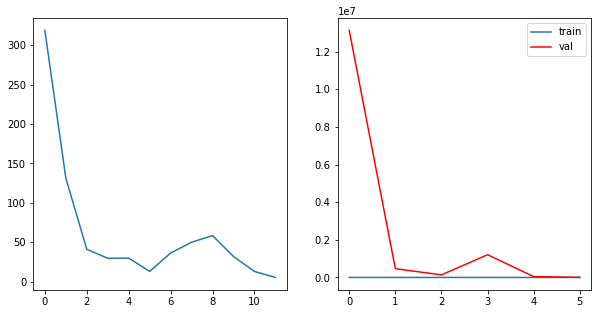

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(13.1904, grad_fn=<L1LossBackward0>)
tensor(10.2450, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 11.71768856048584	     Validation Loss:1531.0316162109375	 \ LR:0.01


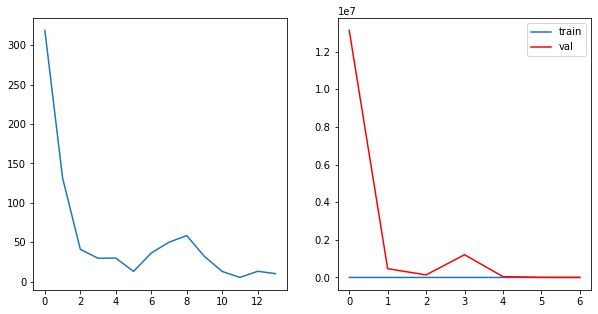

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(5.6344, grad_fn=<L1LossBackward0>)
tensor(6.6943, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 6.164355754852295	     Validation Loss:204.9416046142578	 \ LR:0.01


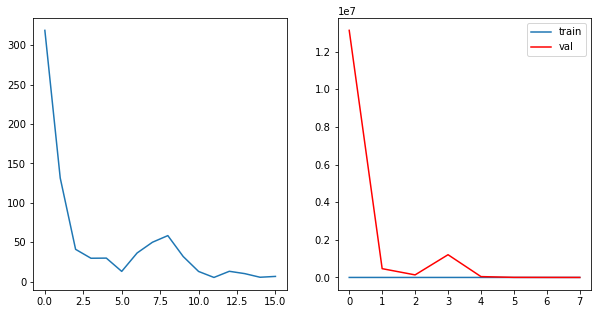

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(10.6188, grad_fn=<L1LossBackward0>)
tensor(13.6096, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 12.114195823669434	     Validation Loss:110.4057388305664	 \ LR:0.01


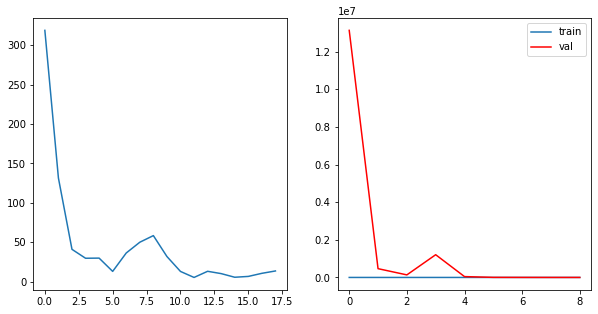

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(11.0712, grad_fn=<L1LossBackward0>)
tensor(7.5582, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 9.314677000045776	     Validation Loss:127.3195571899414	 \ LR:0.01


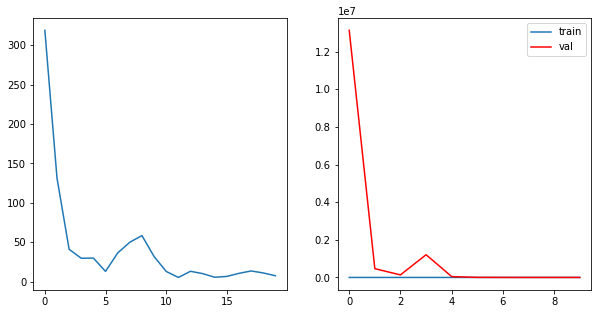

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(5.2334, grad_fn=<L1LossBackward0>)
tensor(6.2611, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 5.747292757034302	     Validation Loss:260.9089050292969	 \ LR:0.01


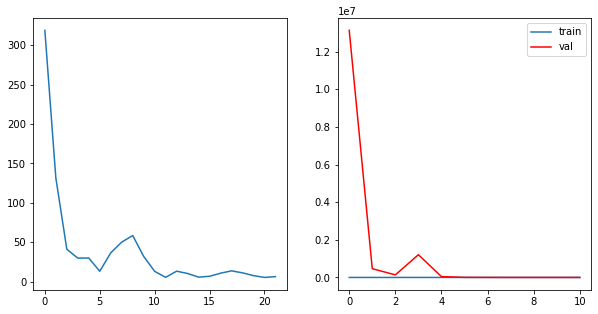

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(6.6512, grad_fn=<L1LossBackward0>)
tensor(7.3717, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 7.01143217086792	     Validation Loss:586.566650390625	 \ LR:0.01


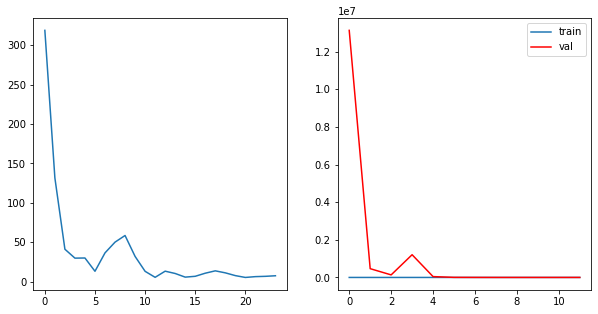

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.4764, grad_fn=<L1LossBackward0>)
tensor(6.5894, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 5.532899618148804	     Validation Loss:309.9731750488281	 \ LR:0.01


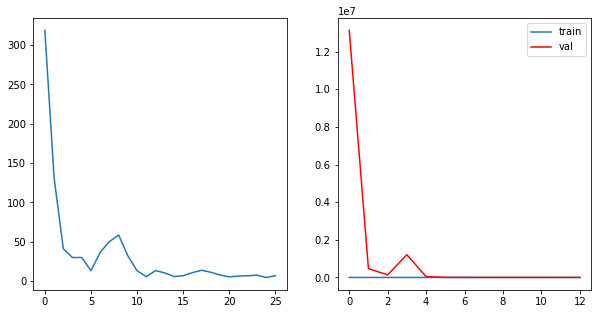

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.9486, grad_fn=<L1LossBackward0>)
tensor(4.7951, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 4.371850371360779	     Validation Loss:56.758056640625	 \ LR:0.01


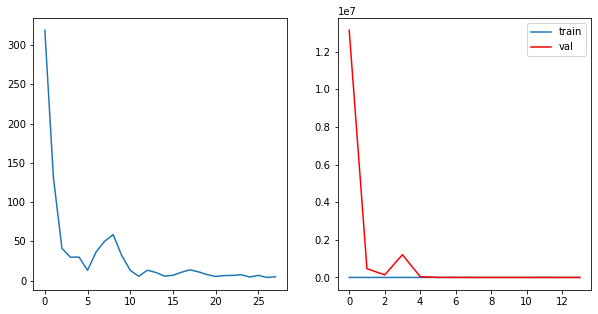

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.8587, grad_fn=<L1LossBackward0>)
tensor(5.2753, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 4.0670037269592285	     Validation Loss:135.9244384765625	 \ LR:0.01


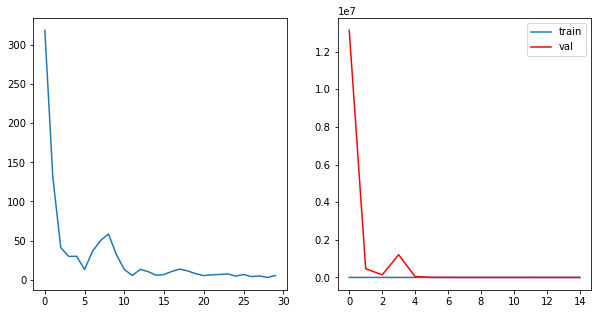

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6821, grad_fn=<L1LossBackward0>)
tensor(5.3716, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 4.526827335357666	     Validation Loss:57.24729537963867	 \ LR:0.01


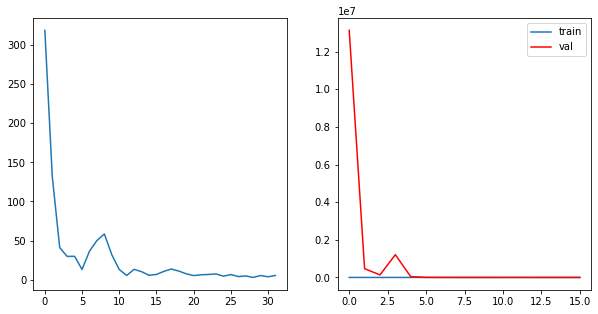

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.1257, grad_fn=<L1LossBackward0>)
tensor(4.3731, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 3.7493737936019897	     Validation Loss:43.98780822753906	 \ LR:0.01


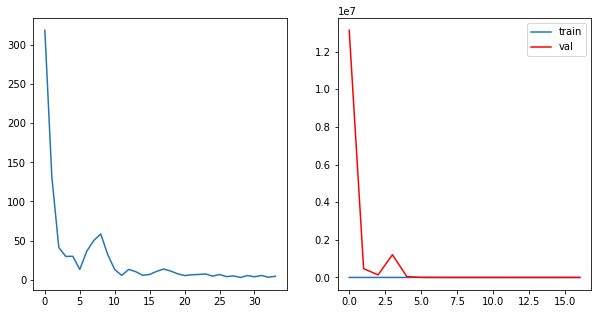

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.8802, grad_fn=<L1LossBackward0>)
tensor(5.6798, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 4.280001282691956	     Validation Loss:57.346641540527344	 \ LR:0.01


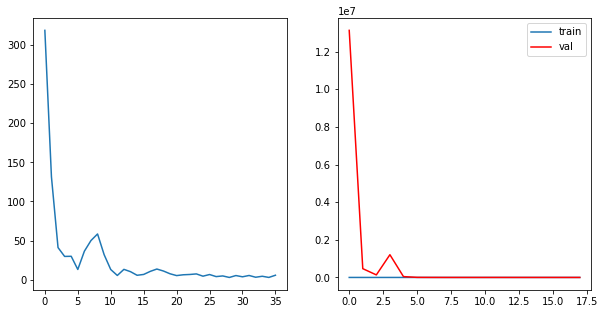

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4567, grad_fn=<L1LossBackward0>)
tensor(5.6359, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 4.54628586769104	     Validation Loss:27.035537719726562	 \ LR:0.01


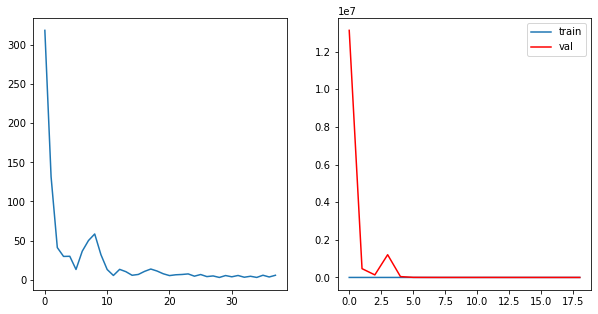

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.1496, grad_fn=<L1LossBackward0>)
tensor(4.7557, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 3.952626585960388	     Validation Loss:5.139519214630127	 \ LR:0.01


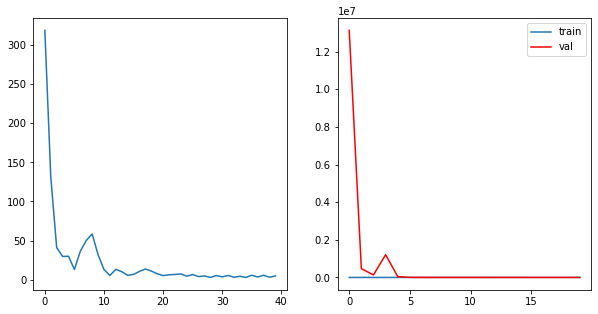

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5041, grad_fn=<L1LossBackward0>)
tensor(4.8220, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 3.66304349899292	     Validation Loss:12.24984359741211	 \ LR:0.01


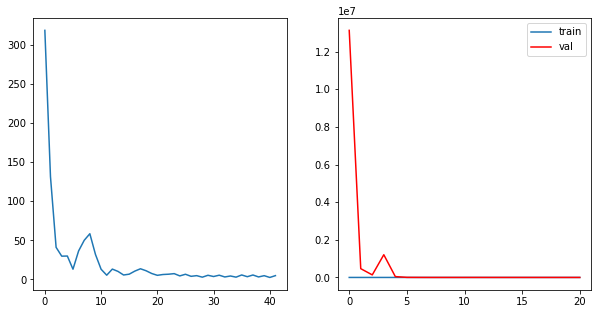

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.8967, grad_fn=<L1LossBackward0>)
tensor(4.7562, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 3.826469659805298	     Validation Loss:6.172206878662109	 \ LR:0.01


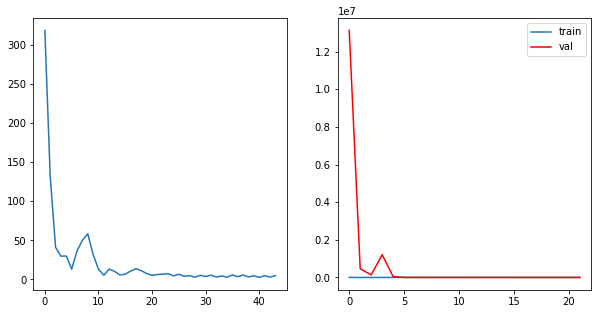

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.7041, grad_fn=<L1LossBackward0>)
tensor(4.2250, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 3.4645668268203735	     Validation Loss:4.375146865844727	 \ LR:0.01


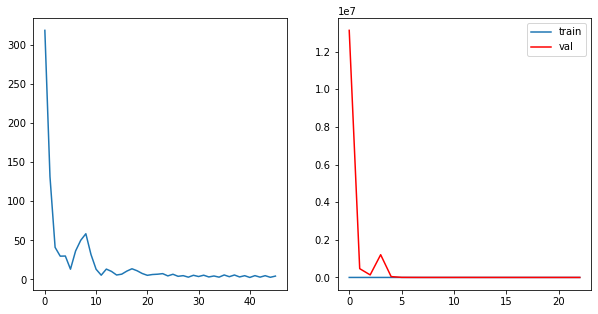

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.4291, grad_fn=<L1LossBackward0>)
tensor(4.6521, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 3.5406140089035034	     Validation Loss:3.2958109378814697	 \ LR:0.01


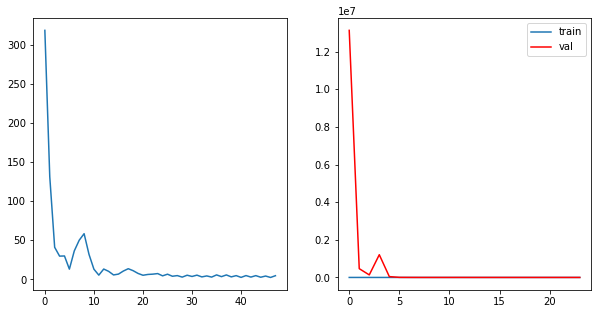

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.4228, grad_fn=<L1LossBackward0>)
tensor(4.0639, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 3.24336040019989	     Validation Loss:4.531460285186768	 \ LR:0.01


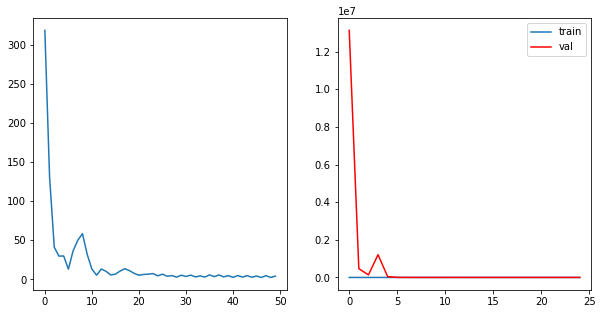

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9841, grad_fn=<L1LossBackward0>)
tensor(4.3349, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 3.6595139503479004	     Validation Loss:4.741815090179443	 \ LR:0.01


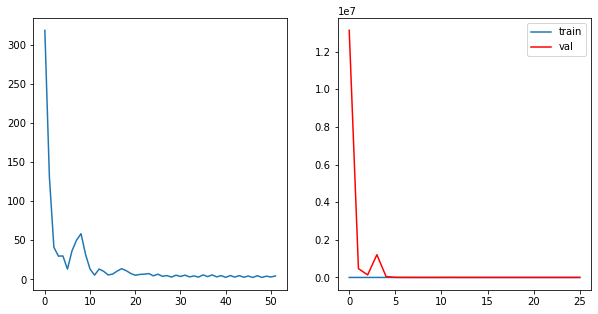

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.1656, grad_fn=<L1LossBackward0>)
tensor(4.1458, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 3.655687093734741	     Validation Loss:2.677865505218506	 \ LR:0.01


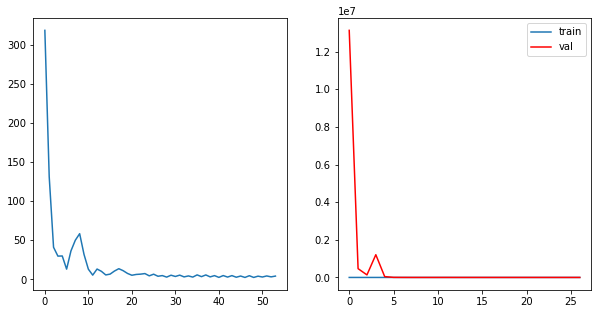

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3895, grad_fn=<L1LossBackward0>)
tensor(4.2250, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 3.307249069213867	     Validation Loss:4.5702714920043945	 \ LR:0.01


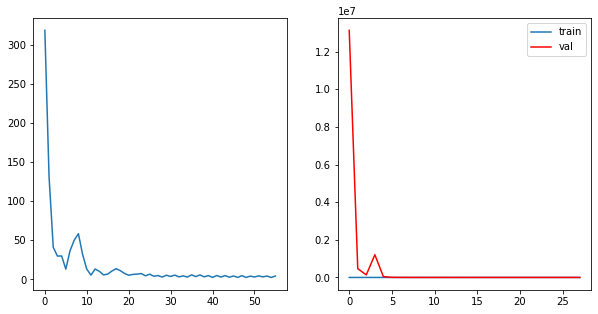

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5744, grad_fn=<L1LossBackward0>)
tensor(4.0558, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 3.315117359161377	     Validation Loss:3.1568596363067627	 \ LR:0.01


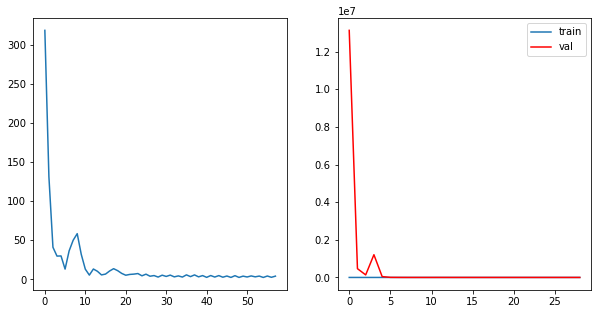

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.6478, grad_fn=<L1LossBackward0>)
tensor(4.0334, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 3.340597152709961	     Validation Loss:4.624992847442627	 \ LR:0.01


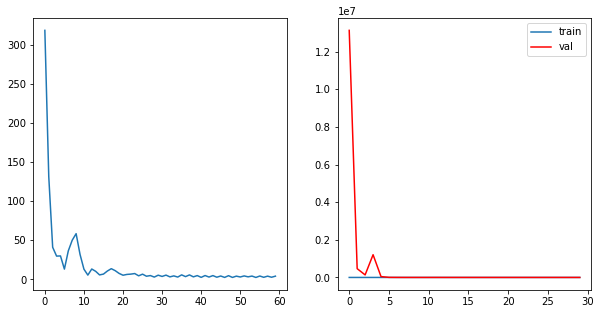

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.6484, grad_fn=<L1LossBackward0>)
tensor(4.0313, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 3.339832305908203	     Validation Loss:3.346177577972412	 \ LR:0.01


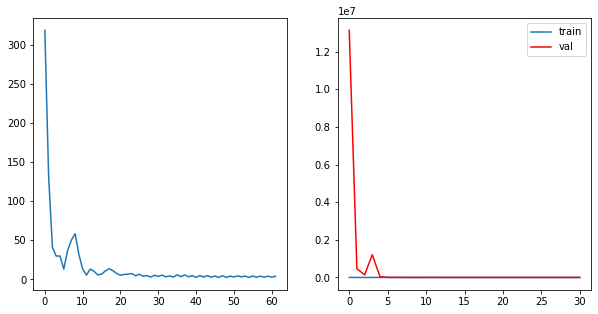

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5599, grad_fn=<L1LossBackward0>)
tensor(3.2431, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 2.901536226272583	     Validation Loss:4.64441442489624	 \ LR:0.01


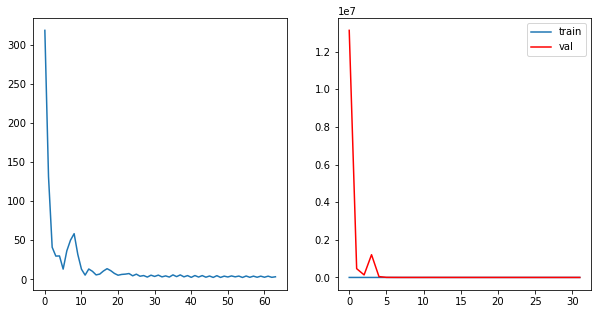

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9624, grad_fn=<L1LossBackward0>)
tensor(3.5884, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 3.2753968238830566	     Validation Loss:3.8348798751831055	 \ LR:0.01


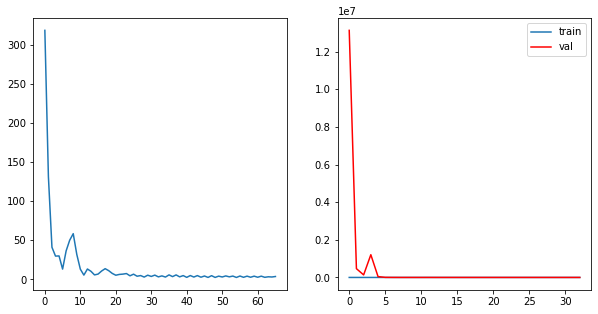

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.1191, grad_fn=<L1LossBackward0>)
tensor(4.0678, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 3.593469023704529	     Validation Loss:2.1956582069396973	 \ LR:0.01


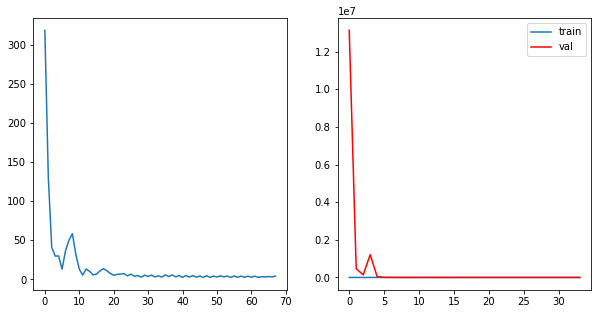

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3132, grad_fn=<L1LossBackward0>)
tensor(3.6338, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 2.9734984636306763	     Validation Loss:4.09433650970459	 \ LR:0.01


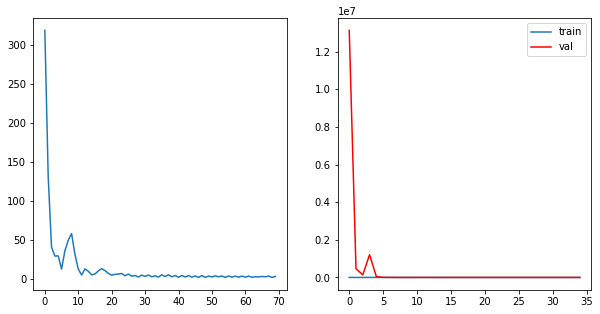

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9178, grad_fn=<L1LossBackward0>)
tensor(3.6561, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 3.286973476409912	     Validation Loss:3.363391399383545	 \ LR:0.01


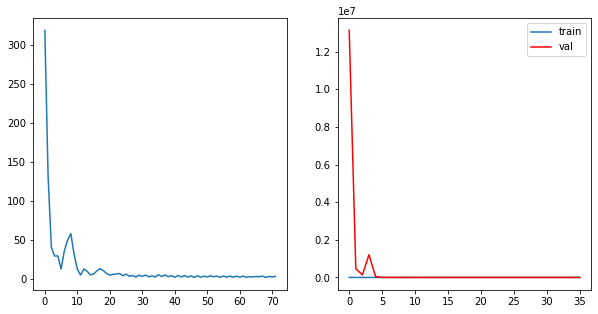

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9047, grad_fn=<L1LossBackward0>)
tensor(3.5581, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 3.231363296508789	     Validation Loss:3.542025089263916	 \ LR:0.01


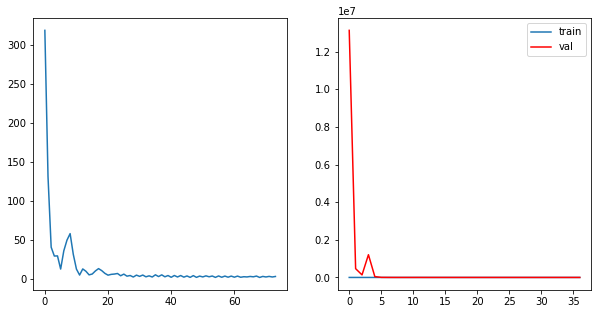

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3658, grad_fn=<L1LossBackward0>)
tensor(3.2202, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 2.7929892539978027	     Validation Loss:2.122187614440918	 \ LR:0.01


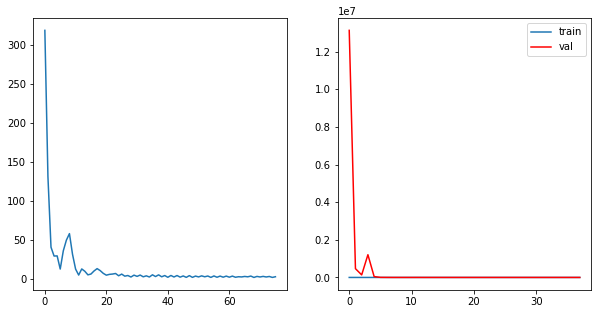

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1775, grad_fn=<L1LossBackward0>)
tensor(3.1857, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 2.681594967842102	     Validation Loss:2.195291519165039	 \ LR:0.01


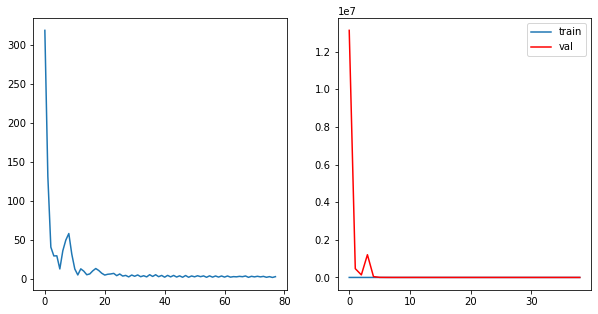

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.4161, grad_fn=<L1LossBackward0>)
tensor(3.4213, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 2.918709397315979	     Validation Loss:2.218554735183716	 \ LR:0.01


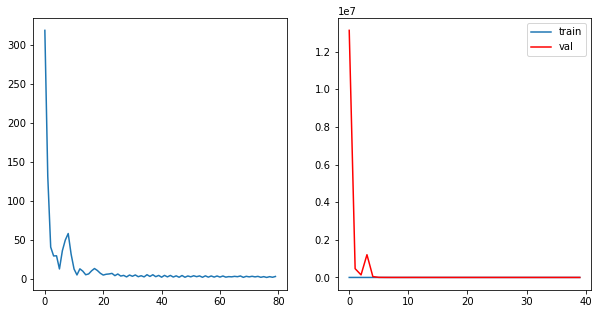

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2319, grad_fn=<L1LossBackward0>)
tensor(3.6457, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 40	 \Training Loss: 2.9387952089309692	     Validation Loss:3.694857120513916	 \ LR:0.01


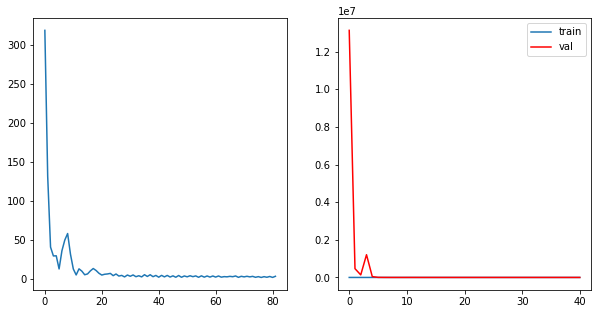

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3899, grad_fn=<L1LossBackward0>)
tensor(3.5326, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 41	 \Training Loss: 2.961239457130432	     Validation Loss:3.155015468597412	 \ LR:0.01


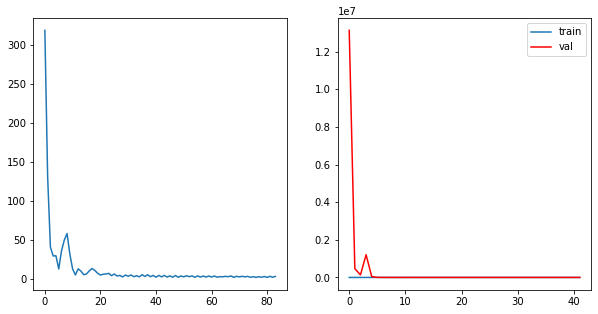

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2745, grad_fn=<L1LossBackward0>)
tensor(3.1364, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 42	 \Training Loss: 2.7054466009140015	     Validation Loss:2.9657561779022217	 \ LR:0.01


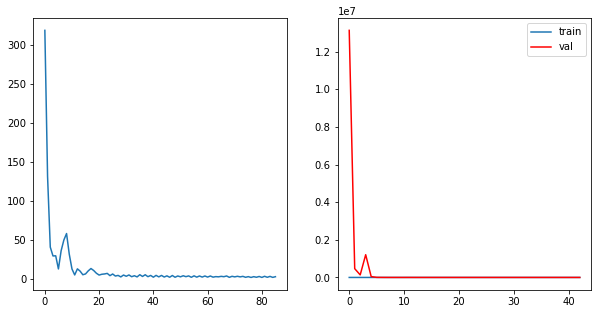

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1672, grad_fn=<L1LossBackward0>)
tensor(3.0760, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 43	 \Training Loss: 2.621583104133606	     Validation Loss:2.757129192352295	 \ LR:0.01


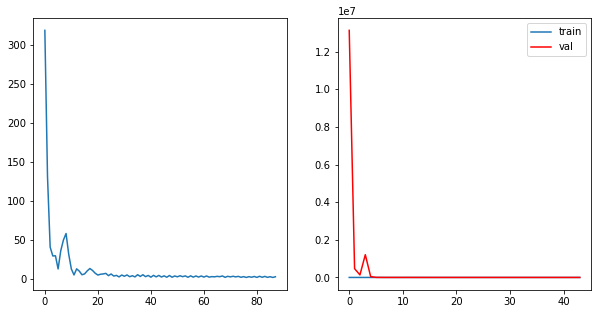

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5806, grad_fn=<L1LossBackward0>)
tensor(2.7335, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 44	 \Training Loss: 2.657029390335083	     Validation Loss:2.614414691925049	 \ LR:0.01


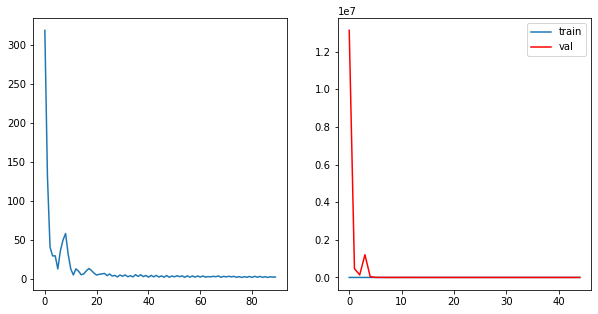

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3556, grad_fn=<L1LossBackward0>)
tensor(4.1955, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 45	 \Training Loss: 3.2755606174468994	     Validation Loss:2.7839441299438477	 \ LR:0.01


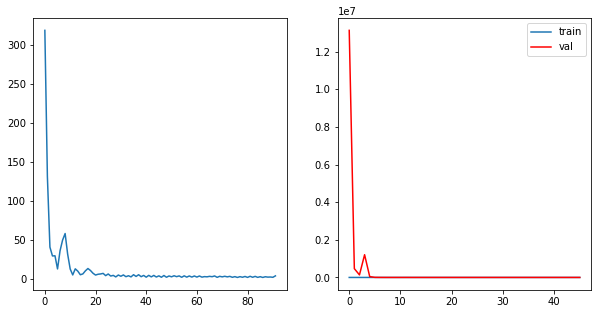

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1470, grad_fn=<L1LossBackward0>)
tensor(3.6757, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 46	 \Training Loss: 2.9113093614578247	     Validation Loss:2.9972336292266846	 \ LR:0.01


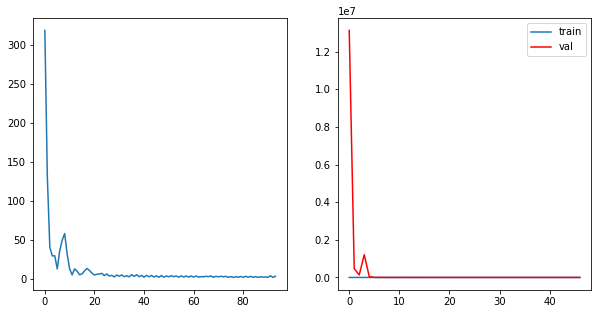

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.2114, grad_fn=<L1LossBackward0>)
tensor(3.4554, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 47	 \Training Loss: 3.3333996534347534	     Validation Loss:2.5478484630584717	 \ LR:0.01


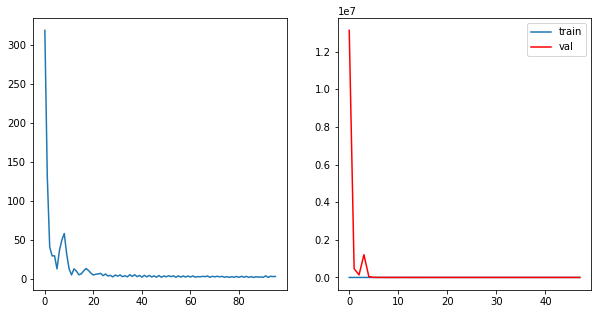

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.0637, grad_fn=<L1LossBackward0>)
tensor(3.4157, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 48	 \Training Loss: 3.2396987676620483	     Validation Loss:14.19552230834961	 \ LR:0.001


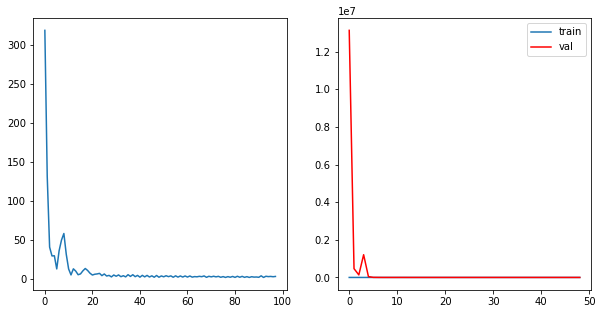

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.4991, grad_fn=<L1LossBackward0>)
tensor(3.1724, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 49	 \Training Loss: 2.835764765739441	     Validation Loss:11.120100975036621	 \ LR:0.001


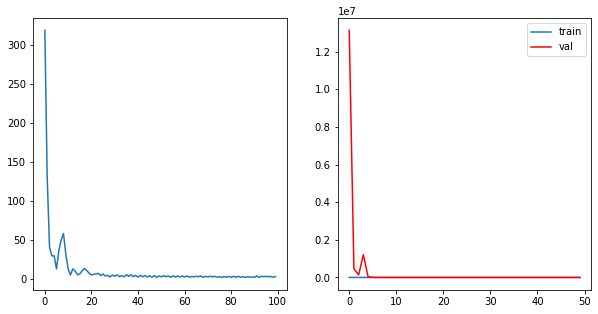

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5340, grad_fn=<L1LossBackward0>)
tensor(3.1006, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 50	 \Training Loss: 2.817305564880371	     Validation Loss:8.128535270690918	 \ LR:0.001


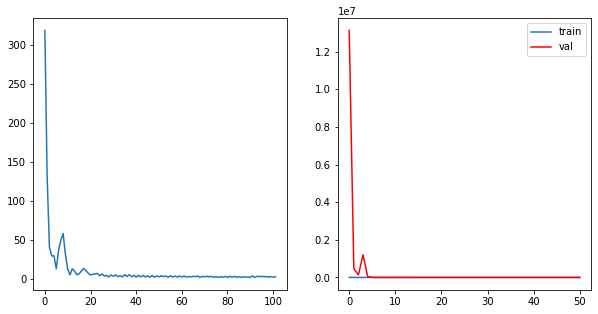

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5090, grad_fn=<L1LossBackward0>)
tensor(2.9486, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 51	 \Training Loss: 2.7287840843200684	     Validation Loss:5.503551483154297	 \ LR:0.001


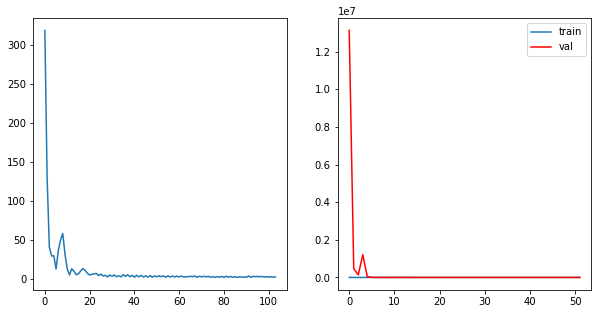

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.4274, grad_fn=<L1LossBackward0>)
tensor(2.7665, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 52	 \Training Loss: 2.5969467163085938	     Validation Loss:3.5755395889282227	 \ LR:0.001


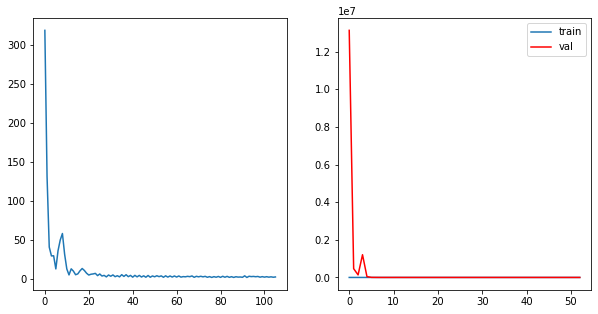

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2695, grad_fn=<L1LossBackward0>)
tensor(2.5674, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 53	 \Training Loss: 2.4184911251068115	     Validation Loss:2.465574026107788	 \ LR:0.001


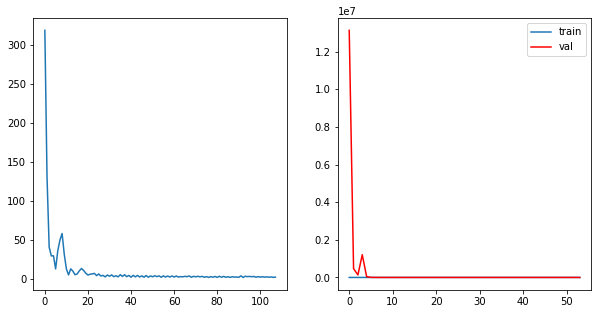

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0699, grad_fn=<L1LossBackward0>)
tensor(2.6152, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 54	 \Training Loss: 2.3425822257995605	     Validation Loss:2.374241590499878	 \ LR:0.001


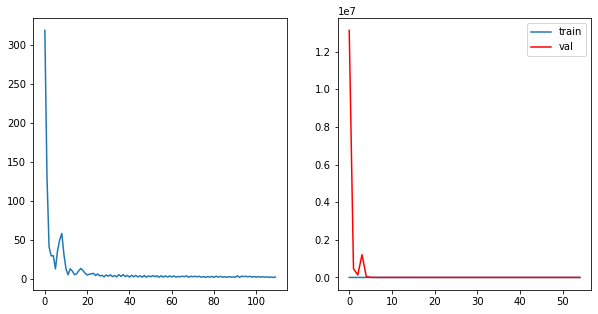

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1464, grad_fn=<L1LossBackward0>)
tensor(2.6869, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 55	 \Training Loss: 2.416675567626953	     Validation Loss:2.819941759109497	 \ LR:0.001


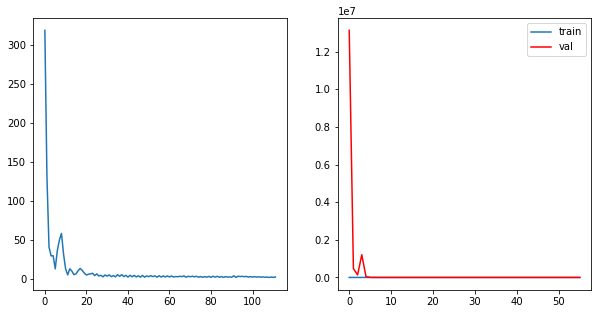

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1866, grad_fn=<L1LossBackward0>)
tensor(2.6510, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 56	 \Training Loss: 2.418800711631775	     Validation Loss:2.9342920780181885	 \ LR:0.001


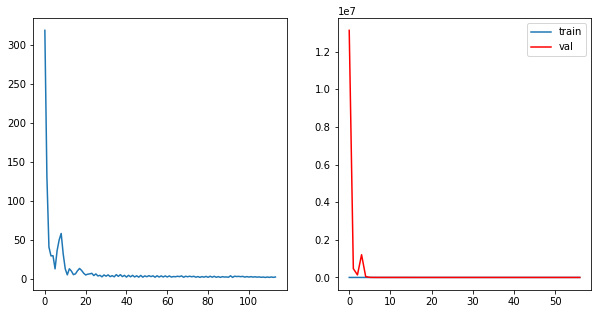

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1336, grad_fn=<L1LossBackward0>)
tensor(2.5873, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 57	 \Training Loss: 2.360448956489563	     Validation Loss:2.900561809539795	 \ LR:0.001


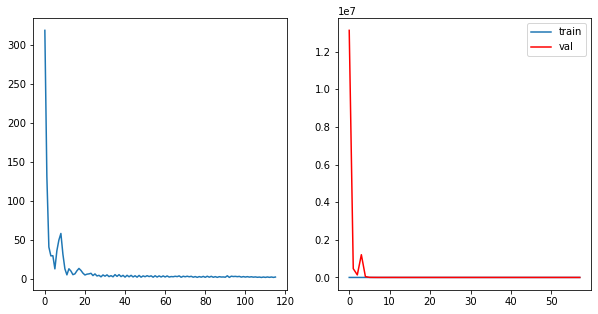

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0723, grad_fn=<L1LossBackward0>)
tensor(2.5254, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 58	 \Training Loss: 2.2988370656967163	     Validation Loss:2.7719268798828125	 \ LR:0.001


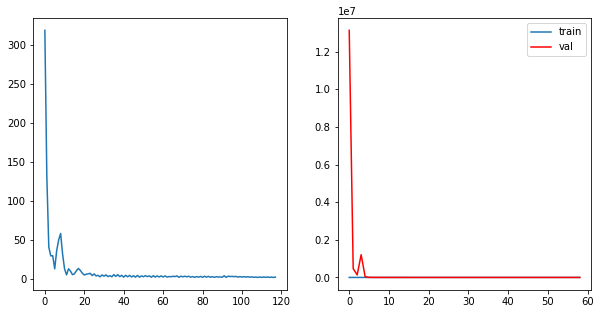

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9748, grad_fn=<L1LossBackward0>)
tensor(2.3789, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 59	 \Training Loss: 2.1768380403518677	     Validation Loss:2.591188907623291	 \ LR:0.0001


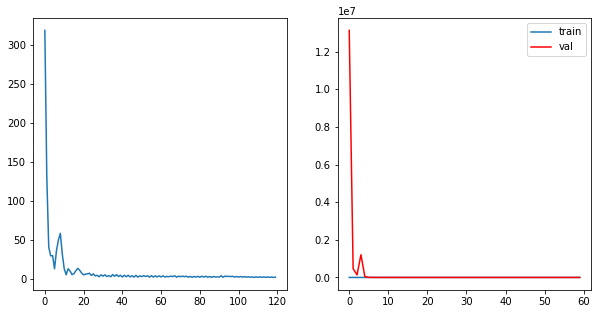

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9834, grad_fn=<L1LossBackward0>)
tensor(2.2390, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 60	 \Training Loss: 2.1112034916877747	     Validation Loss:2.597498893737793	 \ LR:0.0001


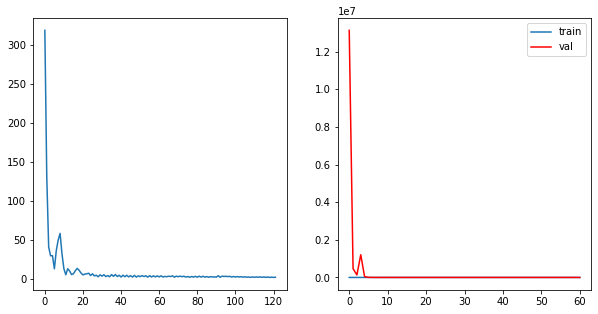

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9986, grad_fn=<L1LossBackward0>)
tensor(2.2163, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 61	 \Training Loss: 2.107447922229767	     Validation Loss:2.5984275341033936	 \ LR:0.0001


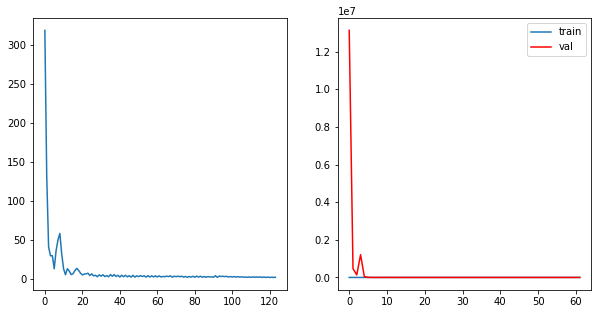

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0047, grad_fn=<L1LossBackward0>)
tensor(2.1932, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 62	 \Training Loss: 2.0989317893981934	     Validation Loss:2.5949671268463135	 \ LR:0.0001


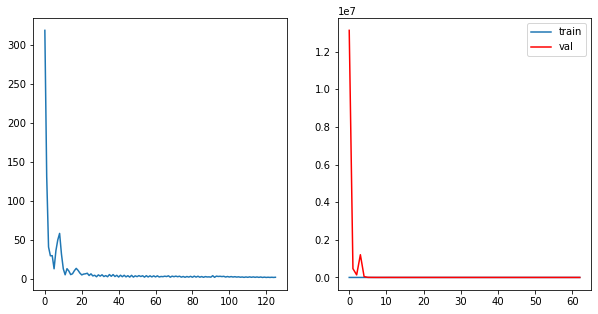

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0034, grad_fn=<L1LossBackward0>)
tensor(2.1973, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 63	 \Training Loss: 2.100361704826355	     Validation Loss:2.591440439224243	 \ LR:0.0001


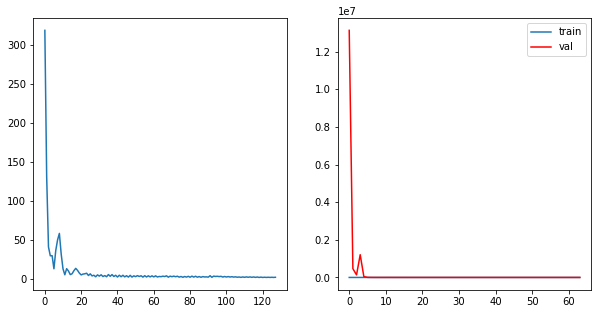

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9990, grad_fn=<L1LossBackward0>)
tensor(2.1921, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 64	 \Training Loss: 2.095573663711548	     Validation Loss:2.593884229660034	 \ LR:0.0001


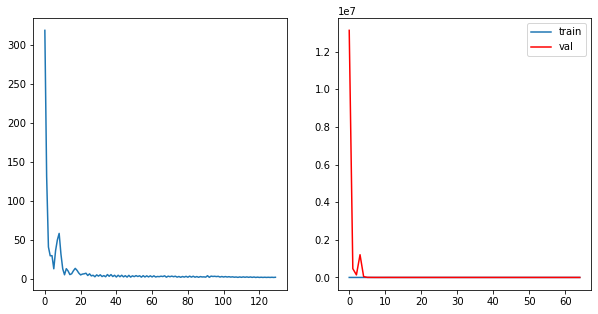

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9877, grad_fn=<L1LossBackward0>)
tensor(2.1760, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 65	 \Training Loss: 2.081864058971405	     Validation Loss:2.6160428524017334	 \ LR:0.0001


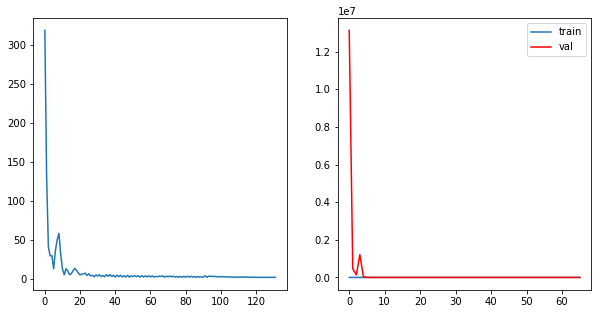

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9730, grad_fn=<L1LossBackward0>)
tensor(2.1788, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 66	 \Training Loss: 2.075879454612732	     Validation Loss:2.6328930854797363	 \ LR:0.0001


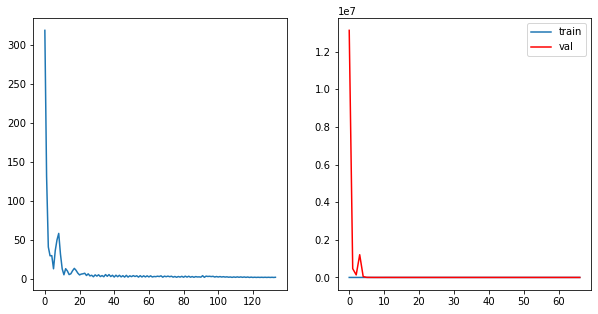

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9613, grad_fn=<L1LossBackward0>)
tensor(2.1834, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 67	 \Training Loss: 2.0723344683647156	     Validation Loss:2.639836072921753	 \ LR:0.0001


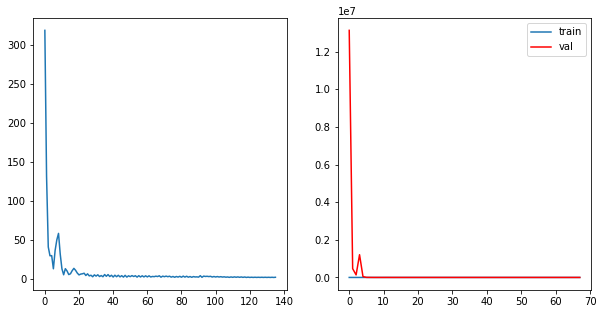

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9509, grad_fn=<L1LossBackward0>)
tensor(2.1806, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 68	 \Training Loss: 2.0657688975334167	     Validation Loss:2.639711856842041	 \ LR:0.0001


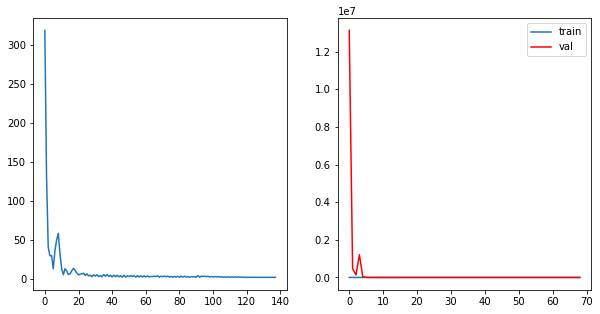

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9417, grad_fn=<L1LossBackward0>)
tensor(2.1718, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 69	 \Training Loss: 2.0567349195480347	     Validation Loss:2.6348233222961426	 \ LR:0.0001


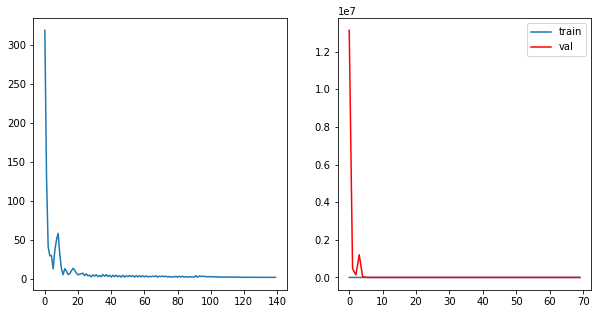

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9354, grad_fn=<L1LossBackward0>)
tensor(2.1571, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 70	 \Training Loss: 2.046253263950348	     Validation Loss:2.6264312267303467	 \ LR:1e-05


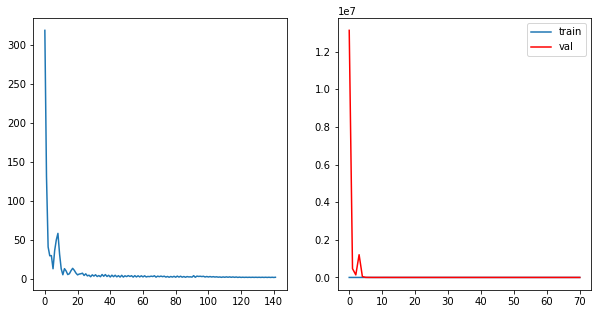

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9306, grad_fn=<L1LossBackward0>)
tensor(2.1462, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 71	 \Training Loss: 2.038390815258026	     Validation Loss:2.632582902908325	 \ LR:1e-05


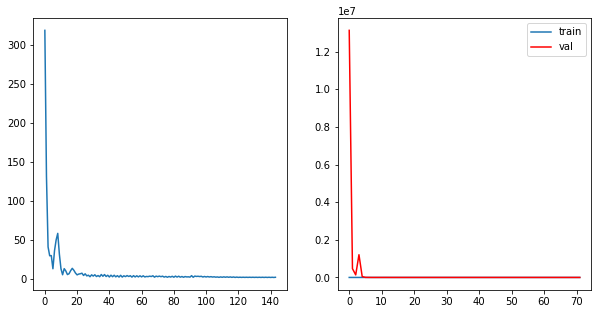

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9301, grad_fn=<L1LossBackward0>)
tensor(2.1460, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 72	 \Training Loss: 2.0380289554595947	     Validation Loss:2.6385388374328613	 \ LR:1e-05


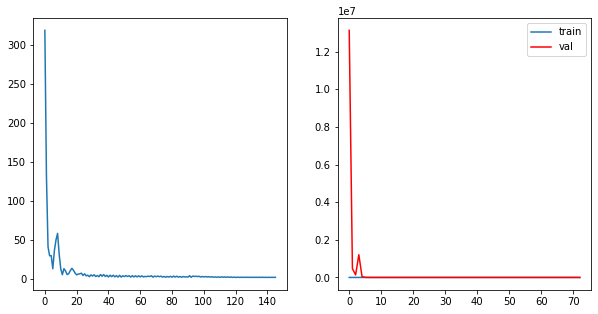

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9294, grad_fn=<L1LossBackward0>)
tensor(2.1447, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 73	 \Training Loss: 2.0370532274246216	     Validation Loss:2.644158124923706	 \ LR:1e-05


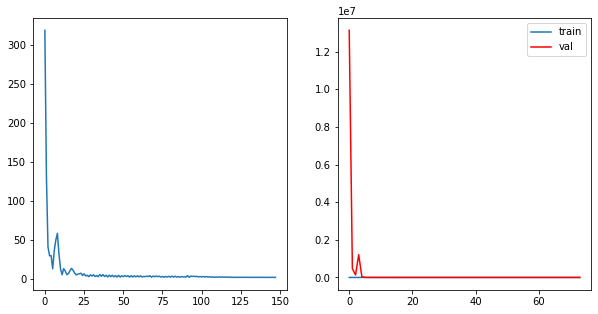

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9287, grad_fn=<L1LossBackward0>)
tensor(2.1442, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 74	 \Training Loss: 2.036470353603363	     Validation Loss:2.6486330032348633	 \ LR:1e-05


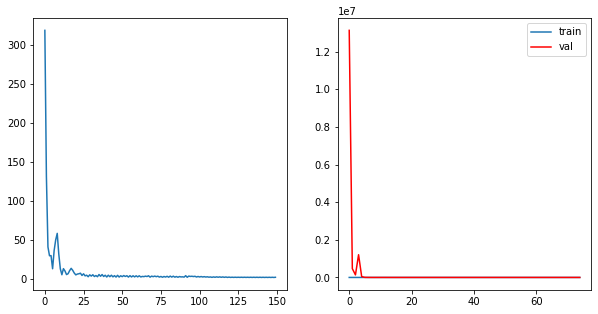

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9280, grad_fn=<L1LossBackward0>)
tensor(2.1440, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 75	 \Training Loss: 2.035993278026581	     Validation Loss:2.651608943939209	 \ LR:1e-05


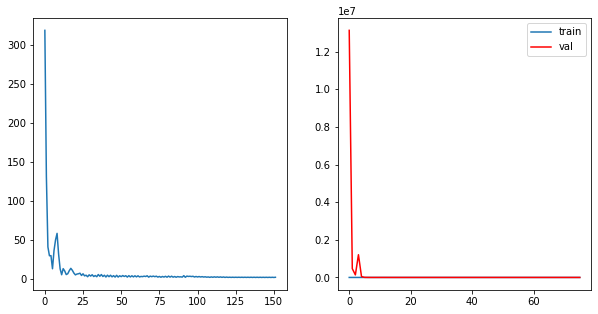

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9274, grad_fn=<L1LossBackward0>)
tensor(2.1429, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 76	 \Training Loss: 2.0351447463035583	     Validation Loss:2.6534764766693115	 \ LR:1e-05


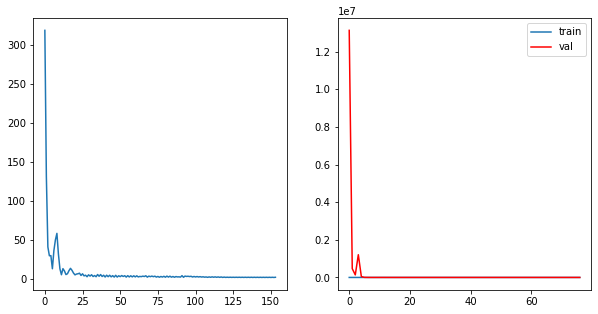

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9268, grad_fn=<L1LossBackward0>)
tensor(2.1412, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 77	 \Training Loss: 2.033993661403656	     Validation Loss:2.654536724090576	 \ LR:1e-05


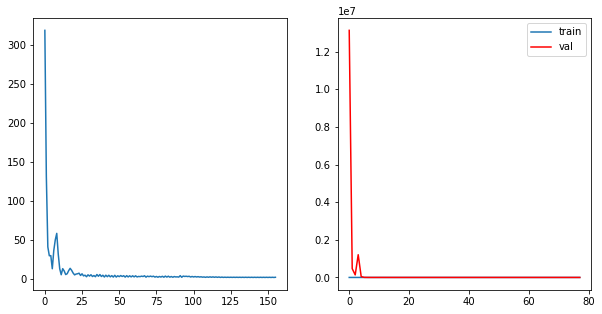

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9263, grad_fn=<L1LossBackward0>)
tensor(2.1419, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 78	 \Training Loss: 2.0341270565986633	     Validation Loss:2.6557750701904297	 \ LR:1e-05


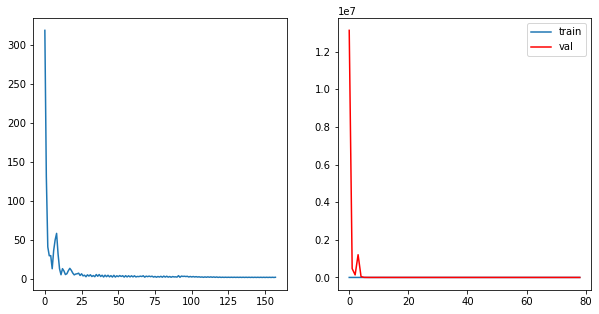

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9258, grad_fn=<L1LossBackward0>)
tensor(2.1414, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 79	 \Training Loss: 2.033604383468628	     Validation Loss:2.6576998233795166	 \ LR:1e-05


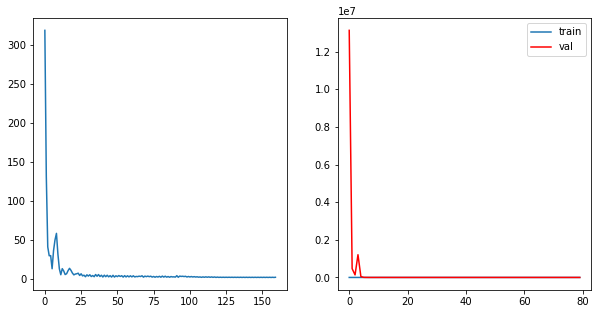

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9252, grad_fn=<L1LossBackward0>)
tensor(2.1398, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 80	 \Training Loss: 2.032474160194397	     Validation Loss:2.660024642944336	 \ LR:1e-05


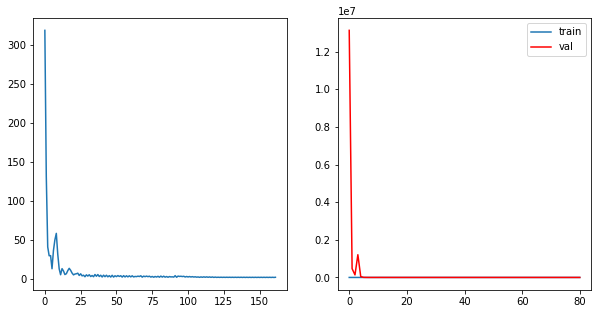

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9245, grad_fn=<L1LossBackward0>)
tensor(2.1383, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 81	 \Training Loss: 2.031382977962494	     Validation Loss:2.6617841720581055	 \ LR:1.0000000000000002e-06


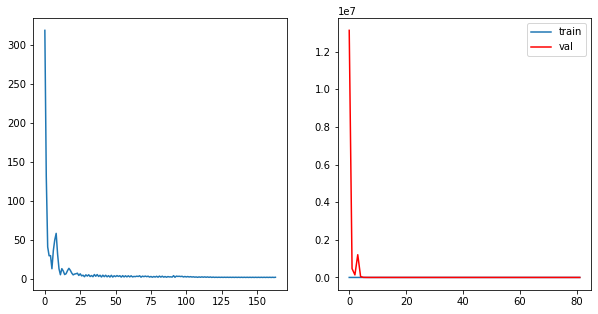

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9237, grad_fn=<L1LossBackward0>)
tensor(2.1380, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 82	 \Training Loss: 2.030870199203491	     Validation Loss:2.662245273590088	 \ LR:1.0000000000000002e-06


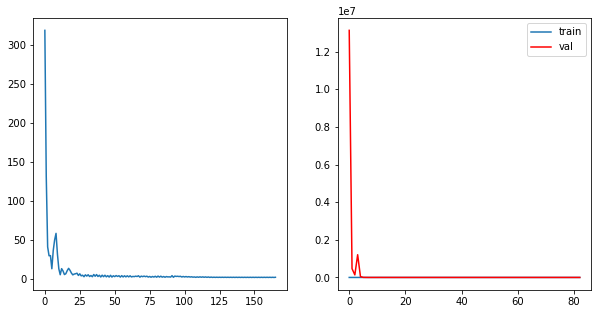

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9237, grad_fn=<L1LossBackward0>)
tensor(2.1379, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 83	 \Training Loss: 2.0307801365852356	     Validation Loss:2.6625585556030273	 \ LR:1.0000000000000002e-06


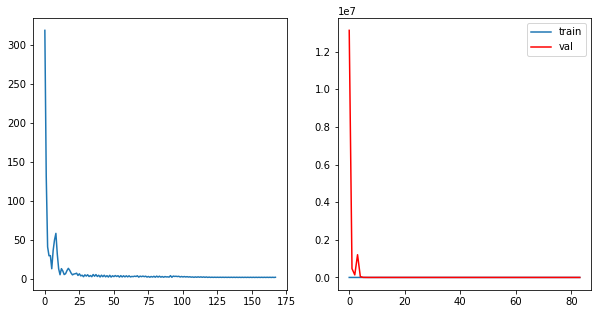

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9236, grad_fn=<L1LossBackward0>)
tensor(2.1377, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 84	 \Training Loss: 2.030659317970276	     Validation Loss:2.6627635955810547	 \ LR:1.0000000000000002e-06


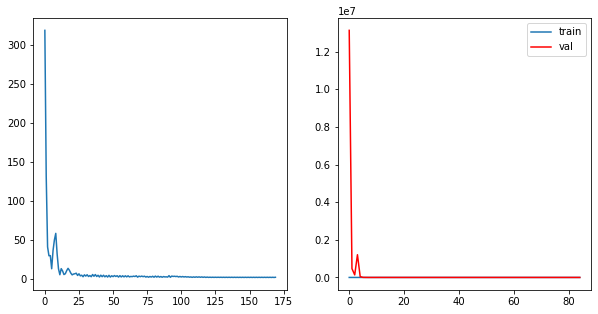

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9236, grad_fn=<L1LossBackward0>)
tensor(2.1374, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 85	 \Training Loss: 2.030514419078827	     Validation Loss:2.662893056869507	 \ LR:1.0000000000000002e-06


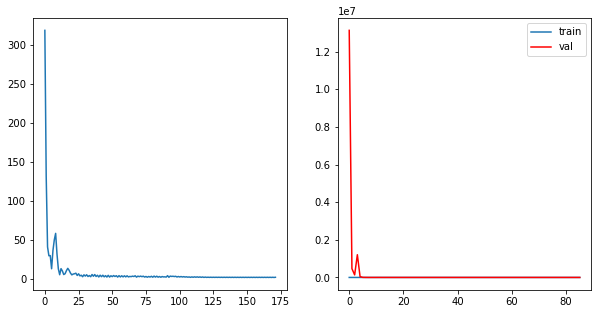

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9235, grad_fn=<L1LossBackward0>)
tensor(2.1372, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 86	 \Training Loss: 2.030348300933838	     Validation Loss:2.662964105606079	 \ LR:1.0000000000000002e-06


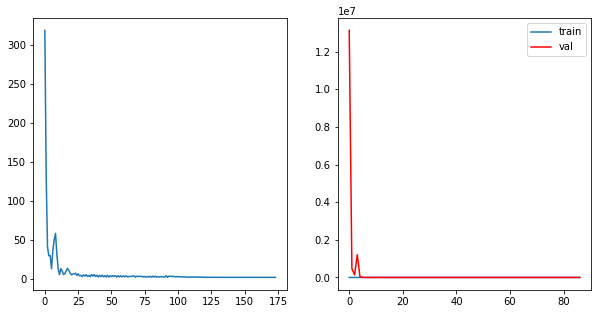

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9235, grad_fn=<L1LossBackward0>)
tensor(2.1368, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 87	 \Training Loss: 2.0301658511161804	     Validation Loss:2.6629931926727295	 \ LR:1.0000000000000002e-06


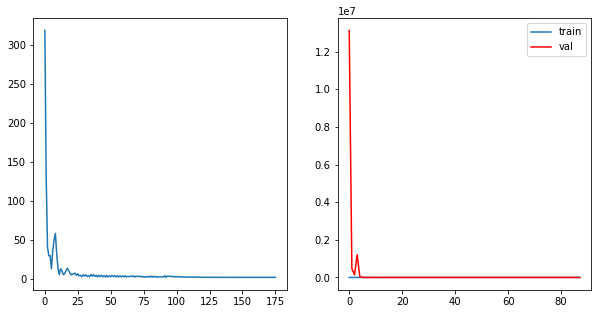

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9235, grad_fn=<L1LossBackward0>)
tensor(2.1368, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 88	 \Training Loss: 2.030155897140503	     Validation Loss:2.663072109222412	 \ LR:1.0000000000000002e-06


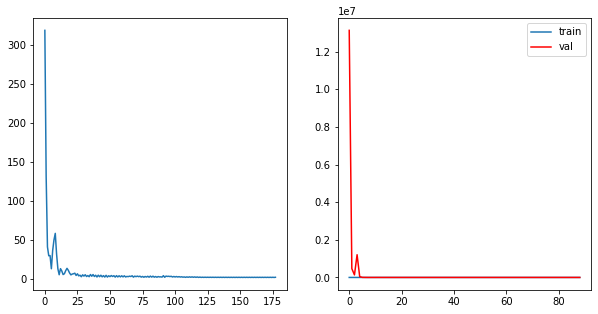

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9234, grad_fn=<L1LossBackward0>)
tensor(2.1369, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 89	 \Training Loss: 2.0301513671875	     Validation Loss:2.66324520111084	 \ LR:1.0000000000000002e-06


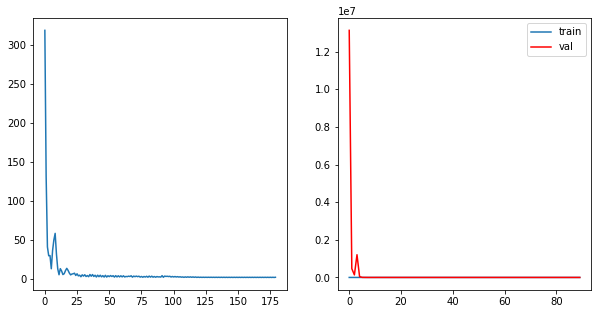

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9234, grad_fn=<L1LossBackward0>)
tensor(2.1368, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 90	 \Training Loss: 2.030074119567871	     Validation Loss:2.663475275039673	 \ LR:1.0000000000000002e-06


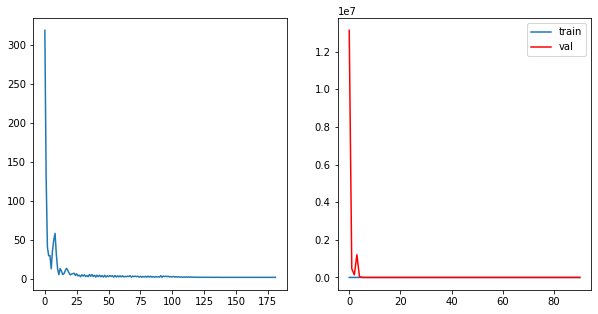

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9233, grad_fn=<L1LossBackward0>)
tensor(2.1366, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 91	 \Training Loss: 2.0299381613731384	     Validation Loss:2.663736343383789	 \ LR:1.0000000000000002e-06


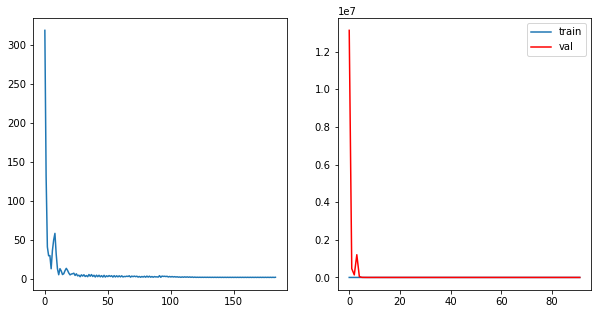

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9232, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 92	 \Training Loss: 2.0297532081604004	     Validation Loss:2.664011240005493	 \ LR:1.0000000000000002e-07


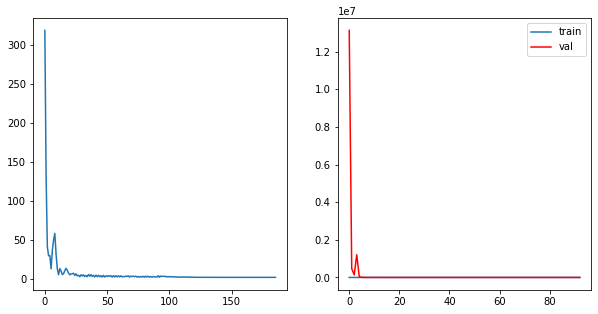

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 93	 \Training Loss: 2.0297441482543945	     Validation Loss:2.6640398502349854	 \ LR:1.0000000000000002e-07


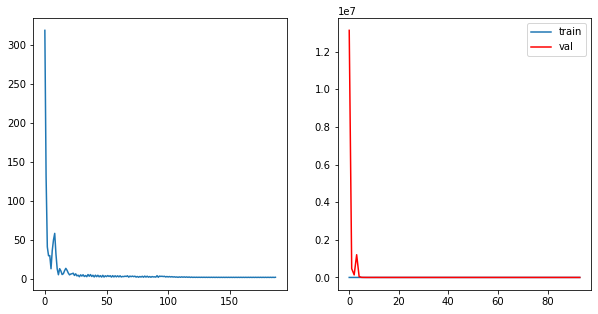

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 94	 \Training Loss: 2.029741406440735	     Validation Loss:2.6640536785125732	 \ LR:1.0000000000000002e-07


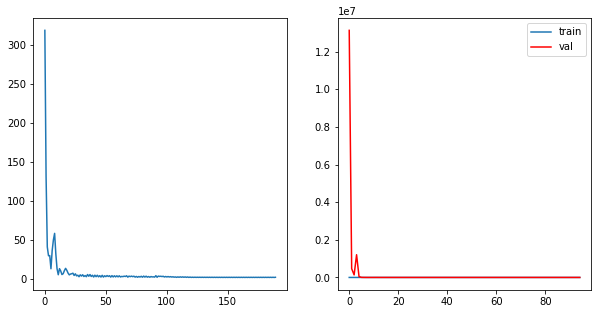

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 95	 \Training Loss: 2.029734492301941	     Validation Loss:2.6640584468841553	 \ LR:1.0000000000000002e-07


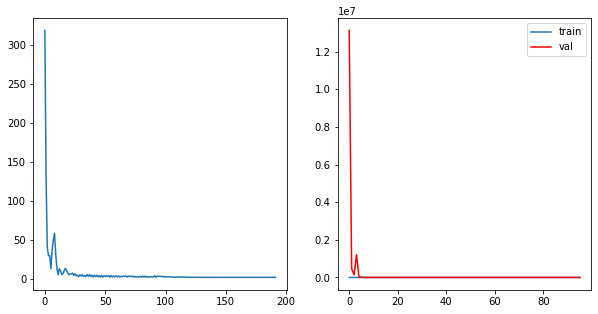

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 96	 \Training Loss: 2.029724419116974	     Validation Loss:2.6640563011169434	 \ LR:1.0000000000000002e-07


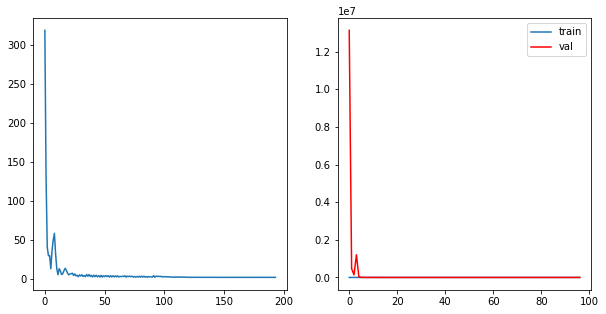

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 97	 \Training Loss: 2.0297111868858337	     Validation Loss:2.6640501022338867	 \ LR:1.0000000000000002e-07


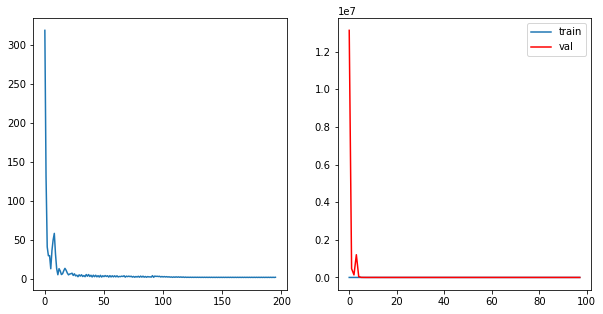

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1363, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 98	 \Training Loss: 2.029695749282837	     Validation Loss:2.6640424728393555	 \ LR:1.0000000000000002e-07


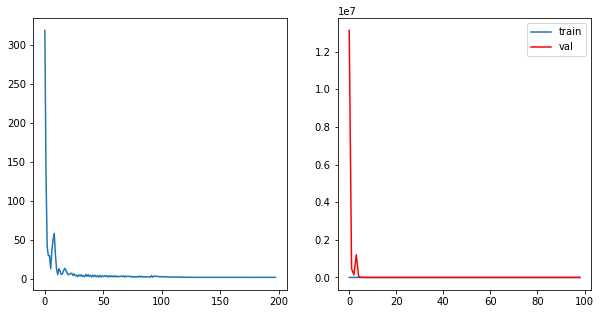

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1362, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 99	 \Training Loss: 2.029678463935852	     Validation Loss:2.6640326976776123	 \ LR:1.0000000000000002e-07


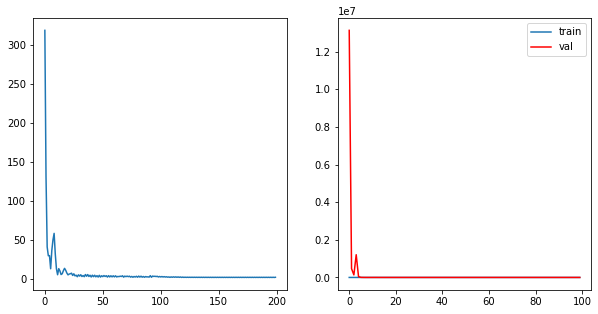

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1362, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 100	 \Training Loss: 2.0296592712402344	     Validation Loss:2.664022207260132	 \ LR:1.0000000000000002e-07


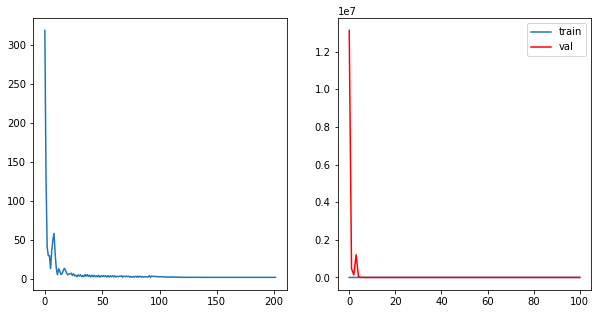

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1362, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 101	 \Training Loss: 2.029638946056366	     Validation Loss:2.6640093326568604	 \ LR:1.0000000000000002e-07


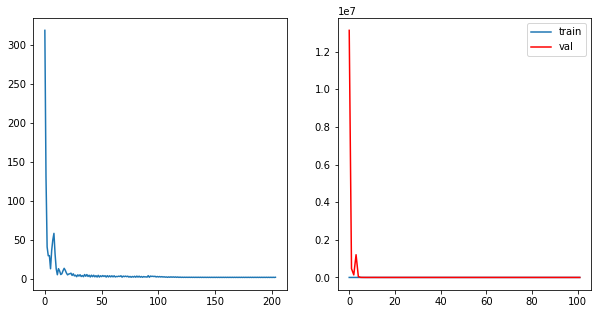

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 102	 \Training Loss: 2.029617726802826	     Validation Loss:2.663998603820801	 \ LR:1.0000000000000002e-07


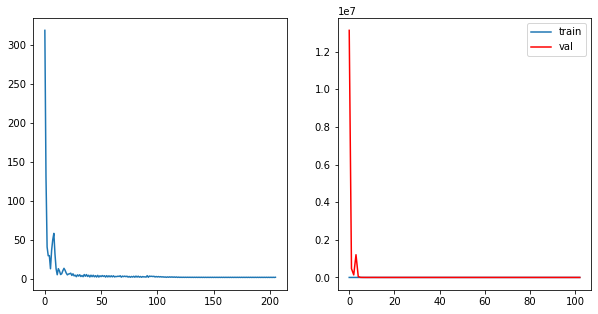

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 103	 \Training Loss: 2.02961802482605	     Validation Loss:2.6639959812164307	 \ LR:1.0000000000000004e-08


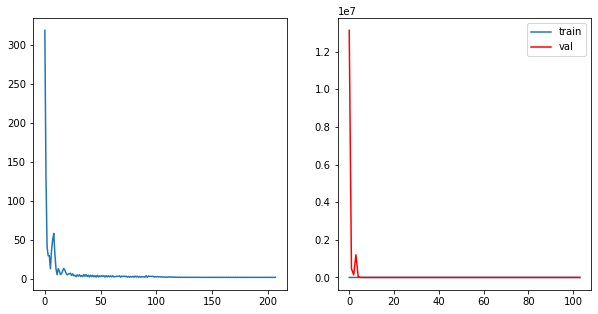

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 104	 \Training Loss: 2.029618203639984	     Validation Loss:2.6640076637268066	 \ LR:1.0000000000000004e-08


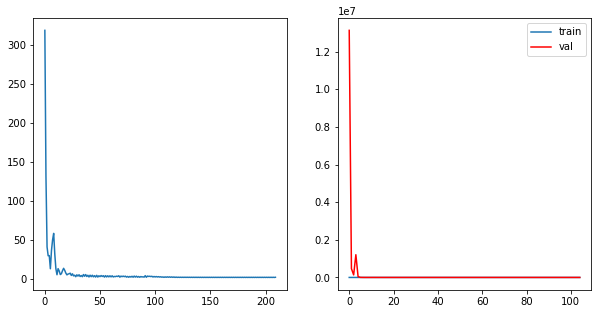

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 105	 \Training Loss: 2.029617667198181	     Validation Loss:2.664018154144287	 \ LR:1.0000000000000004e-08


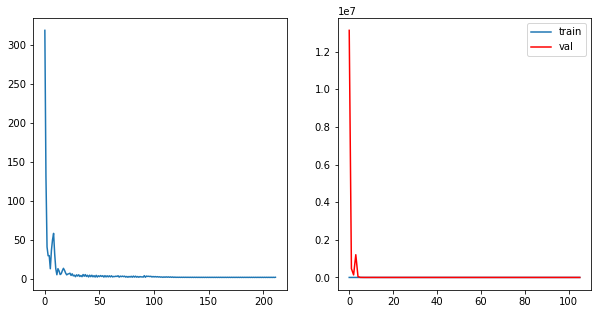

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 106	 \Training Loss: 2.0296170115470886	     Validation Loss:2.664027452468872	 \ LR:1.0000000000000004e-08


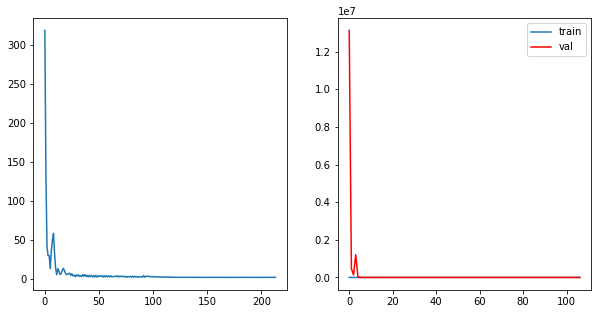

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 107	 \Training Loss: 2.029616057872772	     Validation Loss:2.664034366607666	 \ LR:1.0000000000000004e-08


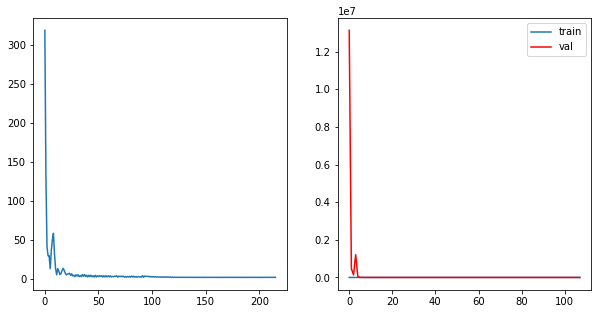

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 108	 \Training Loss: 2.0296148657798767	     Validation Loss:2.6640424728393555	 \ LR:1.0000000000000004e-08


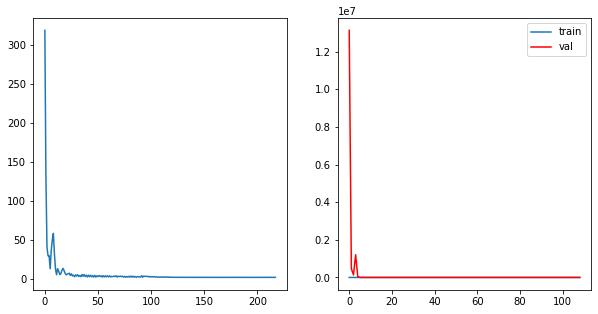

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 109	 \Training Loss: 2.029613733291626	     Validation Loss:2.664047956466675	 \ LR:1.0000000000000004e-08


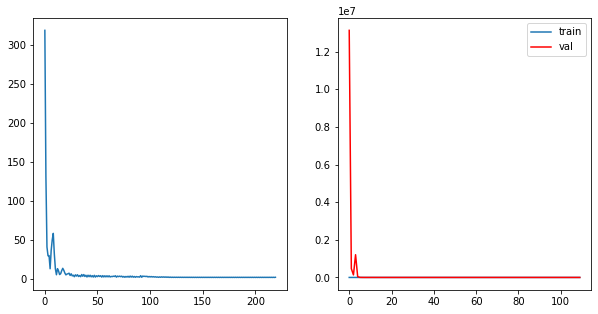

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 110	 \Training Loss: 2.029611587524414	     Validation Loss:2.6640524864196777	 \ LR:1.0000000000000004e-08


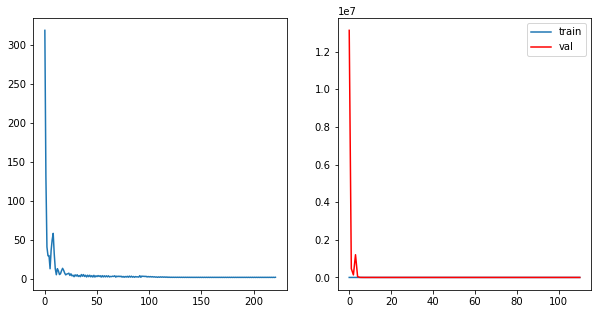

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 111	 \Training Loss: 2.029609799385071	     Validation Loss:2.6640560626983643	 \ LR:1.0000000000000004e-08


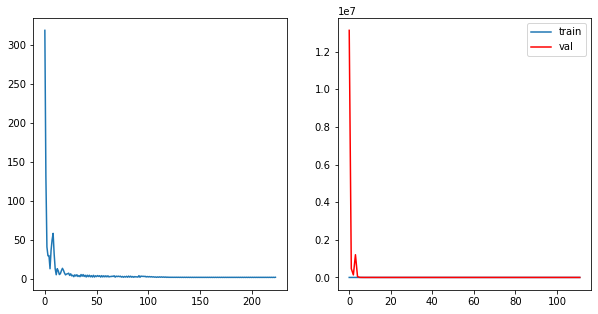

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 112	 \Training Loss: 2.029607594013214	     Validation Loss:2.664059638977051	 \ LR:1.0000000000000004e-08


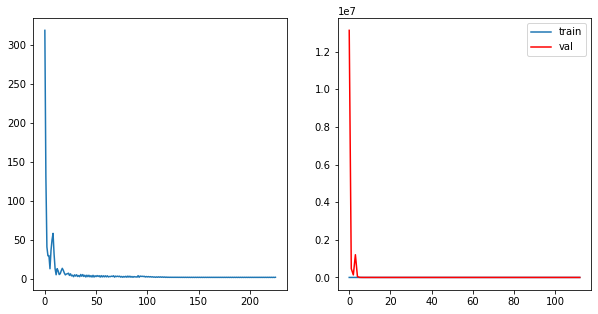

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 113	 \Training Loss: 2.0296051502227783	     Validation Loss:2.664062738418579	 \ LR:1.0000000000000004e-08


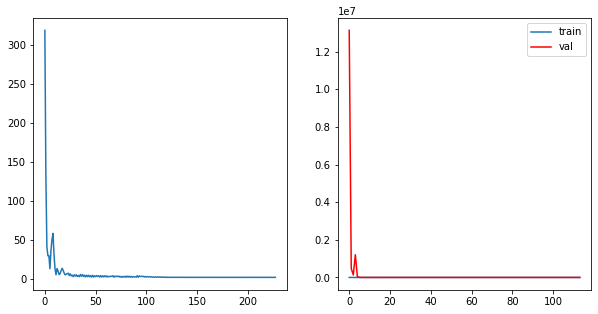

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 114	 \Training Loss: 2.0296029448509216	     Validation Loss:2.664065361022949	 \ LR:1.0000000000000004e-08


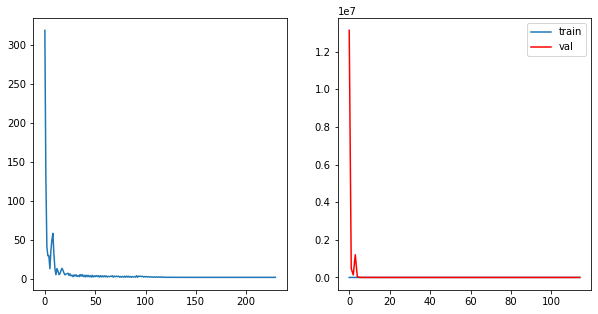

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 115	 \Training Loss: 2.029600501060486	     Validation Loss:2.6640665531158447	 \ LR:1.0000000000000004e-08


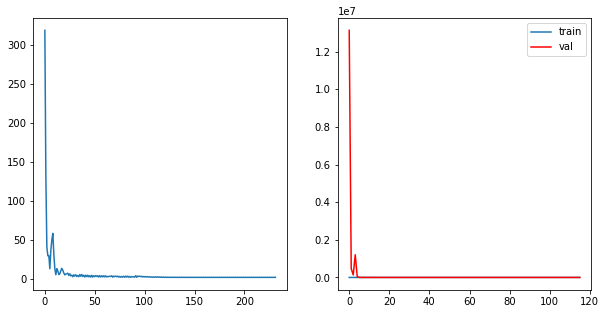

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 116	 \Training Loss: 2.029597759246826	     Validation Loss:2.6640689373016357	 \ LR:1.0000000000000004e-08


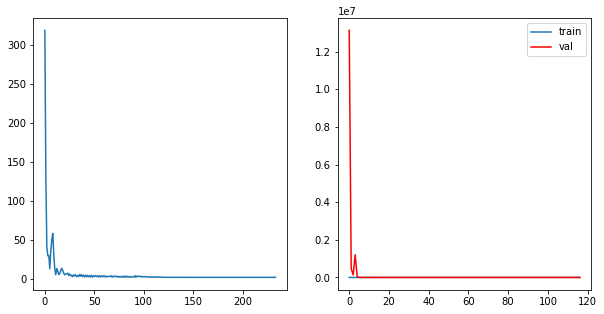

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 117	 \Training Loss: 2.029594600200653	     Validation Loss:2.6640713214874268	 \ LR:1.0000000000000004e-08


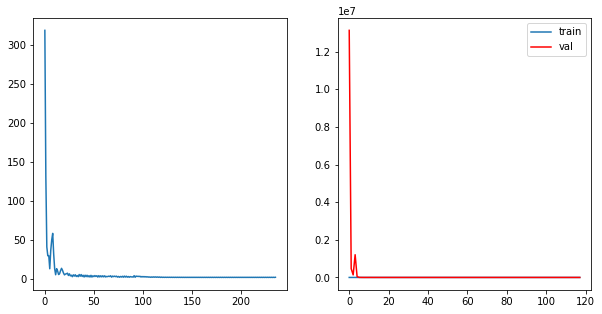

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 118	 \Training Loss: 2.029592216014862	     Validation Loss:2.6640725135803223	 \ LR:1.0000000000000004e-08


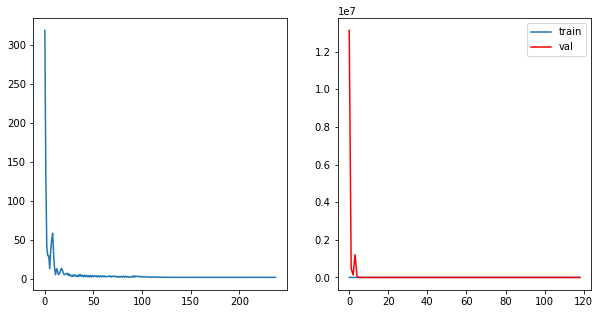

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 119	 \Training Loss: 2.02959281206131	     Validation Loss:2.6640729904174805	 \ LR:1.0000000000000004e-08


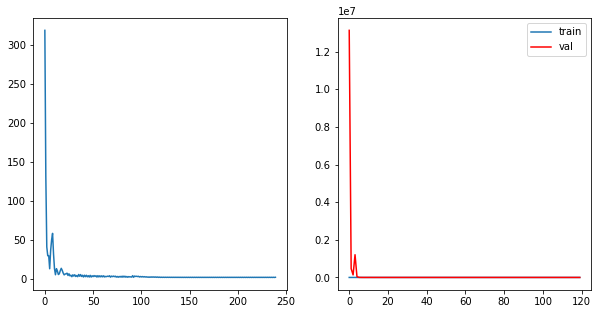

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 120	 \Training Loss: 2.029592990875244	     Validation Loss:2.664072275161743	 \ LR:1.0000000000000004e-08


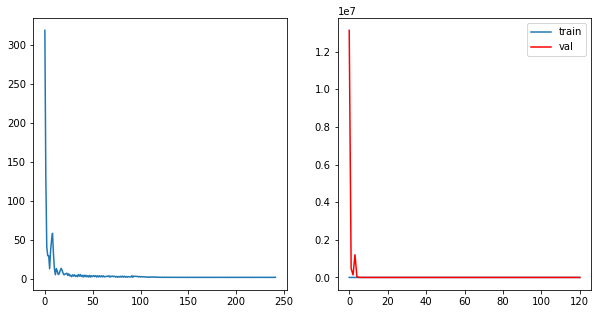

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 121	 \Training Loss: 2.029592990875244	     Validation Loss:2.664072275161743	 \ LR:1.0000000000000004e-08


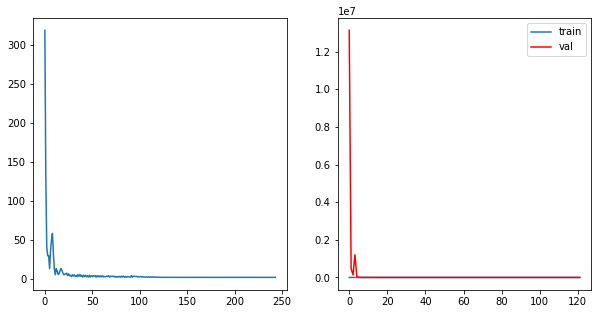

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 122	 \Training Loss: 2.029592514038086	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


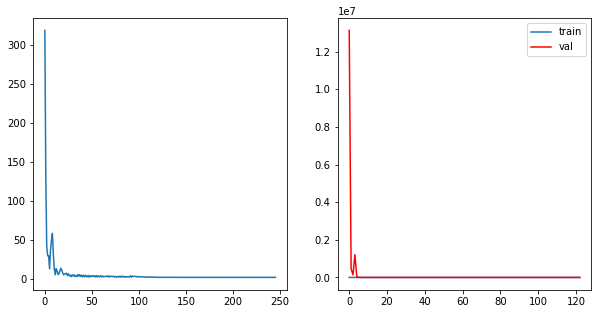

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 123	 \Training Loss: 2.0295921564102173	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


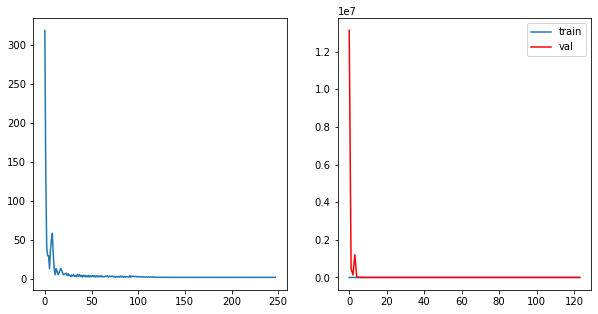

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 124	 \Training Loss: 2.0295912623405457	     Validation Loss:2.664067029953003	 \ LR:1.0000000000000004e-08


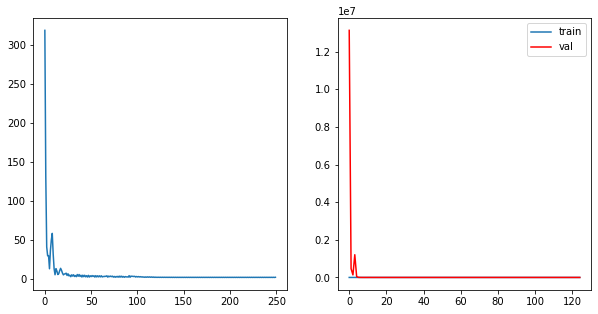

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 125	 \Training Loss: 2.02959007024765	     Validation Loss:2.6640658378601074	 \ LR:1.0000000000000004e-08


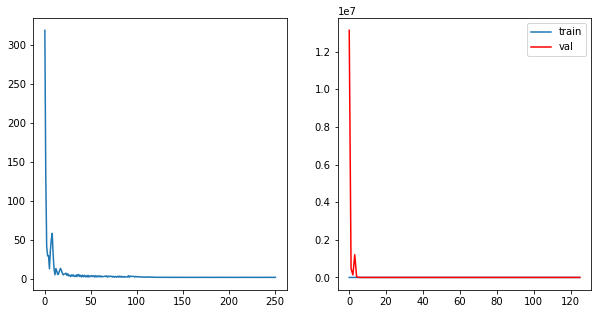

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 126	 \Training Loss: 2.0295888781547546	     Validation Loss:2.664064645767212	 \ LR:1.0000000000000004e-08


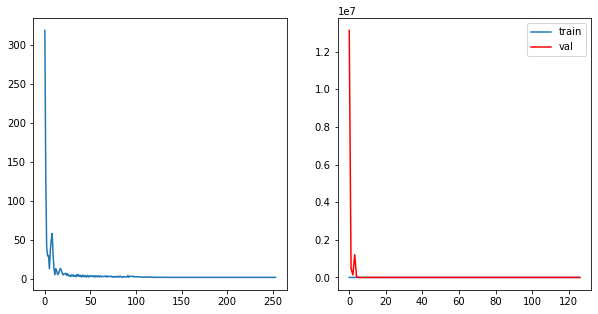

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 127	 \Training Loss: 2.0295875668525696	     Validation Loss:2.664064407348633	 \ LR:1.0000000000000004e-08


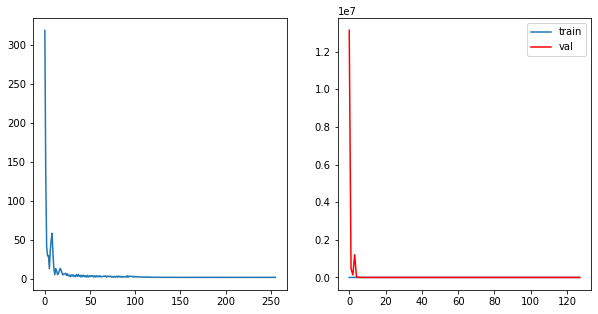

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 128	 \Training Loss: 2.029586374759674	     Validation Loss:2.664064407348633	 \ LR:1.0000000000000004e-08


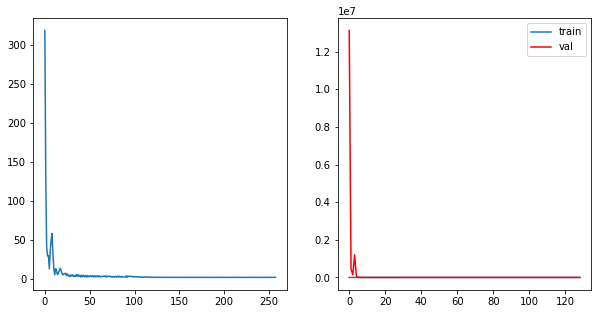

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 129	 \Training Loss: 2.0295863151550293	     Validation Loss:2.6640639305114746	 \ LR:1.0000000000000004e-08


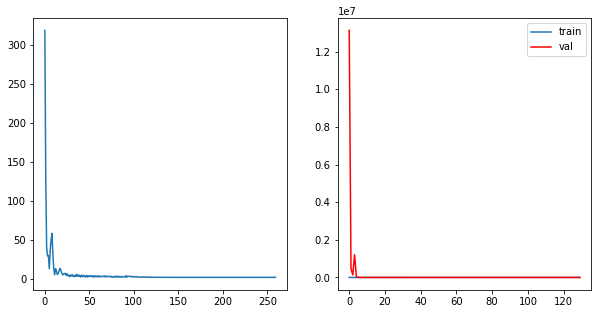

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 130	 \Training Loss: 2.0295857191085815	     Validation Loss:2.664064884185791	 \ LR:1.0000000000000004e-08


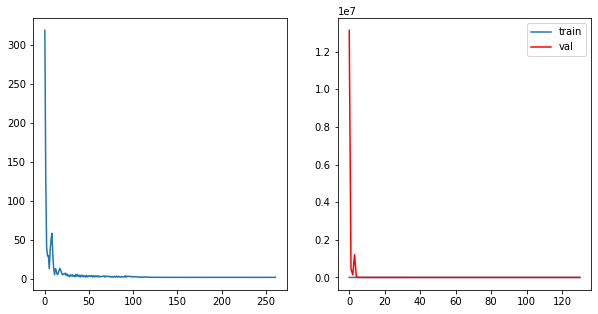

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 131	 \Training Loss: 2.029585123062134	     Validation Loss:2.6640655994415283	 \ LR:1.0000000000000004e-08


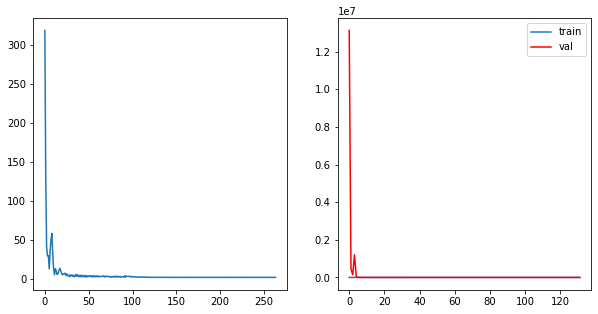

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 132	 \Training Loss: 2.0295844078063965	     Validation Loss:2.6640660762786865	 \ LR:1.0000000000000004e-08


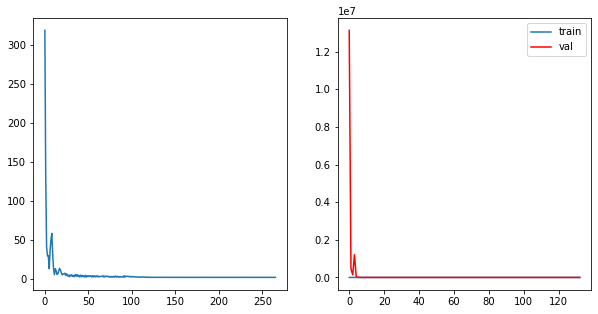

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 133	 \Training Loss: 2.029584288597107	     Validation Loss:2.6640660762786865	 \ LR:1.0000000000000004e-08


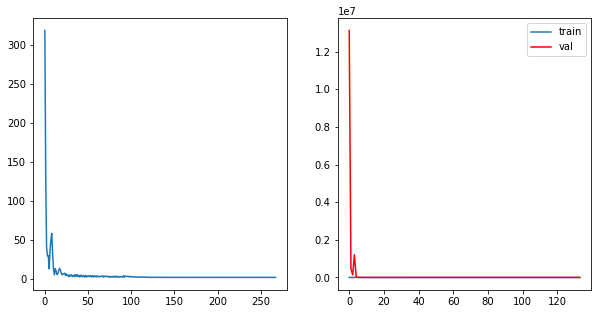

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 134	 \Training Loss: 2.029583513736725	     Validation Loss:2.6640655994415283	 \ LR:1.0000000000000004e-08


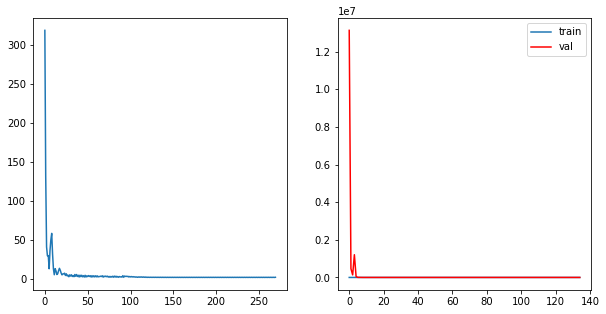

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 135	 \Training Loss: 2.0295825600624084	     Validation Loss:2.6640655994415283	 \ LR:1.0000000000000004e-08


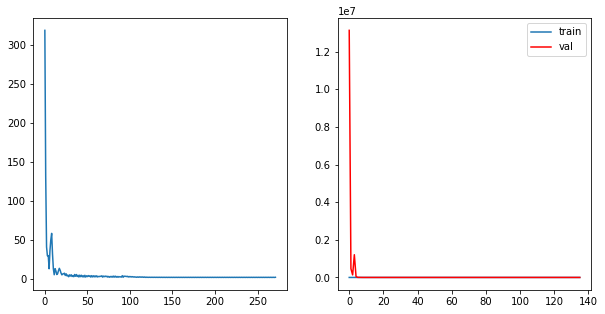

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 136	 \Training Loss: 2.0295825600624084	     Validation Loss:2.6640655994415283	 \ LR:1.0000000000000004e-08


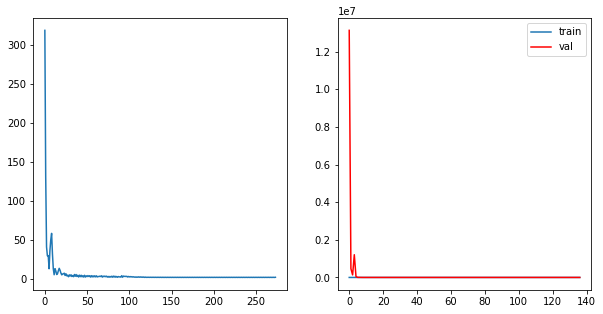

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 137	 \Training Loss: 2.0295820236206055	     Validation Loss:2.6640660762786865	 \ LR:1.0000000000000004e-08


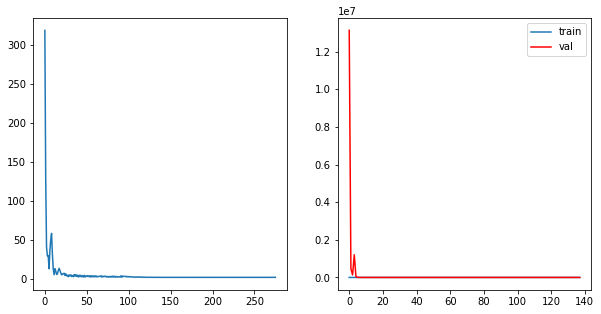

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 138	 \Training Loss: 2.029581367969513	     Validation Loss:2.664067029953003	 \ LR:1.0000000000000004e-08


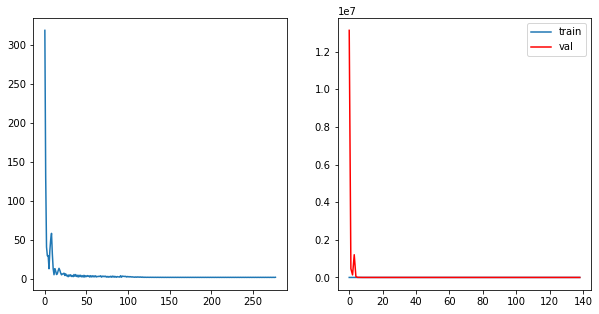

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 139	 \Training Loss: 2.029581069946289	     Validation Loss:2.664066791534424	 \ LR:1.0000000000000004e-08


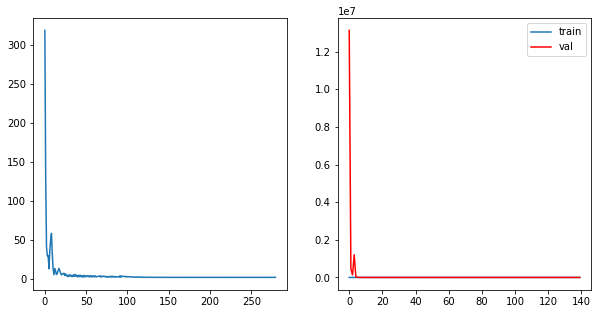

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 140	 \Training Loss: 2.029580295085907	     Validation Loss:2.664066791534424	 \ LR:1.0000000000000004e-08


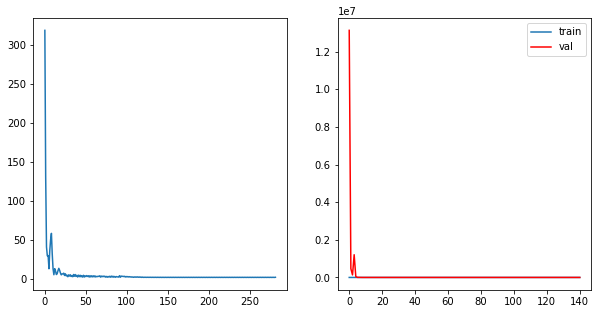

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 141	 \Training Loss: 2.0295798778533936	     Validation Loss:2.664067268371582	 \ LR:1.0000000000000004e-08


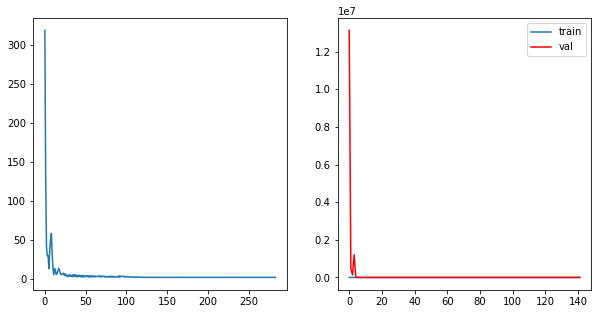

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 142	 \Training Loss: 2.0295790433883667	     Validation Loss:2.664066791534424	 \ LR:1.0000000000000004e-08


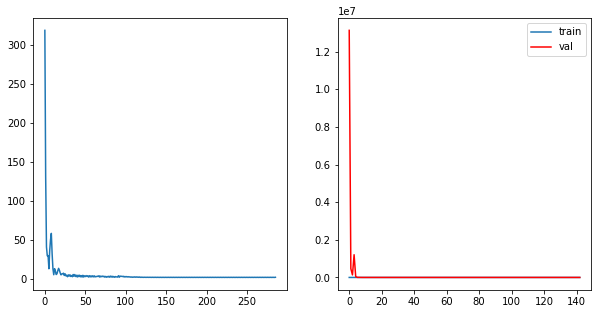

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 143	 \Training Loss: 2.029578685760498	     Validation Loss:2.664067029953003	 \ LR:1.0000000000000004e-08


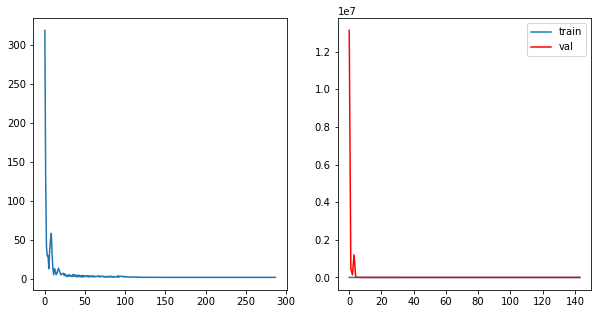

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 144	 \Training Loss: 2.0295780301094055	     Validation Loss:2.664067268371582	 \ LR:1.0000000000000004e-08


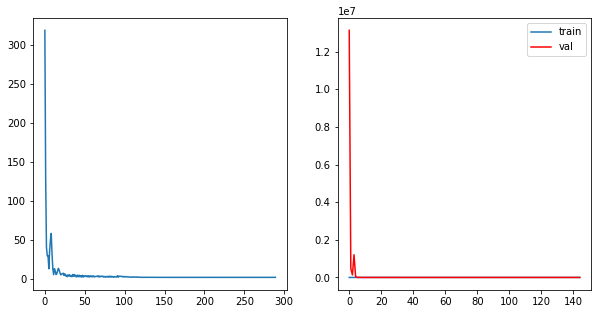

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 145	 \Training Loss: 2.0295780301094055	     Validation Loss:2.664067268371582	 \ LR:1.0000000000000004e-08


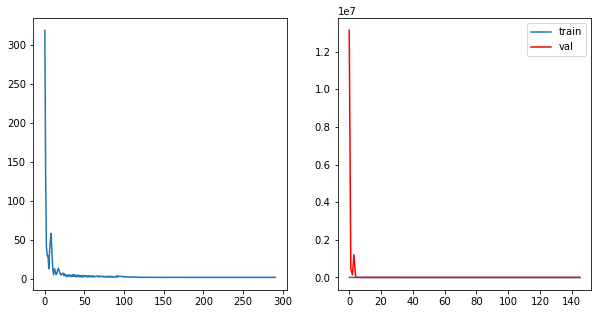

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 146	 \Training Loss: 2.0295775532722473	     Validation Loss:2.664067029953003	 \ LR:1.0000000000000004e-08


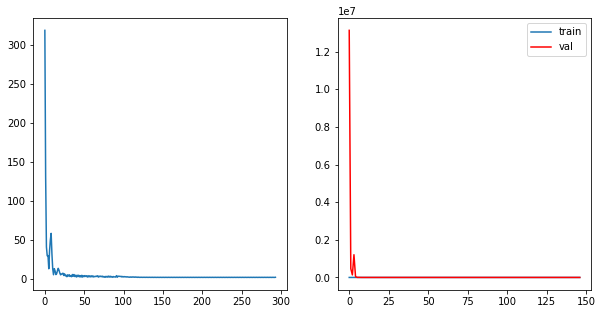

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 147	 \Training Loss: 2.0295767188072205	     Validation Loss:2.664067268371582	 \ LR:1.0000000000000004e-08


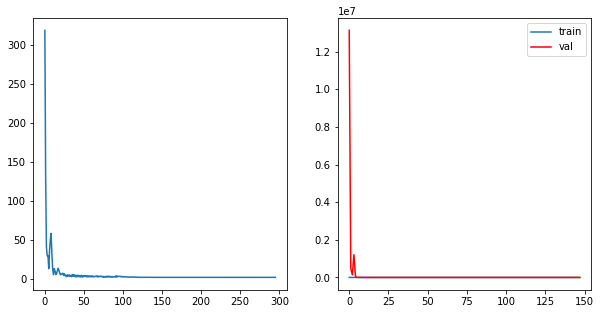

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 148	 \Training Loss: 2.0295764803886414	     Validation Loss:2.6640677452087402	 \ LR:1.0000000000000004e-08


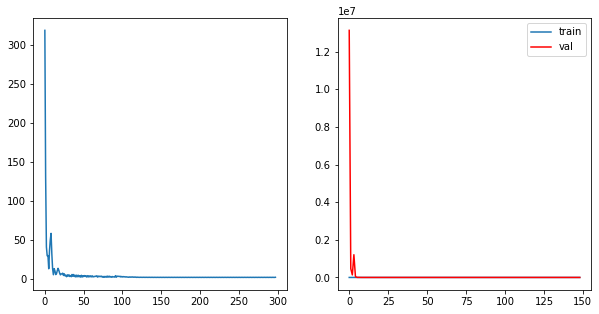

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 149	 \Training Loss: 2.0295757055282593	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


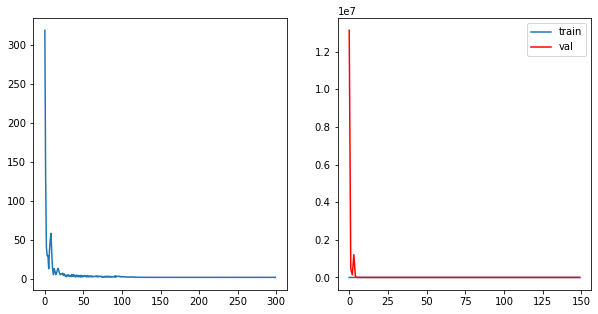

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 150	 \Training Loss: 2.0295751094818115	     Validation Loss:2.6640677452087402	 \ LR:1.0000000000000004e-08


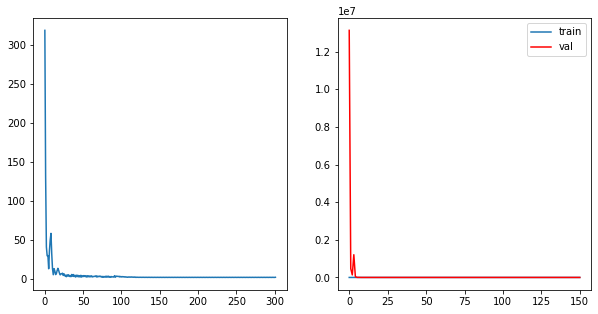

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 151	 \Training Loss: 2.0295746326446533	     Validation Loss:2.6640677452087402	 \ LR:1.0000000000000004e-08


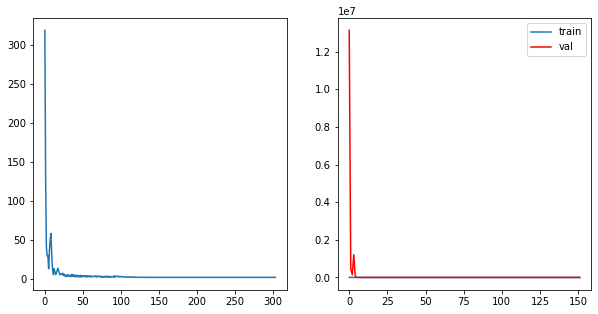

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 152	 \Training Loss: 2.029573976993561	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


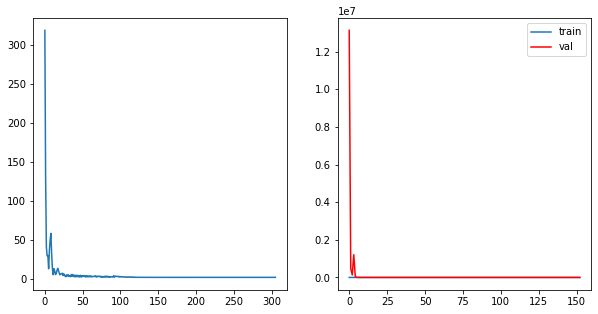

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 153	 \Training Loss: 2.029573440551758	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


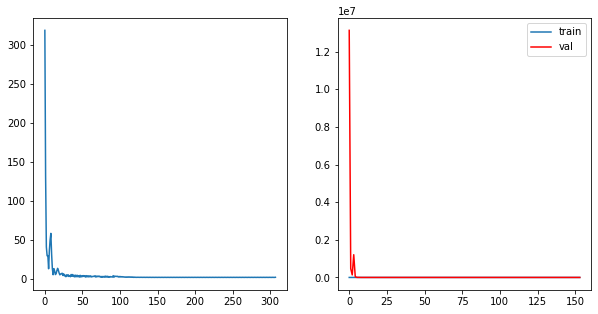

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 154	 \Training Loss: 2.0295727849006653	     Validation Loss:2.6640686988830566	 \ LR:1.0000000000000004e-08


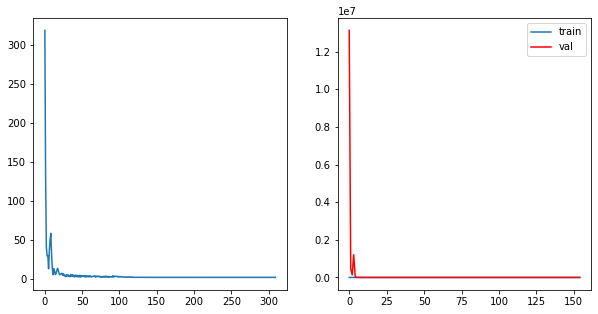

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 155	 \Training Loss: 2.0295726656913757	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


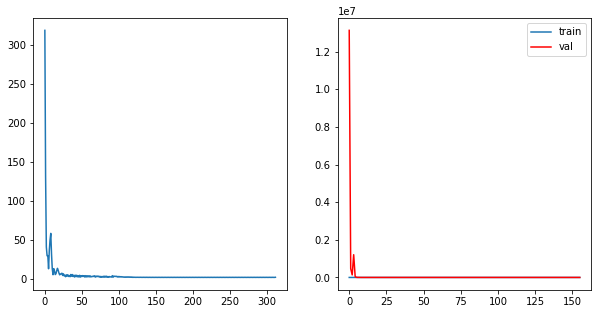

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 156	 \Training Loss: 2.0295718908309937	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


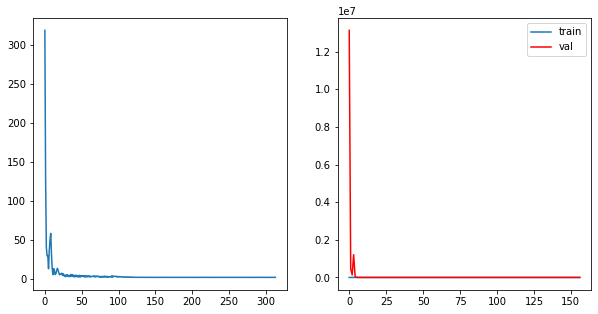

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 157	 \Training Loss: 2.0295716524124146	     Validation Loss:2.6640677452087402	 \ LR:1.0000000000000004e-08


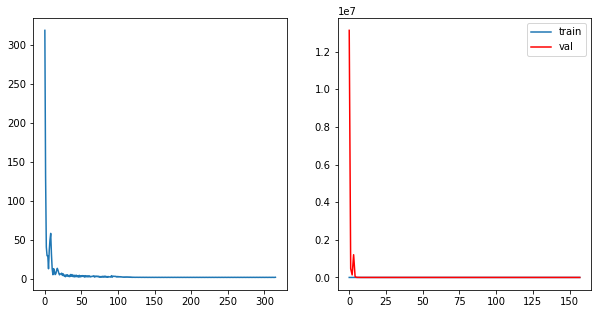

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 158	 \Training Loss: 2.0295711755752563	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


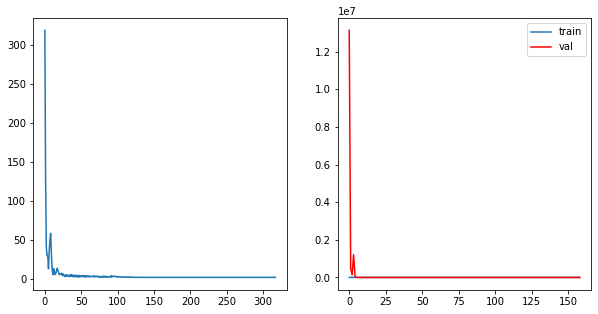

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 159	 \Training Loss: 2.0295705795288086	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


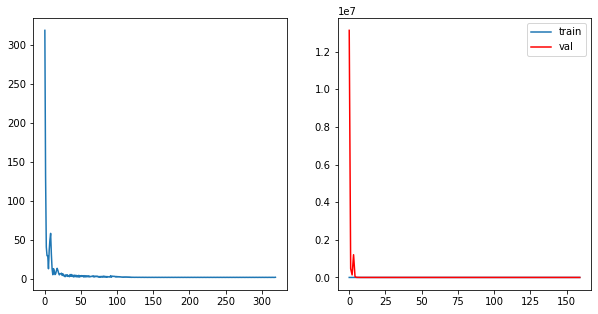

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 160	 \Training Loss: 2.0295698642730713	     Validation Loss:2.6640686988830566	 \ LR:1.0000000000000004e-08


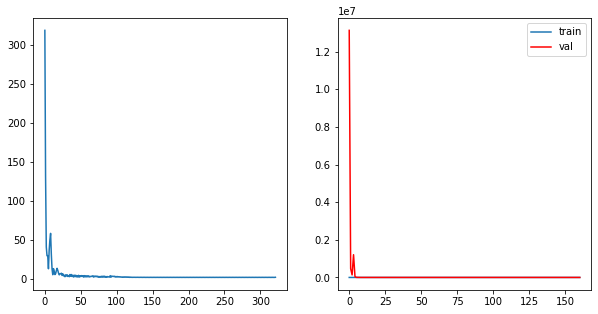

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 161	 \Training Loss: 2.0295698046684265	     Validation Loss:2.6640686988830566	 \ LR:1.0000000000000004e-08


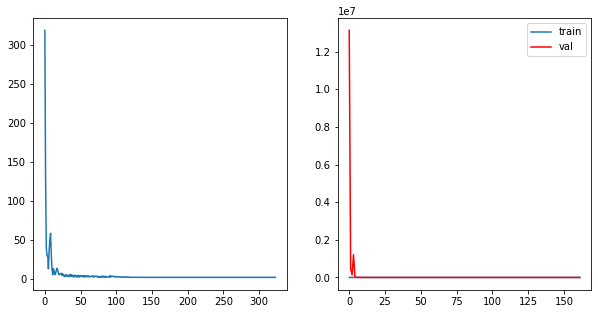

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 162	 \Training Loss: 2.0295689702033997	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


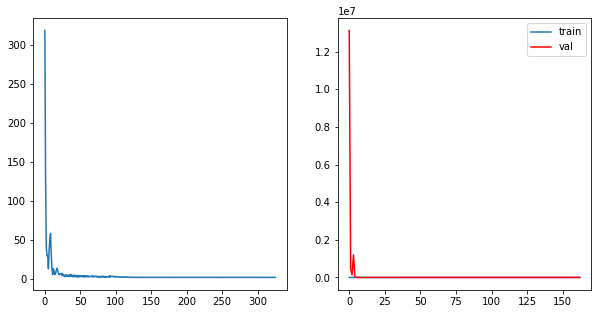

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 163	 \Training Loss: 2.0295682549476624	     Validation Loss:2.664067029953003	 \ LR:1.0000000000000004e-08


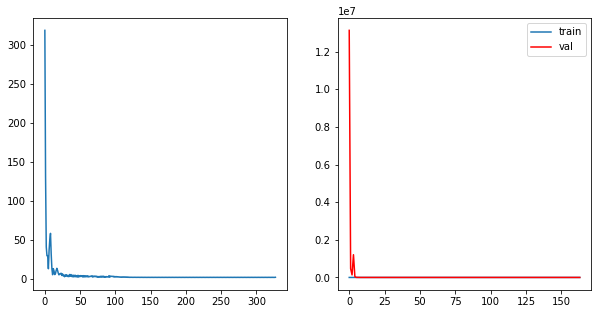

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 164	 \Training Loss: 2.029568135738373	     Validation Loss:2.664067268371582	 \ LR:1.0000000000000004e-08


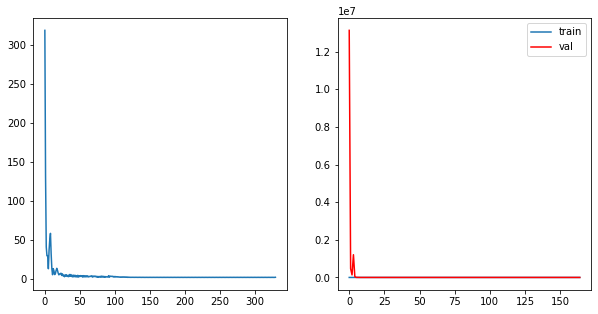

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 165	 \Training Loss: 2.029567539691925	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


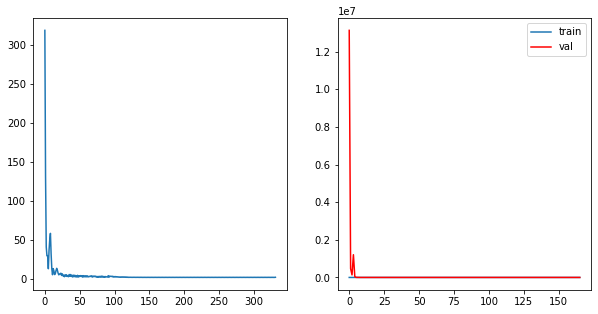

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 166	 \Training Loss: 2.0295671224594116	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


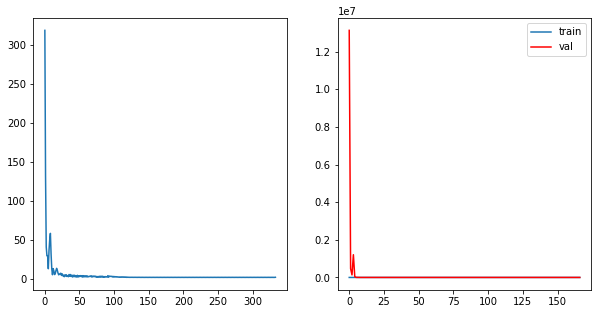

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 167	 \Training Loss: 2.0295662879943848	     Validation Loss:2.6640677452087402	 \ LR:1.0000000000000004e-08


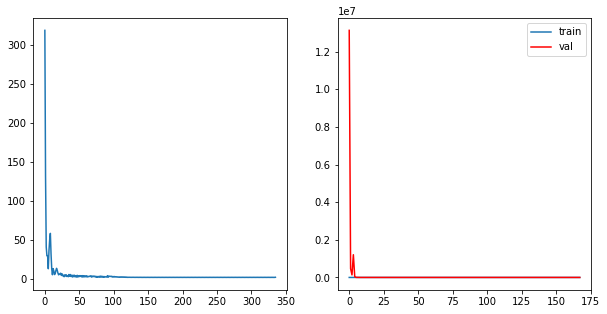

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 168	 \Training Loss: 2.029565691947937	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


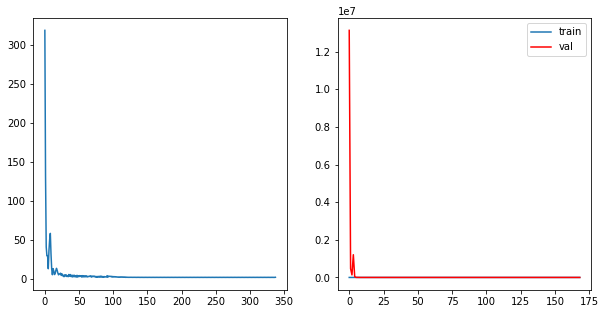

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 169	 \Training Loss: 2.0295650362968445	     Validation Loss:2.6640679836273193	 \ LR:1.0000000000000004e-08


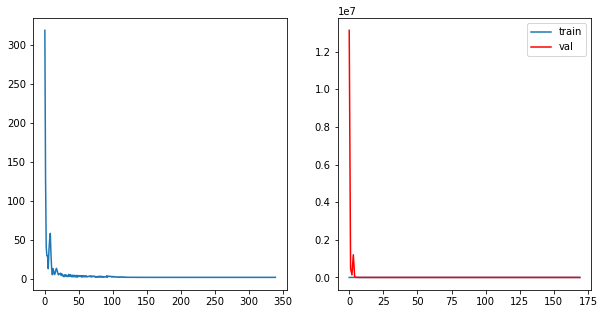

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 170	 \Training Loss: 2.0295645594596863	     Validation Loss:2.664069175720215	 \ LR:1.0000000000000004e-08


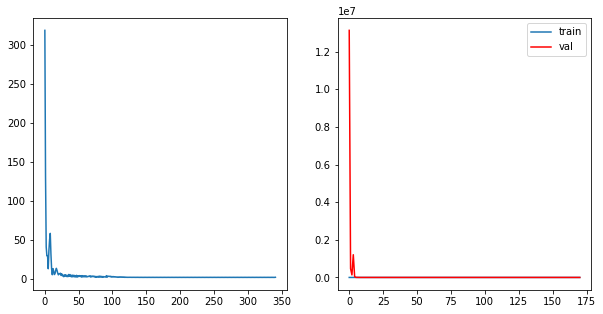

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 171	 \Training Loss: 2.0295639038085938	     Validation Loss:2.6640686988830566	 \ LR:1.0000000000000004e-08


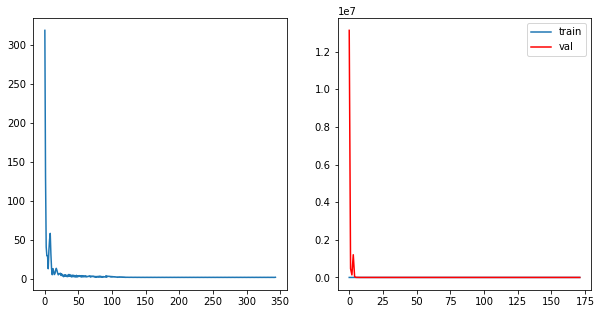

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 172	 \Training Loss: 2.029563248157501	     Validation Loss:2.6640689373016357	 \ LR:1.0000000000000004e-08


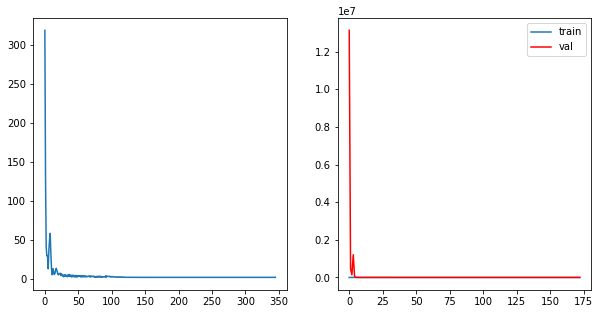

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 173	 \Training Loss: 2.0295627117156982	     Validation Loss:2.6640686988830566	 \ LR:1.0000000000000004e-08


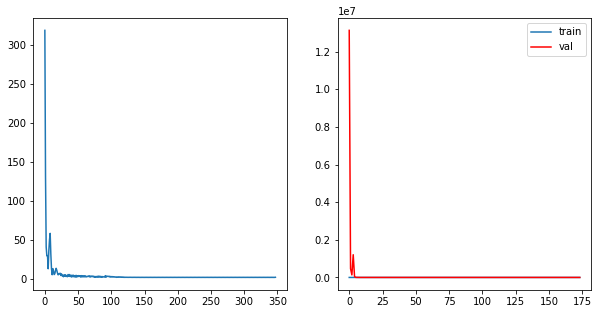

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 174	 \Training Loss: 2.029561996459961	     Validation Loss:2.6640686988830566	 \ LR:1.0000000000000004e-08


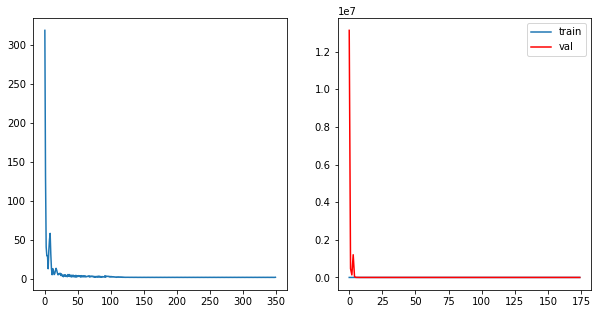

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 175	 \Training Loss: 2.029561758041382	     Validation Loss:2.6640682220458984	 \ LR:1.0000000000000004e-08


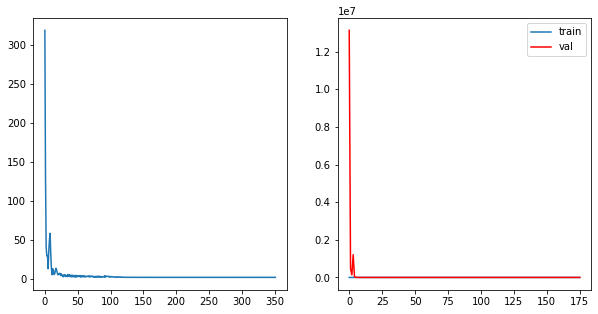

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 176	 \Training Loss: 2.029561400413513	     Validation Loss:2.6640689373016357	 \ LR:1.0000000000000004e-08


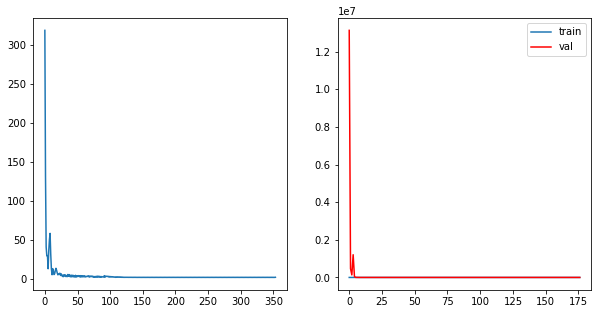

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 177	 \Training Loss: 2.02956086397171	     Validation Loss:2.664069175720215	 \ LR:1.0000000000000004e-08


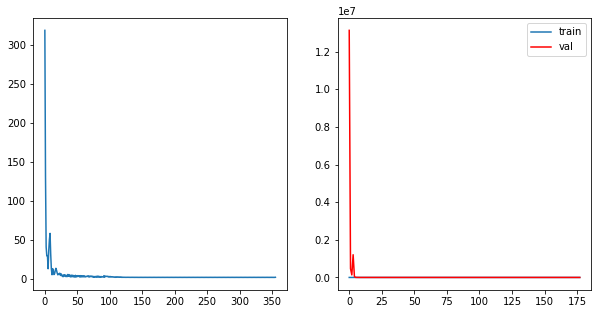

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 178	 \Training Loss: 2.029560387134552	     Validation Loss:2.6640689373016357	 \ LR:1.0000000000000004e-08


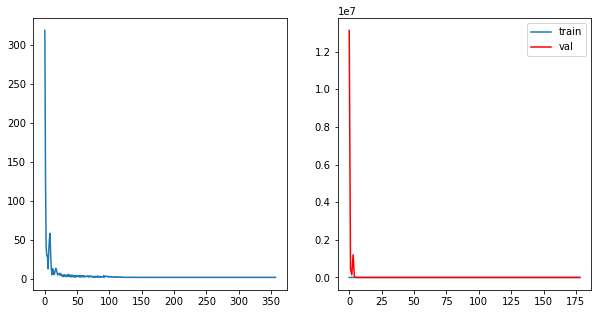

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 179	 \Training Loss: 2.0295594334602356	     Validation Loss:2.6640689373016357	 \ LR:1.0000000000000004e-08


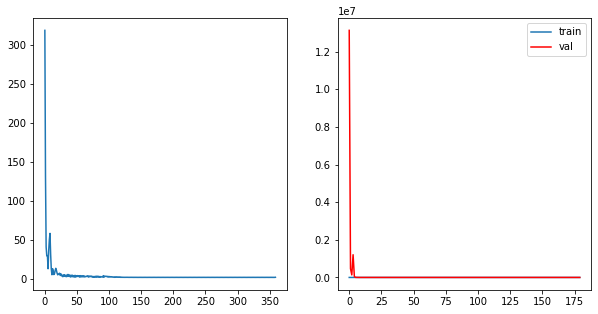

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 180	 \Training Loss: 2.029559075832367	     Validation Loss:2.664069175720215	 \ LR:1.0000000000000004e-08


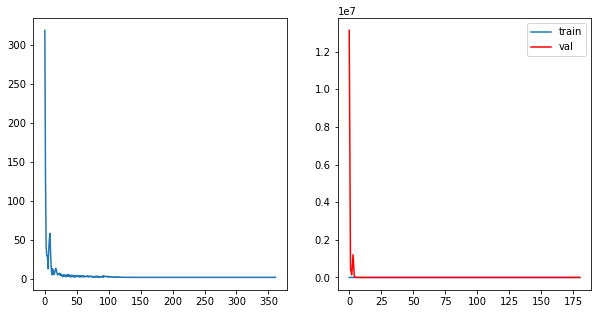

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 181	 \Training Loss: 2.0295581817626953	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


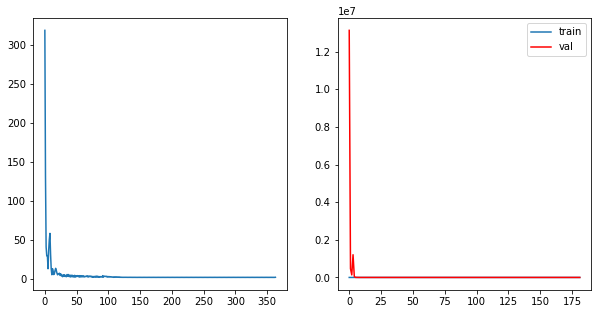

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 182	 \Training Loss: 2.029557704925537	     Validation Loss:2.6640708446502686	 \ LR:1.0000000000000004e-08


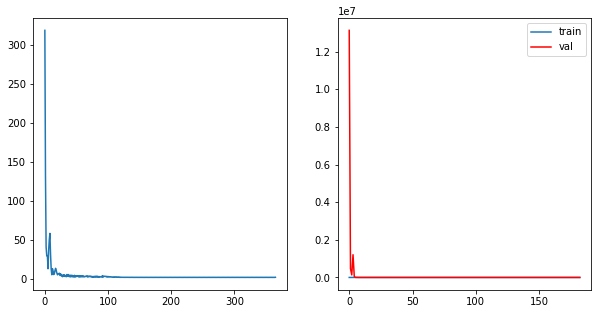

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 183	 \Training Loss: 2.029557466506958	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


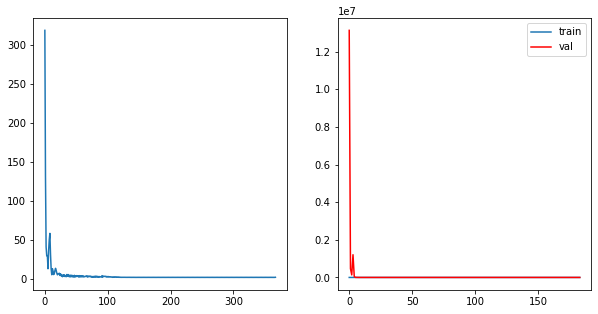

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 184	 \Training Loss: 2.0295568108558655	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


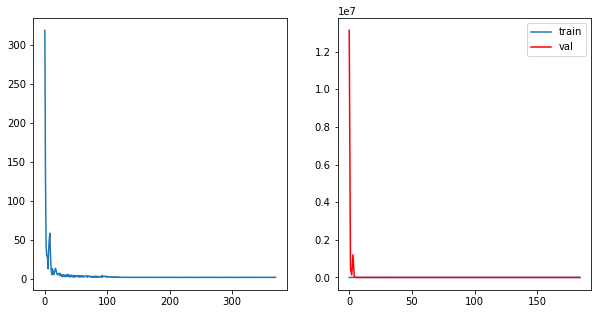

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 185	 \Training Loss: 2.029556095600128	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


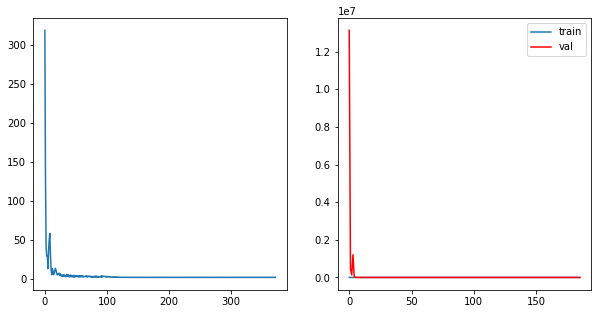

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 186	 \Training Loss: 2.0295557379722595	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


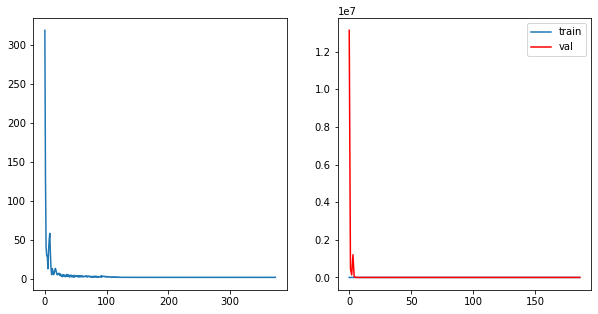

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 187	 \Training Loss: 2.029555022716522	     Validation Loss:2.6640701293945312	 \ LR:1.0000000000000004e-08


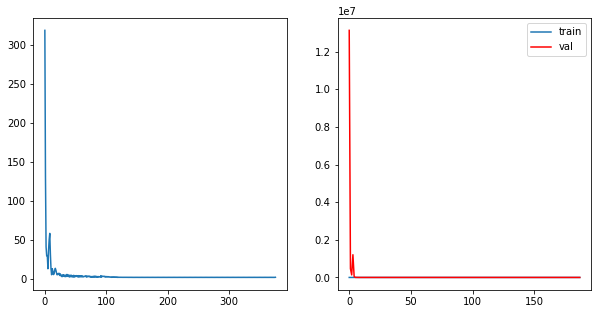

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 188	 \Training Loss: 2.0295546650886536	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


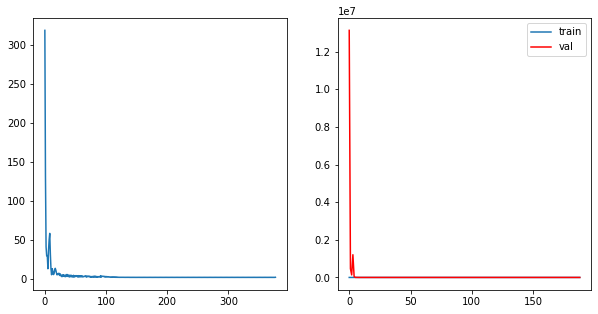

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 189	 \Training Loss: 2.0295535922050476	     Validation Loss:2.664069414138794	 \ LR:1.0000000000000004e-08


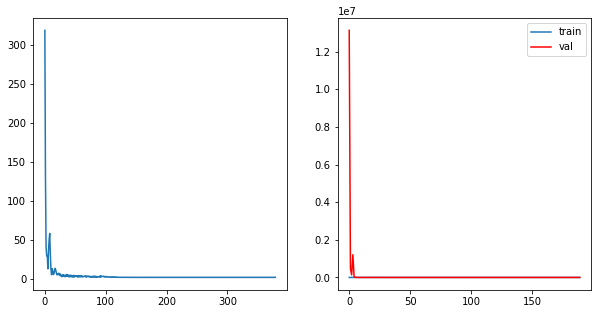

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9231, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 190	 \Training Loss: 2.029553532600403	     Validation Loss:2.664069175720215	 \ LR:1.0000000000000004e-08


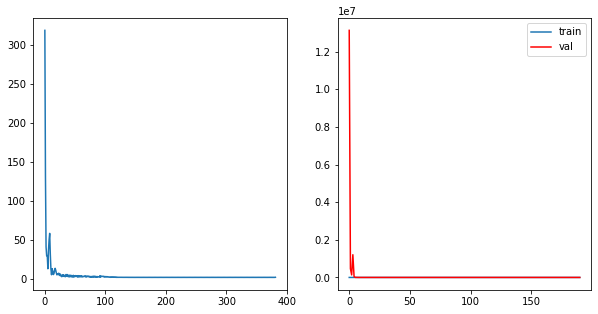

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 191	 \Training Loss: 2.029552936553955	     Validation Loss:2.664069175720215	 \ LR:1.0000000000000004e-08


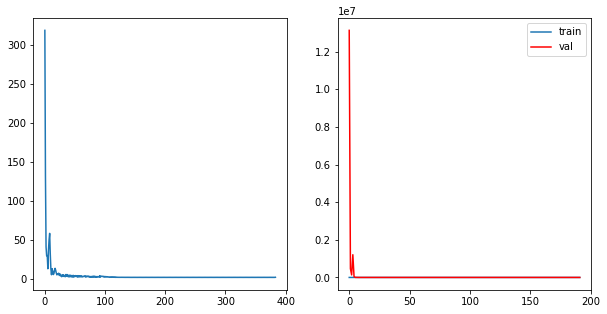

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 192	 \Training Loss: 2.029552459716797	     Validation Loss:2.6640701293945312	 \ LR:1.0000000000000004e-08


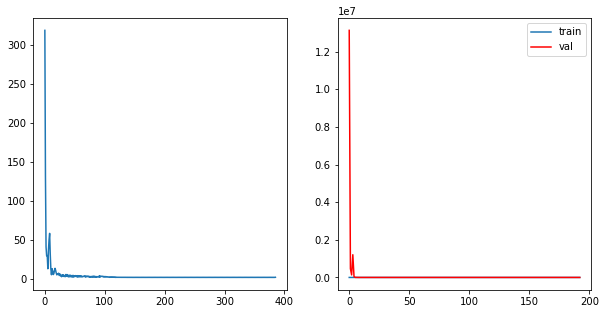

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 193	 \Training Loss: 2.0295515060424805	     Validation Loss:2.6640703678131104	 \ LR:1.0000000000000004e-08


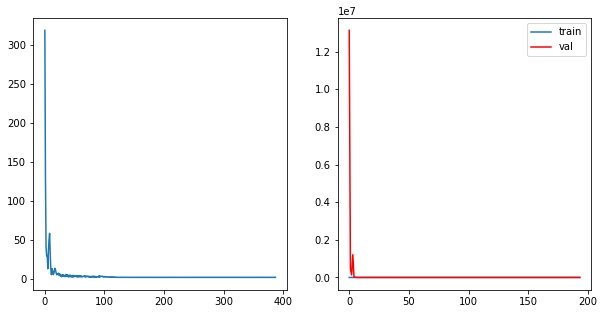

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 194	 \Training Loss: 2.029551327228546	     Validation Loss:2.6640703678131104	 \ LR:1.0000000000000004e-08


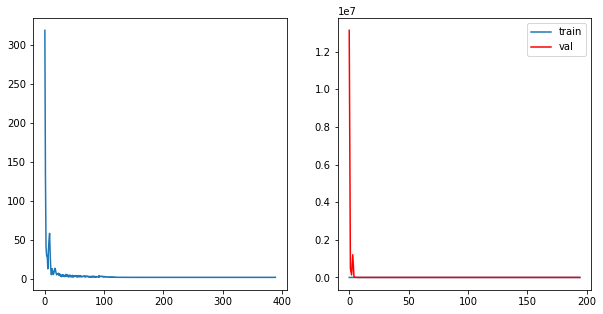

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 195	 \Training Loss: 2.0295506715774536	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


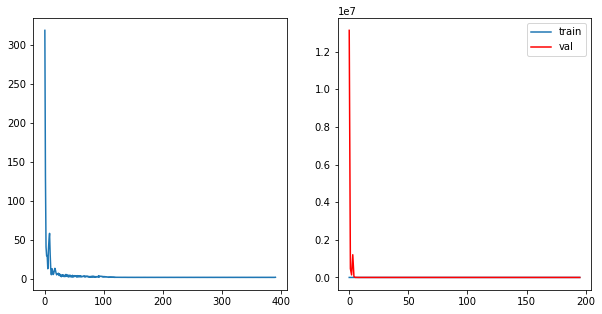

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 196	 \Training Loss: 2.029549539089203	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


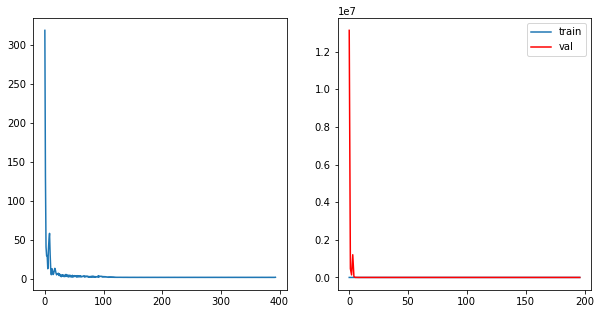

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 197	 \Training Loss: 2.029549300670624	     Validation Loss:2.664069890975952	 \ LR:1.0000000000000004e-08


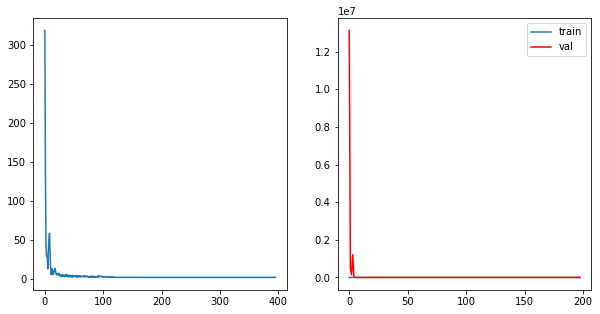

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 198	 \Training Loss: 2.0295486450195312	     Validation Loss:2.6640703678131104	 \ LR:1.0000000000000004e-08


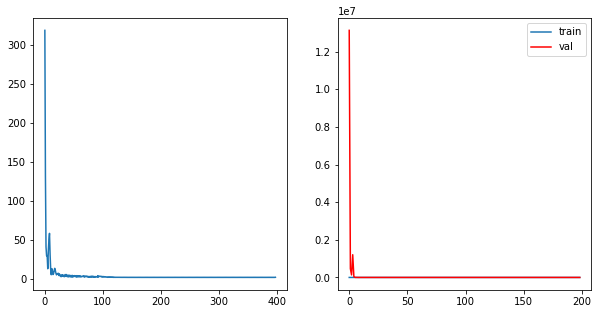

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1.9230, grad_fn=<L1LossBackward0>)
tensor(2.1361, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 199	 \Training Loss: 2.029548168182373	     Validation Loss:2.6640703678131104	 \ LR:1.0000000000000004e-08


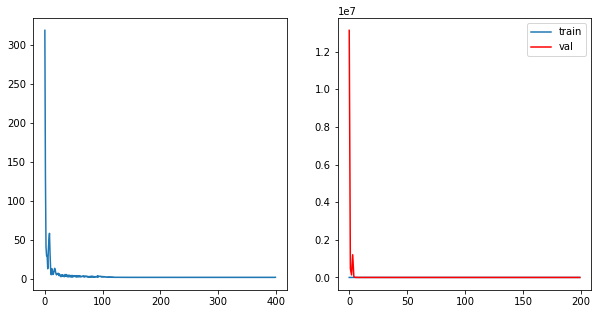

In [45]:
from tqdm.notebook import tqdm
step_losses = []
epoch_losses_train = []
epoch_losses_val = []

for epoch in tqdm(range(epochs)):
    epoch_loss = 0
    epoch_loss_test = 0
    model.train()
    for X, Y in tqdm(data_loader, total=len(data_loader)):
        X, Y = X.to(device), Y.to(device)
        optimizer.zero_grad()
        Y_pred = model(X)
        loss = criterion(Y_pred, Y.float().view(-1, 1))
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        step_losses.append(loss.item())
        print(loss)
    if epoch % 5 == 0:
        state = {'info':  "house floors resnet_18 + imagenet "+str(optimizer.param_groups[0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    model.state_dict(),        # параметры модели
         'optimizer': optimizer.state_dict()}    # состояние оптимизатора
        torch.save(state, '/house_floors_resnet_18_' + str(epoch)+ '.pth')
    with torch.no_grad():
        model.eval()
        for X, Y in tqdm(data_loader_val, total=len(data_loader_val), leave=False):
            X, Y = X.to(device), Y.to(device)
            Y_pred = model(X)
            loss_test = criterion(Y_pred, Y)
            epoch_loss_test += loss_test.item()
    if epoch != 0 and epoch_loss_test/len(data_loader_val)<epoch_losses_val[-1]:
        best_model = model
        best_epoch = epoch
        best_optimizer = optimizer.state_dict()
    epoch_losses_val.append(epoch_loss_test/len(data_loader_val))
    epoch_losses_train.append(epoch_loss/len(data_loader))
    scheduler.step(epoch_loss_test/len(data_loader_val))
    curr_lr = optimizer.param_groups[0]['lr']
    
  
    print(f'Epoch {epoch}\t \Training Loss: {epoch_loss/len(data_loader)}\t \
    Validation Loss:{epoch_loss_test/len(data_loader_val)}\t \ LR:{curr_lr}')
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].plot(step_losses)
    axes[1].plot(epoch_losses_train, label = 'train')
    axes[1].plot(epoch_losses_val, color = 'red', label = 'val')
    axes[1].legend()
    plt.show()


Эксперимент №2: Лосс функция MSE с добавлением аугументаций

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(195.7467, grad_fn=<MseLossBackward0>)
tensor(5711.9653, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 2953.85604095459	     Validation Loss:74010345472.0	 \ LR:0.01


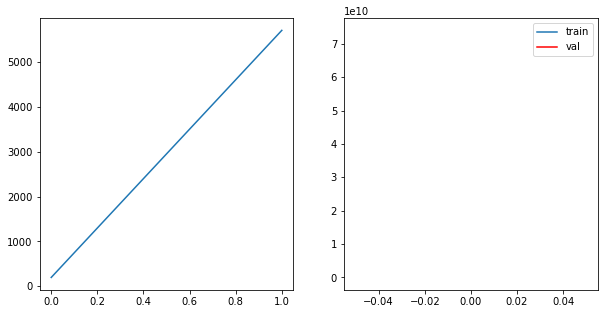

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(90863.6094, grad_fn=<MseLossBackward0>)
tensor(6649.2583, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 48756.433837890625	     Validation Loss:2585138399543296.0	 \ LR:0.01


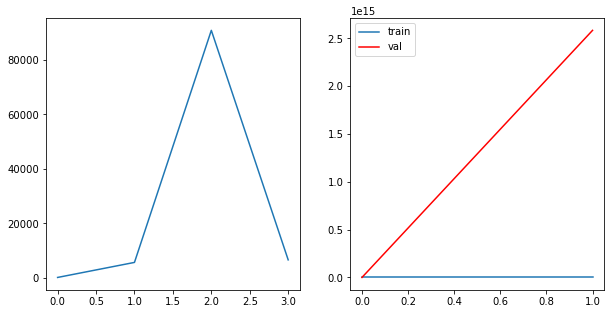

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(46.0159, grad_fn=<MseLossBackward0>)
tensor(473.0587, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 259.5372943878174	     Validation Loss:6486358394667008.0	 \ LR:0.01


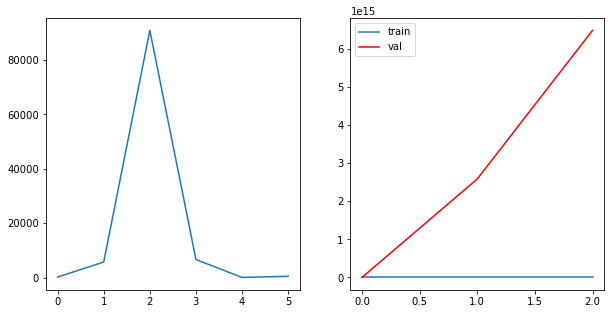

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(70.5050, grad_fn=<MseLossBackward0>)
tensor(59.2007, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 64.85285758972168	     Validation Loss:1093169974345728.0	 \ LR:0.01


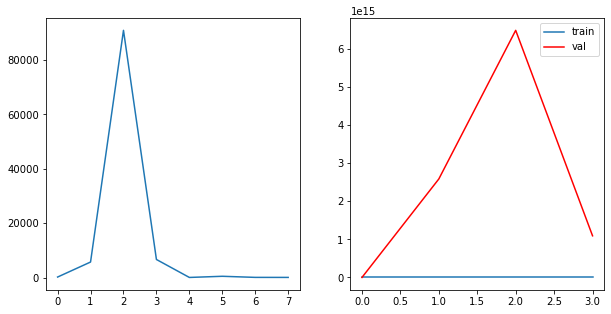

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(921.2539, grad_fn=<MseLossBackward0>)
tensor(869.6740, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 895.4639587402344	     Validation Loss:8383019614208.0	 \ LR:0.01


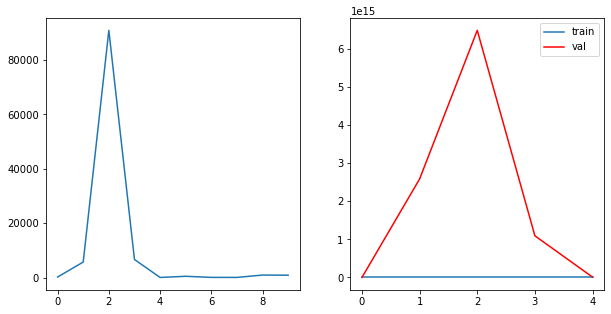

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(454.0313, grad_fn=<MseLossBackward0>)
tensor(122.7177, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 288.3745002746582	     Validation Loss:7164240330752.0	 \ LR:0.01


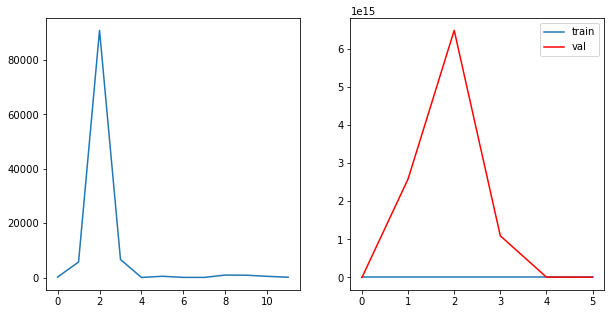

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(1133.1562, grad_fn=<MseLossBackward0>)
tensor(1776.0934, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 1454.6248168945312	     Validation Loss:428496125952.0	 \ LR:0.01


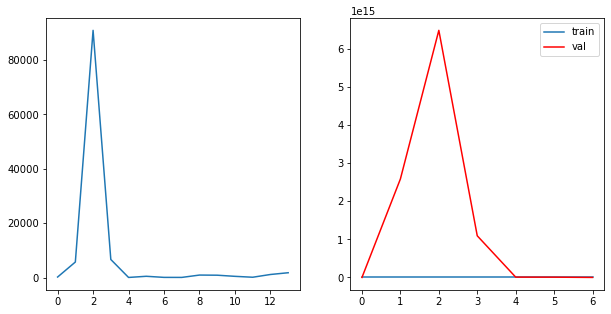

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(496.4598, grad_fn=<MseLossBackward0>)
tensor(17.5560, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 257.0079011917114	     Validation Loss:11662878720.0	 \ LR:0.01


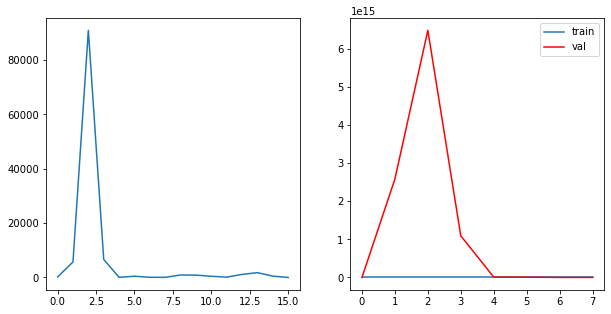

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(885.6047, grad_fn=<MseLossBackward0>)
tensor(655.2117, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 770.4082336425781	     Validation Loss:17836200.0	 \ LR:0.01


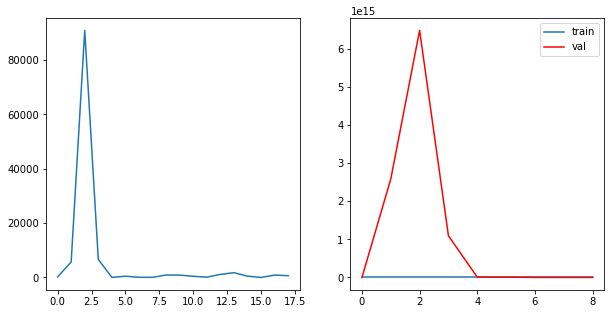

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(74.5037, grad_fn=<MseLossBackward0>)
tensor(517.2390, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 295.87131118774414	     Validation Loss:1501584000.0	 \ LR:0.01


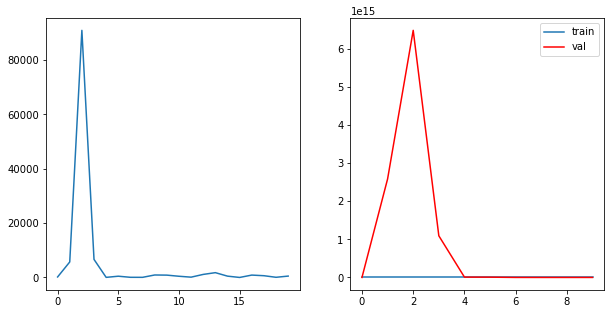

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(858.7988, grad_fn=<MseLossBackward0>)
tensor(166.5686, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 512.6837005615234	     Validation Loss:3528735.25	 \ LR:0.01


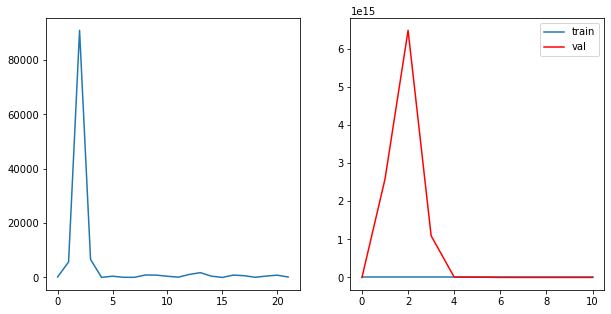

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(237.8547, grad_fn=<MseLossBackward0>)
tensor(399.5262, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 318.69043731689453	     Validation Loss:470910.4375	 \ LR:0.01


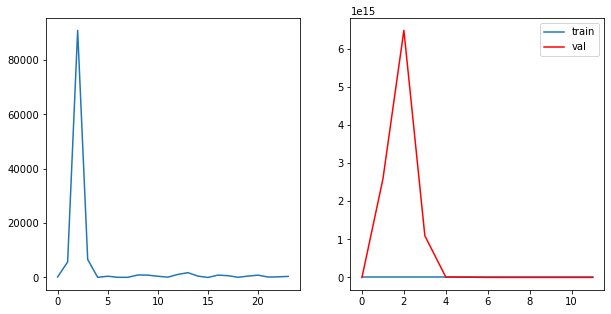

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(237.7143, grad_fn=<MseLossBackward0>)
tensor(88.9548, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 163.33451461791992	     Validation Loss:6868388.0	 \ LR:0.01


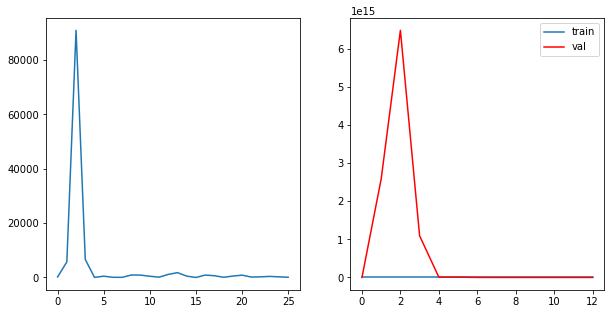

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(446.9098, grad_fn=<MseLossBackward0>)
tensor(153.3566, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 300.1332321166992	     Validation Loss:1572.39453125	 \ LR:0.01


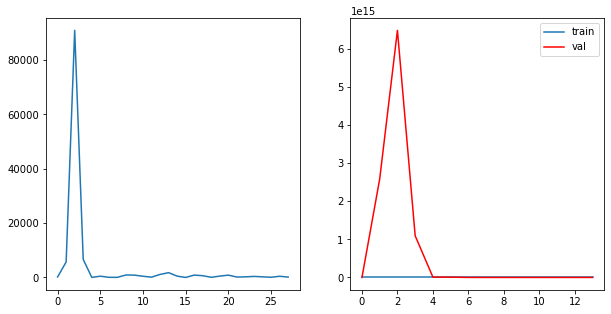

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(118.8087, grad_fn=<MseLossBackward0>)
tensor(208.9211, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 163.86489486694336	     Validation Loss:645.6236572265625	 \ LR:0.01


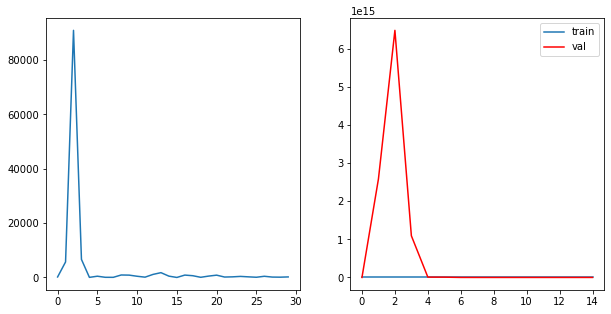

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(101.9643, grad_fn=<MseLossBackward0>)
tensor(89.3699, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 95.6671028137207	     Validation Loss:77516.765625	 \ LR:0.01


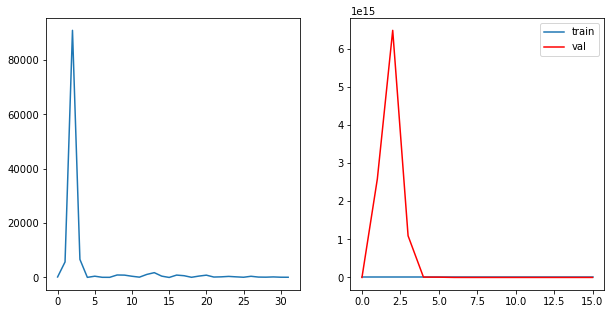

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(267.4430, grad_fn=<MseLossBackward0>)
tensor(19.7223, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 143.58262729644775	     Validation Loss:2309.02587890625	 \ LR:0.01


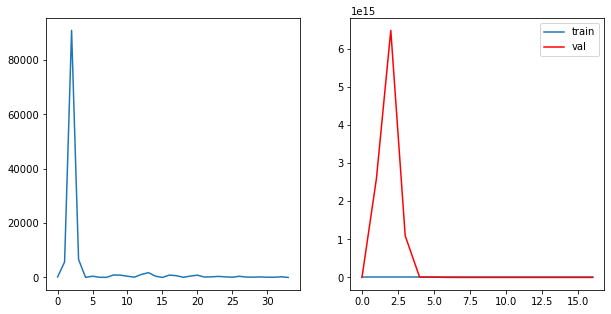

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(189.0811, grad_fn=<MseLossBackward0>)
tensor(83.7743, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 136.42770385742188	     Validation Loss:121.69718170166016	 \ LR:0.01


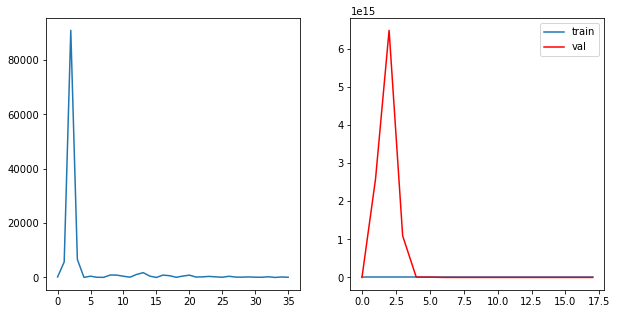

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(28.6265, grad_fn=<MseLossBackward0>)
tensor(172.0146, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 100.32058906555176	     Validation Loss:511.5337829589844	 \ LR:0.01


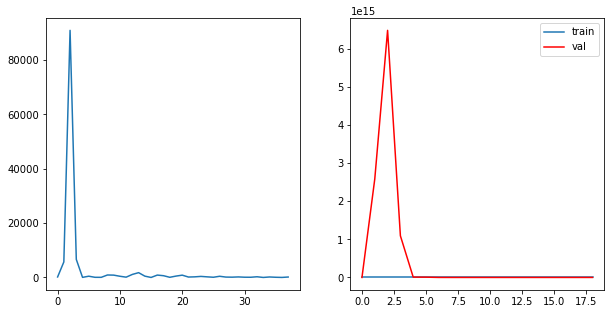

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(47.4843, grad_fn=<MseLossBackward0>)
tensor(15.4117, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 31.448001861572266	     Validation Loss:193.76724243164062	 \ LR:0.01


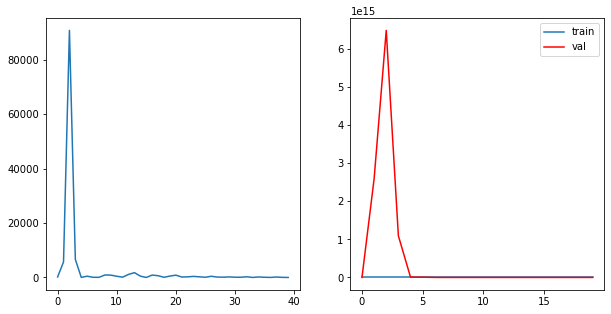

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(139.6647, grad_fn=<MseLossBackward0>)
tensor(21.0717, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 80.36824893951416	     Validation Loss:24.925378799438477	 \ LR:0.01


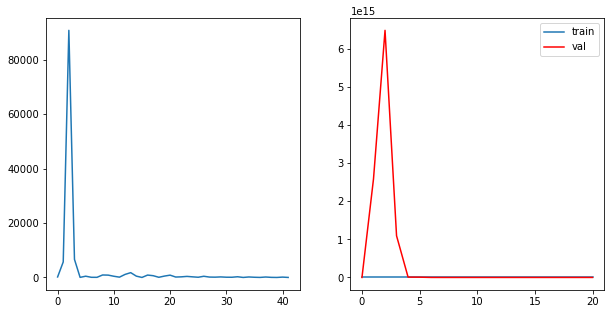

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(35.9539, grad_fn=<MseLossBackward0>)
tensor(91.7787, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 63.86631202697754	     Validation Loss:7.63674259185791	 \ LR:0.01


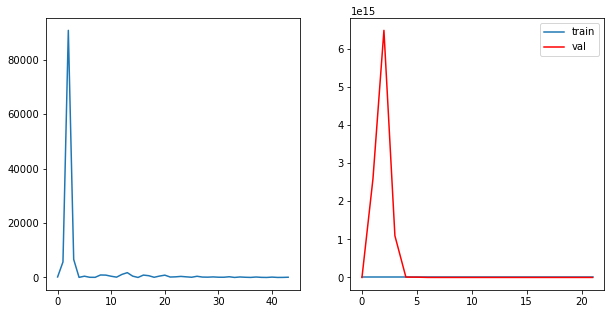

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(26.2037, grad_fn=<MseLossBackward0>)
tensor(23.7006, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 24.95212173461914	     Validation Loss:33.37566375732422	 \ LR:0.01


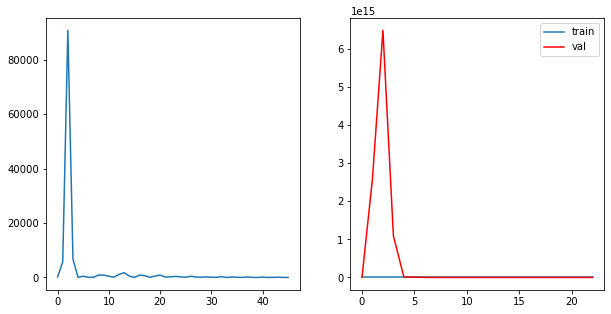

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(90.2249, grad_fn=<MseLossBackward0>)
tensor(16.9845, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 53.60472297668457	     Validation Loss:30.708904266357422	 \ LR:0.01


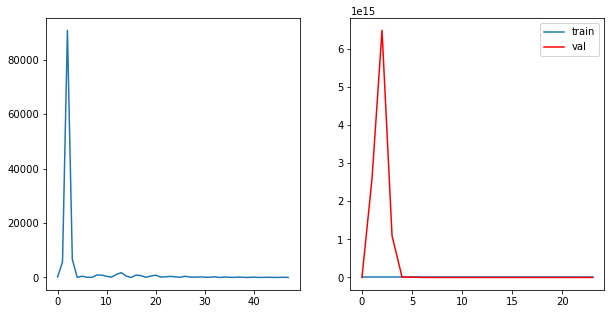

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(34.5221, grad_fn=<MseLossBackward0>)
tensor(53.0071, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 43.764591217041016	     Validation Loss:5.959611892700195	 \ LR:0.01


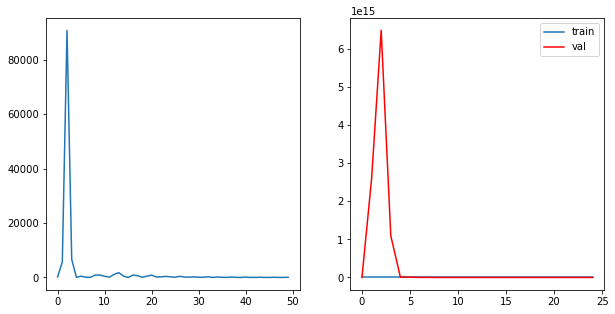

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(36.8917, grad_fn=<MseLossBackward0>)
tensor(19.6574, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 28.274556159973145	     Validation Loss:9.202651977539062	 \ LR:0.01


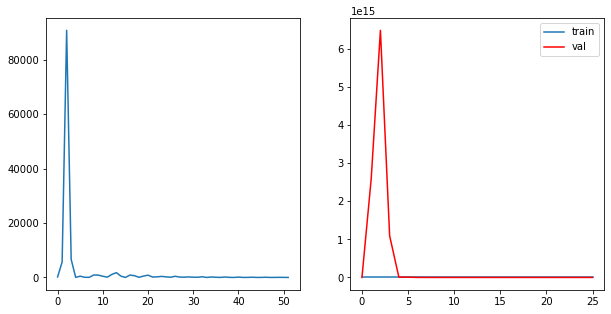

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(45.0973, grad_fn=<MseLossBackward0>)
tensor(27.9652, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 36.53123092651367	     Validation Loss:24.16714859008789	 \ LR:0.01


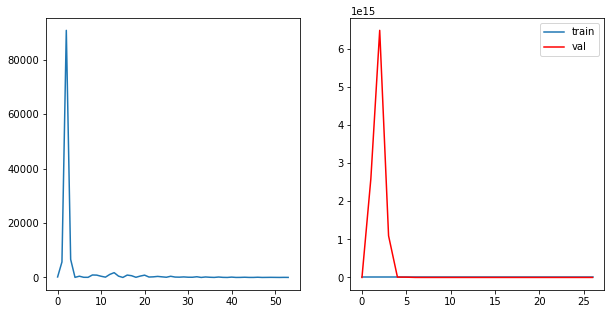

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(27.5627, grad_fn=<MseLossBackward0>)
tensor(23.1543, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 25.358508110046387	     Validation Loss:13.579391479492188	 \ LR:0.01


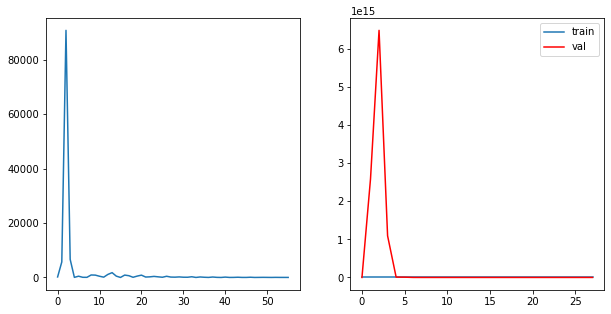

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(53.4126, grad_fn=<MseLossBackward0>)
tensor(15.3185, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 34.3655686378479	     Validation Loss:7.7584638595581055	 \ LR:0.01


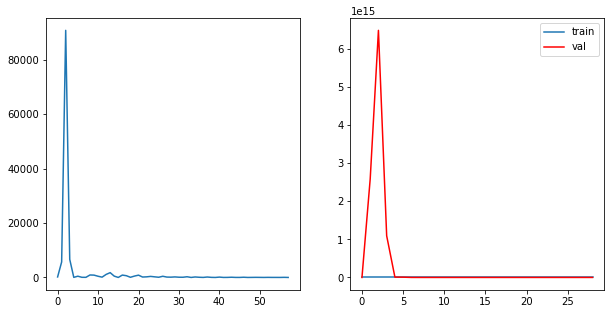

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(24.5106, grad_fn=<MseLossBackward0>)
tensor(39.0170, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 31.76381492614746	     Validation Loss:13.406606674194336	 \ LR:0.01


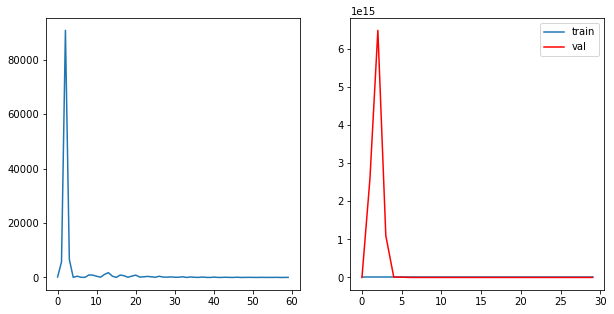

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(23.8305, grad_fn=<MseLossBackward0>)
tensor(13.8740, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 18.852269649505615	     Validation Loss:9.834769248962402	 \ LR:0.01


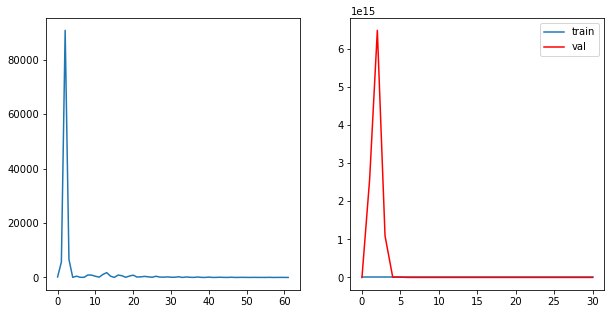

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(43.8707, grad_fn=<MseLossBackward0>)
tensor(15.7325, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 29.80156707763672	     Validation Loss:11.626105308532715	 \ LR:0.01


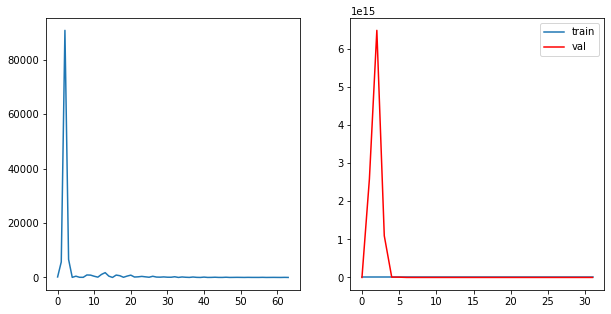

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(21.3663, grad_fn=<MseLossBackward0>)
tensor(27.4738, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 24.420065879821777	     Validation Loss:6.351455211639404	 \ LR:0.01


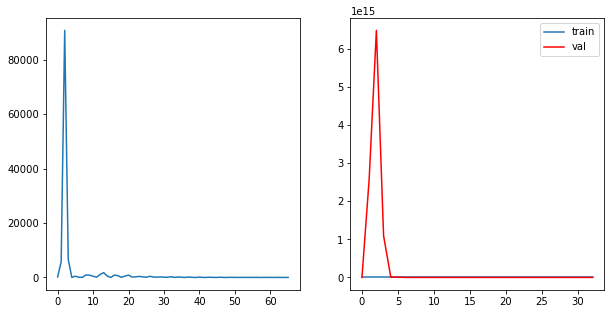

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(30.5950, grad_fn=<MseLossBackward0>)
tensor(15.5260, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 23.060477256774902	     Validation Loss:4.5318922996521	 \ LR:0.01


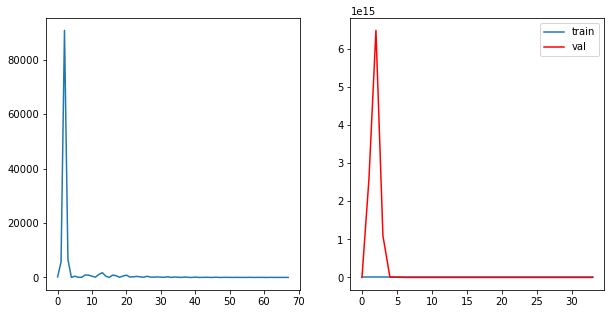

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(18.6174, grad_fn=<MseLossBackward0>)
tensor(32.8043, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 25.71086311340332	     Validation Loss:6.575074672698975	 \ LR:0.01


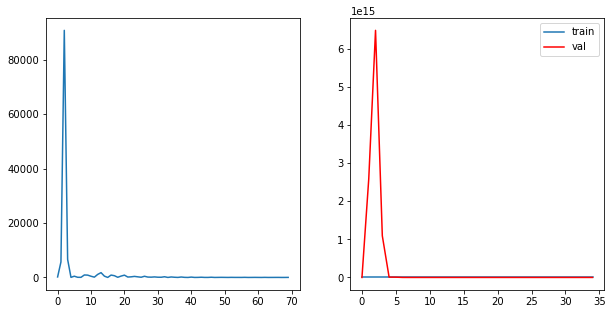

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.9459, grad_fn=<MseLossBackward0>)
tensor(15.1833, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 16.06458044052124	     Validation Loss:8.583819389343262	 \ LR:0.01


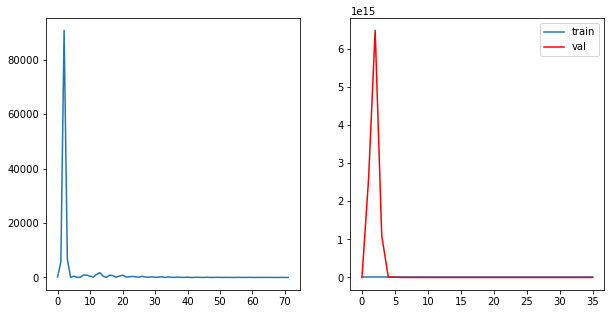

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(31.0870, grad_fn=<MseLossBackward0>)
tensor(19.0722, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 25.079599380493164	     Validation Loss:11.984184265136719	 \ LR:0.01


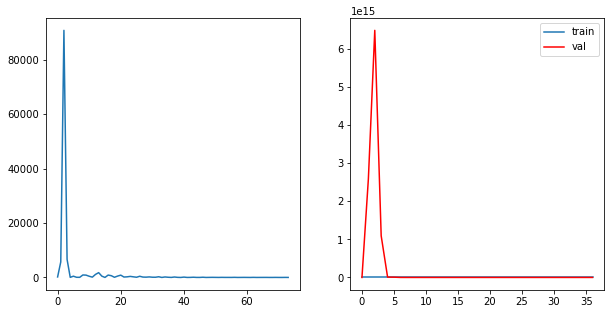

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.9097, grad_fn=<MseLossBackward0>)
tensor(21.8340, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 18.87185764312744	     Validation Loss:7.432438850402832	 \ LR:0.01


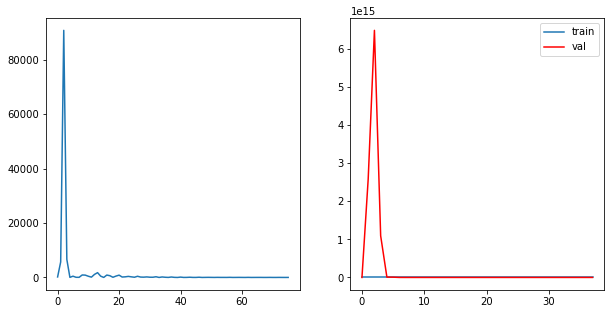

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(23.0975, grad_fn=<MseLossBackward0>)
tensor(14.9232, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 19.010352611541748	     Validation Loss:9.588896751403809	 \ LR:0.01


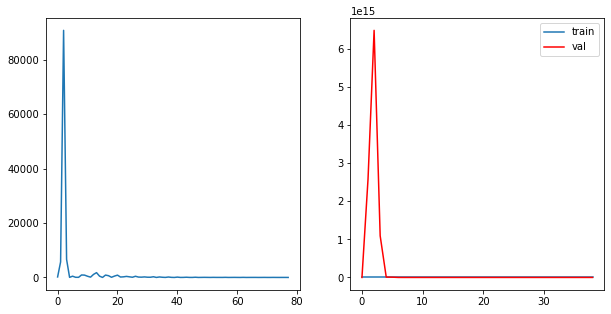

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(18.6424, grad_fn=<MseLossBackward0>)
tensor(20.7603, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 19.701351165771484	     Validation Loss:9.089227676391602	 \ LR:0.01


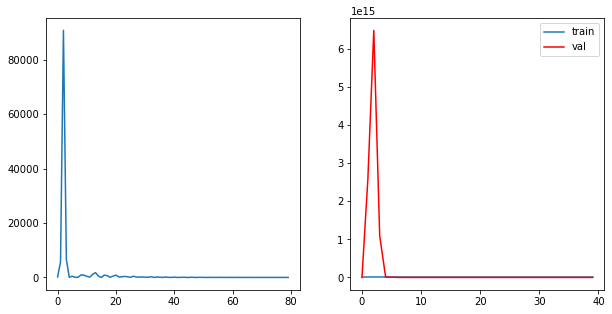

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(19.8988, grad_fn=<MseLossBackward0>)
tensor(15.2303, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 40	 \Training Loss: 17.564528942108154	     Validation Loss:7.133364677429199	 \ LR:0.01


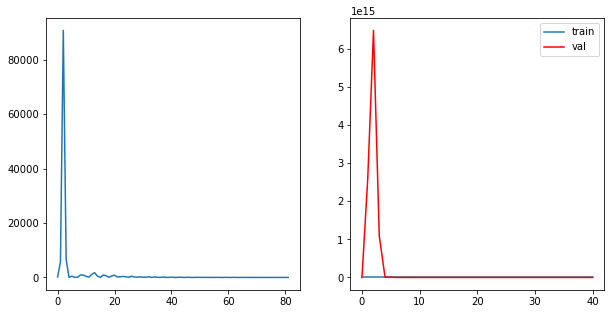

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.0742, grad_fn=<MseLossBackward0>)
tensor(15.7827, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 41	 \Training Loss: 15.92845106124878	     Validation Loss:6.295470237731934	 \ LR:0.01


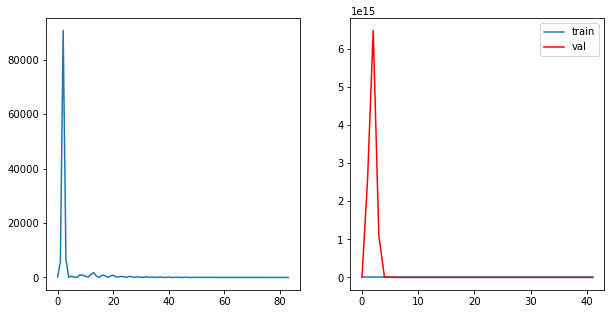

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(18.6677, grad_fn=<MseLossBackward0>)
tensor(16.5485, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 42	 \Training Loss: 17.60813331604004	     Validation Loss:9.144184112548828	 \ LR:0.01


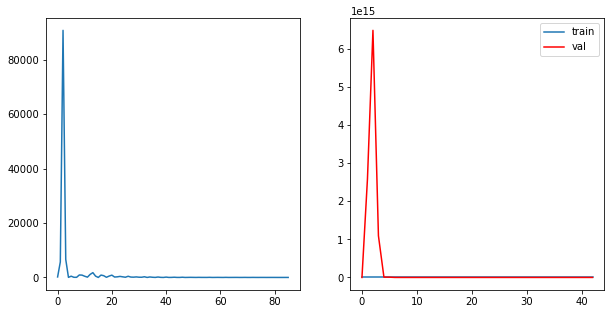

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1379, grad_fn=<MseLossBackward0>)
tensor(21.1421, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 43	 \Training Loss: 19.140003204345703	     Validation Loss:7.500176906585693	 \ LR:0.01


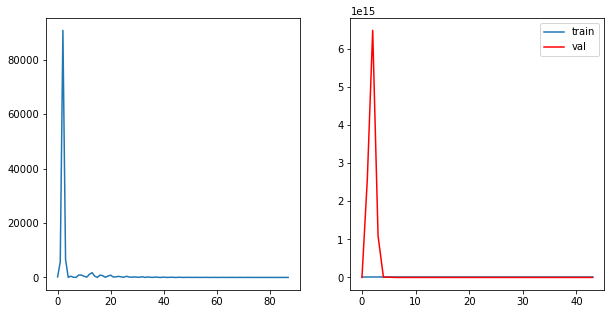

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(21.9872, grad_fn=<MseLossBackward0>)
tensor(14.8715, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 44	 \Training Loss: 18.429362773895264	     Validation Loss:7.1162309646606445	 \ LR:0.001


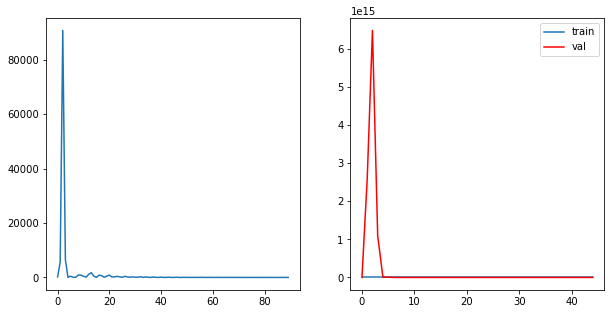

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.9727, grad_fn=<MseLossBackward0>)
tensor(13.7585, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 45	 \Training Loss: 15.865578651428223	     Validation Loss:6.640370845794678	 \ LR:0.001


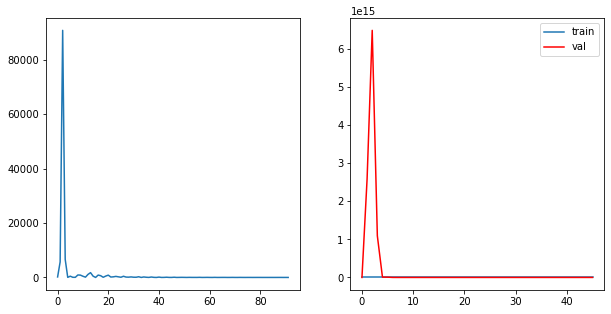

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.4751, grad_fn=<MseLossBackward0>)
tensor(14.2498, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 46	 \Training Loss: 15.36245059967041	     Validation Loss:8.813016891479492	 \ LR:0.001


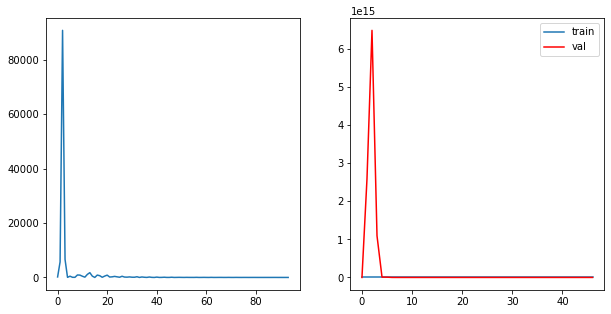

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.0623, grad_fn=<MseLossBackward0>)
tensor(15.6405, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 47	 \Training Loss: 15.851390361785889	     Validation Loss:8.810200691223145	 \ LR:0.001


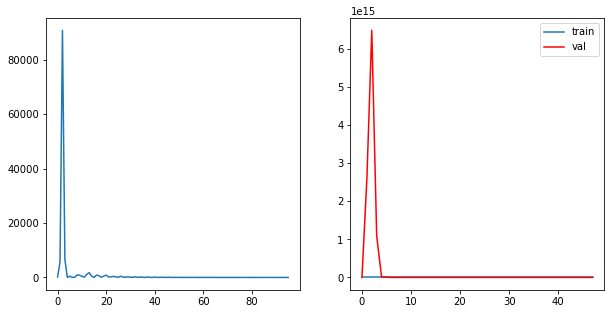

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8412, grad_fn=<MseLossBackward0>)
tensor(16.9880, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 48	 \Training Loss: 16.41460657119751	     Validation Loss:7.772011756896973	 \ LR:0.001


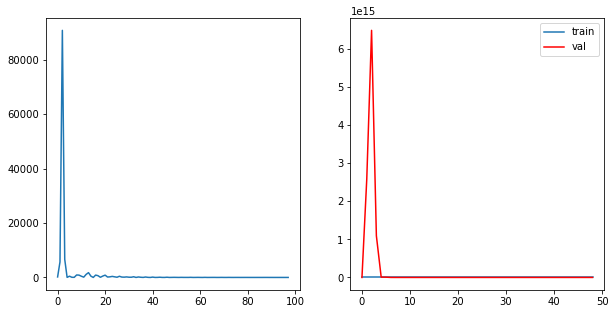

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.1170, grad_fn=<MseLossBackward0>)
tensor(14.0072, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 49	 \Training Loss: 14.562102794647217	     Validation Loss:8.020219802856445	 \ LR:0.001


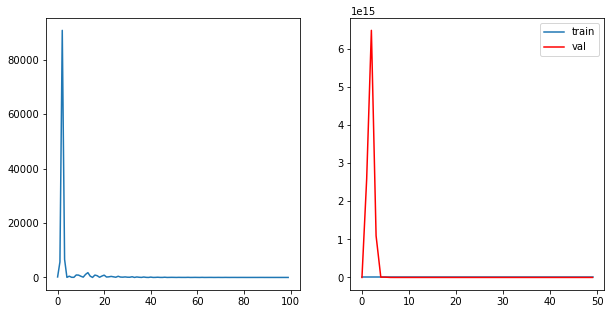

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.1226, grad_fn=<MseLossBackward0>)
tensor(13.6595, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 50	 \Training Loss: 14.891043186187744	     Validation Loss:7.614346981048584	 \ LR:0.001


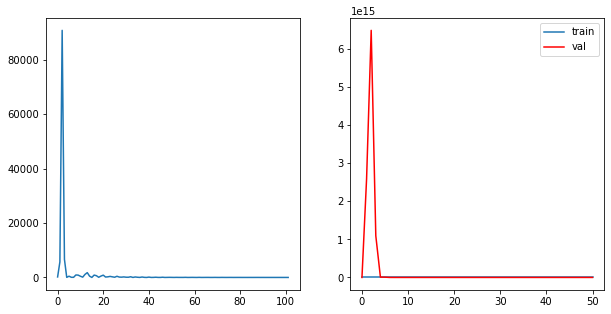

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(18.1318, grad_fn=<MseLossBackward0>)
tensor(14.6956, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 51	 \Training Loss: 16.41373109817505	     Validation Loss:7.736741065979004	 \ LR:0.001


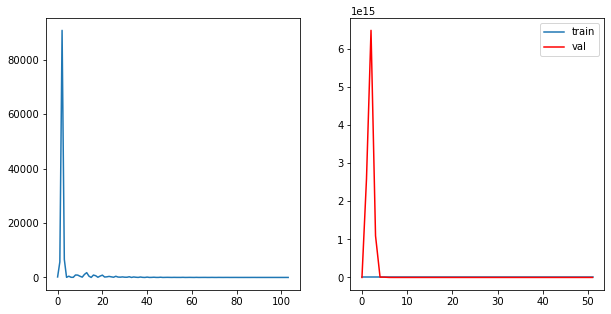

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0756, grad_fn=<MseLossBackward0>)
tensor(13.5173, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 52	 \Training Loss: 15.296457767486572	     Validation Loss:7.5164079666137695	 \ LR:0.001


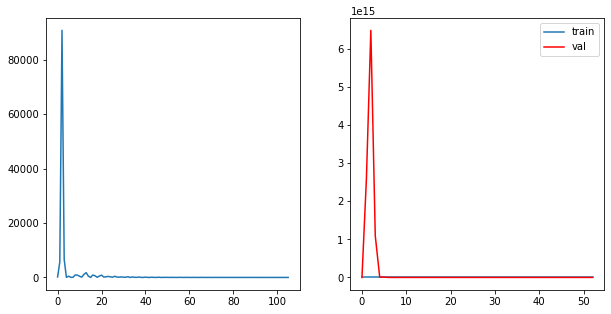

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.8812, grad_fn=<MseLossBackward0>)
tensor(13.7822, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 53	 \Training Loss: 15.831729888916016	     Validation Loss:6.90817928314209	 \ LR:0.001


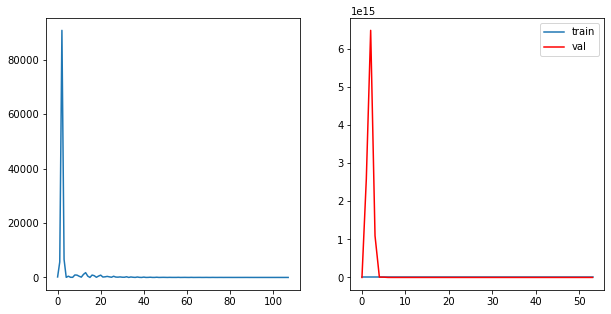

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.5801, grad_fn=<MseLossBackward0>)
tensor(13.6891, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 54	 \Training Loss: 15.634607315063477	     Validation Loss:7.247216701507568	 \ LR:0.001


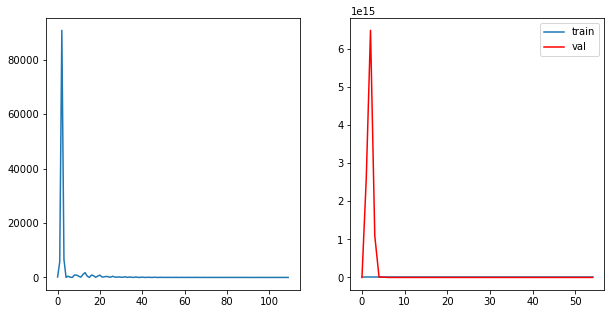

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7343, grad_fn=<MseLossBackward0>)
tensor(16.2172, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 55	 \Training Loss: 15.975720405578613	     Validation Loss:7.454095363616943	 \ LR:0.0001


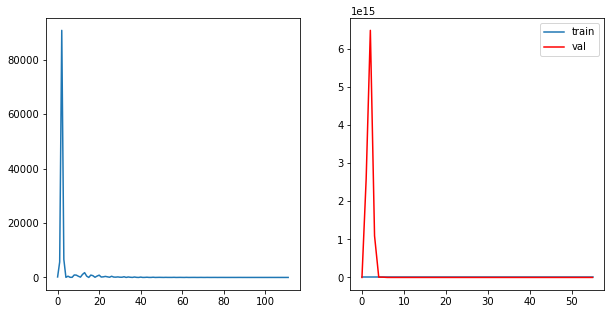

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(14.7810, grad_fn=<MseLossBackward0>)
tensor(14.4582, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 56	 \Training Loss: 14.619567394256592	     Validation Loss:8.40091609954834	 \ LR:0.0001


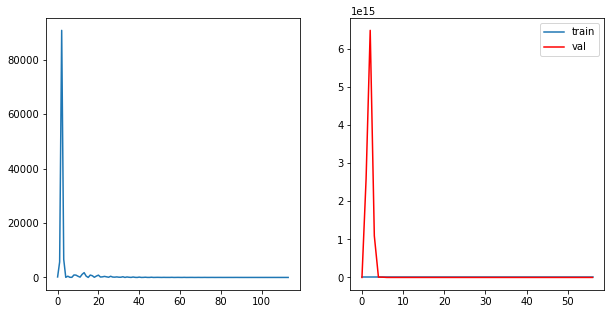

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(14.9487, grad_fn=<MseLossBackward0>)
tensor(16.7029, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 57	 \Training Loss: 15.825810432434082	     Validation Loss:6.825182914733887	 \ LR:0.0001


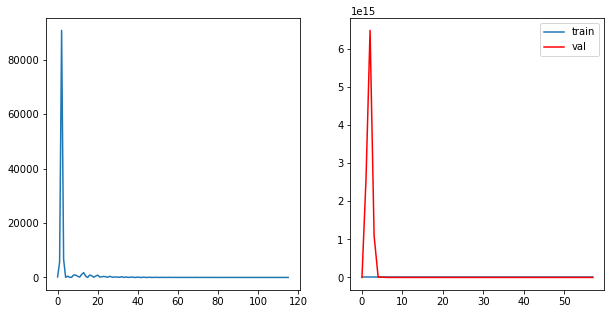

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(14.9934, grad_fn=<MseLossBackward0>)
tensor(13.4020, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 58	 \Training Loss: 14.197673797607422	     Validation Loss:8.18498420715332	 \ LR:0.0001


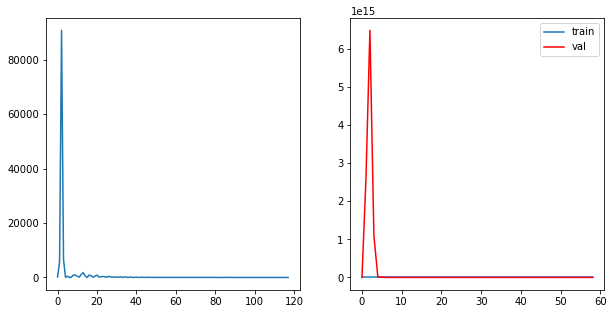

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(14.7224, grad_fn=<MseLossBackward0>)
tensor(14.7871, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 59	 \Training Loss: 14.754784107208252	     Validation Loss:8.097612380981445	 \ LR:0.0001


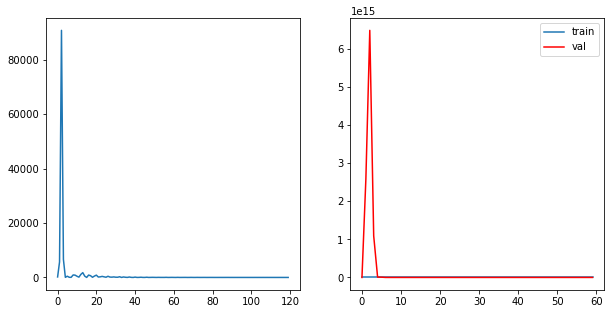

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.3558, grad_fn=<MseLossBackward0>)
tensor(14.5756, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 60	 \Training Loss: 14.96569538116455	     Validation Loss:7.993560791015625	 \ LR:0.0001


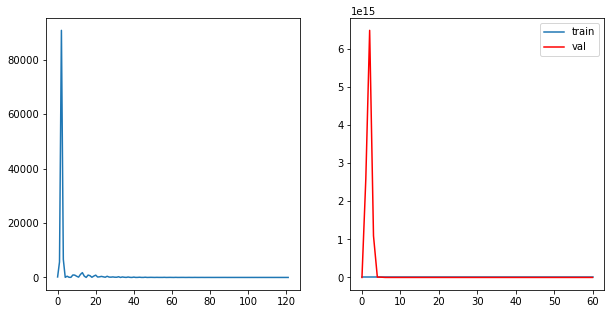

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.3890, grad_fn=<MseLossBackward0>)
tensor(12.9827, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 61	 \Training Loss: 14.685869216918945	     Validation Loss:7.8368964195251465	 \ LR:0.0001


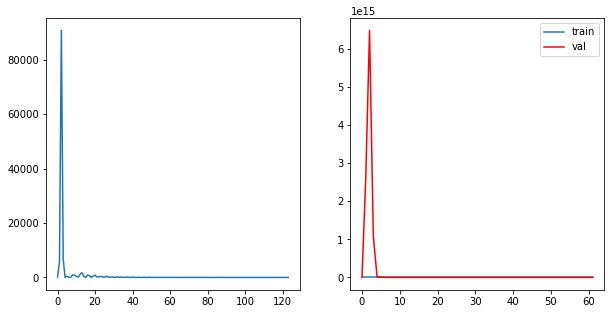

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5778, grad_fn=<MseLossBackward0>)
tensor(14.1960, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 62	 \Training Loss: 14.886871337890625	     Validation Loss:7.838191986083984	 \ LR:0.0001


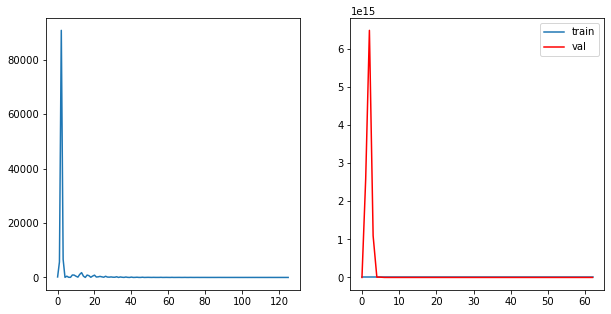

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.5068, grad_fn=<MseLossBackward0>)
tensor(14.2225, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 63	 \Training Loss: 15.364655017852783	     Validation Loss:7.729153633117676	 \ LR:0.0001


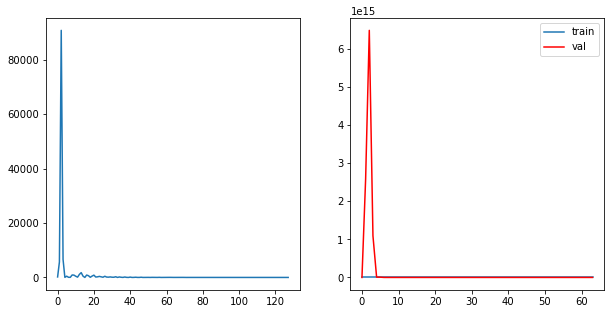

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.9628, grad_fn=<MseLossBackward0>)
tensor(13.7688, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 64	 \Training Loss: 15.36583662033081	     Validation Loss:7.122406005859375	 \ LR:0.0001


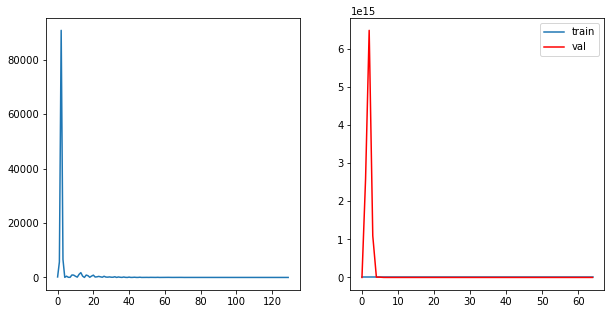

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5577, grad_fn=<MseLossBackward0>)
tensor(13.7190, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 65	 \Training Loss: 14.63834524154663	     Validation Loss:6.281432151794434	 \ LR:0.0001


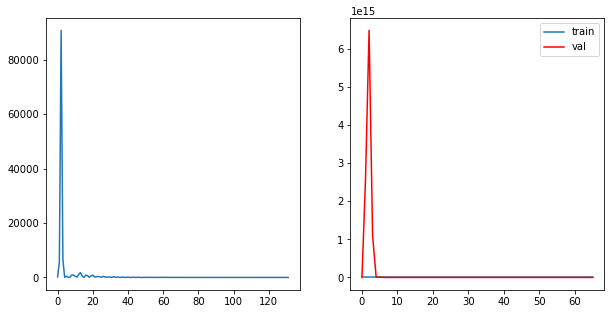

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1185, grad_fn=<MseLossBackward0>)
tensor(12.6184, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 66	 \Training Loss: 14.868452072143555	     Validation Loss:6.836926460266113	 \ LR:1e-05


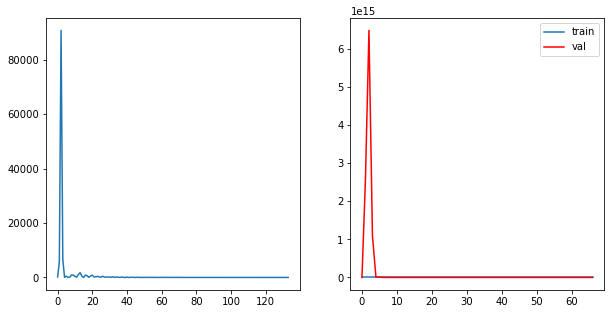

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8324, grad_fn=<MseLossBackward0>)
tensor(13.5539, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 67	 \Training Loss: 14.693140029907227	     Validation Loss:7.6577582359313965	 \ LR:1e-05


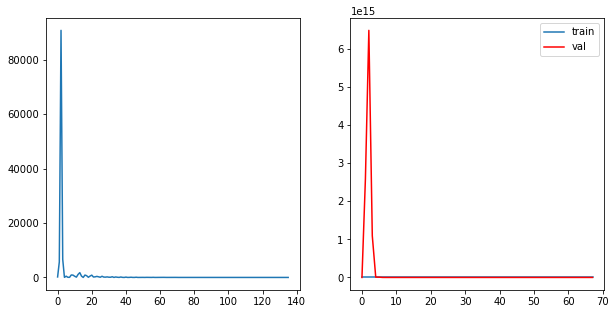

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.5701, grad_fn=<MseLossBackward0>)
tensor(13.6647, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 68	 \Training Loss: 15.617398738861084	     Validation Loss:7.711965084075928	 \ LR:1e-05


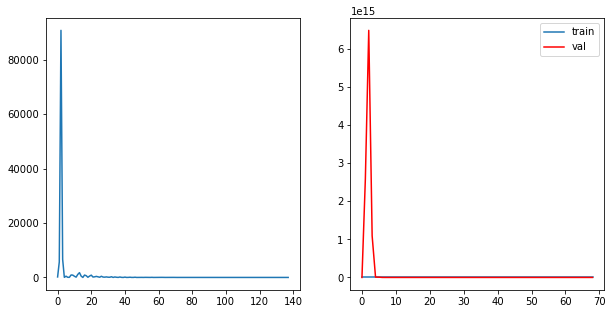

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.6351, grad_fn=<MseLossBackward0>)
tensor(13.7891, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 69	 \Training Loss: 15.712109565734863	     Validation Loss:7.300197601318359	 \ LR:1e-05


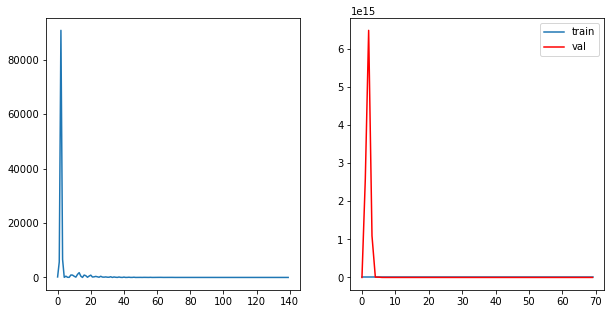

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4527, grad_fn=<MseLossBackward0>)
tensor(13.7569, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 70	 \Training Loss: 14.604776859283447	     Validation Loss:6.343616962432861	 \ LR:1e-05


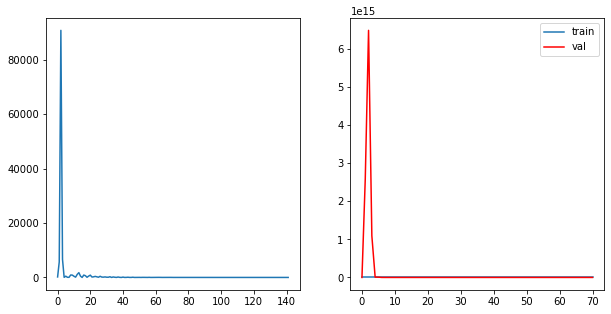

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.1743, grad_fn=<MseLossBackward0>)
tensor(13.0064, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 71	 \Training Loss: 14.590353012084961	     Validation Loss:7.934027194976807	 \ LR:1e-05


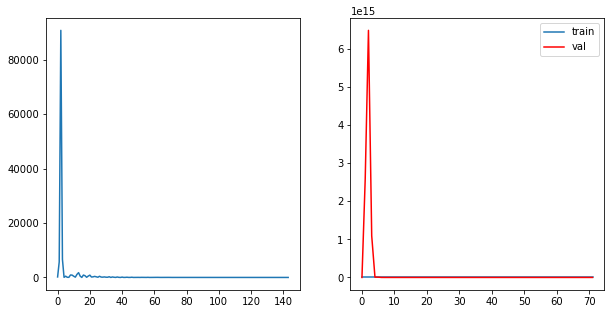

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6781, grad_fn=<MseLossBackward0>)
tensor(14.1042, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 72	 \Training Loss: 14.89116907119751	     Validation Loss:7.890425205230713	 \ LR:1e-05


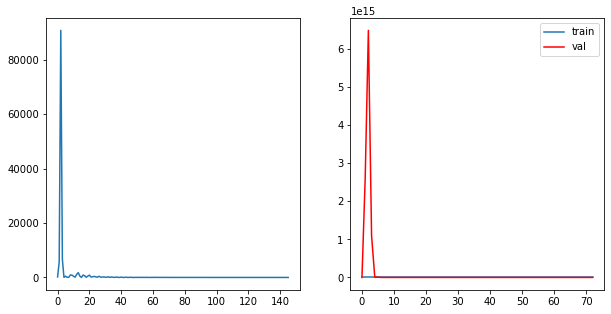

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2228, grad_fn=<MseLossBackward0>)
tensor(12.9025, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 73	 \Training Loss: 15.062626838684082	     Validation Loss:6.914277076721191	 \ LR:1e-05


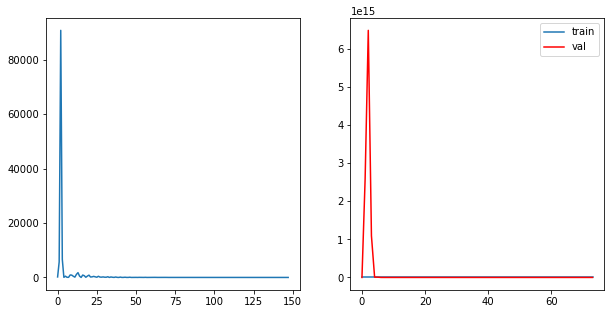

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0275, grad_fn=<MseLossBackward0>)
tensor(14.1477, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 74	 \Training Loss: 15.587611198425293	     Validation Loss:7.545775413513184	 \ LR:1e-05


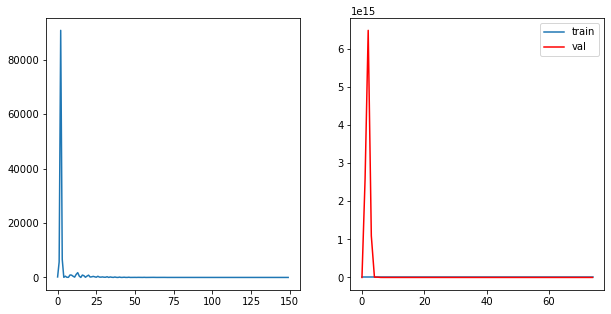

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8651, grad_fn=<MseLossBackward0>)
tensor(12.9060, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 75	 \Training Loss: 14.385538578033447	     Validation Loss:7.538961887359619	 \ LR:1e-05


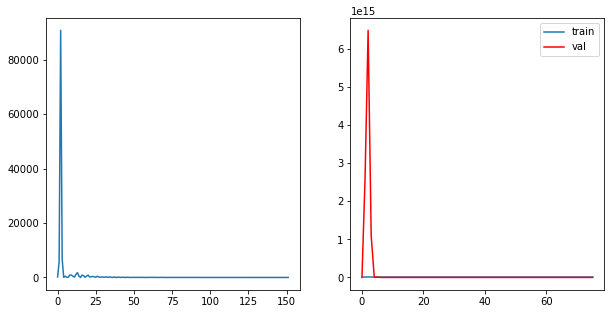

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3479, grad_fn=<MseLossBackward0>)
tensor(13.7696, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 76	 \Training Loss: 15.558796882629395	     Validation Loss:7.559884548187256	 \ LR:1e-05


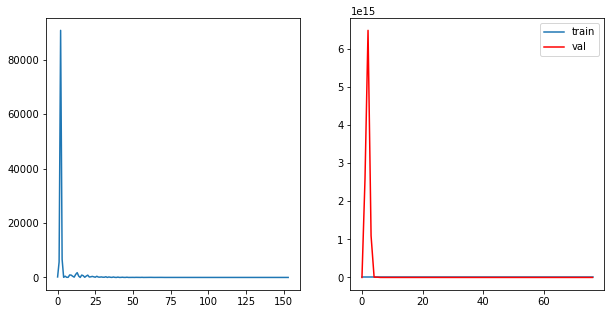

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1345, grad_fn=<MseLossBackward0>)
tensor(13.8012, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 77	 \Training Loss: 15.467851161956787	     Validation Loss:7.635079860687256	 \ LR:1.0000000000000002e-06


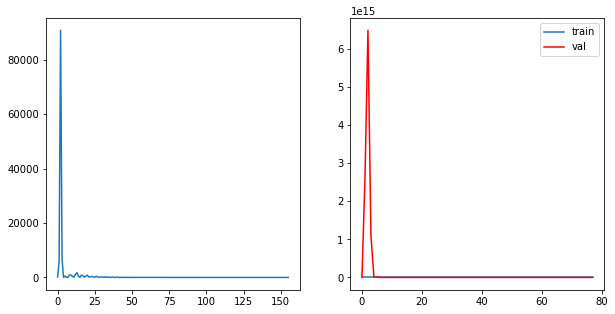

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1426, grad_fn=<MseLossBackward0>)
tensor(12.7318, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 78	 \Training Loss: 14.937180519104004	     Validation Loss:6.911993980407715	 \ LR:1.0000000000000002e-06


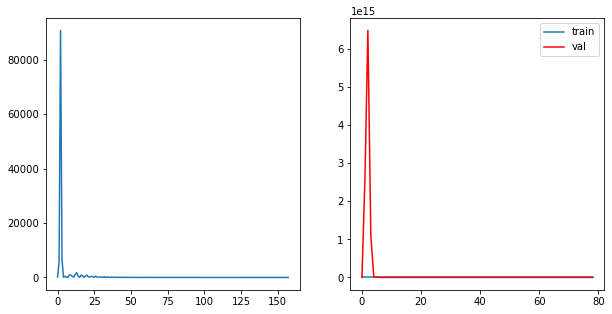

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0045, grad_fn=<MseLossBackward0>)
tensor(12.3955, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 79	 \Training Loss: 14.6999831199646	     Validation Loss:7.864474296569824	 \ LR:1.0000000000000002e-06


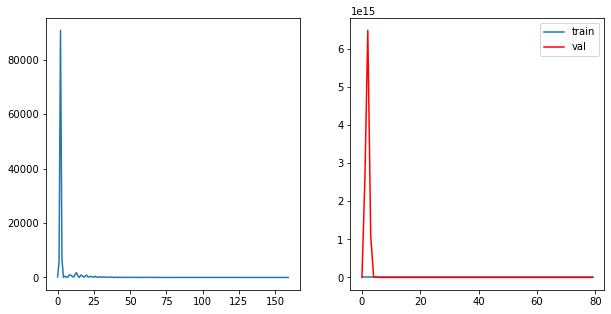

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4399, grad_fn=<MseLossBackward0>)
tensor(14.5466, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 80	 \Training Loss: 14.993237495422363	     Validation Loss:7.644665718078613	 \ LR:1.0000000000000002e-06


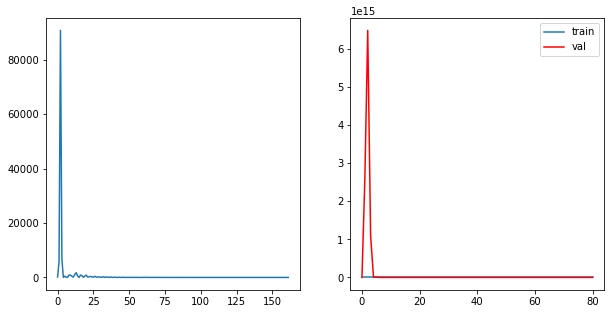

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2662, grad_fn=<MseLossBackward0>)
tensor(12.9728, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 81	 \Training Loss: 15.11946153640747	     Validation Loss:6.965819358825684	 \ LR:1.0000000000000002e-06


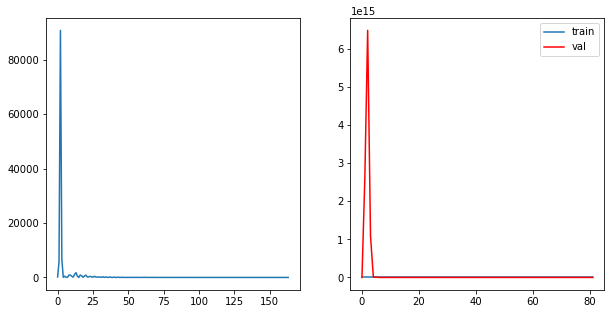

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7238, grad_fn=<MseLossBackward0>)
tensor(12.8647, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 82	 \Training Loss: 14.29427719116211	     Validation Loss:6.987746238708496	 \ LR:1.0000000000000002e-06


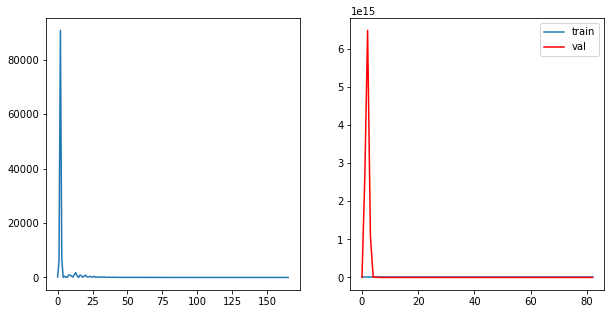

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.7475, grad_fn=<MseLossBackward0>)
tensor(13.8699, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 83	 \Training Loss: 15.308708190917969	     Validation Loss:7.887337684631348	 \ LR:1.0000000000000002e-06


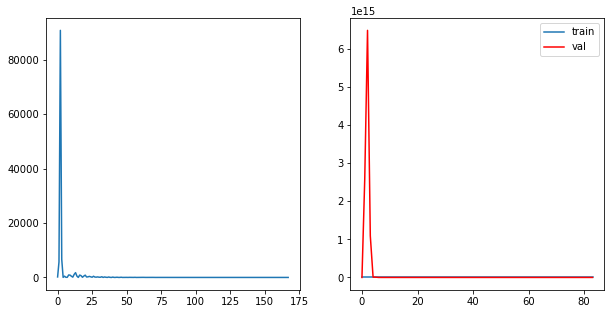

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7998, grad_fn=<MseLossBackward0>)
tensor(13.5040, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 84	 \Training Loss: 14.651925086975098	     Validation Loss:6.982827186584473	 \ LR:1.0000000000000002e-06


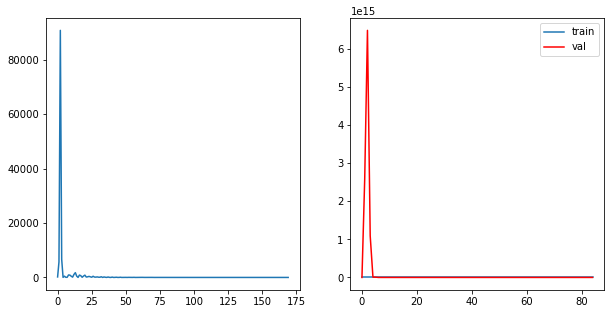

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7296, grad_fn=<MseLossBackward0>)
tensor(12.9891, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 85	 \Training Loss: 14.359389305114746	     Validation Loss:7.760985374450684	 \ LR:1.0000000000000002e-06


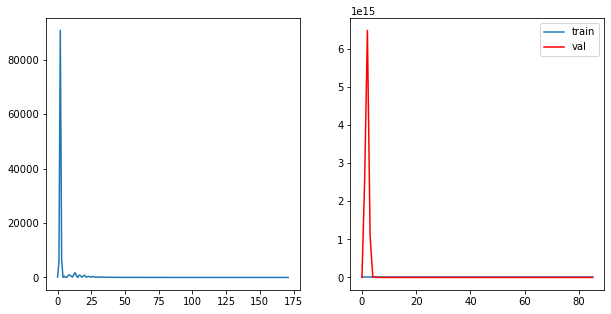

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4900, grad_fn=<MseLossBackward0>)
tensor(13.7819, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 86	 \Training Loss: 14.635949611663818	     Validation Loss:7.614688873291016	 \ LR:1.0000000000000002e-06


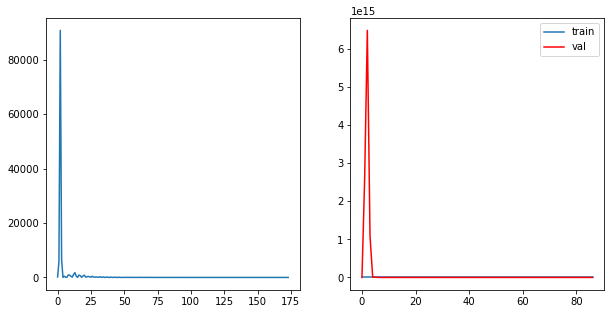

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7901, grad_fn=<MseLossBackward0>)
tensor(14.5368, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 87	 \Training Loss: 15.163446426391602	     Validation Loss:7.6223464012146	 \ LR:1.0000000000000002e-06


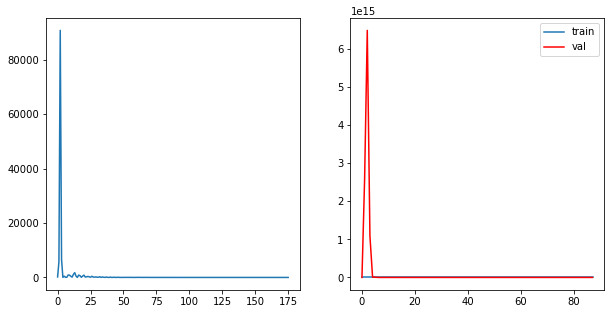

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6383, grad_fn=<MseLossBackward0>)
tensor(13.6895, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 88	 \Training Loss: 14.66389513015747	     Validation Loss:7.6716203689575195	 \ LR:1.0000000000000002e-07


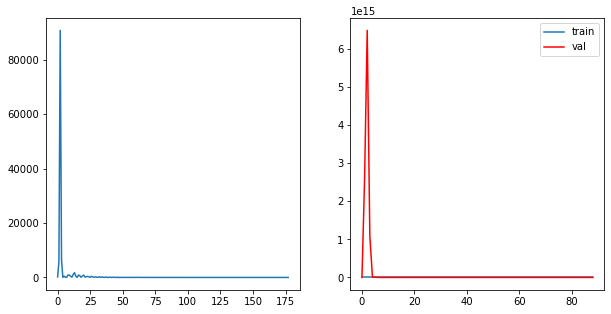

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8693, grad_fn=<MseLossBackward0>)
tensor(12.6559, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 89	 \Training Loss: 14.762609958648682	     Validation Loss:7.796128273010254	 \ LR:1.0000000000000002e-07


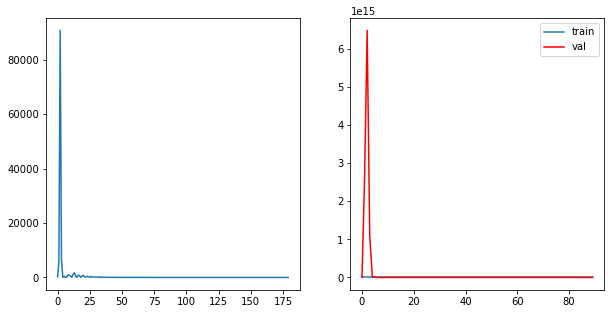

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8936, grad_fn=<MseLossBackward0>)
tensor(13.5043, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 90	 \Training Loss: 15.198957443237305	     Validation Loss:7.903725624084473	 \ LR:1.0000000000000002e-07


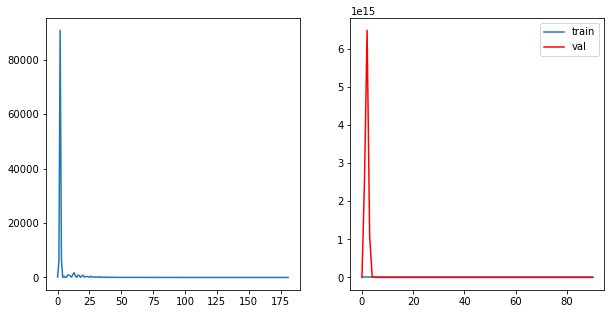

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.9195, grad_fn=<MseLossBackward0>)
tensor(12.6288, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 91	 \Training Loss: 14.774114608764648	     Validation Loss:7.5124053955078125	 \ LR:1.0000000000000002e-07


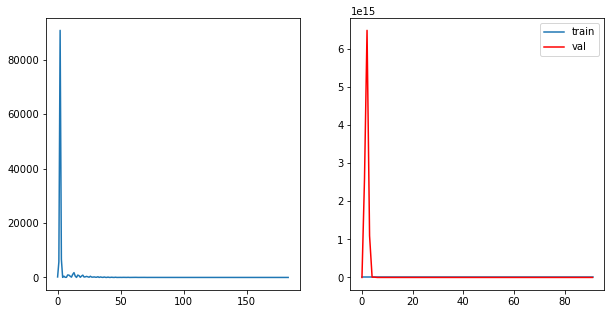

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1750, grad_fn=<MseLossBackward0>)
tensor(12.7080, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 92	 \Training Loss: 14.941498756408691	     Validation Loss:6.8831915855407715	 \ LR:1.0000000000000002e-07


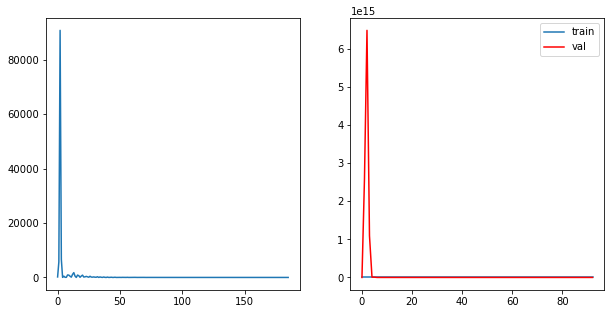

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0388, grad_fn=<MseLossBackward0>)
tensor(13.7369, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 93	 \Training Loss: 15.387866020202637	     Validation Loss:6.689417839050293	 \ LR:1.0000000000000002e-07


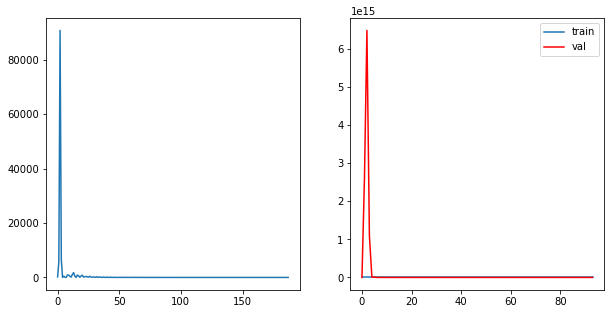

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6312, grad_fn=<MseLossBackward0>)
tensor(13.8734, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 94	 \Training Loss: 14.75228500366211	     Validation Loss:6.99927282333374	 \ LR:1.0000000000000002e-07


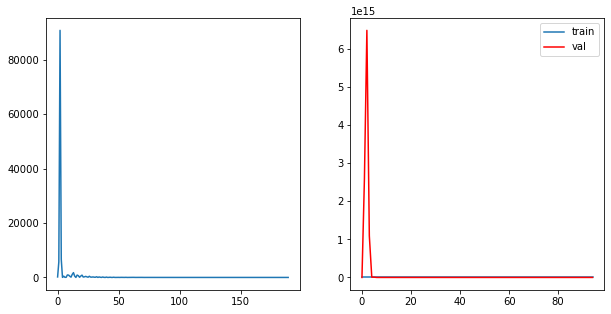

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0668, grad_fn=<MseLossBackward0>)
tensor(13.7894, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 95	 \Training Loss: 15.428077697753906	     Validation Loss:7.810278415679932	 \ LR:1.0000000000000002e-07


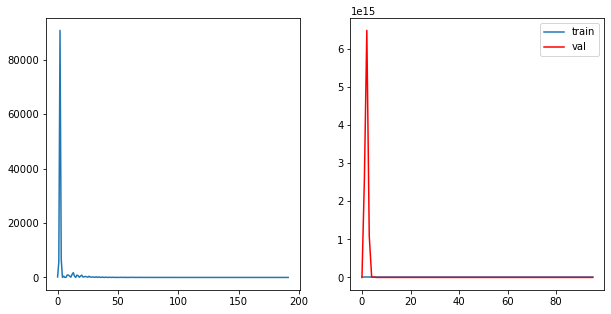

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4904, grad_fn=<MseLossBackward0>)
tensor(13.7742, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 96	 \Training Loss: 14.63231086730957	     Validation Loss:7.835821628570557	 \ LR:1.0000000000000002e-07


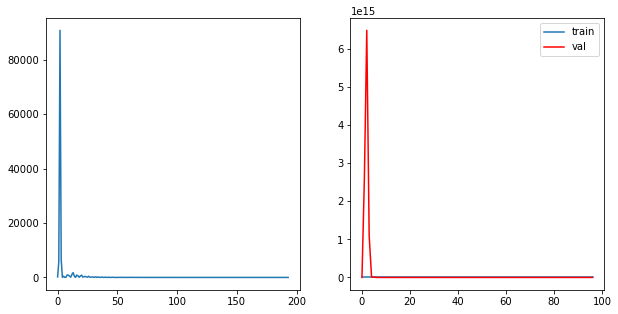

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.3302, grad_fn=<MseLossBackward0>)
tensor(12.9270, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 97	 \Training Loss: 14.128609657287598	     Validation Loss:7.112809658050537	 \ LR:1.0000000000000002e-07


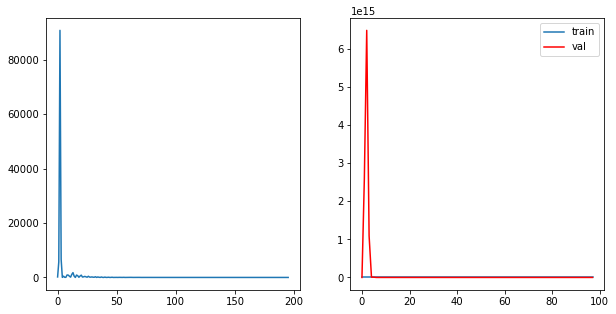

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.7894, grad_fn=<MseLossBackward0>)
tensor(12.8856, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 98	 \Training Loss: 14.837510585784912	     Validation Loss:6.92670202255249	 \ LR:1.0000000000000002e-07


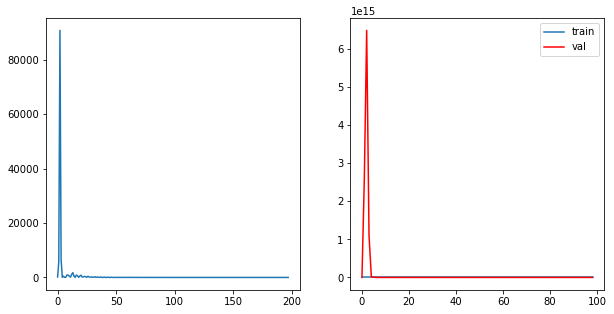

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7902, grad_fn=<MseLossBackward0>)
tensor(14.0965, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 99	 \Training Loss: 14.94331407546997	     Validation Loss:6.866903781890869	 \ LR:1.0000000000000004e-08


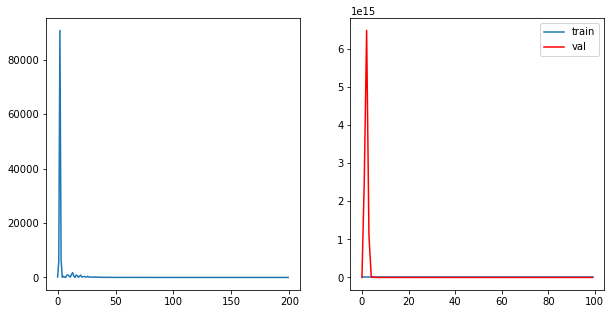

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1430, grad_fn=<MseLossBackward0>)
tensor(13.2611, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 100	 \Training Loss: 15.202041149139404	     Validation Loss:6.8046112060546875	 \ LR:1.0000000000000004e-08


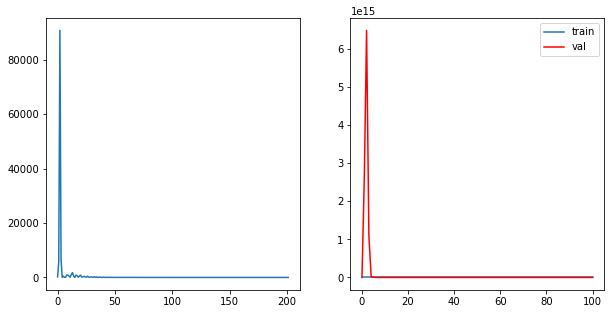

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7137, grad_fn=<MseLossBackward0>)
tensor(12.6525, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 101	 \Training Loss: 14.183143138885498	     Validation Loss:7.422908782958984	 \ LR:1.0000000000000004e-08


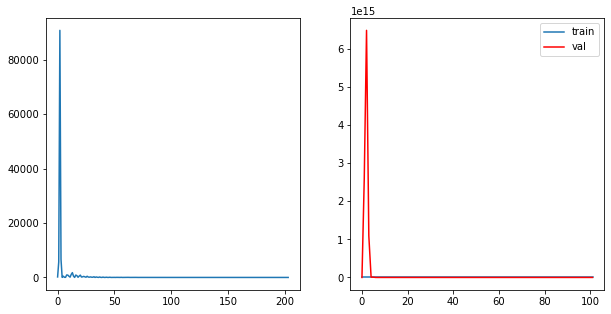

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7334, grad_fn=<MseLossBackward0>)
tensor(12.8525, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 102	 \Training Loss: 14.292981147766113	     Validation Loss:7.877804756164551	 \ LR:1.0000000000000004e-08


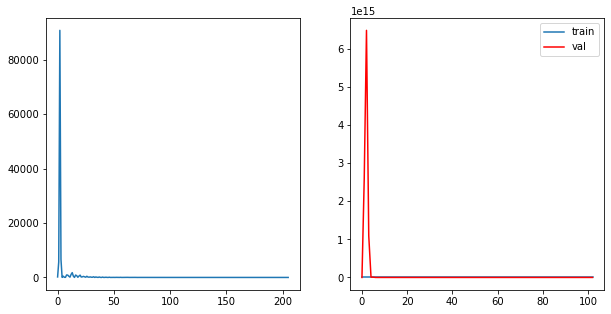

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4137, grad_fn=<MseLossBackward0>)
tensor(13.9941, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 103	 \Training Loss: 14.703887462615967	     Validation Loss:7.4975266456604	 \ LR:1.0000000000000004e-08


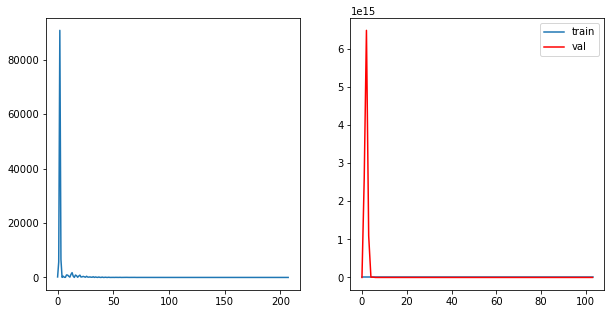

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3757, grad_fn=<MseLossBackward0>)
tensor(13.0459, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 104	 \Training Loss: 15.210801124572754	     Validation Loss:7.4146833419799805	 \ LR:1.0000000000000004e-08


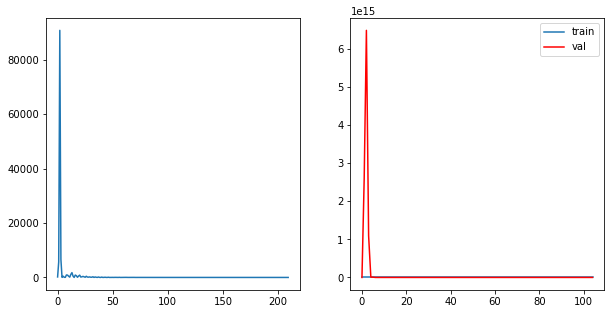

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7424, grad_fn=<MseLossBackward0>)
tensor(13.2699, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 105	 \Training Loss: 14.506147384643555	     Validation Loss:7.44574499130249	 \ LR:1.0000000000000004e-08


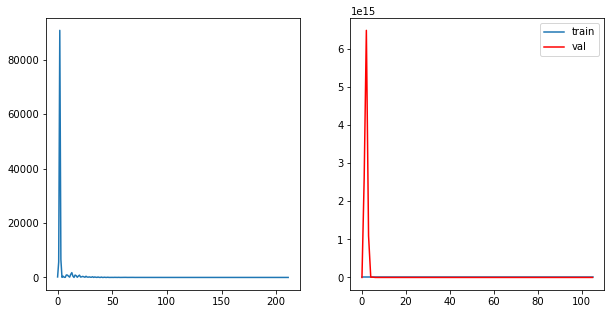

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.3069, grad_fn=<MseLossBackward0>)
tensor(13.1052, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 106	 \Training Loss: 14.206032276153564	     Validation Loss:7.5046586990356445	 \ LR:1.0000000000000004e-08


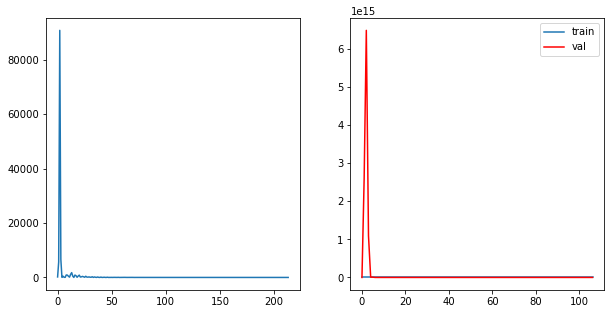

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.1978, grad_fn=<MseLossBackward0>)
tensor(13.1053, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 107	 \Training Loss: 14.151544094085693	     Validation Loss:7.936846733093262	 \ LR:1.0000000000000004e-08


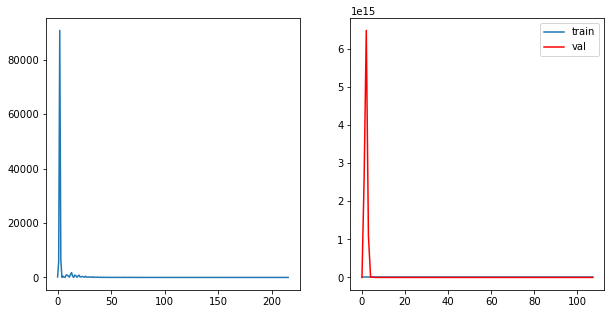

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.7810, grad_fn=<MseLossBackward0>)
tensor(13.5609, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 108	 \Training Loss: 15.170941829681396	     Validation Loss:7.761513710021973	 \ LR:1.0000000000000004e-08


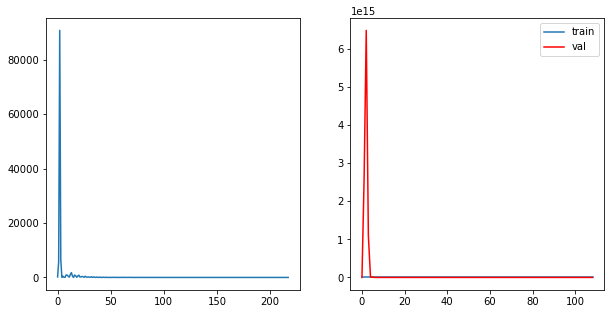

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8137, grad_fn=<MseLossBackward0>)
tensor(12.7805, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 109	 \Training Loss: 14.297069549560547	     Validation Loss:7.450921535491943	 \ LR:1.0000000000000004e-08


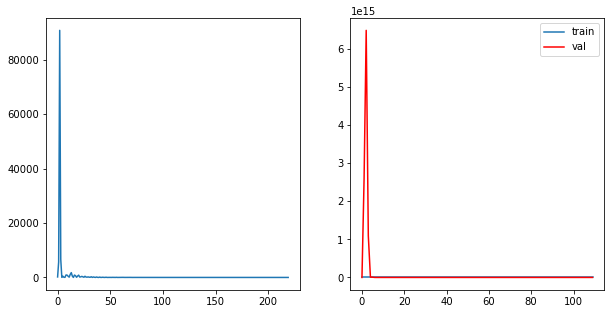

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.0118, grad_fn=<MseLossBackward0>)
tensor(14.2620, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 110	 \Training Loss: 15.136898517608643	     Validation Loss:6.663721561431885	 \ LR:1.0000000000000004e-08


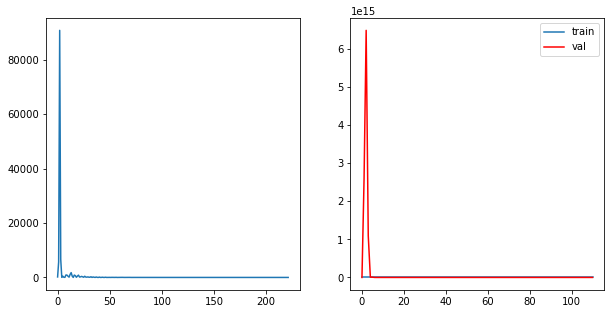

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.9027, grad_fn=<MseLossBackward0>)
tensor(13.1944, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 111	 \Training Loss: 14.548550128936768	     Validation Loss:6.506800651550293	 \ LR:1.0000000000000004e-08


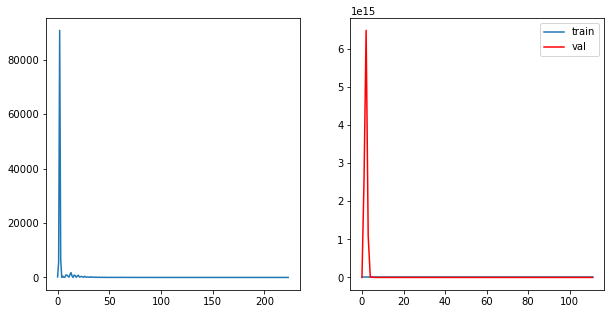

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.4573, grad_fn=<MseLossBackward0>)
tensor(13.3504, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 112	 \Training Loss: 15.403877258300781	     Validation Loss:7.617015838623047	 \ LR:1.0000000000000004e-08


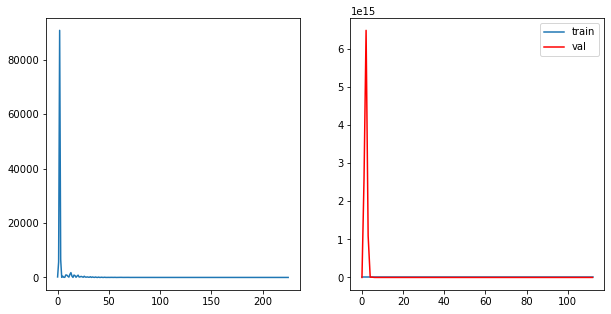

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2418, grad_fn=<MseLossBackward0>)
tensor(13.6140, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 113	 \Training Loss: 15.42787218093872	     Validation Loss:7.538731575012207	 \ LR:1.0000000000000004e-08


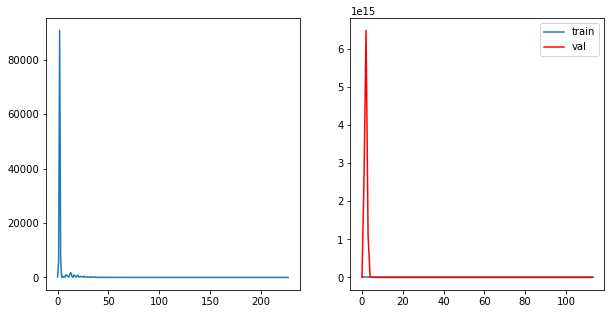

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4319, grad_fn=<MseLossBackward0>)
tensor(14.0819, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 114	 \Training Loss: 14.756901741027832	     Validation Loss:6.4519453048706055	 \ LR:1.0000000000000004e-08


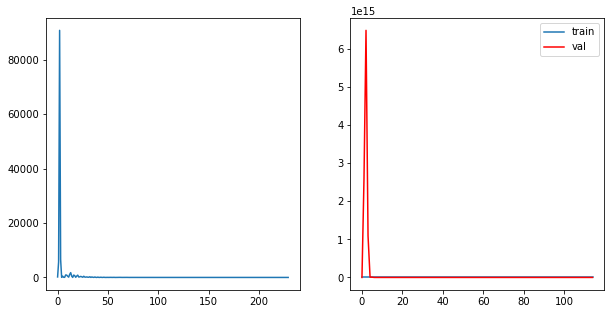

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0126, grad_fn=<MseLossBackward0>)
tensor(14.7808, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 115	 \Training Loss: 15.896704196929932	     Validation Loss:6.440714359283447	 \ LR:1.0000000000000004e-08


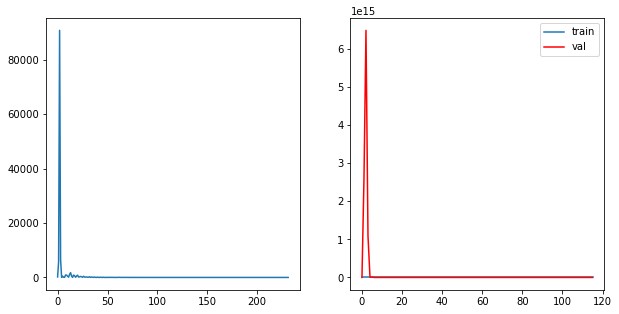

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5471, grad_fn=<MseLossBackward0>)
tensor(13.8480, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 116	 \Training Loss: 14.69755506515503	     Validation Loss:6.936436653137207	 \ LR:1.0000000000000004e-08


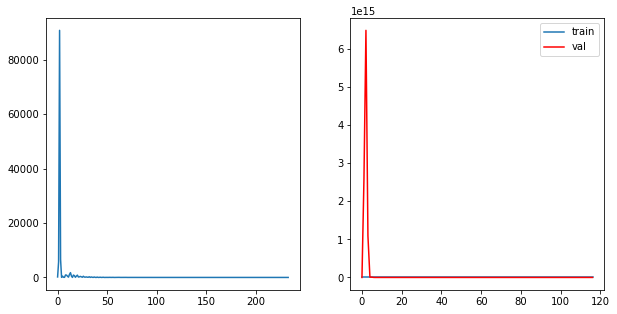

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0309, grad_fn=<MseLossBackward0>)
tensor(13.3139, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 117	 \Training Loss: 15.17238998413086	     Validation Loss:7.472975730895996	 \ LR:1.0000000000000004e-08


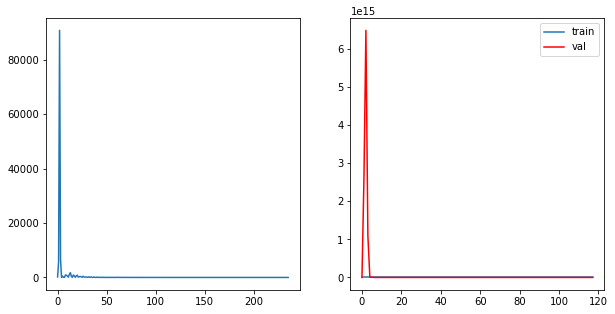

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6435, grad_fn=<MseLossBackward0>)
tensor(13.2899, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 118	 \Training Loss: 14.466703414916992	     Validation Loss:6.416162967681885	 \ LR:1.0000000000000004e-08


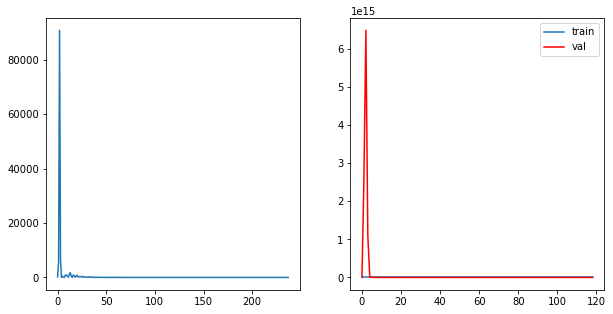

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8583, grad_fn=<MseLossBackward0>)
tensor(13.9363, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 119	 \Training Loss: 14.897305488586426	     Validation Loss:7.224401950836182	 \ LR:1.0000000000000004e-08


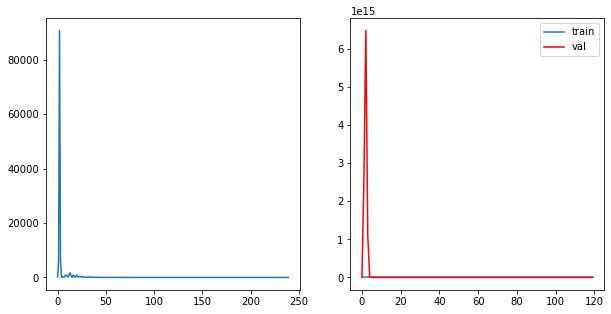

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4785, grad_fn=<MseLossBackward0>)
tensor(13.7634, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 120	 \Training Loss: 14.620974063873291	     Validation Loss:7.643163204193115	 \ LR:1.0000000000000004e-08


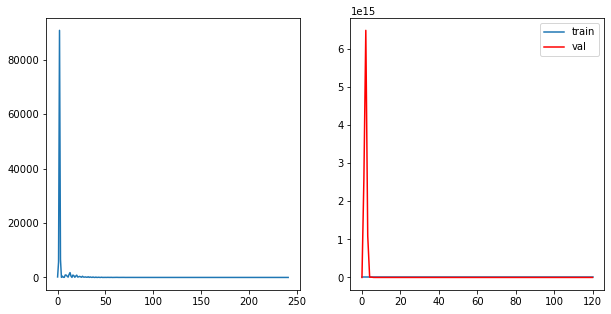

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5625, grad_fn=<MseLossBackward0>)
tensor(13.5346, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 121	 \Training Loss: 14.548553466796875	     Validation Loss:7.058278560638428	 \ LR:1.0000000000000004e-08


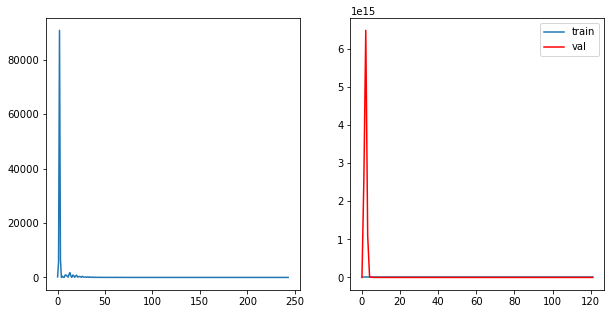

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6654, grad_fn=<MseLossBackward0>)
tensor(12.4507, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 122	 \Training Loss: 14.058057308197021	     Validation Loss:6.993308067321777	 \ LR:1.0000000000000004e-08


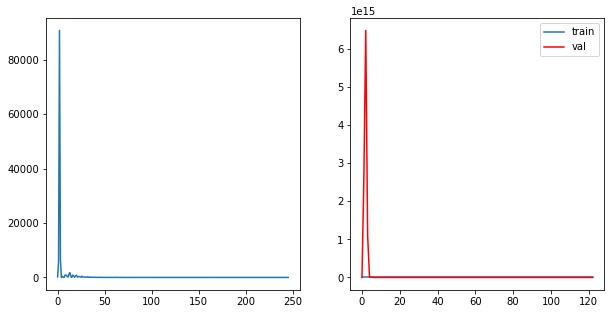

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7654, grad_fn=<MseLossBackward0>)
tensor(13.8973, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 123	 \Training Loss: 14.831305503845215	     Validation Loss:6.506856441497803	 \ LR:1.0000000000000004e-08


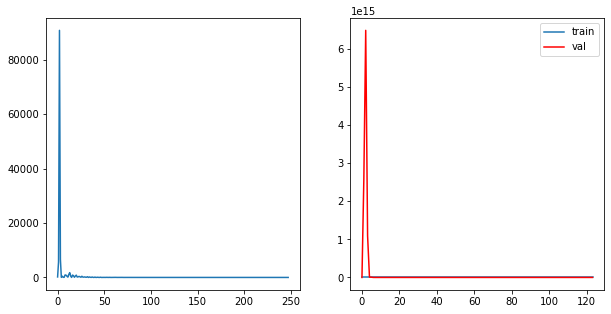

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.4303, grad_fn=<MseLossBackward0>)
tensor(14.6800, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 124	 \Training Loss: 16.055161952972412	     Validation Loss:7.062643527984619	 \ LR:1.0000000000000004e-08


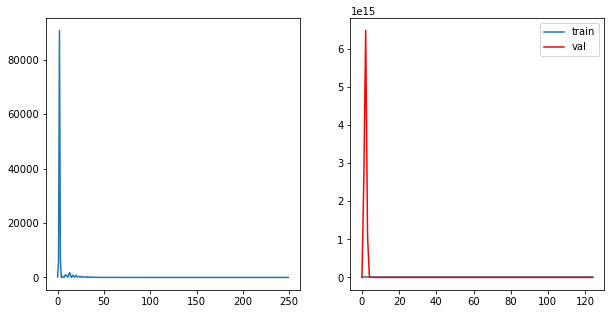

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1359, grad_fn=<MseLossBackward0>)
tensor(12.7829, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 125	 \Training Loss: 14.959414005279541	     Validation Loss:6.962022304534912	 \ LR:1.0000000000000004e-08


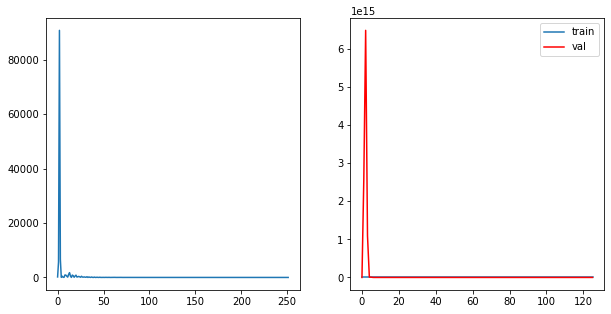

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.6243, grad_fn=<MseLossBackward0>)
tensor(13.8343, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 126	 \Training Loss: 15.229261875152588	     Validation Loss:6.447054386138916	 \ LR:1.0000000000000004e-08


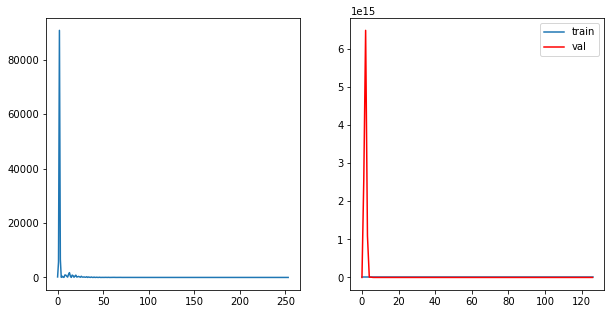

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0048, grad_fn=<MseLossBackward0>)
tensor(13.8313, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 127	 \Training Loss: 15.418020248413086	     Validation Loss:7.403748989105225	 \ LR:1.0000000000000004e-08


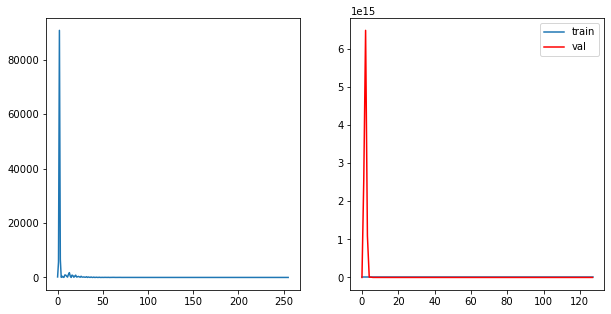

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4886, grad_fn=<MseLossBackward0>)
tensor(12.8384, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 128	 \Training Loss: 14.163529396057129	     Validation Loss:6.442768096923828	 \ LR:1.0000000000000004e-08


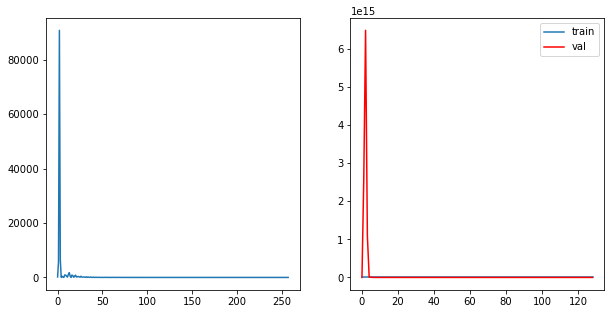

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7579, grad_fn=<MseLossBackward0>)
tensor(13.8712, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 129	 \Training Loss: 14.814542293548584	     Validation Loss:7.800609588623047	 \ LR:1.0000000000000004e-08


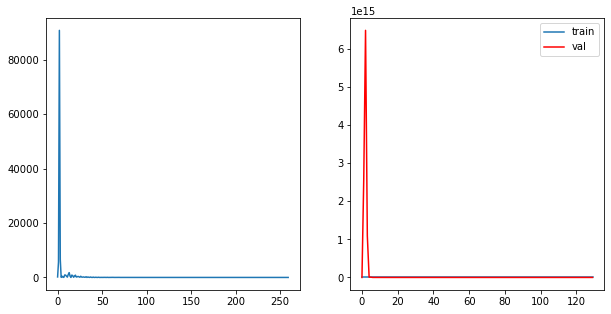

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7094, grad_fn=<MseLossBackward0>)
tensor(13.7107, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 130	 \Training Loss: 14.710022449493408	     Validation Loss:7.8223114013671875	 \ LR:1.0000000000000004e-08


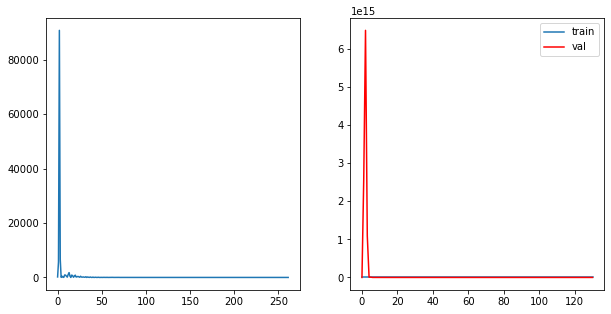

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3644, grad_fn=<MseLossBackward0>)
tensor(13.2956, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 131	 \Training Loss: 15.329984664916992	     Validation Loss:6.4207258224487305	 \ LR:1.0000000000000004e-08


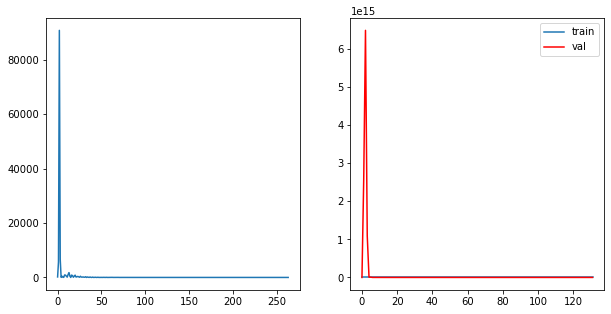

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.3196, grad_fn=<MseLossBackward0>)
tensor(12.6876, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 132	 \Training Loss: 14.003612518310547	     Validation Loss:7.805345058441162	 \ LR:1.0000000000000004e-08


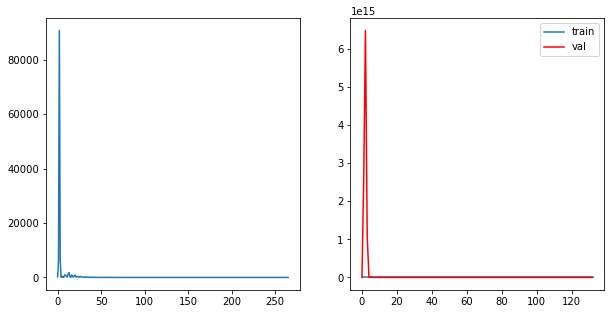

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7668, grad_fn=<MseLossBackward0>)
tensor(12.4960, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 133	 \Training Loss: 14.131417274475098	     Validation Loss:7.619477272033691	 \ LR:1.0000000000000004e-08


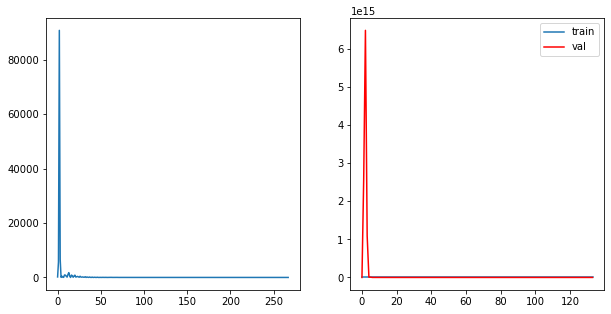

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1429, grad_fn=<MseLossBackward0>)
tensor(13.7956, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 134	 \Training Loss: 15.469268321990967	     Validation Loss:6.341639041900635	 \ LR:1.0000000000000004e-08


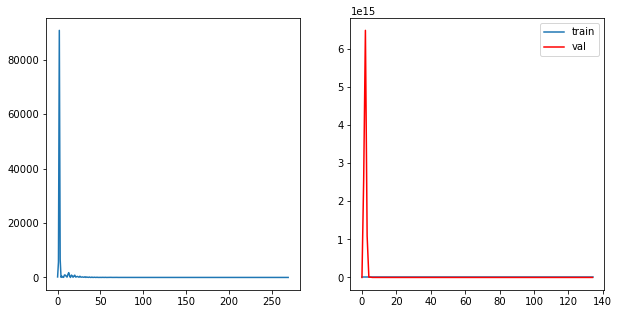

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.7171, grad_fn=<MseLossBackward0>)
tensor(13.8608, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 135	 \Training Loss: 15.288954257965088	     Validation Loss:6.9722418785095215	 \ LR:1.0000000000000004e-08


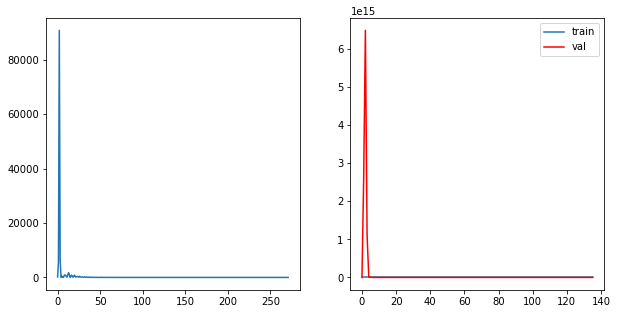

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.4162, grad_fn=<MseLossBackward0>)
tensor(13.6356, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 136	 \Training Loss: 15.52593183517456	     Validation Loss:6.841618537902832	 \ LR:1.0000000000000004e-08


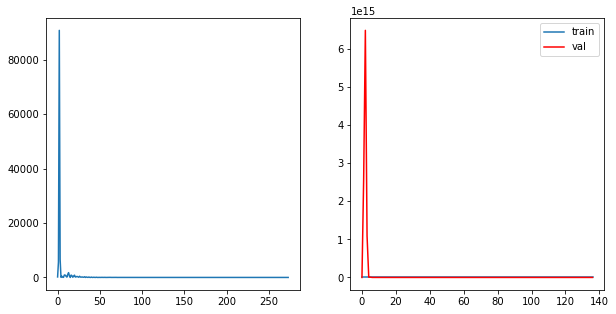

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6679, grad_fn=<MseLossBackward0>)
tensor(13.2906, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 137	 \Training Loss: 14.479231834411621	     Validation Loss:7.5215163230896	 \ LR:1.0000000000000004e-08


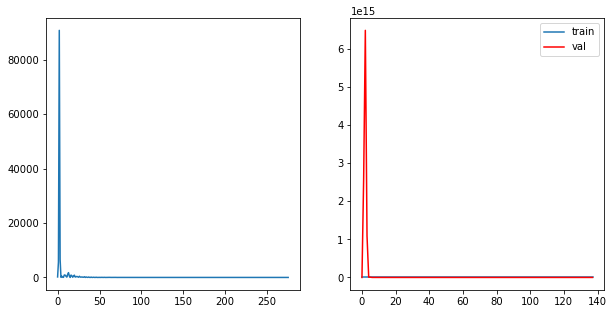

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.1550, grad_fn=<MseLossBackward0>)
tensor(13.3012, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 138	 \Training Loss: 14.228100776672363	     Validation Loss:7.829925537109375	 \ LR:1.0000000000000004e-08


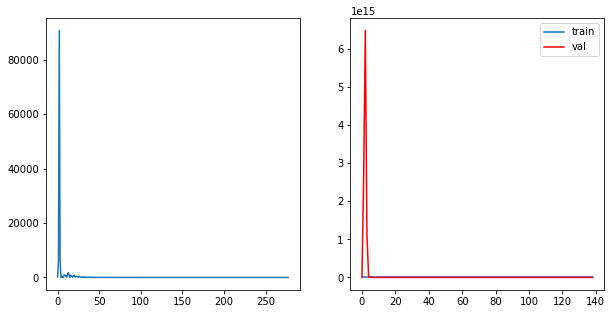

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.1558, grad_fn=<MseLossBackward0>)
tensor(13.8102, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 139	 \Training Loss: 14.482998371124268	     Validation Loss:6.34987735748291	 \ LR:1.0000000000000004e-08


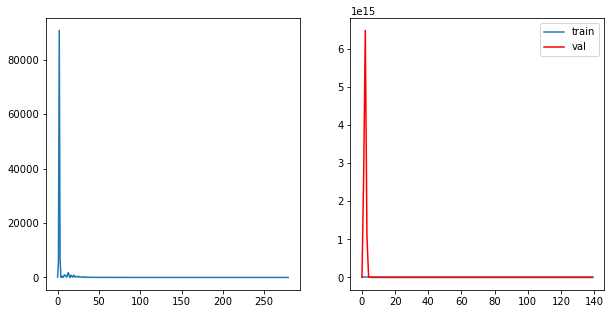

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2985, grad_fn=<MseLossBackward0>)
tensor(13.1486, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 140	 \Training Loss: 15.223568439483643	     Validation Loss:6.434731483459473	 \ LR:1.0000000000000004e-08


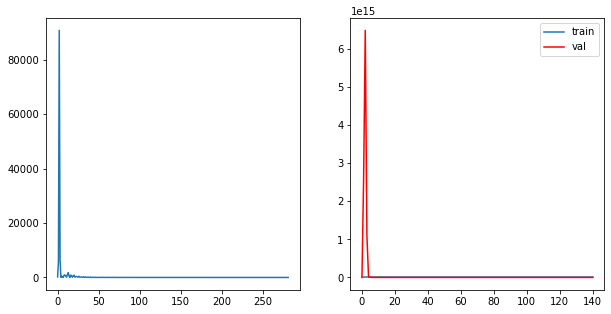

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8260, grad_fn=<MseLossBackward0>)
tensor(12.5868, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 141	 \Training Loss: 14.206393241882324	     Validation Loss:7.383885860443115	 \ LR:1.0000000000000004e-08


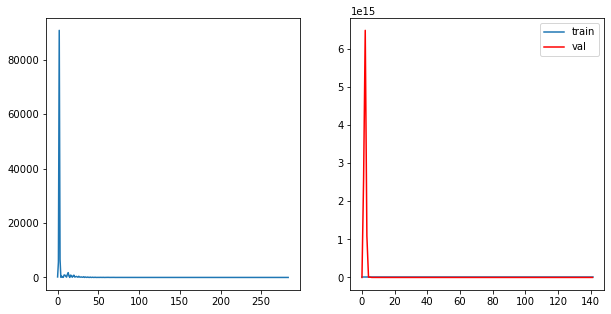

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6092, grad_fn=<MseLossBackward0>)
tensor(13.9176, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 142	 \Training Loss: 14.76341199874878	     Validation Loss:7.346474647521973	 \ LR:1.0000000000000004e-08


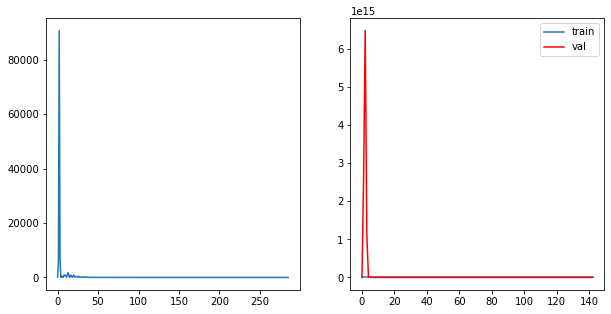

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.9522, grad_fn=<MseLossBackward0>)
tensor(13.7572, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 143	 \Training Loss: 15.354736804962158	     Validation Loss:6.7126617431640625	 \ LR:1.0000000000000004e-08


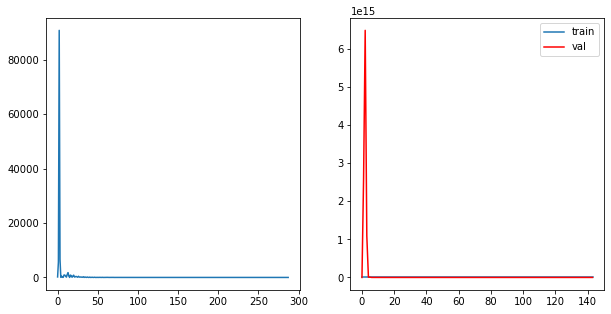

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0094, grad_fn=<MseLossBackward0>)
tensor(13.7804, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 144	 \Training Loss: 15.39490032196045	     Validation Loss:7.6004180908203125	 \ LR:1.0000000000000004e-08


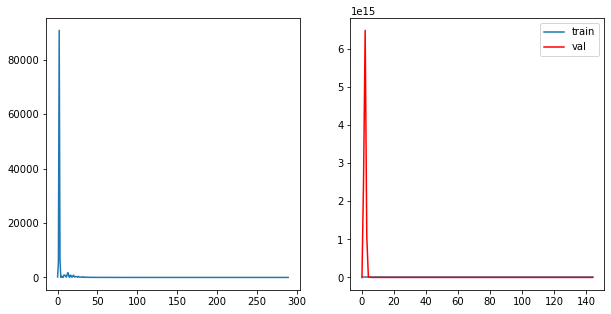

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3972, grad_fn=<MseLossBackward0>)
tensor(12.5722, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 145	 \Training Loss: 14.984699249267578	     Validation Loss:6.884310245513916	 \ LR:1.0000000000000004e-08


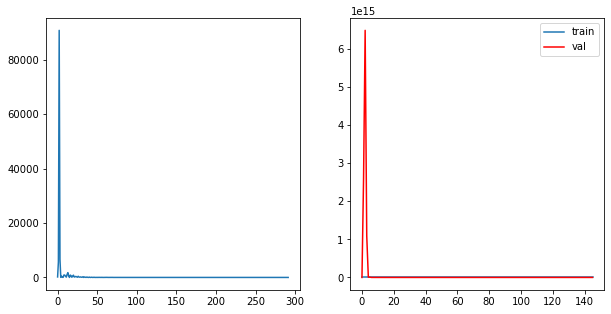

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7012, grad_fn=<MseLossBackward0>)
tensor(13.6582, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 146	 \Training Loss: 14.679717063903809	     Validation Loss:6.379606246948242	 \ LR:1.0000000000000004e-08


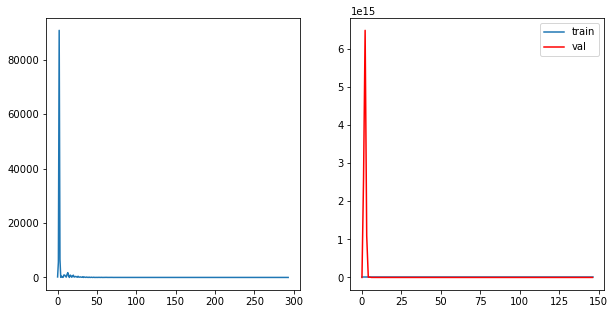

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7514, grad_fn=<MseLossBackward0>)
tensor(12.4490, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 147	 \Training Loss: 14.100213527679443	     Validation Loss:6.949341773986816	 \ LR:1.0000000000000004e-08


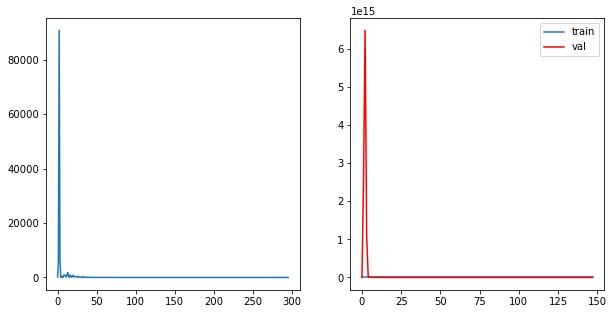

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4373, grad_fn=<MseLossBackward0>)
tensor(14.2728, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 148	 \Training Loss: 14.855082511901855	     Validation Loss:6.374573707580566	 \ LR:1.0000000000000004e-08


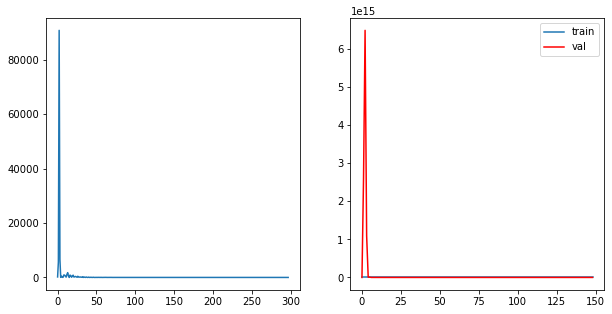

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.5685, grad_fn=<MseLossBackward0>)
tensor(13.4783, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 149	 \Training Loss: 15.02338171005249	     Validation Loss:6.579368591308594	 \ LR:1.0000000000000004e-08


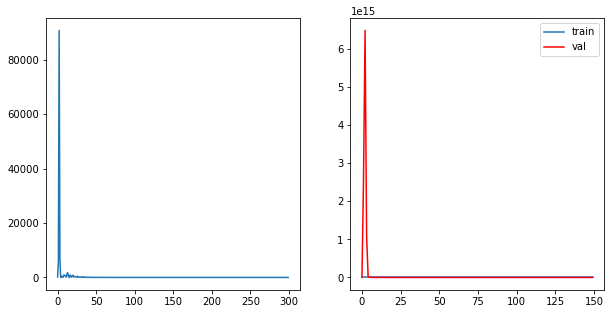

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.9101, grad_fn=<MseLossBackward0>)
tensor(13.7903, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 150	 \Training Loss: 14.850188732147217	     Validation Loss:6.636528968811035	 \ LR:1.0000000000000004e-08


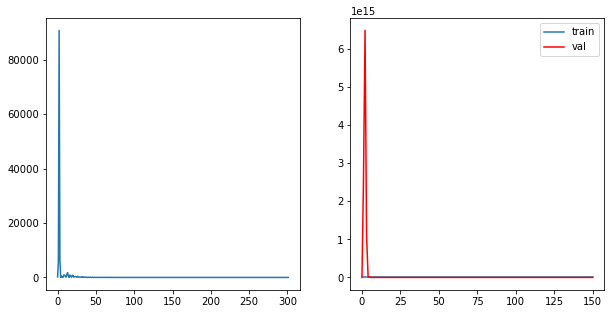

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0061, grad_fn=<MseLossBackward0>)
tensor(13.7376, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 151	 \Training Loss: 15.371829509735107	     Validation Loss:6.330654621124268	 \ LR:1.0000000000000004e-08


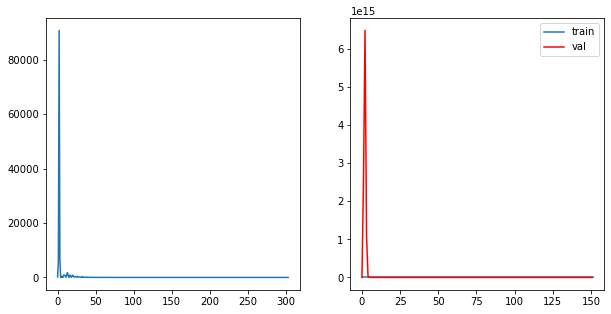

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4384, grad_fn=<MseLossBackward0>)
tensor(13.3136, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 152	 \Training Loss: 14.37600040435791	     Validation Loss:6.382806777954102	 \ LR:1.0000000000000004e-08


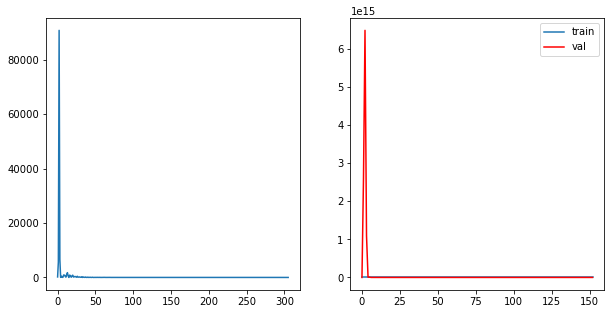

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8369, grad_fn=<MseLossBackward0>)
tensor(13.2574, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 153	 \Training Loss: 15.04715871810913	     Validation Loss:8.004890441894531	 \ LR:1.0000000000000004e-08


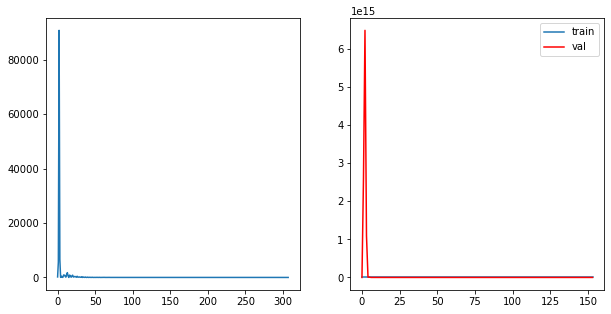

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7258, grad_fn=<MseLossBackward0>)
tensor(13.2357, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 154	 \Training Loss: 14.48073434829712	     Validation Loss:7.615947723388672	 \ LR:1.0000000000000004e-08


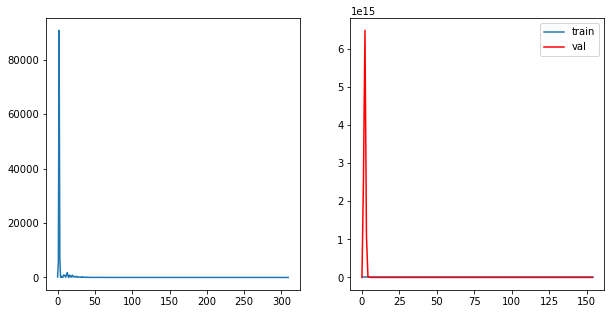

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5060, grad_fn=<MseLossBackward0>)
tensor(12.7945, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 155	 \Training Loss: 14.150246620178223	     Validation Loss:6.479250431060791	 \ LR:1.0000000000000004e-08


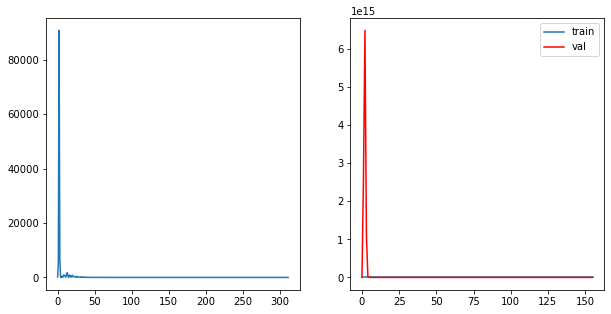

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5853, grad_fn=<MseLossBackward0>)
tensor(13.7878, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 156	 \Training Loss: 14.686566829681396	     Validation Loss:7.353631019592285	 \ LR:1.0000000000000004e-08


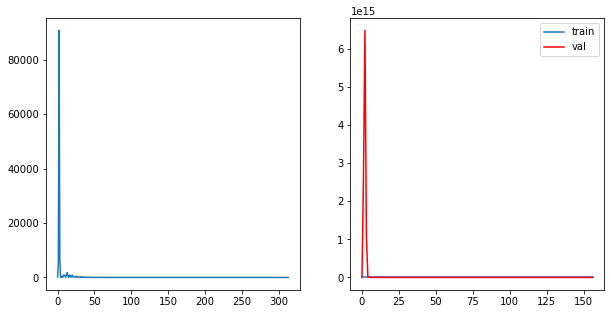

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5651, grad_fn=<MseLossBackward0>)
tensor(12.8156, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 157	 \Training Loss: 14.190306186676025	     Validation Loss:7.990273475646973	 \ LR:1.0000000000000004e-08


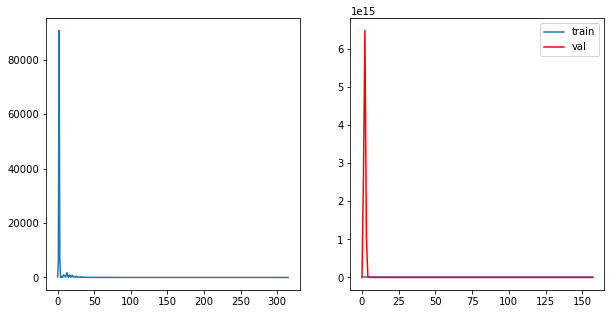

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.9212, grad_fn=<MseLossBackward0>)
tensor(13.1638, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 158	 \Training Loss: 15.042488098144531	     Validation Loss:6.944584846496582	 \ LR:1.0000000000000004e-08


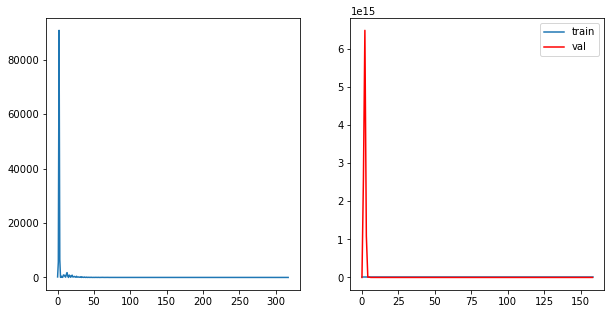

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2666, grad_fn=<MseLossBackward0>)
tensor(14.1360, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 159	 \Training Loss: 15.701269149780273	     Validation Loss:6.4436211585998535	 \ LR:1.0000000000000004e-08


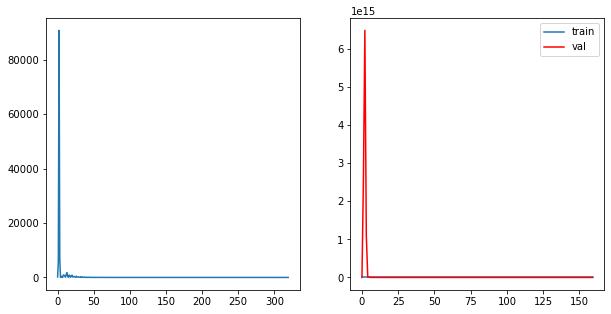

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2917, grad_fn=<MseLossBackward0>)
tensor(12.7745, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 160	 \Training Loss: 15.03309440612793	     Validation Loss:7.462395668029785	 \ LR:1.0000000000000004e-08


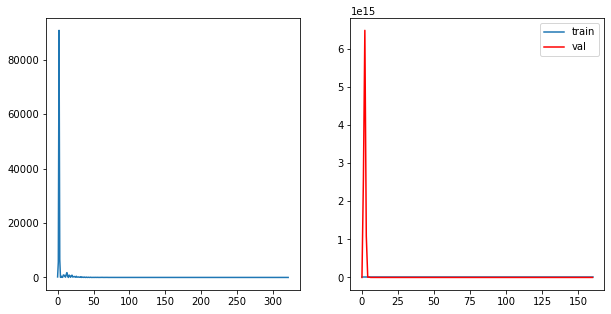

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3046, grad_fn=<MseLossBackward0>)
tensor(12.6244, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 161	 \Training Loss: 14.964504718780518	     Validation Loss:8.028101921081543	 \ LR:1.0000000000000004e-08


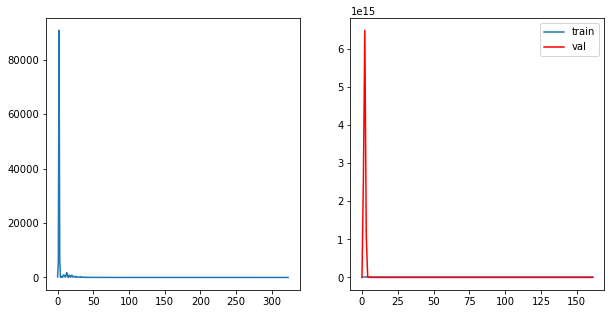

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8689, grad_fn=<MseLossBackward0>)
tensor(13.6567, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 162	 \Training Loss: 15.262755393981934	     Validation Loss:7.420284271240234	 \ LR:1.0000000000000004e-08


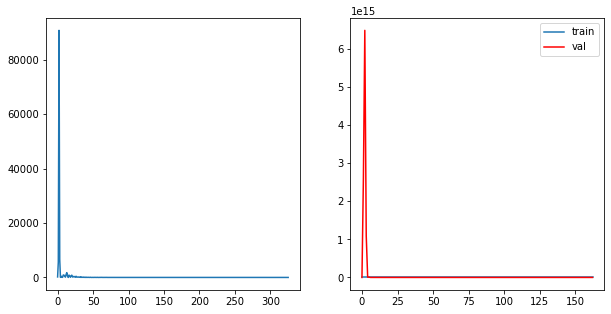

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.7279, grad_fn=<MseLossBackward0>)
tensor(13.0170, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 163	 \Training Loss: 14.872440338134766	     Validation Loss:7.2454833984375	 \ LR:1.0000000000000004e-08


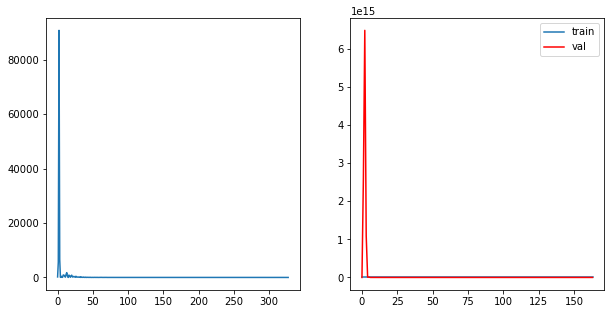

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5996, grad_fn=<MseLossBackward0>)
tensor(13.2590, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 164	 \Training Loss: 14.429288864135742	     Validation Loss:7.41303014755249	 \ LR:1.0000000000000004e-08


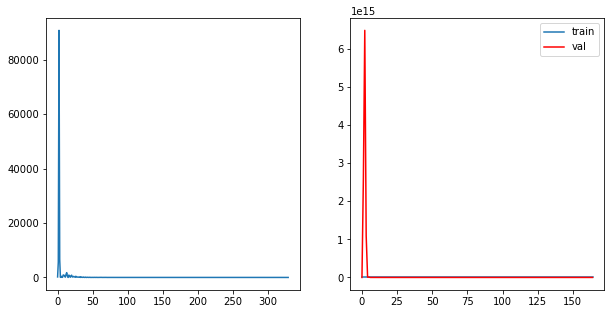

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.3184, grad_fn=<MseLossBackward0>)
tensor(13.8785, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 165	 \Training Loss: 14.598480224609375	     Validation Loss:6.346475124359131	 \ LR:1.0000000000000004e-08


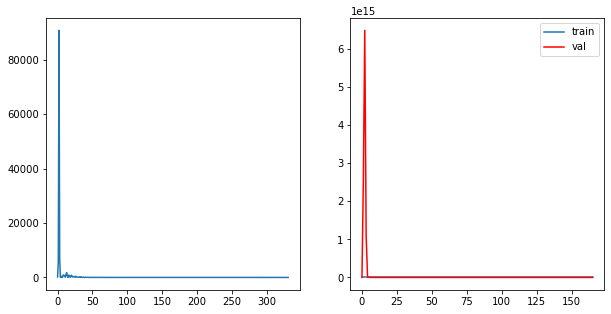

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3036, grad_fn=<MseLossBackward0>)
tensor(13.4894, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 166	 \Training Loss: 15.396522045135498	     Validation Loss:7.841548919677734	 \ LR:1.0000000000000004e-08


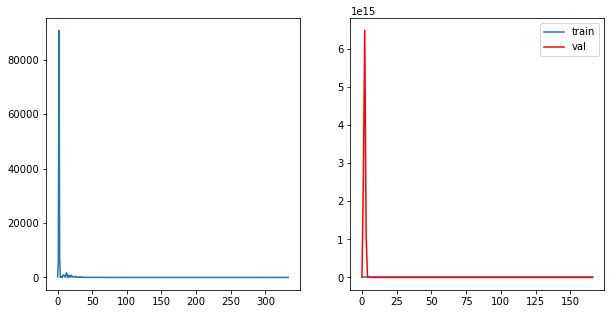

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.2074, grad_fn=<MseLossBackward0>)
tensor(12.6528, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 167	 \Training Loss: 13.930083274841309	     Validation Loss:6.437729835510254	 \ LR:1.0000000000000004e-08


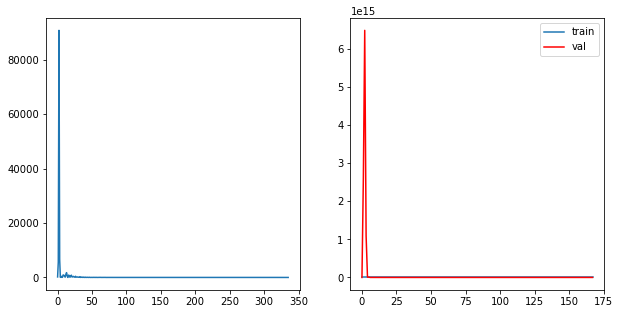

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1196, grad_fn=<MseLossBackward0>)
tensor(13.3658, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 168	 \Training Loss: 15.242703437805176	     Validation Loss:6.433311462402344	 \ LR:1.0000000000000004e-08


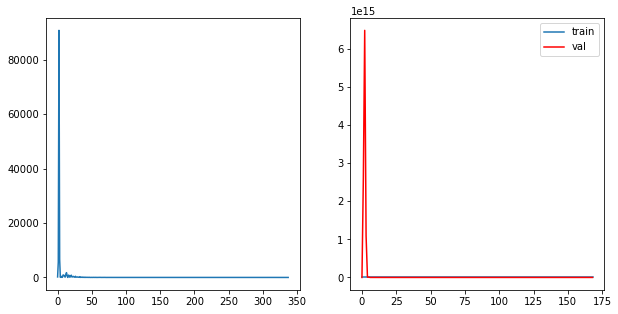

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7405, grad_fn=<MseLossBackward0>)
tensor(13.6632, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 169	 \Training Loss: 14.701868057250977	     Validation Loss:6.442835807800293	 \ LR:1.0000000000000004e-08


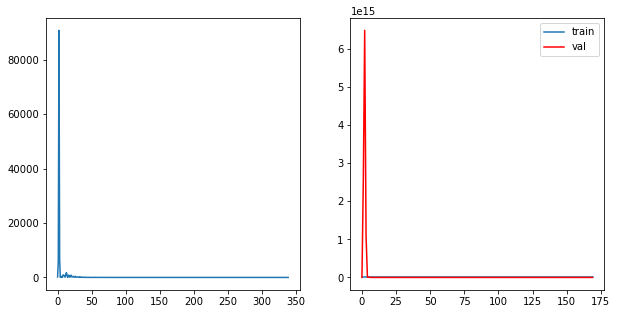

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8129, grad_fn=<MseLossBackward0>)
tensor(13.4660, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 170	 \Training Loss: 14.639448165893555	     Validation Loss:7.604510307312012	 \ LR:1.0000000000000004e-08


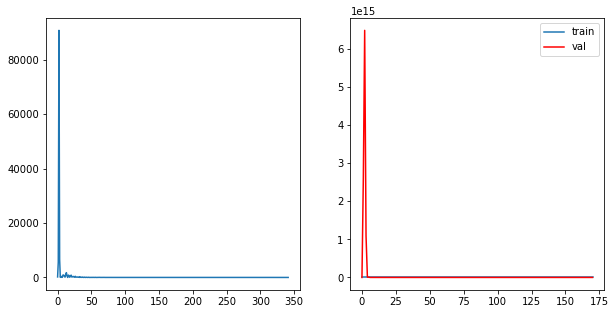

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8526, grad_fn=<MseLossBackward0>)
tensor(12.4392, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 171	 \Training Loss: 14.645904541015625	     Validation Loss:6.632610321044922	 \ LR:1.0000000000000004e-08


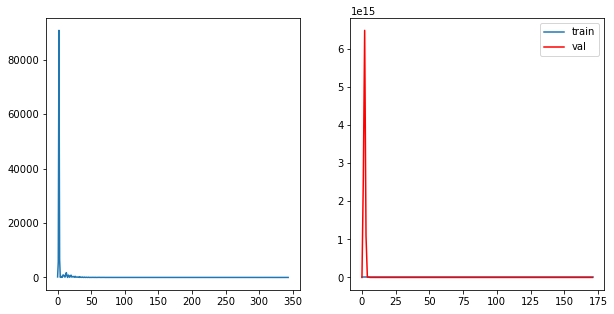

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2348, grad_fn=<MseLossBackward0>)
tensor(14.2769, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 172	 \Training Loss: 15.755833625793457	     Validation Loss:6.501355171203613	 \ LR:1.0000000000000004e-08


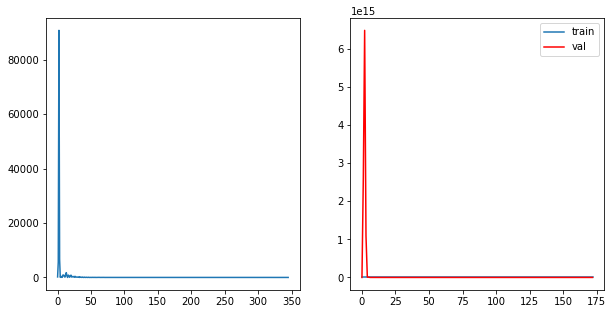

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1485, grad_fn=<MseLossBackward0>)
tensor(12.6856, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 173	 \Training Loss: 14.917052745819092	     Validation Loss:6.901432991027832	 \ LR:1.0000000000000004e-08


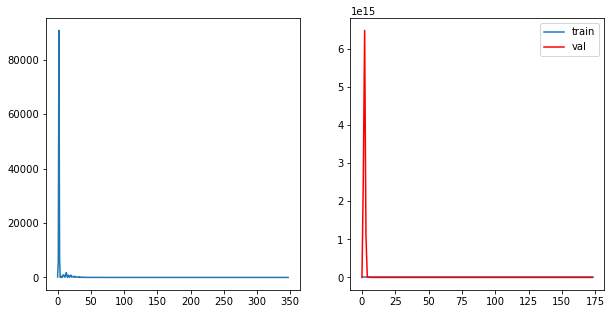

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1953, grad_fn=<MseLossBackward0>)
tensor(13.9388, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 174	 \Training Loss: 15.56706428527832	     Validation Loss:6.611075401306152	 \ LR:1.0000000000000004e-08


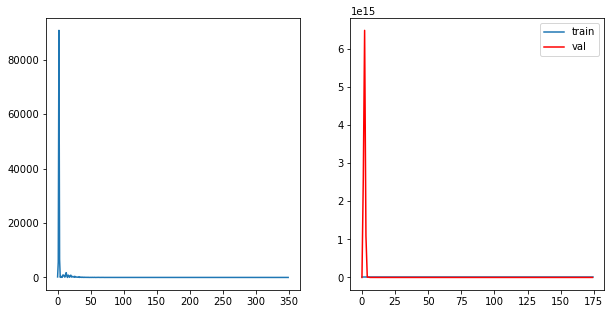

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7148, grad_fn=<MseLossBackward0>)
tensor(14.1564, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 175	 \Training Loss: 14.935590267181396	     Validation Loss:7.133044242858887	 \ LR:1.0000000000000004e-08


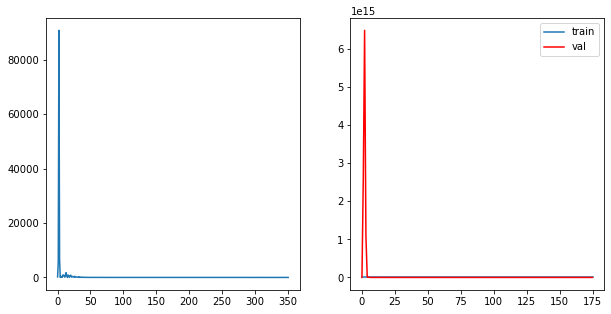

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8816, grad_fn=<MseLossBackward0>)
tensor(13.8186, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 176	 \Training Loss: 15.35011100769043	     Validation Loss:6.328770637512207	 \ LR:1.0000000000000004e-08


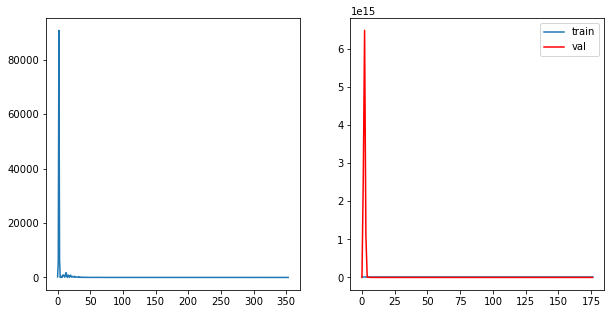

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0461, grad_fn=<MseLossBackward0>)
tensor(12.9986, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 177	 \Training Loss: 15.022379398345947	     Validation Loss:7.730993747711182	 \ LR:1.0000000000000004e-08


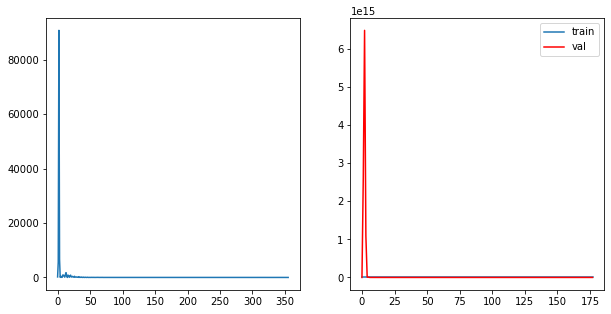

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.9055, grad_fn=<MseLossBackward0>)
tensor(12.3709, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 178	 \Training Loss: 14.138224601745605	     Validation Loss:7.757319450378418	 \ LR:1.0000000000000004e-08


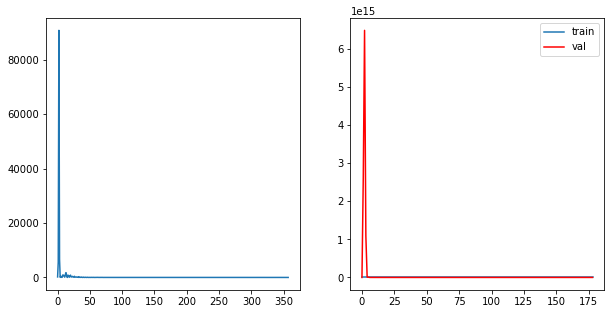

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2837, grad_fn=<MseLossBackward0>)
tensor(12.9082, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 179	 \Training Loss: 15.095985412597656	     Validation Loss:6.3675312995910645	 \ LR:1.0000000000000004e-08


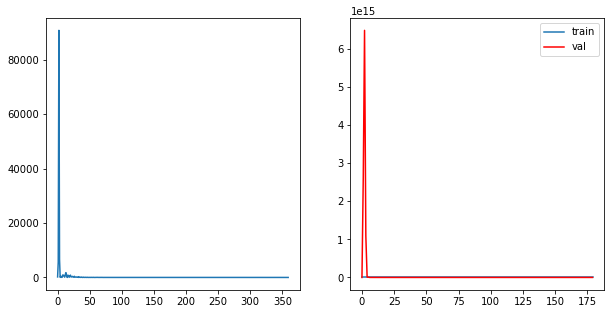

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8676, grad_fn=<MseLossBackward0>)
tensor(13.1150, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 180	 \Training Loss: 14.99132776260376	     Validation Loss:6.877861022949219	 \ LR:1.0000000000000004e-08


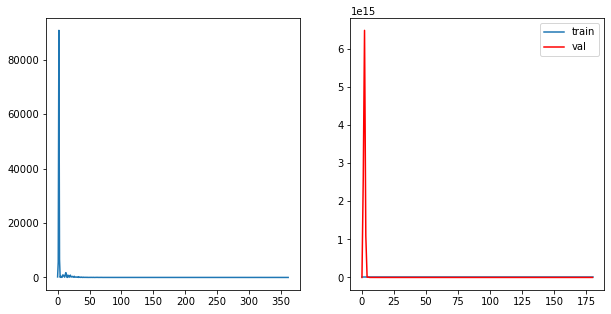

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8520, grad_fn=<MseLossBackward0>)
tensor(12.5599, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 181	 \Training Loss: 14.70593786239624	     Validation Loss:7.7201385498046875	 \ LR:1.0000000000000004e-08


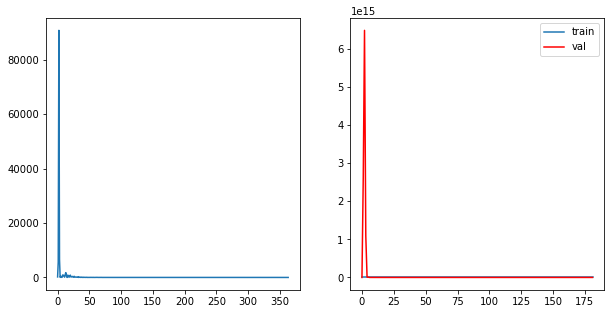

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.2253, grad_fn=<MseLossBackward0>)
tensor(13.7997, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 182	 \Training Loss: 14.512479782104492	     Validation Loss:6.7098822593688965	 \ LR:1.0000000000000004e-08


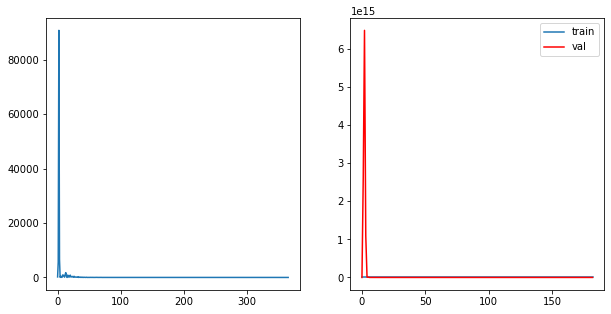

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.8632, grad_fn=<MseLossBackward0>)
tensor(14.2377, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 183	 \Training Loss: 15.050419807434082	     Validation Loss:7.641227722167969	 \ LR:1.0000000000000004e-08


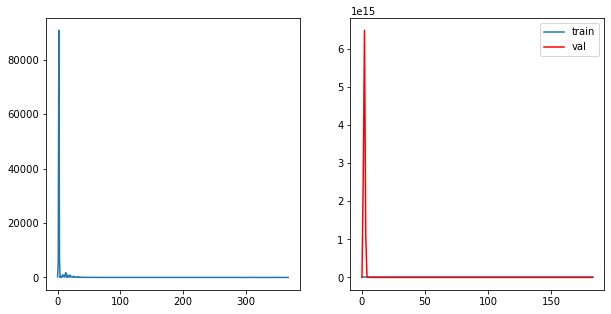

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.7162, grad_fn=<MseLossBackward0>)
tensor(12.8459, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 184	 \Training Loss: 14.281057834625244	     Validation Loss:7.622889518737793	 \ LR:1.0000000000000004e-08


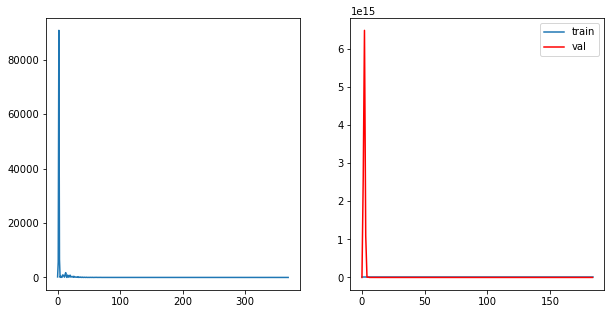

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5826, grad_fn=<MseLossBackward0>)
tensor(12.6182, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 185	 \Training Loss: 14.10041332244873	     Validation Loss:7.525661468505859	 \ LR:1.0000000000000004e-08


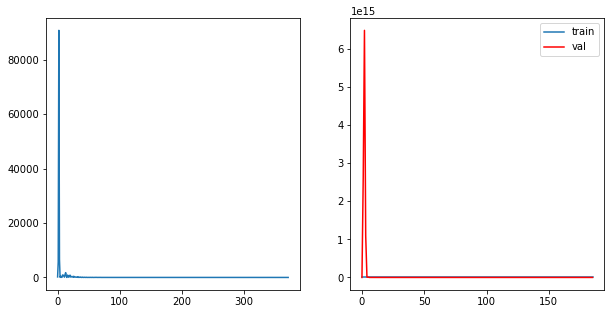

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0948, grad_fn=<MseLossBackward0>)
tensor(13.3899, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 186	 \Training Loss: 15.24238109588623	     Validation Loss:6.864279270172119	 \ LR:1.0000000000000004e-08


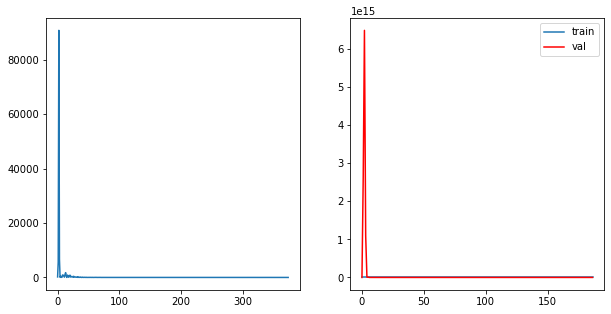

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.4919, grad_fn=<MseLossBackward0>)
tensor(13.6493, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 187	 \Training Loss: 14.570605278015137	     Validation Loss:7.558905124664307	 \ LR:1.0000000000000004e-08


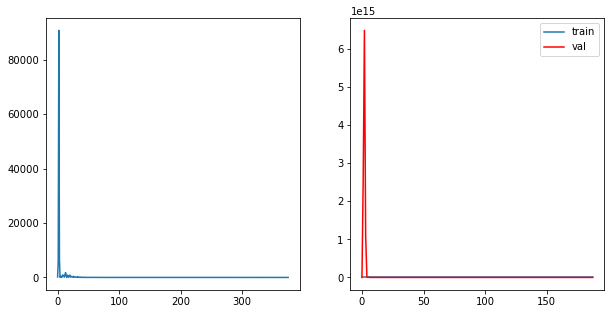

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.1081, grad_fn=<MseLossBackward0>)
tensor(13.4693, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 188	 \Training Loss: 15.288707733154297	     Validation Loss:6.888648986816406	 \ LR:1.0000000000000004e-08


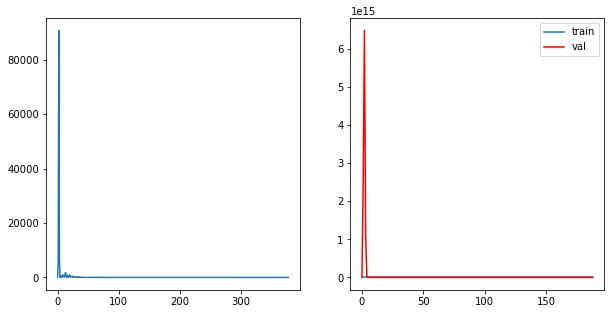

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3775, grad_fn=<MseLossBackward0>)
tensor(13.1777, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 189	 \Training Loss: 15.277610301971436	     Validation Loss:7.218480110168457	 \ LR:1.0000000000000004e-08


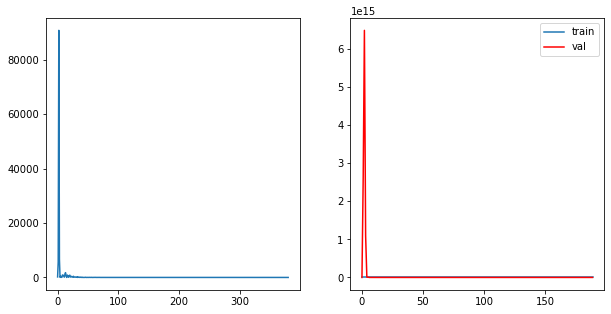

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.3184, grad_fn=<MseLossBackward0>)
tensor(14.8897, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 190	 \Training Loss: 15.10407018661499	     Validation Loss:7.0357513427734375	 \ LR:1.0000000000000004e-08


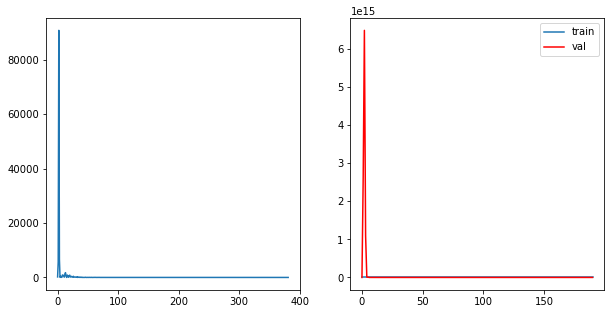

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0167, grad_fn=<MseLossBackward0>)
tensor(13.0487, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 191	 \Training Loss: 15.032676219940186	     Validation Loss:6.342455863952637	 \ LR:1.0000000000000004e-08


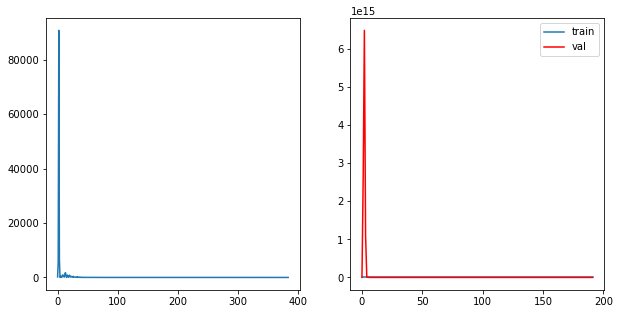

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2539, grad_fn=<MseLossBackward0>)
tensor(12.6817, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 192	 \Training Loss: 14.967791080474854	     Validation Loss:7.504302978515625	 \ LR:1.0000000000000004e-08


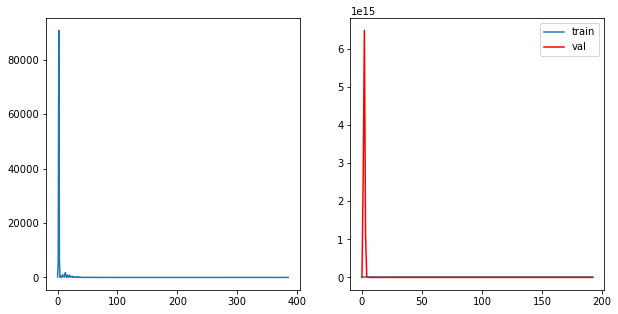

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.0892, grad_fn=<MseLossBackward0>)
tensor(15.2237, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 193	 \Training Loss: 16.15647029876709	     Validation Loss:7.571946144104004	 \ LR:1.0000000000000004e-08


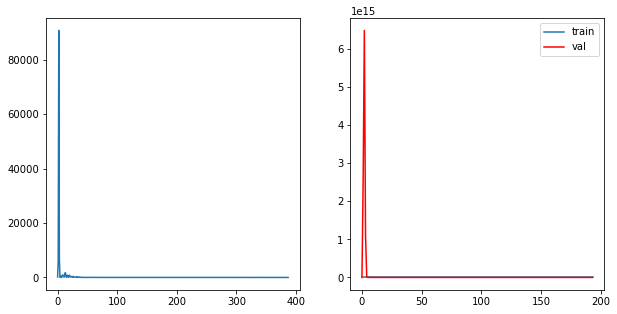

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3985, grad_fn=<MseLossBackward0>)
tensor(14.1658, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 194	 \Training Loss: 15.782158851623535	     Validation Loss:7.984169006347656	 \ LR:1.0000000000000004e-08


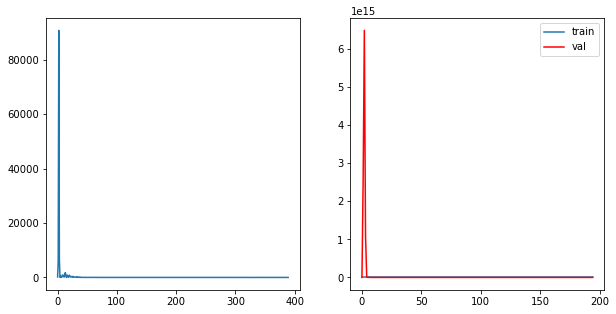

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.2284, grad_fn=<MseLossBackward0>)
tensor(13.7673, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 195	 \Training Loss: 15.497868537902832	     Validation Loss:7.844851493835449	 \ LR:1.0000000000000004e-08


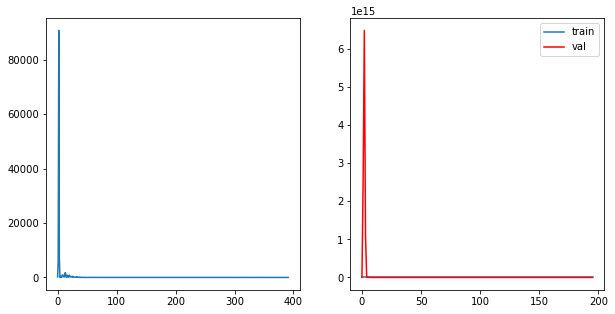

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(17.3371, grad_fn=<MseLossBackward0>)
tensor(14.8233, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 196	 \Training Loss: 16.080190181732178	     Validation Loss:6.377926826477051	 \ LR:1.0000000000000004e-08


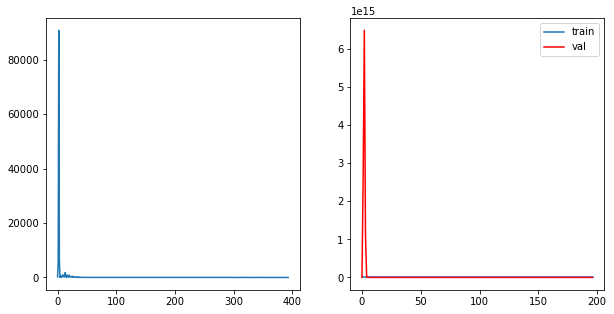

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.6747, grad_fn=<MseLossBackward0>)
tensor(13.7399, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 197	 \Training Loss: 14.707278728485107	     Validation Loss:7.499666690826416	 \ LR:1.0000000000000004e-08


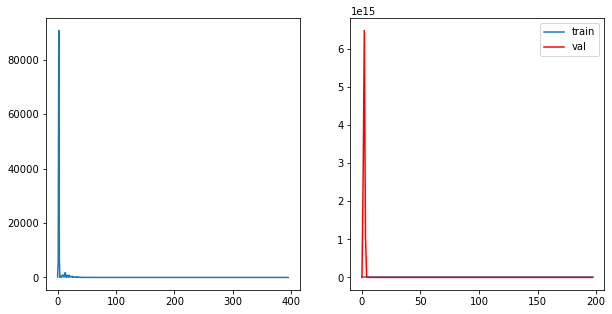

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(15.5444, grad_fn=<MseLossBackward0>)
tensor(13.8248, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 198	 \Training Loss: 14.684624195098877	     Validation Loss:6.882058143615723	 \ LR:1.0000000000000004e-08


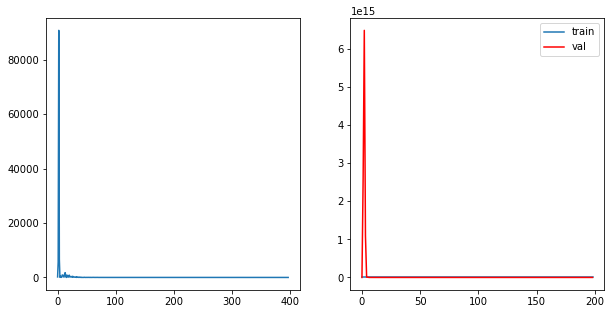

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(16.8071, grad_fn=<MseLossBackward0>)
tensor(12.9898, grad_fn=<MseLossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 199	 \Training Loss: 14.898462772369385	     Validation Loss:6.314284324645996	 \ LR:1.0000000000000004e-08


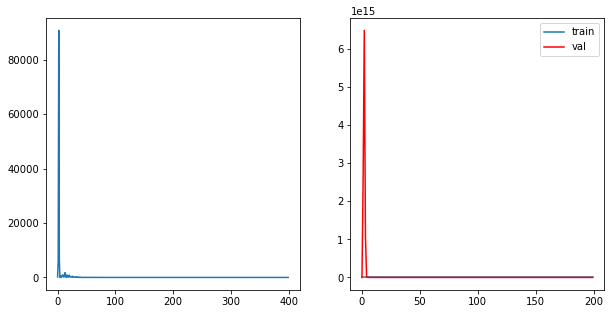

In [10]:
from tqdm.notebook import tqdm
step_losses = []
epoch_losses_train = []
epoch_losses_val = []
best_loss = 10000

for epoch in tqdm(range(epochs)):
    epoch_loss = 0
    epoch_loss_test = 0
    model.train()
    for X, Y in tqdm(data_loader, total=len(data_loader)):
        X, Y = X.to(device), Y.to(device)
        optimizer.zero_grad()
        Y_pred = model(X)
        loss = criterion(Y_pred, Y.float().view(-1, 1))
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        step_losses.append(loss.item())
        print(loss)
    if epoch % 5 == 0:
        state = {'info':  "house floors resnet_18 + imagenet MSE + aug "+str(optimizer.param_groups[0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    model.state_dict(),        # параметры модели
         'optimizer': optimizer.state_dict()}    # состояние оптимизатора
        torch.save(state, '/house_floors_resnet_18_MSE_aug_' + str(epoch)+ '.pth')
    with torch.no_grad():
        model.eval()
        for X, Y in tqdm(data_loader_val, total=len(data_loader_val), leave=False):
            X, Y = X.to(device), Y.to(device)
            Y_pred = model(X)
            loss_test = criterion(Y_pred, Y.float().view(-1, 1))
            epoch_loss_test += loss_test.item()
    if epoch_loss_test/len(data_loader_val)<best_loss:
        best_loss = epoch_loss_test/len(data_loader_val)
        best_model = model
        best_epoch = epoch
        best_optimizer = optimizer.state_dict()
    epoch_losses_val.append(epoch_loss_test/len(data_loader_val))
    epoch_losses_train.append(epoch_loss/len(data_loader))
    scheduler.step(epoch_loss_test/len(data_loader_val))
    curr_lr = optimizer.param_groups[0]['lr']
    
  
    print(f'Epoch {epoch}\t \Training Loss: {epoch_loss/len(data_loader)}\t \
    Validation Loss:{epoch_loss_test/len(data_loader_val)}\t \ LR:{curr_lr}')
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].plot(step_losses)
    axes[1].plot(epoch_losses_train, label = 'train')
    axes[1].plot(epoch_losses_val, color = 'red', label = 'val')
    axes[1].legend()
    plt.show()


Эксперимент №3: Лосс функция MAE на изначальные веса взяты из лучшего по знацению лоссфункции на валидации чекпоинта прошлого эксперимента. Значения оптимизатора тоже с прошлого эксперимента

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.1755, grad_fn=<L1LossBackward0>)
tensor(3.5138, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 3.8446375131607056	     Validation Loss:2.7464771270751953	 \ LR:0.01


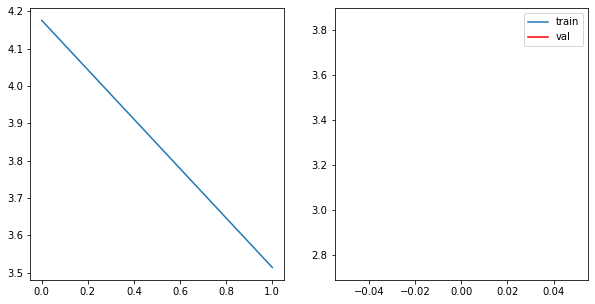

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(5.4822, grad_fn=<L1LossBackward0>)
tensor(5.6306, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 5.556387424468994	     Validation Loss:3.936816453933716	 \ LR:0.01


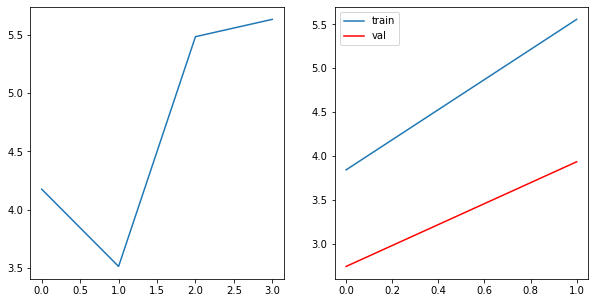

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(5.7562, grad_fn=<L1LossBackward0>)
tensor(5.6834, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 5.719803810119629	     Validation Loss:2.9364190101623535	 \ LR:0.01


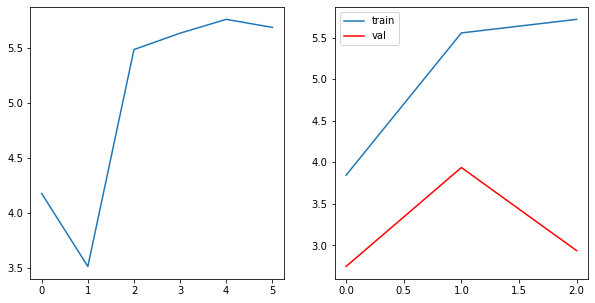

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(5.1713, grad_fn=<L1LossBackward0>)
tensor(4.0005, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 4.585891008377075	     Validation Loss:1.8240207433700562	 \ LR:0.01


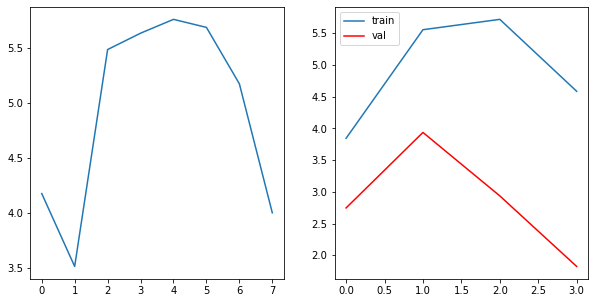

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.2915, grad_fn=<L1LossBackward0>)
tensor(2.9818, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 3.636653780937195	     Validation Loss:3.4495606422424316	 \ LR:0.01


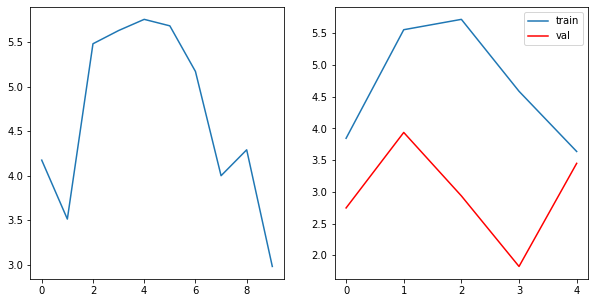

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.3991, grad_fn=<L1LossBackward0>)
tensor(3.8095, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 4.104315519332886	     Validation Loss:4.025188446044922	 \ LR:0.01


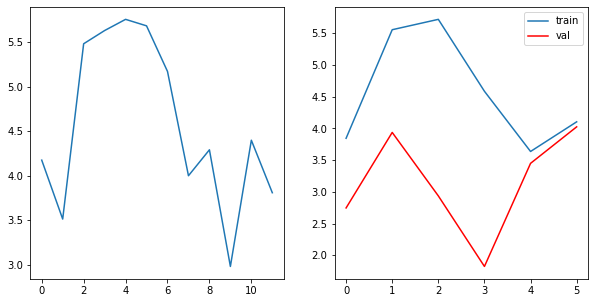

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(5.0800, grad_fn=<L1LossBackward0>)
tensor(3.8334, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 4.4566909074783325	     Validation Loss:3.7383906841278076	 \ LR:0.01


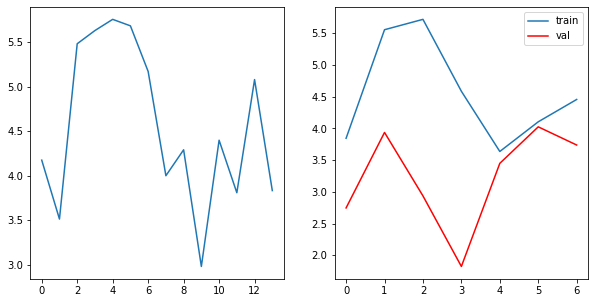

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.4447, grad_fn=<L1LossBackward0>)
tensor(3.2184, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 3.83157217502594	     Validation Loss:2.6082253456115723	 \ LR:0.01


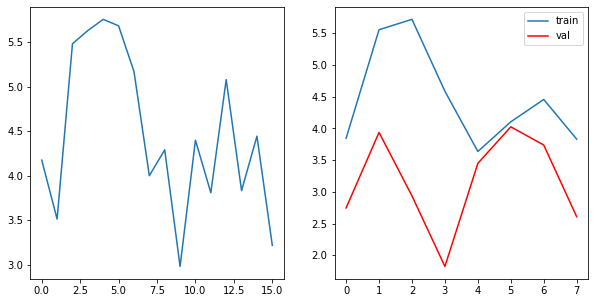

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8866, grad_fn=<L1LossBackward0>)
tensor(2.7109, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 3.298756957054138	     Validation Loss:1.705190896987915	 \ LR:0.01


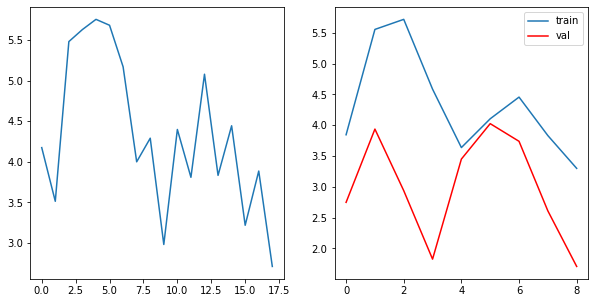

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.2569, grad_fn=<L1LossBackward0>)
tensor(3.4703, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 3.863561749458313	     Validation Loss:1.531028151512146	 \ LR:0.01


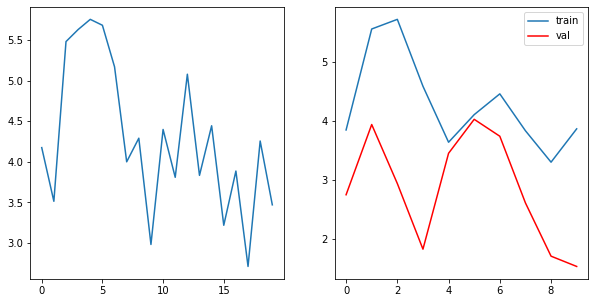

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.2804, grad_fn=<L1LossBackward0>)
tensor(3.1546, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 3.7174912691116333	     Validation Loss:1.9215939044952393	 \ LR:0.01


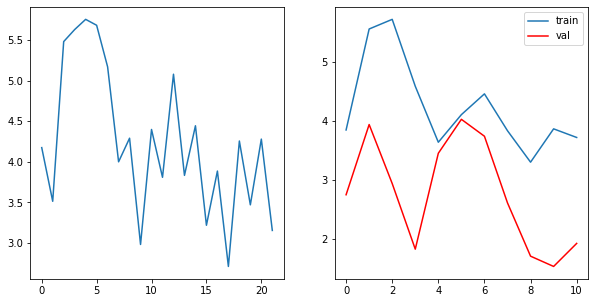

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.2393, grad_fn=<L1LossBackward0>)
tensor(2.7189, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 3.479075312614441	     Validation Loss:2.8963475227355957	 \ LR:0.01


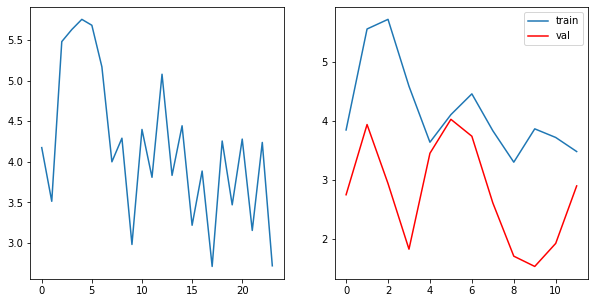

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.9332, grad_fn=<L1LossBackward0>)
tensor(3.1011, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 3.517184019088745	     Validation Loss:3.0786166191101074	 \ LR:0.01


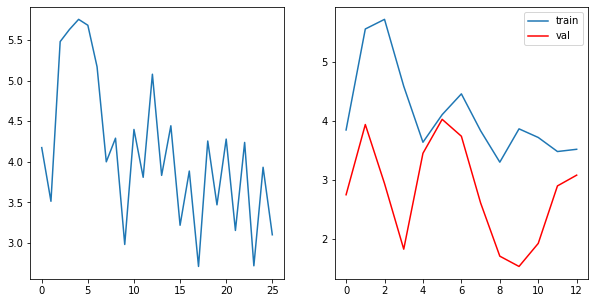

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8478, grad_fn=<L1LossBackward0>)
tensor(2.9389, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 3.3933651447296143	     Validation Loss:2.859182119369507	 \ LR:0.01


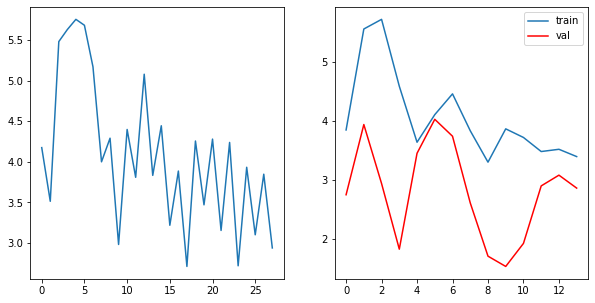

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8043, grad_fn=<L1LossBackward0>)
tensor(2.6179, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 3.2111011743545532	     Validation Loss:2.2570033073425293	 \ LR:0.01


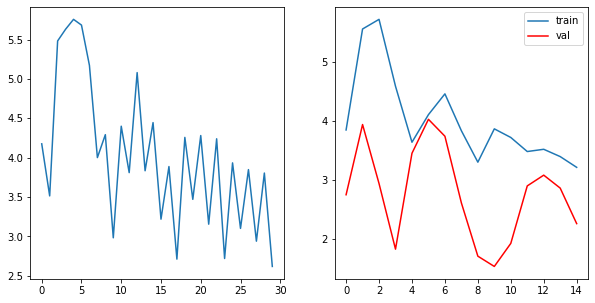

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.0604, grad_fn=<L1LossBackward0>)
tensor(2.5211, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 3.290725350379944	     Validation Loss:1.9378083944320679	 \ LR:0.01


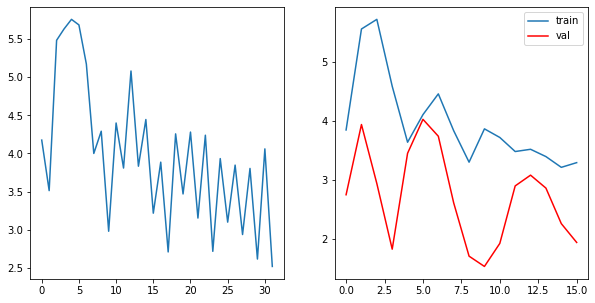

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8936, grad_fn=<L1LossBackward0>)
tensor(2.4496, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 3.1716151237487793	     Validation Loss:2.1497414112091064	 \ LR:0.01


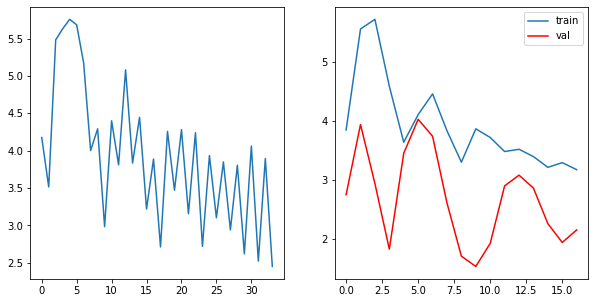

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7429, grad_fn=<L1LossBackward0>)
tensor(2.5478, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 3.14539635181427	     Validation Loss:2.440011739730835	 \ LR:0.01


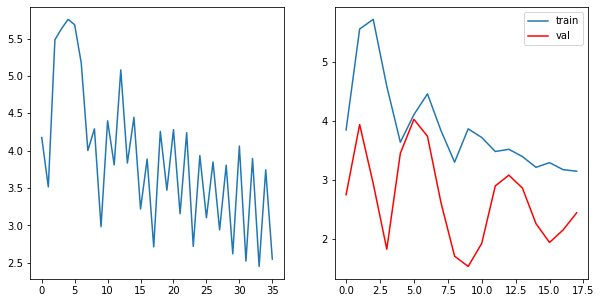

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7299, grad_fn=<L1LossBackward0>)
tensor(2.6486, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 3.1892406940460205	     Validation Loss:2.5523970127105713	 \ LR:0.01


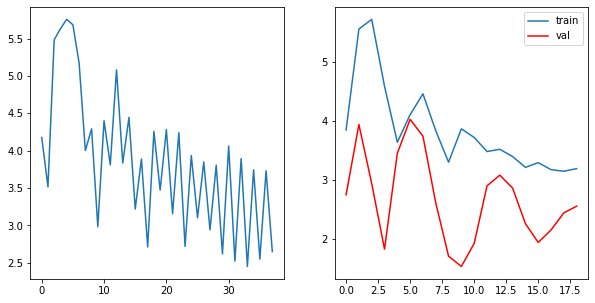

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6830, grad_fn=<L1LossBackward0>)
tensor(2.6092, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 3.1461029052734375	     Validation Loss:2.379932165145874	 \ LR:0.01


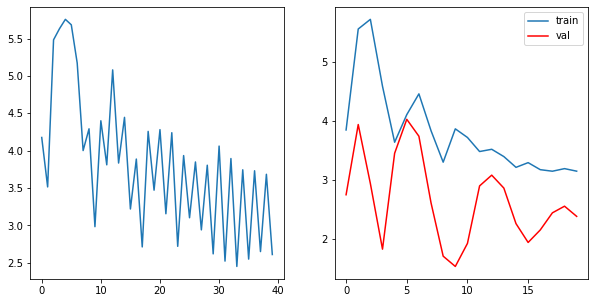

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.3847, grad_fn=<L1LossBackward0>)
tensor(2.5086, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 2.9466521739959717	     Validation Loss:2.1701297760009766	 \ LR:0.001


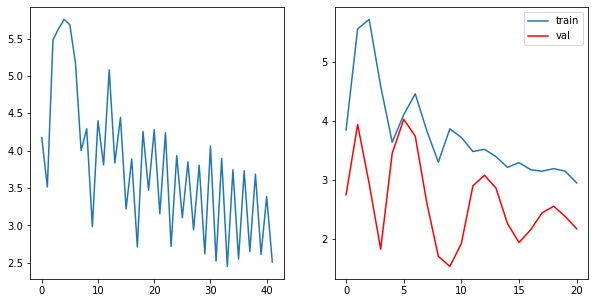

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6544, grad_fn=<L1LossBackward0>)
tensor(2.4984, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 3.0764113664627075	     Validation Loss:2.3544888496398926	 \ LR:0.001


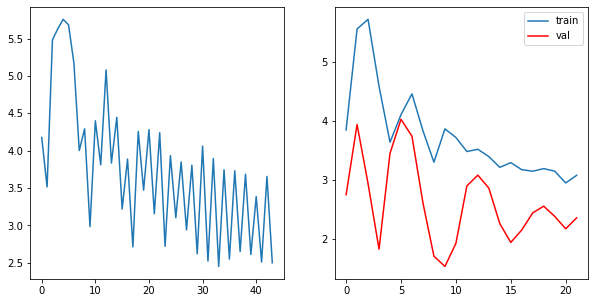

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7402, grad_fn=<L1LossBackward0>)
tensor(2.5395, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 3.139851689338684	     Validation Loss:2.177762508392334	 \ LR:0.001


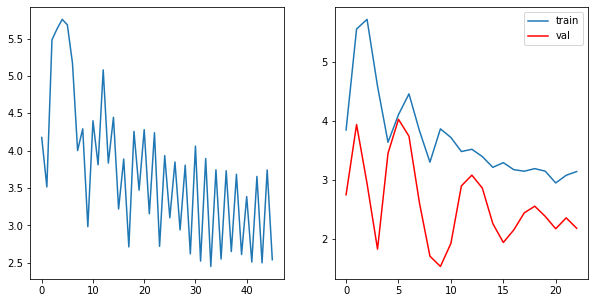

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.3908, grad_fn=<L1LossBackward0>)
tensor(2.5012, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 2.946001648902893	     Validation Loss:2.8204283714294434	 \ LR:0.001


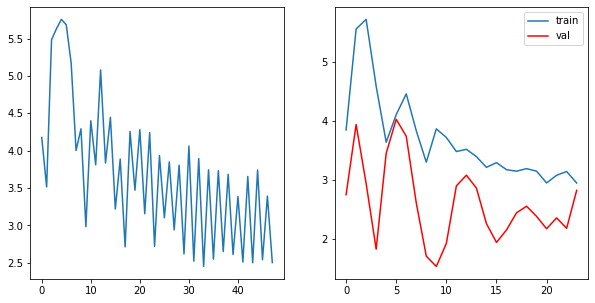

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6802, grad_fn=<L1LossBackward0>)
tensor(2.6076, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 3.14391553401947	     Validation Loss:2.844313859939575	 \ LR:0.001


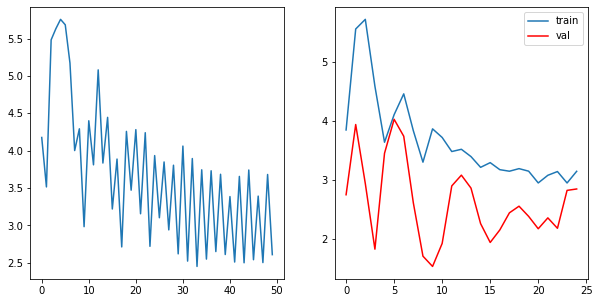

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.9033, grad_fn=<L1LossBackward0>)
tensor(2.5177, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 3.2105013132095337	     Validation Loss:2.379326581954956	 \ LR:0.001


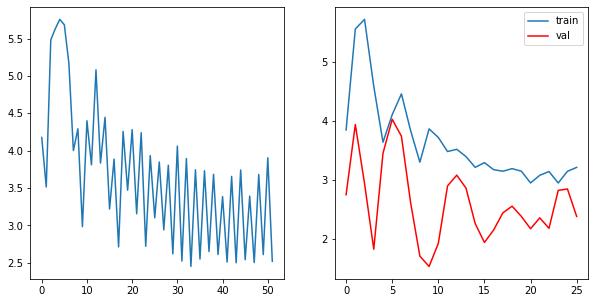

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5595, grad_fn=<L1LossBackward0>)
tensor(2.5648, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 3.0621676445007324	     Validation Loss:2.9274439811706543	 \ LR:0.001


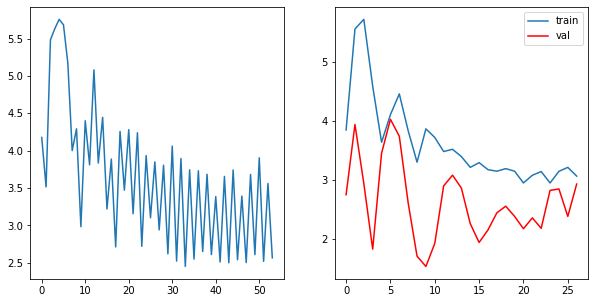

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8312, grad_fn=<L1LossBackward0>)
tensor(2.6198, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 3.2254749536514282	     Validation Loss:2.4257683753967285	 \ LR:0.001


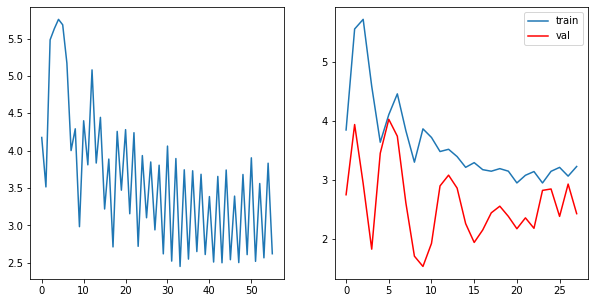

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8053, grad_fn=<L1LossBackward0>)
tensor(2.5404, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 3.172840714454651	     Validation Loss:2.946488857269287	 \ LR:0.001


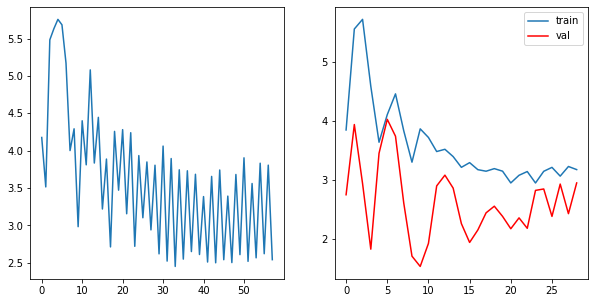

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8114, grad_fn=<L1LossBackward0>)
tensor(2.5002, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 3.155774474143982	     Validation Loss:2.4467244148254395	 \ LR:0.001


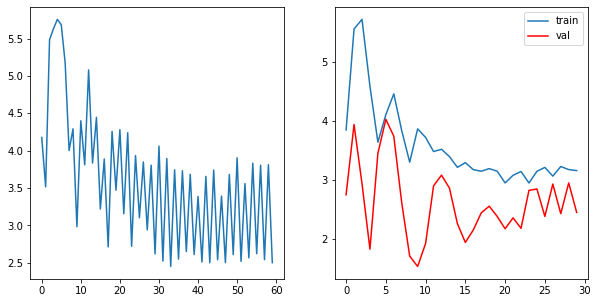

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6730, grad_fn=<L1LossBackward0>)
tensor(2.5811, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 3.12702214717865	     Validation Loss:2.4033021926879883	 \ LR:0.001


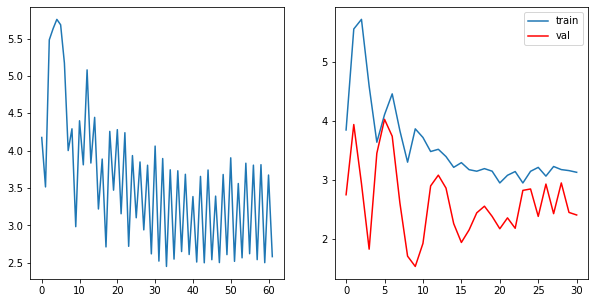

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6809, grad_fn=<L1LossBackward0>)
tensor(2.6668, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 3.1738643646240234	     Validation Loss:2.4344820976257324	 \ LR:0.0001


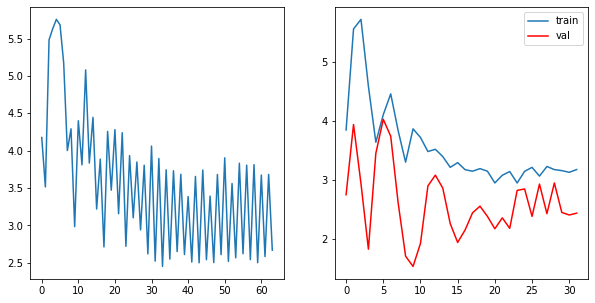

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4551, grad_fn=<L1LossBackward0>)
tensor(2.5251, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 2.990095019340515	     Validation Loss:2.979241371154785	 \ LR:0.0001


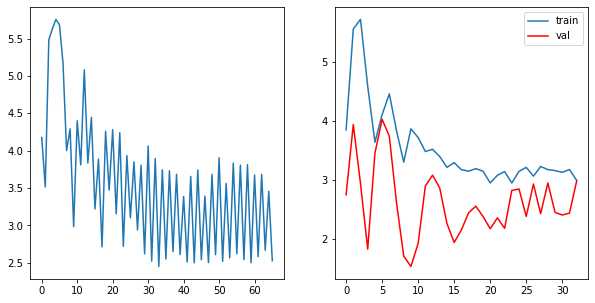

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6047, grad_fn=<L1LossBackward0>)
tensor(2.5197, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 3.0621678829193115	     Validation Loss:2.59971284866333	 \ LR:0.0001


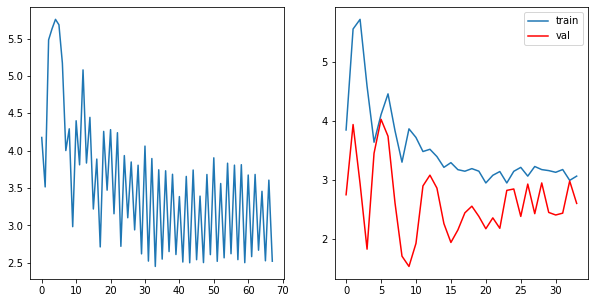

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6790, grad_fn=<L1LossBackward0>)
tensor(2.5280, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 3.103498697280884	     Validation Loss:2.299956798553467	 \ LR:0.0001


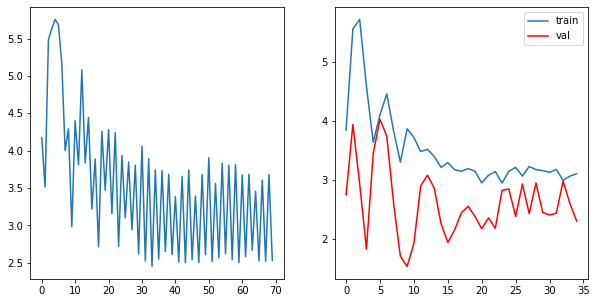

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6582, grad_fn=<L1LossBackward0>)
tensor(2.5664, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 3.1123348474502563	     Validation Loss:2.535175323486328	 \ LR:0.0001


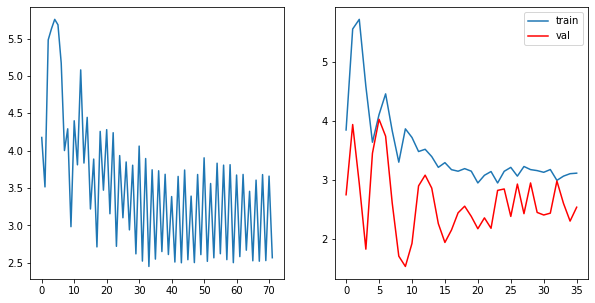

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6622, grad_fn=<L1LossBackward0>)
tensor(2.5119, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 3.087060570716858	     Validation Loss:2.450517416000366	 \ LR:0.0001


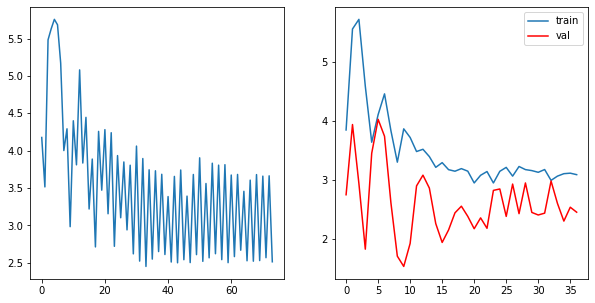

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7382, grad_fn=<L1LossBackward0>)
tensor(2.5708, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 3.1545082330703735	     Validation Loss:2.490779399871826	 \ LR:0.0001


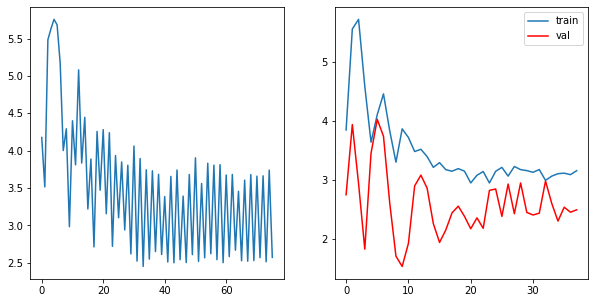

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4984, grad_fn=<L1LossBackward0>)
tensor(2.5315, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 3.014922261238098	     Validation Loss:2.5503292083740234	 \ LR:0.0001


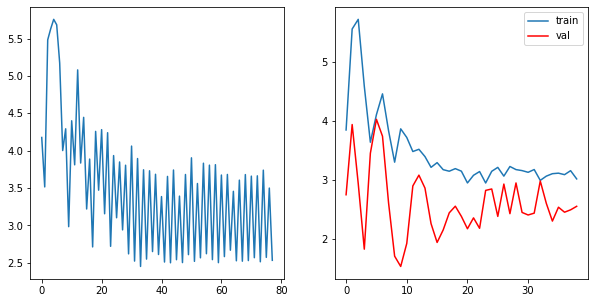

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7041, grad_fn=<L1LossBackward0>)
tensor(2.5423, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 3.123199224472046	     Validation Loss:2.5527756214141846	 \ LR:0.0001


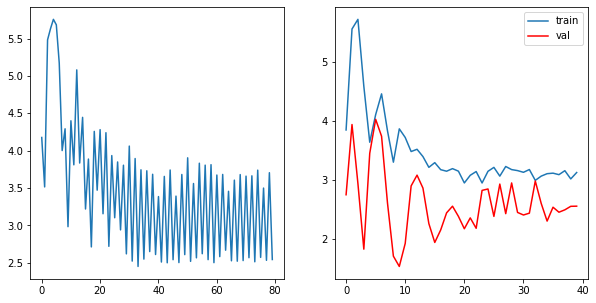

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4582, grad_fn=<L1LossBackward0>)
tensor(2.5180, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 40	 \Training Loss: 2.9881234169006348	     Validation Loss:2.4235892295837402	 \ LR:0.0001


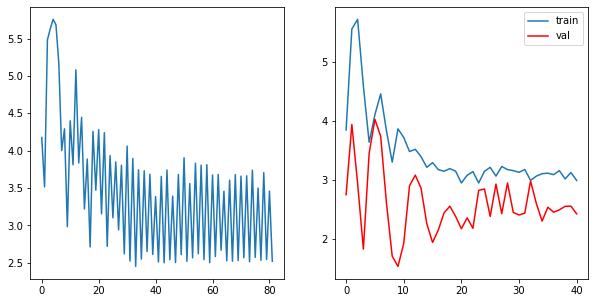

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6844, grad_fn=<L1LossBackward0>)
tensor(2.5163, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 41	 \Training Loss: 3.1003572940826416	     Validation Loss:2.2771127223968506	 \ LR:0.0001


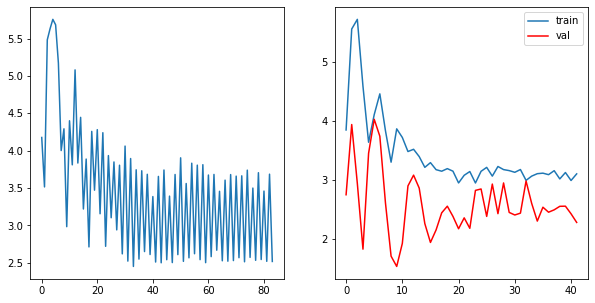

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6362, grad_fn=<L1LossBackward0>)
tensor(2.4506, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 42	 \Training Loss: 3.0433820486068726	     Validation Loss:2.9359190464019775	 \ LR:1e-05


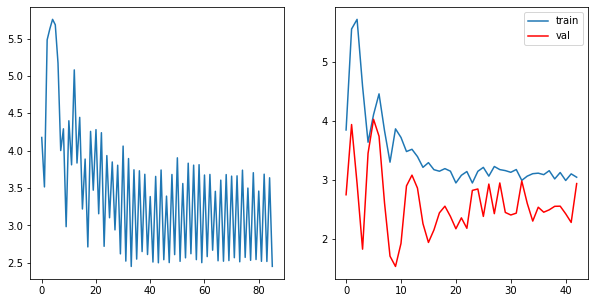

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6078, grad_fn=<L1LossBackward0>)
tensor(2.5204, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 43	 \Training Loss: 3.0641311407089233	     Validation Loss:2.504722833633423	 \ LR:1e-05


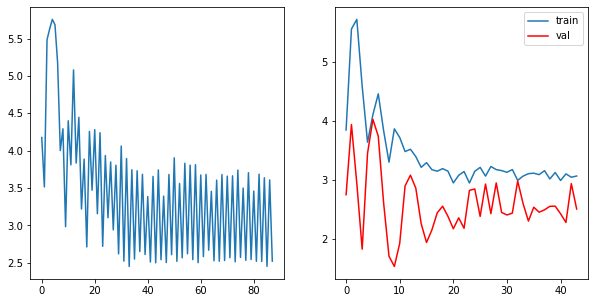

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4297, grad_fn=<L1LossBackward0>)
tensor(2.5531, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 44	 \Training Loss: 2.9913984537124634	     Validation Loss:2.4092087745666504	 \ LR:1e-05


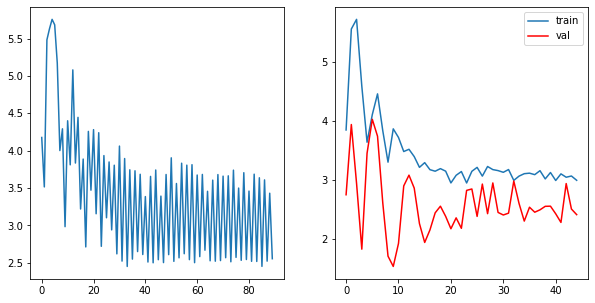

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.2826, grad_fn=<L1LossBackward0>)
tensor(2.4991, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 45	 \Training Loss: 2.890854835510254	     Validation Loss:2.3157503604888916	 \ LR:1e-05


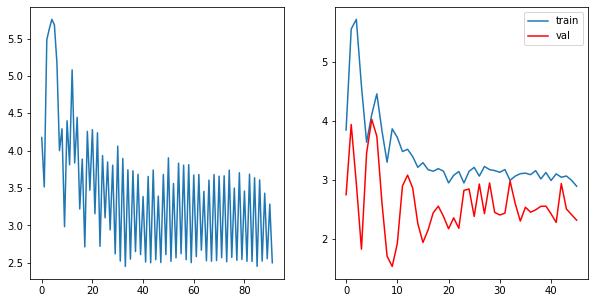

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6813, grad_fn=<L1LossBackward0>)
tensor(2.4843, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 46	 \Training Loss: 3.082771062850952	     Validation Loss:2.881838798522949	 \ LR:1e-05


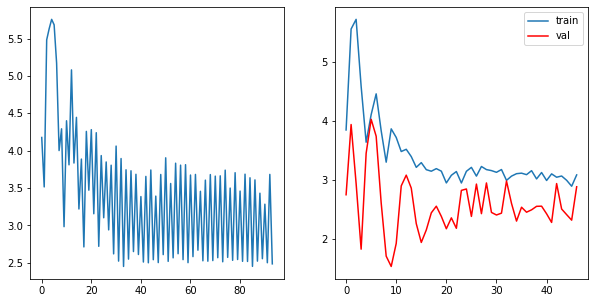

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6952, grad_fn=<L1LossBackward0>)
tensor(2.5525, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 47	 \Training Loss: 3.1238274574279785	     Validation Loss:2.4119081497192383	 \ LR:1e-05


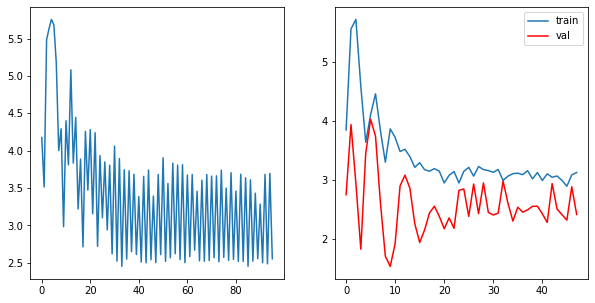

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8481, grad_fn=<L1LossBackward0>)
tensor(2.5195, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 48	 \Training Loss: 3.1837912797927856	     Validation Loss:2.4836409091949463	 \ LR:1e-05


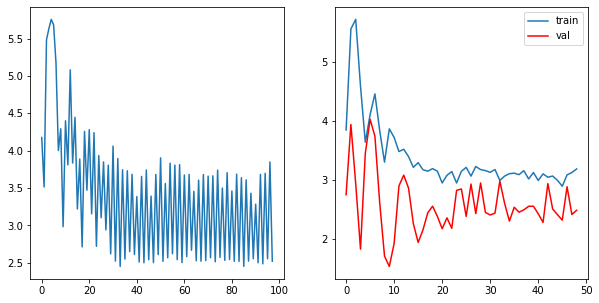

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5562, grad_fn=<L1LossBackward0>)
tensor(2.6014, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 49	 \Training Loss: 3.078809142112732	     Validation Loss:2.4937422275543213	 \ LR:1e-05


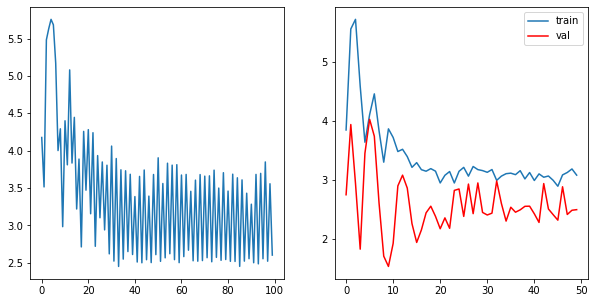

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5360, grad_fn=<L1LossBackward0>)
tensor(2.5087, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 50	 \Training Loss: 3.0223439931869507	     Validation Loss:2.463465690612793	 \ LR:1e-05


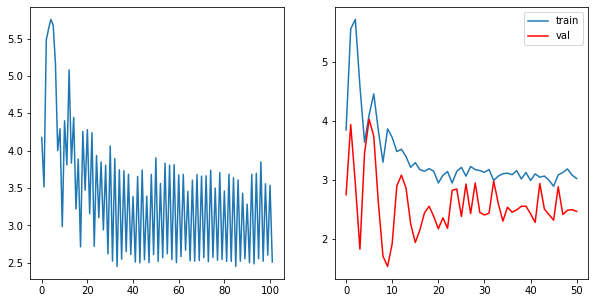

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8105, grad_fn=<L1LossBackward0>)
tensor(2.5532, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 51	 \Training Loss: 3.1818056106567383	     Validation Loss:2.4904026985168457	 \ LR:1e-05


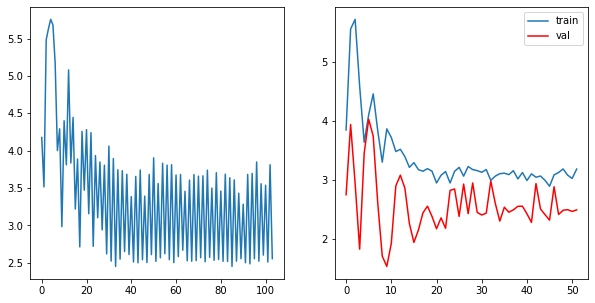

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.9567, grad_fn=<L1LossBackward0>)
tensor(2.5340, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 52	 \Training Loss: 3.2453325986862183	     Validation Loss:2.924798011779785	 \ LR:1e-05


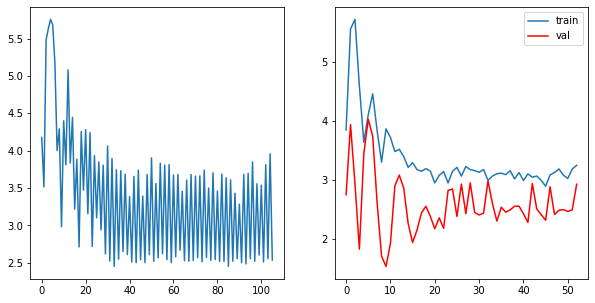

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.9130, grad_fn=<L1LossBackward0>)
tensor(2.4836, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 53	 \Training Loss: 3.1983394622802734	     Validation Loss:2.2506182193756104	 \ LR:1.0000000000000002e-06


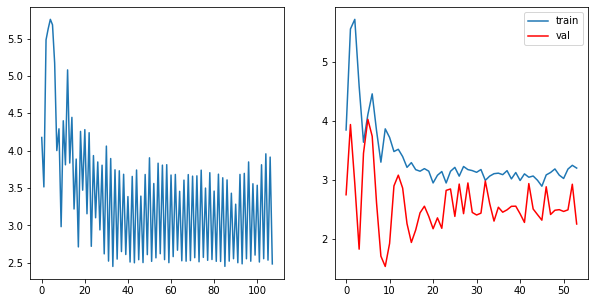

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6776, grad_fn=<L1LossBackward0>)
tensor(2.5148, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 54	 \Training Loss: 3.0962188243865967	     Validation Loss:2.271937370300293	 \ LR:1.0000000000000002e-06


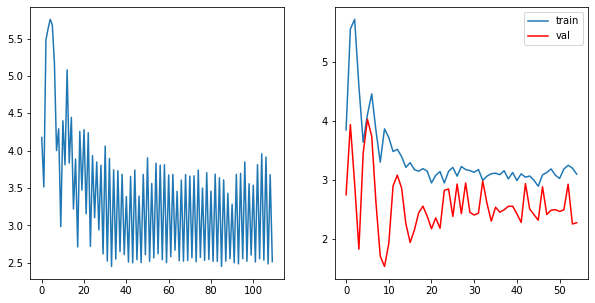

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5382, grad_fn=<L1LossBackward0>)
tensor(2.5495, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 55	 \Training Loss: 3.0438531637191772	     Validation Loss:2.2470903396606445	 \ LR:1.0000000000000002e-06


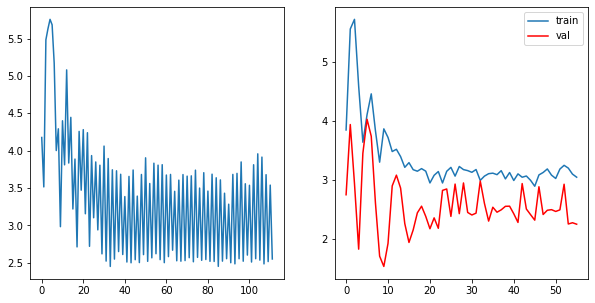

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7328, grad_fn=<L1LossBackward0>)
tensor(2.5103, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 56	 \Training Loss: 3.1215652227401733	     Validation Loss:2.92854642868042	 \ LR:1.0000000000000002e-06


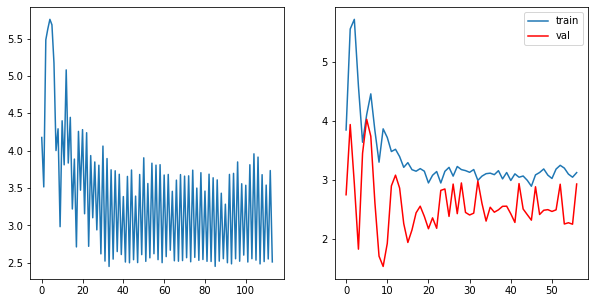

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5911, grad_fn=<L1LossBackward0>)
tensor(2.5627, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 57	 \Training Loss: 3.0768882036209106	     Validation Loss:2.490215539932251	 \ LR:1.0000000000000002e-06


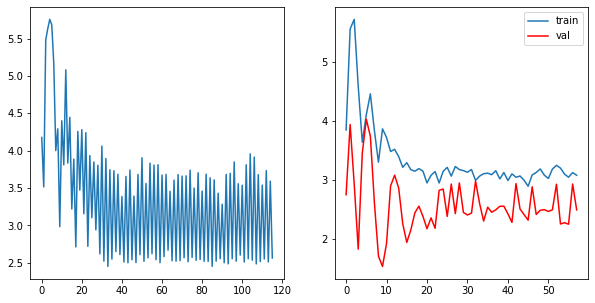

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7639, grad_fn=<L1LossBackward0>)
tensor(2.5322, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 58	 \Training Loss: 3.148049473762512	     Validation Loss:2.9012949466705322	 \ LR:1.0000000000000002e-06


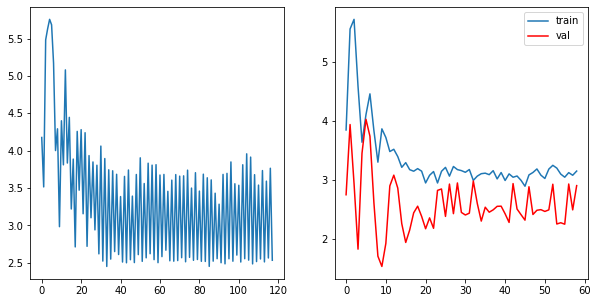

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7843, grad_fn=<L1LossBackward0>)
tensor(2.5578, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 59	 \Training Loss: 3.171061635017395	     Validation Loss:2.9356627464294434	 \ LR:1.0000000000000002e-06


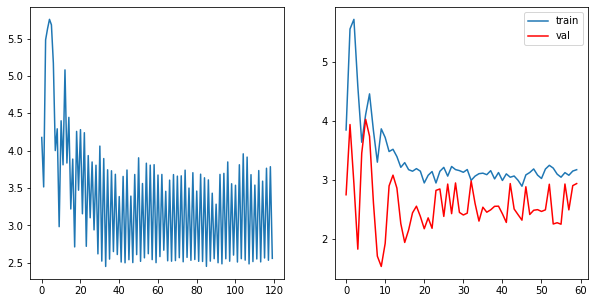

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6486, grad_fn=<L1LossBackward0>)
tensor(2.5586, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 60	 \Training Loss: 3.10357129573822	     Validation Loss:2.254481792449951	 \ LR:1.0000000000000002e-06


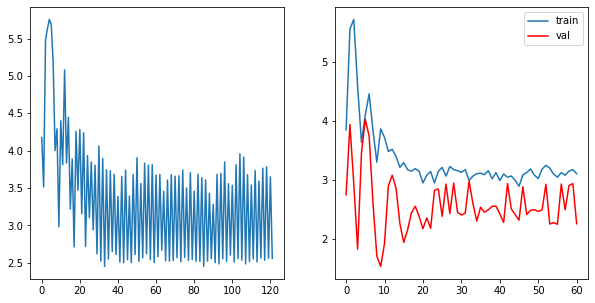

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6426, grad_fn=<L1LossBackward0>)
tensor(2.4797, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 61	 \Training Loss: 3.0611687898635864	     Validation Loss:2.4146440029144287	 \ LR:1.0000000000000002e-06


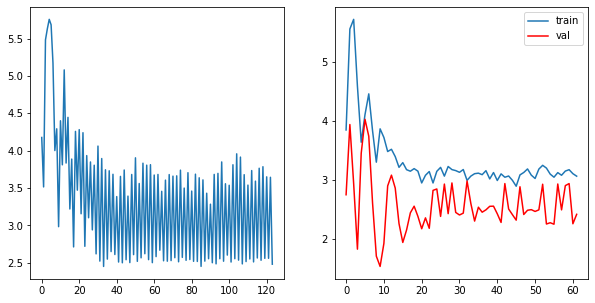

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7232, grad_fn=<L1LossBackward0>)
tensor(2.4713, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 62	 \Training Loss: 3.0972636938095093	     Validation Loss:2.2413759231567383	 \ LR:1.0000000000000002e-06


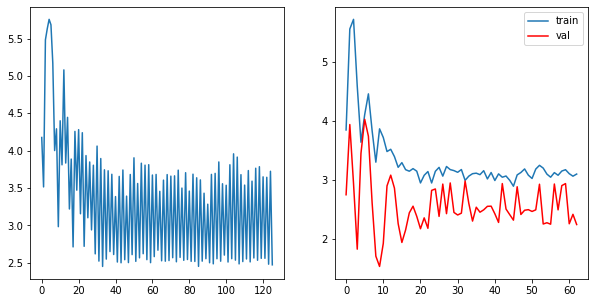

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6012, grad_fn=<L1LossBackward0>)
tensor(2.5863, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 63	 \Training Loss: 3.093742609024048	     Validation Loss:2.963902473449707	 \ LR:1.0000000000000002e-06


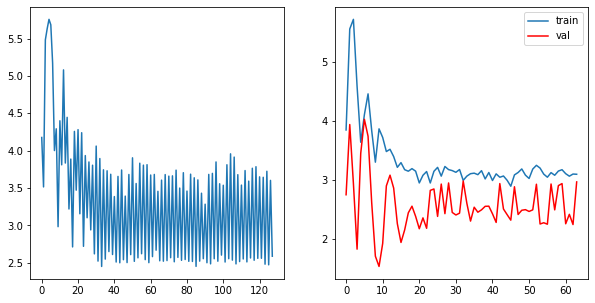

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8728, grad_fn=<L1LossBackward0>)
tensor(2.6021, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 64	 \Training Loss: 3.237434148788452	     Validation Loss:2.961430072784424	 \ LR:1.0000000000000002e-07


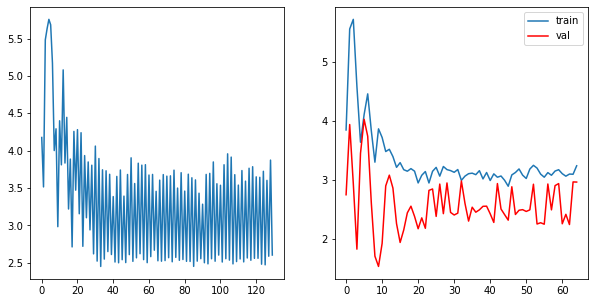

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6277, grad_fn=<L1LossBackward0>)
tensor(2.5012, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 65	 \Training Loss: 3.064484715461731	     Validation Loss:2.557831048965454	 \ LR:1.0000000000000002e-07


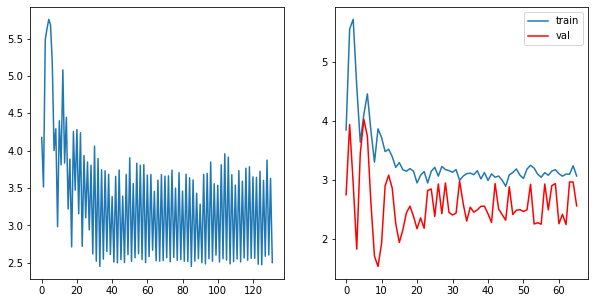

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8463, grad_fn=<L1LossBackward0>)
tensor(2.5194, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 66	 \Training Loss: 3.1828463077545166	     Validation Loss:2.1895556449890137	 \ LR:1.0000000000000002e-07


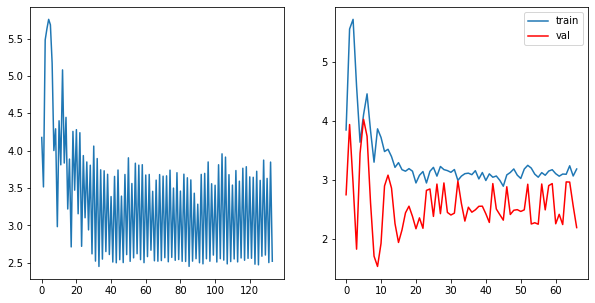

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.2910, grad_fn=<L1LossBackward0>)
tensor(2.5102, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 67	 \Training Loss: 2.9006305932998657	     Validation Loss:2.3930623531341553	 \ LR:1.0000000000000002e-07


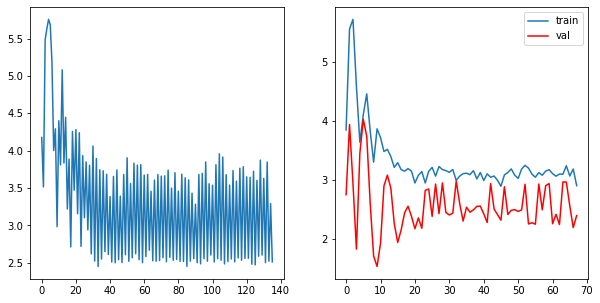

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6534, grad_fn=<L1LossBackward0>)
tensor(2.5073, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 68	 \Training Loss: 3.0803825855255127	     Validation Loss:2.913203239440918	 \ LR:1.0000000000000002e-07


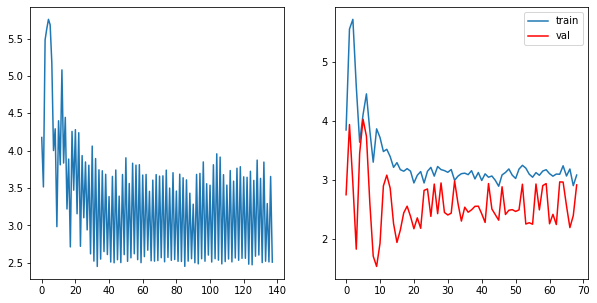

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7448, grad_fn=<L1LossBackward0>)
tensor(2.4890, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 69	 \Training Loss: 3.1168757677078247	     Validation Loss:2.4579758644104004	 \ LR:1.0000000000000002e-07


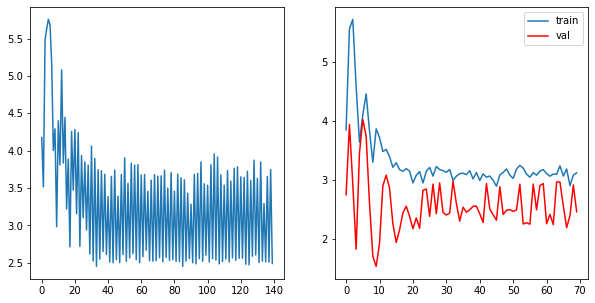

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6789, grad_fn=<L1LossBackward0>)
tensor(2.4687, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 70	 \Training Loss: 3.0738290548324585	     Validation Loss:2.154695749282837	 \ LR:1.0000000000000002e-07


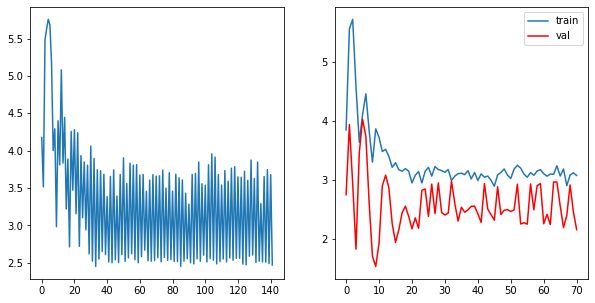

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.9879, grad_fn=<L1LossBackward0>)
tensor(2.5536, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 71	 \Training Loss: 3.270755410194397	     Validation Loss:2.3812060356140137	 \ LR:1.0000000000000002e-07


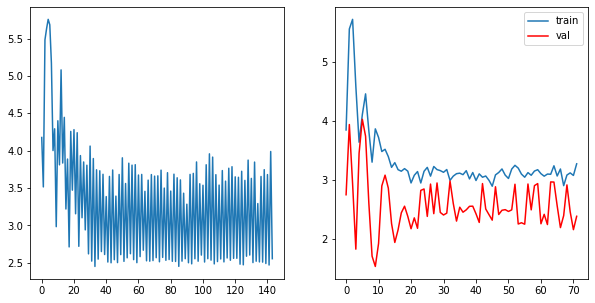

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6602, grad_fn=<L1LossBackward0>)
tensor(2.5261, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 72	 \Training Loss: 3.0931148529052734	     Validation Loss:2.36814284324646	 \ LR:1.0000000000000002e-07


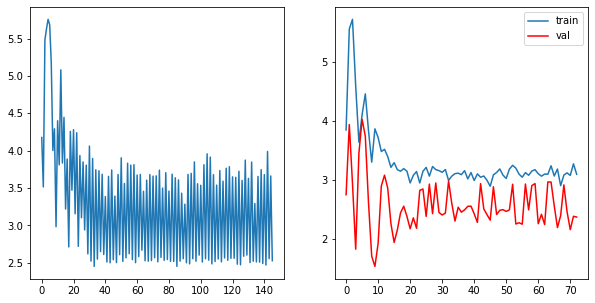

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6695, grad_fn=<L1LossBackward0>)
tensor(2.5774, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 73	 \Training Loss: 3.123463749885559	     Validation Loss:2.1830389499664307	 \ LR:1.0000000000000002e-07


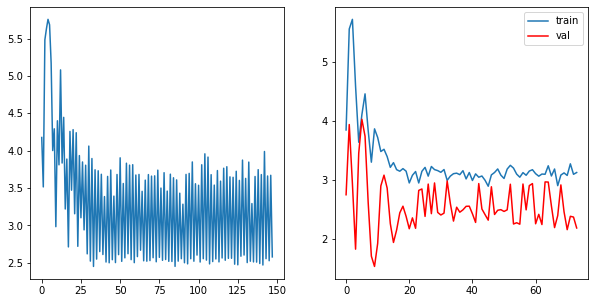

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6351, grad_fn=<L1LossBackward0>)
tensor(2.4972, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 74	 \Training Loss: 3.0661791563034058	     Validation Loss:2.8928353786468506	 \ LR:1.0000000000000002e-07


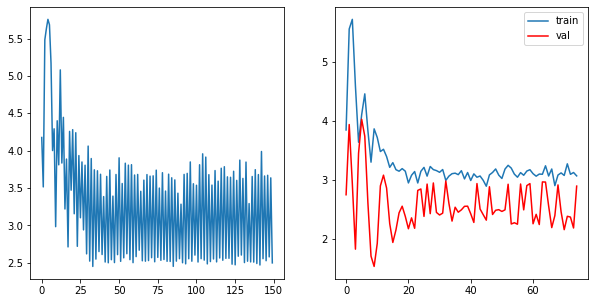

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6364, grad_fn=<L1LossBackward0>)
tensor(2.5083, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 75	 \Training Loss: 3.072344183921814	     Validation Loss:2.9112048149108887	 \ LR:1.0000000000000004e-08


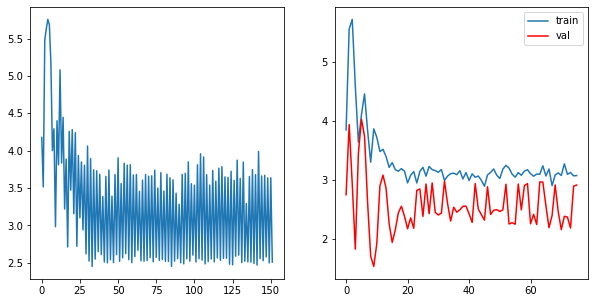

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5595, grad_fn=<L1LossBackward0>)
tensor(2.5749, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 76	 \Training Loss: 3.067197322845459	     Validation Loss:2.7213406562805176	 \ LR:1.0000000000000004e-08


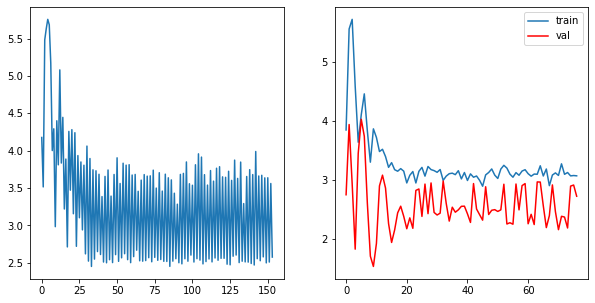

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5777, grad_fn=<L1LossBackward0>)
tensor(2.5505, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 77	 \Training Loss: 3.0641093254089355	     Validation Loss:2.4488940238952637	 \ LR:1.0000000000000004e-08


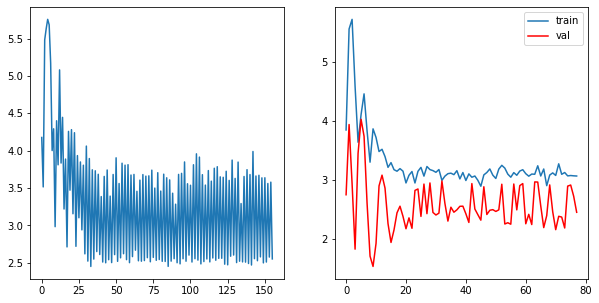

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7790, grad_fn=<L1LossBackward0>)
tensor(2.5407, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 78	 \Training Loss: 3.1598119735717773	     Validation Loss:2.463261127471924	 \ LR:1.0000000000000004e-08


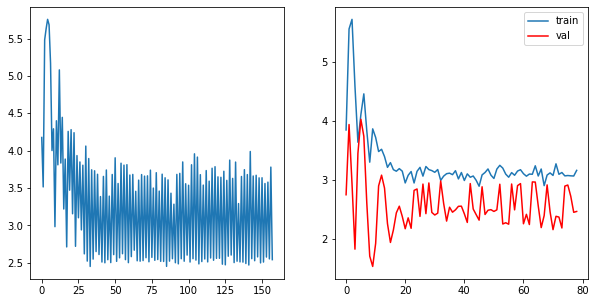

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6045, grad_fn=<L1LossBackward0>)
tensor(2.4616, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 79	 \Training Loss: 3.0330389738082886	     Validation Loss:2.5469954013824463	 \ LR:1.0000000000000004e-08


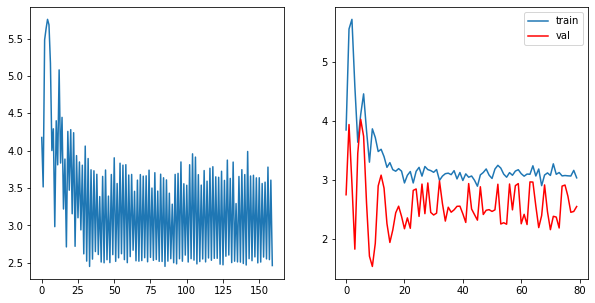

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.7848, grad_fn=<L1LossBackward0>)
tensor(2.4715, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 80	 \Training Loss: 3.1281765699386597	     Validation Loss:2.939274311065674	 \ LR:1.0000000000000004e-08


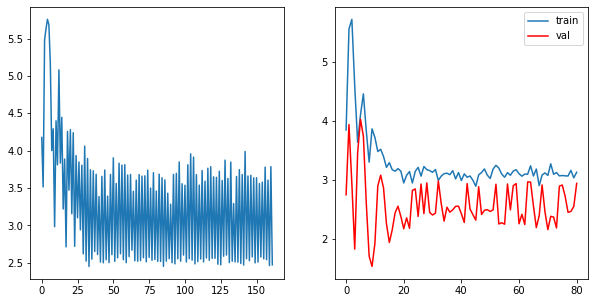

  0%|          | 0/2 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [11]:
from tqdm.notebook import tqdm
step_losses = []
epoch_losses_train = []
epoch_losses_val = []
best_loss = 10000

for epoch in tqdm(range(epochs)):
    epoch_loss = 0
    epoch_loss_test = 0
    model.train()
    for X, Y in tqdm(data_loader, total=len(data_loader)):
        X, Y = X.to(device), Y.to(device)
        optimizer.zero_grad()
        Y_pred = model(X)
        loss = criterion(Y_pred, Y.float().view(-1, 1))
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        step_losses.append(loss.item())
        print(loss)
    if epoch % 5 == 0:
        state = {'info':  "house floors resnet_18 MAE + aug checkpoint: house_floors_resnet_18_MSE_aug_65  "+str(optimizer.param_groups[0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    model.state_dict(),        # параметры модели
         'optimizer': optimizer.state_dict()}    # состояние оптимизатора
        torch.save(state, '/house_floors_checkpoint_MaE_aug_' + str(epoch)+ '.pth')
    with torch.no_grad():
        model.eval()
        for X, Y in tqdm(data_loader_val, total=len(data_loader_val), leave=False):
            X, Y = X.to(device), Y.to(device)
            Y_pred = model(X)
            loss_test = criterion(Y_pred, Y.float().view(-1, 1))
            epoch_loss_test += loss_test.item()
    if epoch_loss_test/len(data_loader_val)<best_loss:
        best_loss = epoch_loss_test/len(data_loader_val)
        best_model = model
        best_epoch = epoch
        best_optimizer = optimizer.state_dict()
    epoch_losses_val.append(epoch_loss_test/len(data_loader_val))
    epoch_losses_train.append(epoch_loss/len(data_loader))
    scheduler.step(epoch_loss_test/len(data_loader_val))
    curr_lr = optimizer.param_groups[0]['lr']
    
  
    print(f'Epoch {epoch}\t \Training Loss: {epoch_loss/len(data_loader)}\t \
    Validation Loss:{epoch_loss_test/len(data_loader_val)}\t \ LR:{curr_lr}')
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].plot(step_losses)
    axes[1].plot(epoch_losses_train, label = 'train')
    axes[1].plot(epoch_losses_val, color = 'red', label = 'val')
    axes[1].legend()
    plt.show()


Сохраняем лучшую модель

In [43]:
state = {'info':  "BEST house floors resnet_18 MAE + aug checkpoint: house_floors_resnet_18_MSE_aug_65 random optimizer  "+str(best_optimizer['param_groups'][0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    best_model.state_dict(),        # параметры модели
         'optimizer': best_optimizer}    # состояние оптимизатора
torch.save(state, '/house_floors_checkpoint_BEST_MaE_aug_random_optimizer_' + str(best_epoch)+ '.pth')

Эксперимент №4: Лосс функция MAE на изначальные веса взяты из лучшего по знацению лоссфункции на валидации чекпоинта эксперимента №2. Значения оптимизатора случайные

In [33]:
state = torch.load('/house_floors_resnet_18_MSE_aug_65.pth', map_location=torch.device('cpu'))
model = resnet18(pretrained_model=pretrained_model)
#optimizer = optim.Adam(model.parameters(), lr=0.001)
model.load_state_dict(state['model'])        # получаем параметры модели
#optimizer.load_state_dict(state['optimizer'])    # получаем состояние оптимизатора

print(state['info'], state['date'])
#optimizer.param_groups[0]['lr'] = 0.01

house floors resnet_18 + imagenet MSE + aug 0.0001 2023-03-12 19:41:17.133007


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.1004, grad_fn=<L1LossBackward0>)
tensor(219.4919, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 111.29614865779877	     Validation Loss:599.4908447265625	 \ LR:0.01


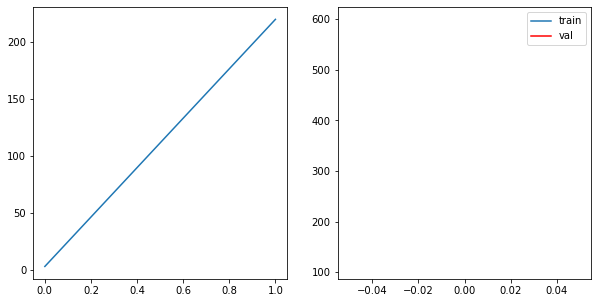

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(50.5214, grad_fn=<L1LossBackward0>)
tensor(79.5676, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 65.04449844360352	     Validation Loss:791.7496948242188	 \ LR:0.01


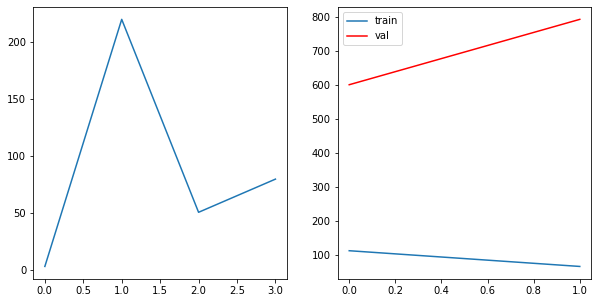

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(50.2065, grad_fn=<L1LossBackward0>)
tensor(12.9773, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 31.591893672943115	     Validation Loss:209.41506958007812	 \ LR:0.01


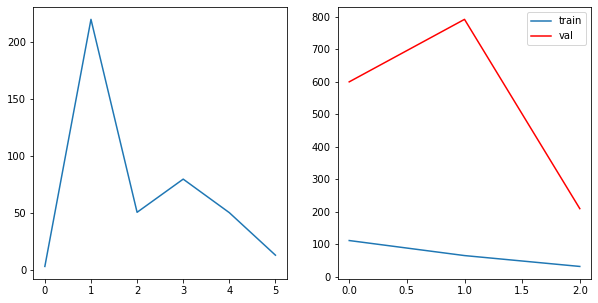

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(27.4861, grad_fn=<L1LossBackward0>)
tensor(41.0491, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 34.26762294769287	     Validation Loss:57.47179412841797	 \ LR:0.01


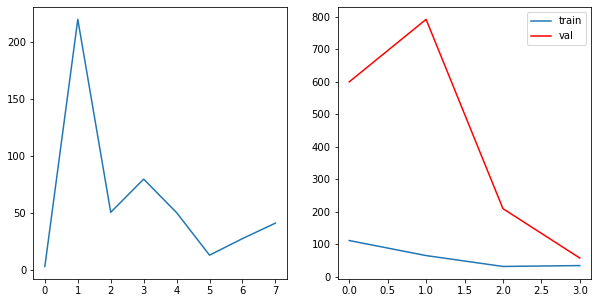

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(12.6740, grad_fn=<L1LossBackward0>)
tensor(14.5849, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 13.629437446594238	     Validation Loss:13073.986328125	 \ LR:0.01


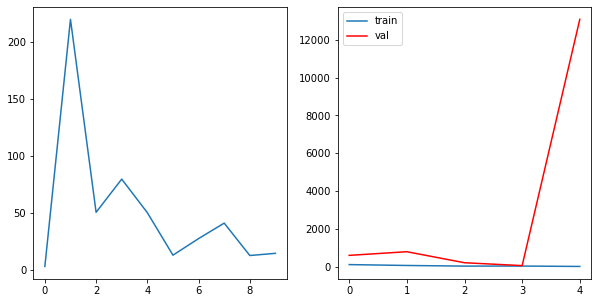

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(31.2903, grad_fn=<L1LossBackward0>)
tensor(18.5115, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 24.900897979736328	     Validation Loss:2437.833740234375	 \ LR:0.01


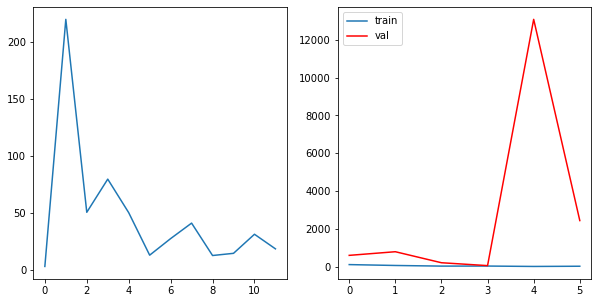

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(10.2951, grad_fn=<L1LossBackward0>)
tensor(23.7788, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 17.036965370178223	     Validation Loss:2243.8291015625	 \ LR:0.01


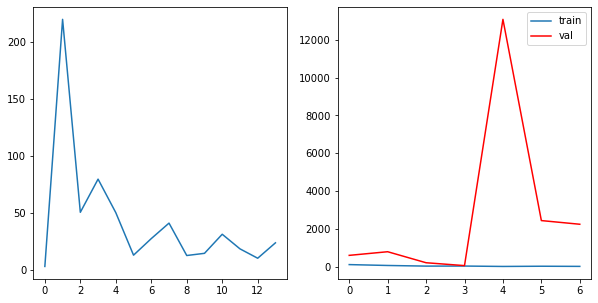

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(23.1050, grad_fn=<L1LossBackward0>)
tensor(12.7426, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 17.923775672912598	     Validation Loss:6698.91943359375	 \ LR:0.01


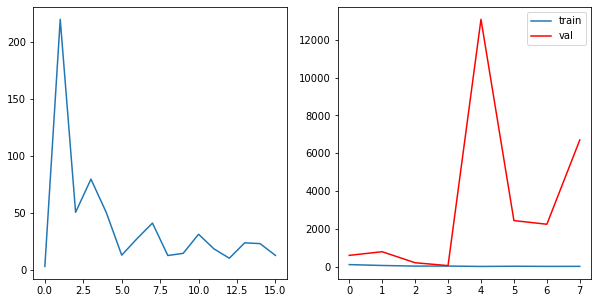

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(8.2452, grad_fn=<L1LossBackward0>)
tensor(16.5629, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 12.40403127670288	     Validation Loss:4929.71240234375	 \ LR:0.01


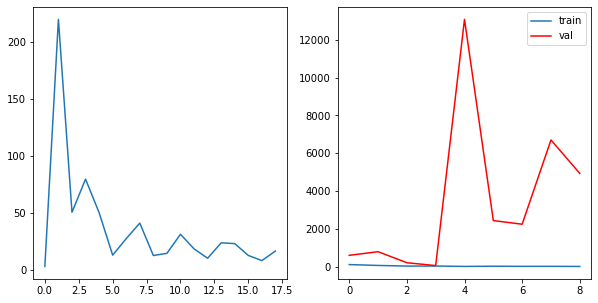

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(13.4368, grad_fn=<L1LossBackward0>)
tensor(11.5490, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 12.492910861968994	     Validation Loss:74.2136001586914	 \ LR:0.01


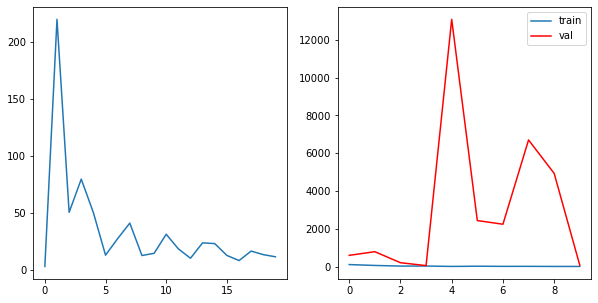

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.2658, grad_fn=<L1LossBackward0>)
tensor(6.3802, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 5.3229992389678955	     Validation Loss:30.8221492767334	 \ LR:0.01


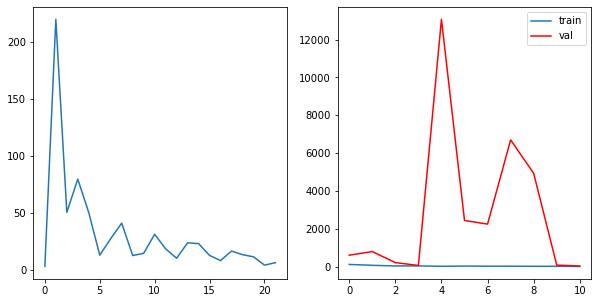

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(6.9091, grad_fn=<L1LossBackward0>)
tensor(9.1714, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 8.040272951126099	     Validation Loss:12.179781913757324	 \ LR:0.01


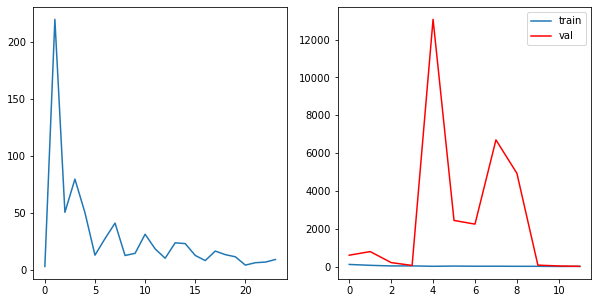

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(6.8241, grad_fn=<L1LossBackward0>)
tensor(6.6522, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 6.738158941268921	     Validation Loss:2.774463176727295	 \ LR:0.01


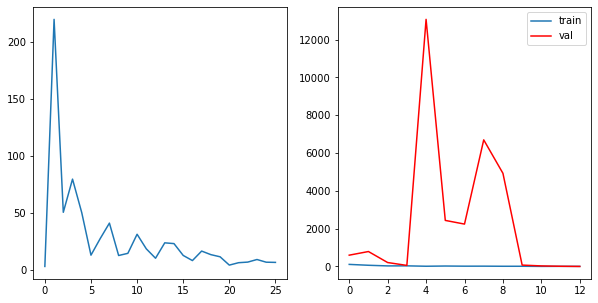

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6147, grad_fn=<L1LossBackward0>)
tensor(5.3132, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 4.463910341262817	     Validation Loss:8.259241104125977	 \ LR:0.01


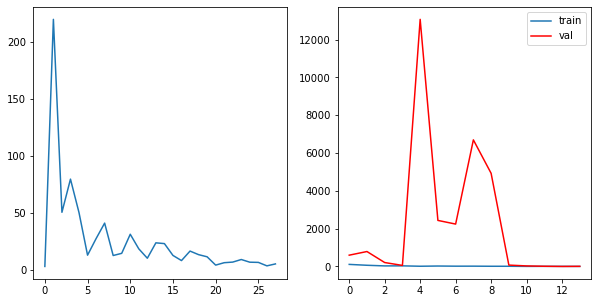

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.7806, grad_fn=<L1LossBackward0>)
tensor(6.1504, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 5.465480327606201	     Validation Loss:3.106990098953247	 \ LR:0.01


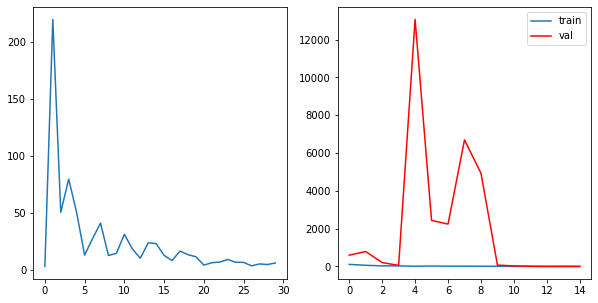

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4416, grad_fn=<L1LossBackward0>)
tensor(4.4393, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 3.9404410123825073	     Validation Loss:6.317720890045166	 \ LR:0.01


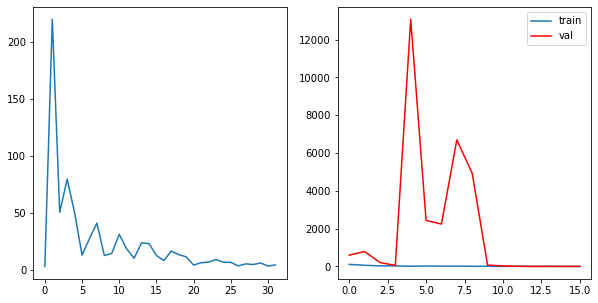

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5624, grad_fn=<L1LossBackward0>)
tensor(5.2010, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 4.381682395935059	     Validation Loss:4.0654754638671875	 \ LR:0.01


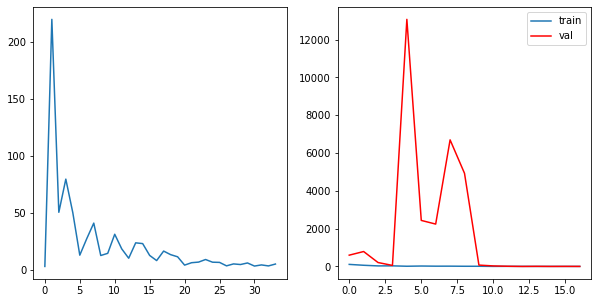

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5681, grad_fn=<L1LossBackward0>)
tensor(5.2738, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 3.920948028564453	     Validation Loss:47.739601135253906	 \ LR:0.01


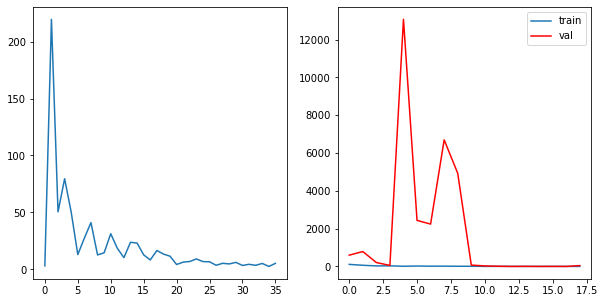

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.7776, grad_fn=<L1LossBackward0>)
tensor(5.2472, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 5.012395858764648	     Validation Loss:8.541465759277344	 \ LR:0.01


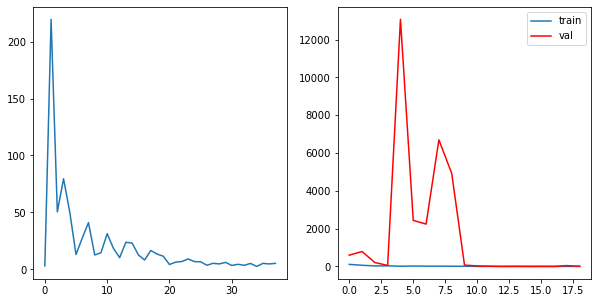

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9625, grad_fn=<L1LossBackward0>)
tensor(5.8873, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 4.424928545951843	     Validation Loss:27.8806095123291	 \ LR:0.01


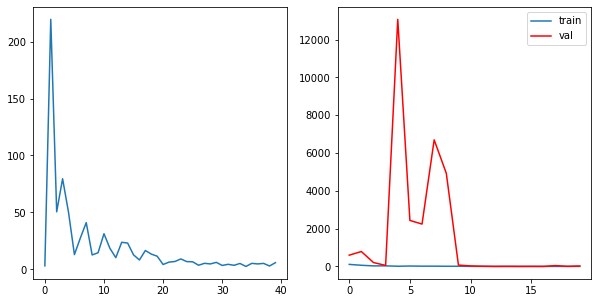

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6623, grad_fn=<L1LossBackward0>)
tensor(6.4918, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 5.077064871788025	     Validation Loss:9.569131851196289	 \ LR:0.01


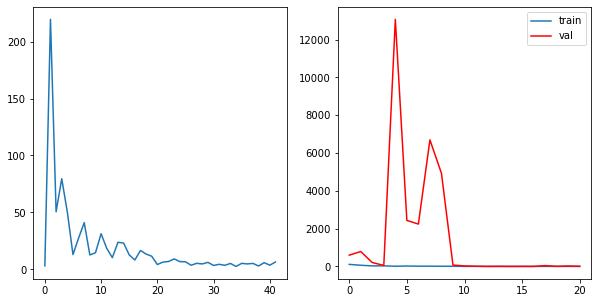

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9703, grad_fn=<L1LossBackward0>)
tensor(4.5501, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 3.7601836919784546	     Validation Loss:7.505188941955566	 \ LR:0.01


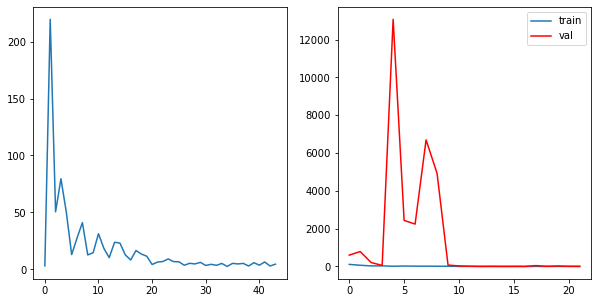

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.5286, grad_fn=<L1LossBackward0>)
tensor(4.7654, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 4.147042155265808	     Validation Loss:13.365078926086426	 \ LR:0.01


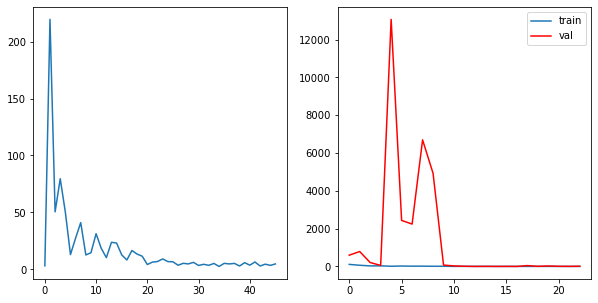

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(4.7090, grad_fn=<L1LossBackward0>)
tensor(4.6682, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 4.688591003417969	     Validation Loss:4.544533729553223	 \ LR:0.001


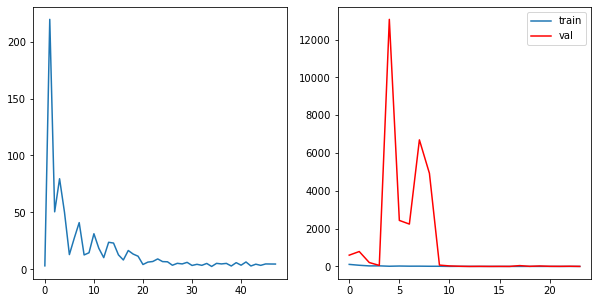

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.8001, grad_fn=<L1LossBackward0>)
tensor(4.2312, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 4.015608549118042	     Validation Loss:2.3242945671081543	 \ LR:0.001


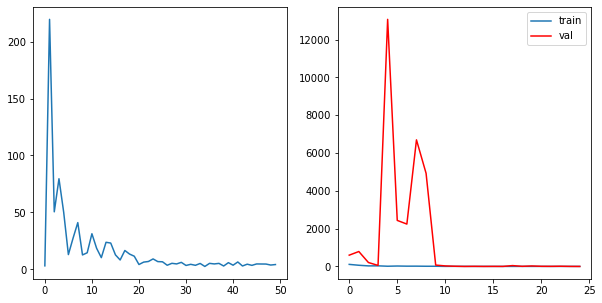

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.6341, grad_fn=<L1LossBackward0>)
tensor(4.2592, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 3.9466488361358643	     Validation Loss:2.2861809730529785	 \ LR:0.001


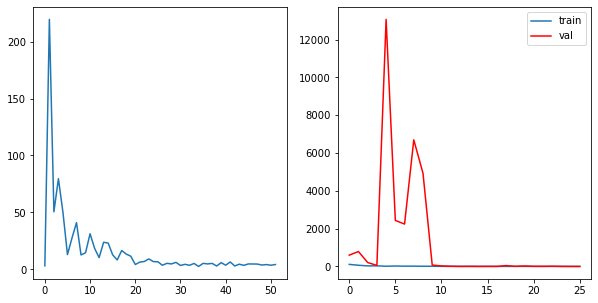

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.4416, grad_fn=<L1LossBackward0>)
tensor(3.6979, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 3.5697543621063232	     Validation Loss:2.217228889465332	 \ LR:0.001


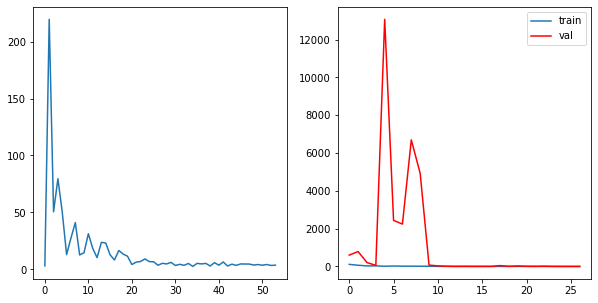

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(3.2089, grad_fn=<L1LossBackward0>)
tensor(3.7282, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 3.4685646295547485	     Validation Loss:2.2305054664611816	 \ LR:0.001


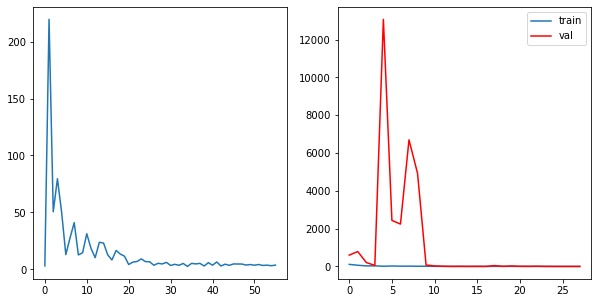

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.9759, grad_fn=<L1LossBackward0>)
tensor(3.9581, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 3.466979503631592	     Validation Loss:2.207448959350586	 \ LR:0.001


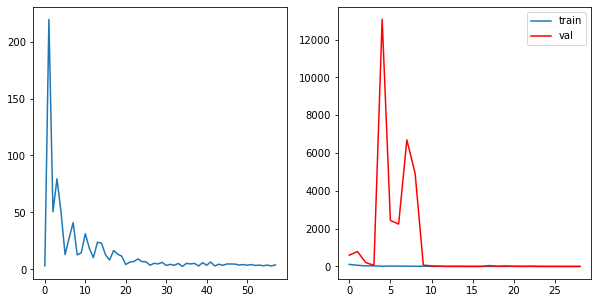

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.7362, grad_fn=<L1LossBackward0>)
tensor(4.1810, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 3.4585543870925903	     Validation Loss:2.1320526599884033	 \ LR:0.001


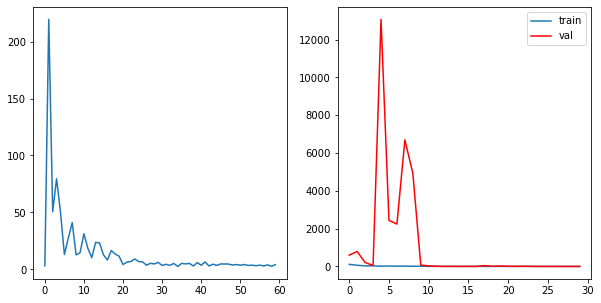

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.5270, grad_fn=<L1LossBackward0>)
tensor(4.4023, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 3.4646618366241455	     Validation Loss:2.132783889770508	 \ LR:0.001


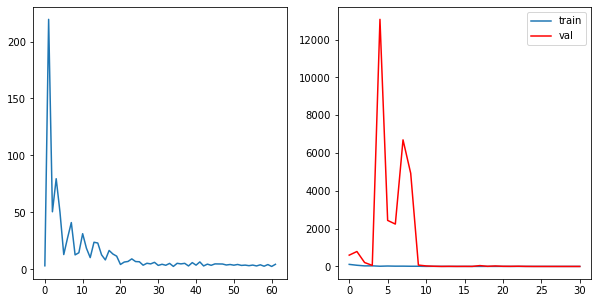

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3991, grad_fn=<L1LossBackward0>)
tensor(4.5668, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 3.4829397201538086	     Validation Loss:2.1569197177886963	 \ LR:0.001


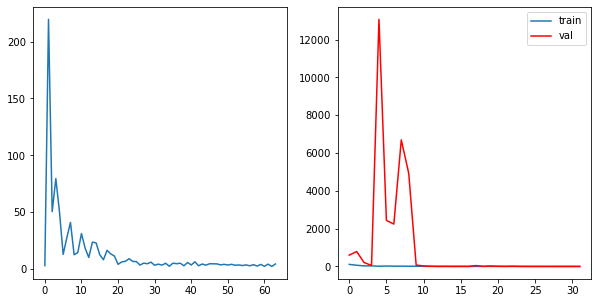

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1479, grad_fn=<L1LossBackward0>)
tensor(4.4988, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 3.323335886001587	     Validation Loss:2.124319076538086	 \ LR:0.001


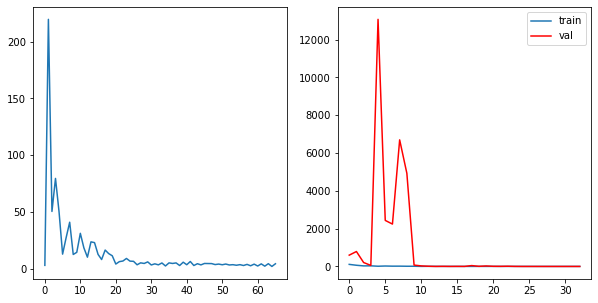

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2830, grad_fn=<L1LossBackward0>)
tensor(4.7033, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 3.49313747882843	     Validation Loss:2.1614208221435547	 \ LR:0.001


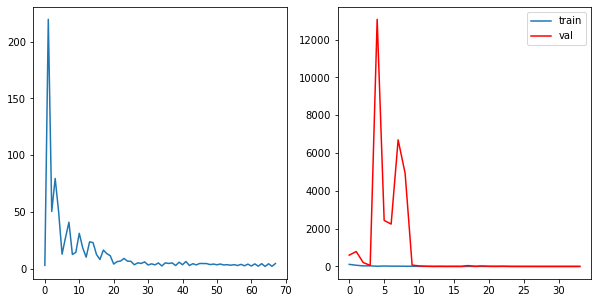

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2014, grad_fn=<L1LossBackward0>)
tensor(4.6933, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 3.4473596811294556	     Validation Loss:2.1032397747039795	 \ LR:0.001


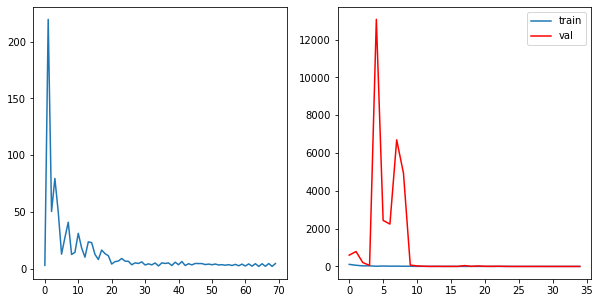

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2358, grad_fn=<L1LossBackward0>)
tensor(4.4905, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 3.3631625175476074	     Validation Loss:2.0789971351623535	 \ LR:0.001


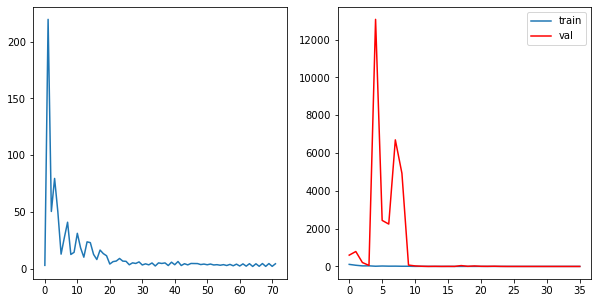

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2636, grad_fn=<L1LossBackward0>)
tensor(4.3663, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 3.3149105310440063	     Validation Loss:2.1248879432678223	 \ LR:0.001


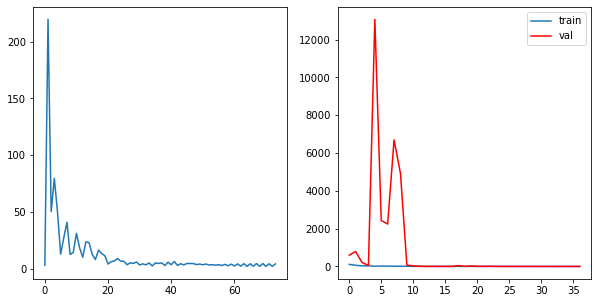

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3100, grad_fn=<L1LossBackward0>)
tensor(4.4607, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 3.385332942008972	     Validation Loss:2.163303852081299	 \ LR:0.001


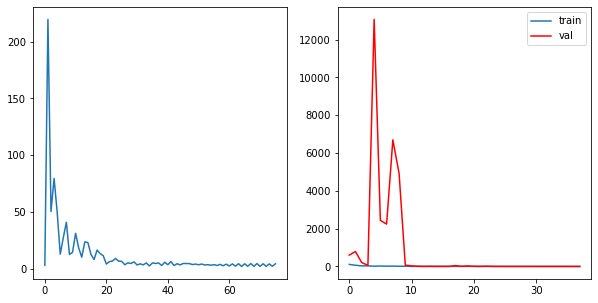

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1689, grad_fn=<L1LossBackward0>)
tensor(4.5038, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 3.336378335952759	     Validation Loss:2.1578316688537598	 \ LR:0.001


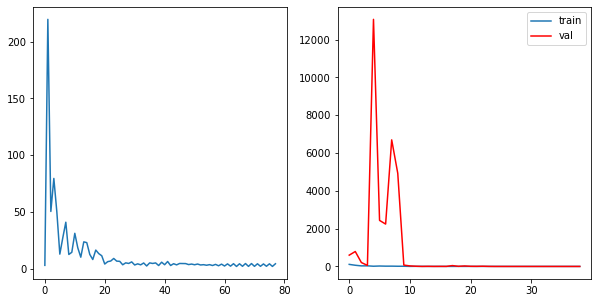

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1880, grad_fn=<L1LossBackward0>)
tensor(4.3254, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 3.256729006767273	     Validation Loss:2.1844983100891113	 \ LR:0.001


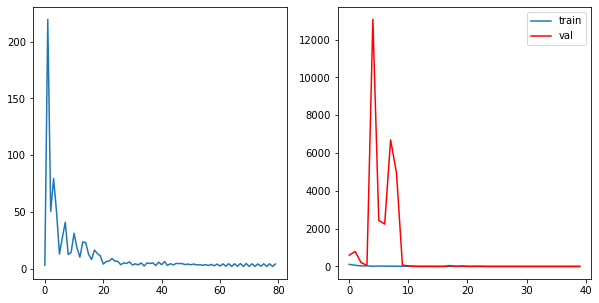

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1912, grad_fn=<L1LossBackward0>)
tensor(4.2662, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 40	 \Training Loss: 3.2287213802337646	     Validation Loss:2.2015597820281982	 \ LR:0.001


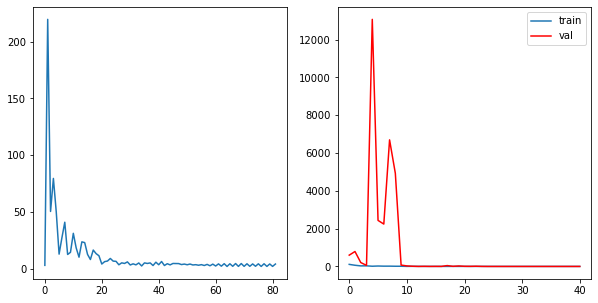

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1803, grad_fn=<L1LossBackward0>)
tensor(4.2292, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 41	 \Training Loss: 3.2047592401504517	     Validation Loss:2.134638786315918	 \ LR:0.001


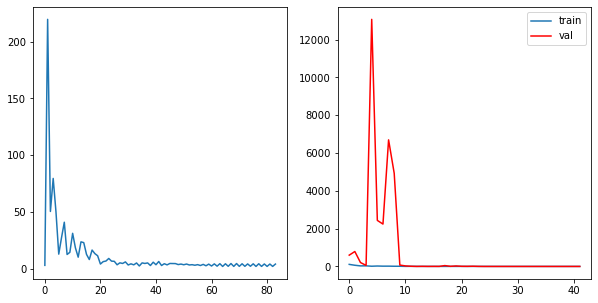

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3236, grad_fn=<L1LossBackward0>)
tensor(4.2984, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 42	 \Training Loss: 3.311018466949463	     Validation Loss:2.1545395851135254	 \ LR:0.001


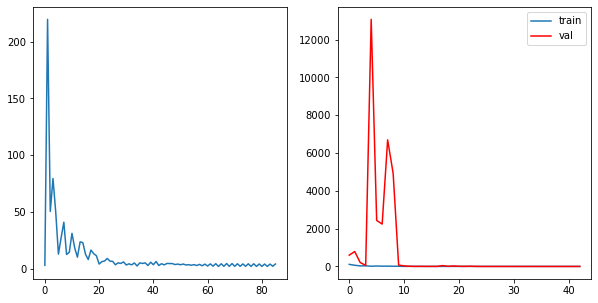

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3128, grad_fn=<L1LossBackward0>)
tensor(4.2520, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 43	 \Training Loss: 3.2824231386184692	     Validation Loss:2.1877002716064453	 \ LR:0.001


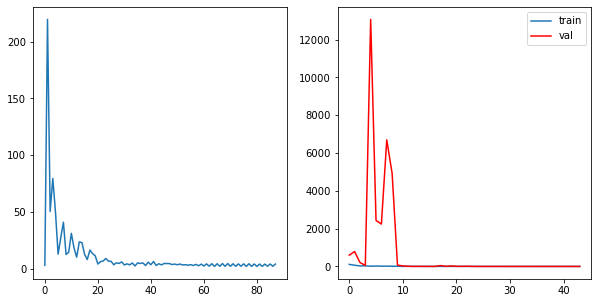

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2964, grad_fn=<L1LossBackward0>)
tensor(4.2135, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 44	 \Training Loss: 3.254956603050232	     Validation Loss:2.1487934589385986	 \ LR:0.001


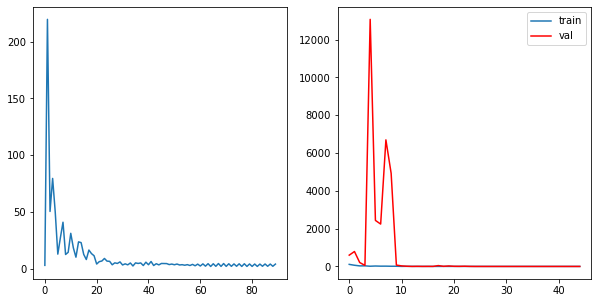

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2890, grad_fn=<L1LossBackward0>)
tensor(4.2233, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 45	 \Training Loss: 3.256173253059387	     Validation Loss:2.1742329597473145	 \ LR:0.001


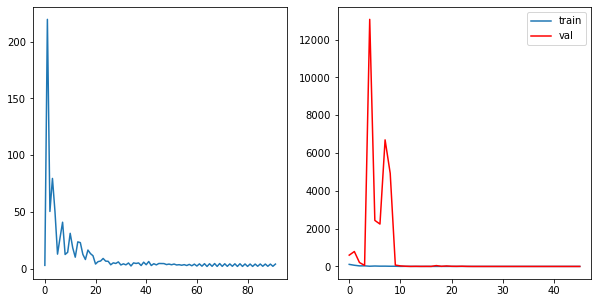

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3105, grad_fn=<L1LossBackward0>)
tensor(4.0985, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 46	 \Training Loss: 3.2045092582702637	     Validation Loss:2.1840689182281494	 \ LR:0.0001


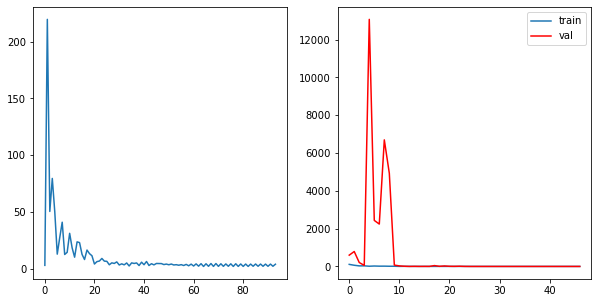

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2147, grad_fn=<L1LossBackward0>)
tensor(4.0737, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 47	 \Training Loss: 3.1442246437072754	     Validation Loss:2.2167744636535645	 \ LR:0.0001


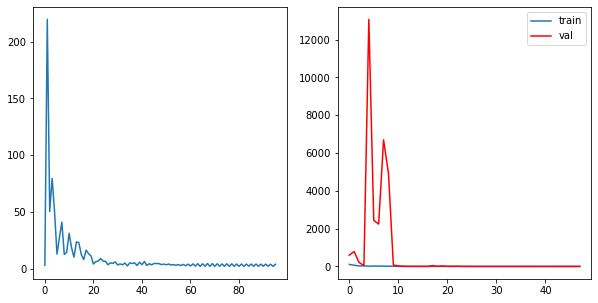

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2543, grad_fn=<L1LossBackward0>)
tensor(3.8282, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 48	 \Training Loss: 3.0412241220474243	     Validation Loss:2.2516934871673584	 \ LR:0.0001


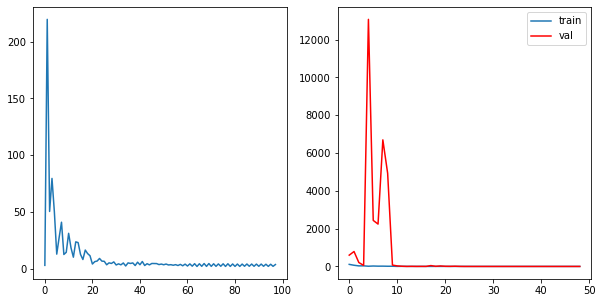

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2008, grad_fn=<L1LossBackward0>)
tensor(4.0267, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 49	 \Training Loss: 3.113777279853821	     Validation Loss:2.1583786010742188	 \ LR:0.0001


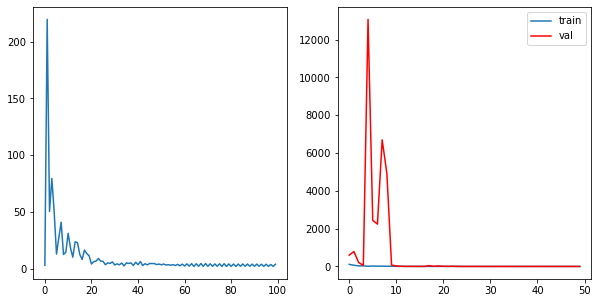

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2771, grad_fn=<L1LossBackward0>)
tensor(3.9743, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 50	 \Training Loss: 3.1256964206695557	     Validation Loss:2.248314142227173	 \ LR:0.0001


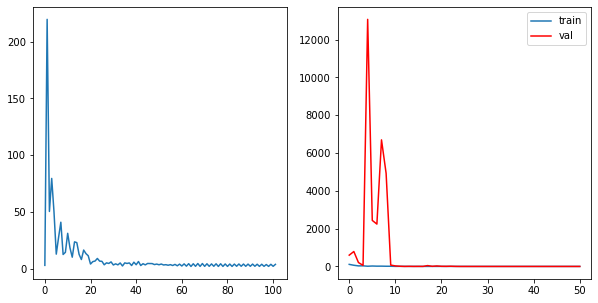

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3135, grad_fn=<L1LossBackward0>)
tensor(3.8765, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 51	 \Training Loss: 3.0949697494506836	     Validation Loss:2.2600557804107666	 \ LR:0.0001


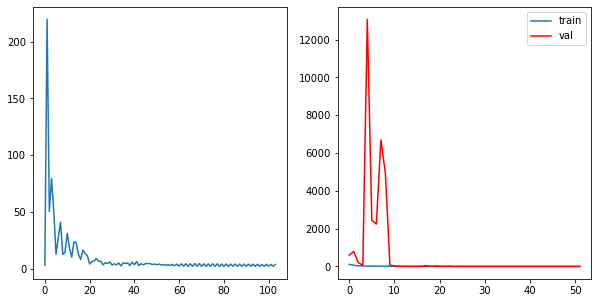

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3014, grad_fn=<L1LossBackward0>)
tensor(3.8496, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 52	 \Training Loss: 3.0755473375320435	     Validation Loss:2.2476718425750732	 \ LR:0.0001


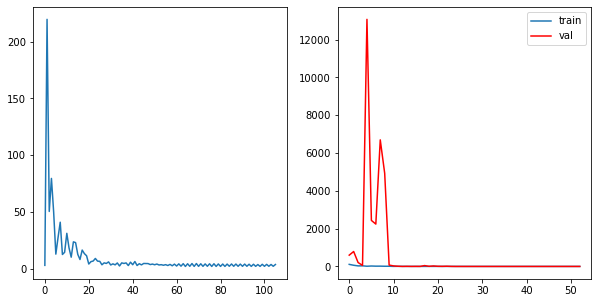

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1979, grad_fn=<L1LossBackward0>)
tensor(3.9580, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 53	 \Training Loss: 3.077957510948181	     Validation Loss:2.290769100189209	 \ LR:0.0001


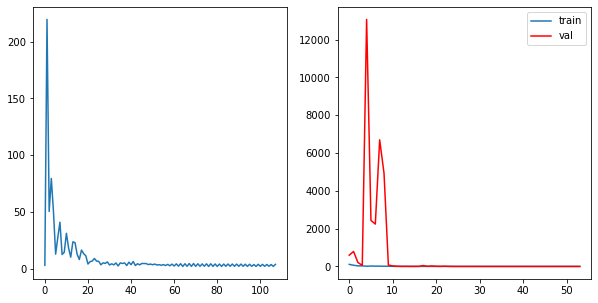

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1648, grad_fn=<L1LossBackward0>)
tensor(3.7897, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 54	 \Training Loss: 2.977253556251526	     Validation Loss:2.267404317855835	 \ LR:0.0001


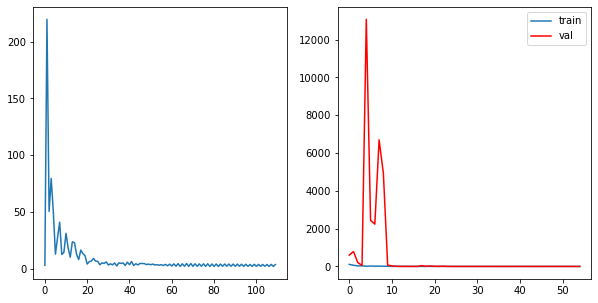

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1742, grad_fn=<L1LossBackward0>)
tensor(3.8848, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 55	 \Training Loss: 3.0295392274856567	     Validation Loss:2.3537402153015137	 \ LR:0.0001


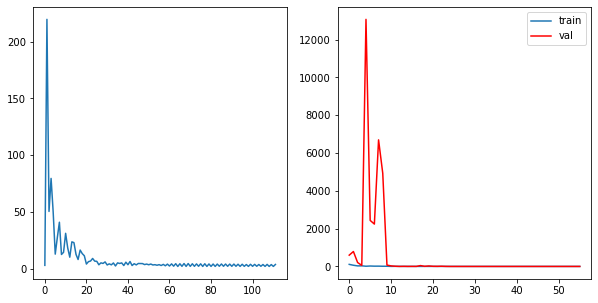

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3269, grad_fn=<L1LossBackward0>)
tensor(3.8019, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 56	 \Training Loss: 3.064378023147583	     Validation Loss:2.3813884258270264	 \ LR:0.0001


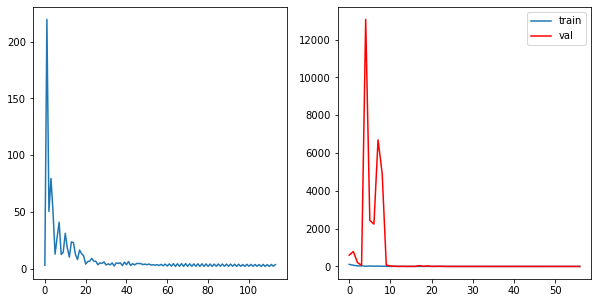

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2660, grad_fn=<L1LossBackward0>)
tensor(3.8768, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 57	 \Training Loss: 3.0714303255081177	     Validation Loss:2.4035561084747314	 \ LR:1e-05


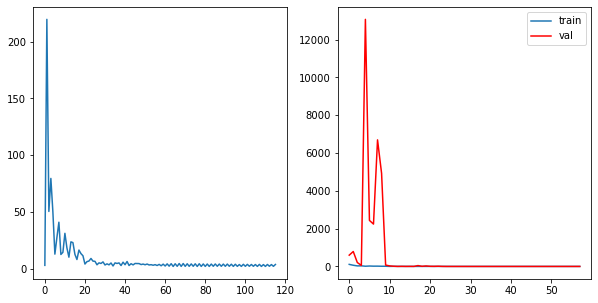

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1349, grad_fn=<L1LossBackward0>)
tensor(3.7747, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 58	 \Training Loss: 2.95481538772583	     Validation Loss:2.337163209915161	 \ LR:1e-05


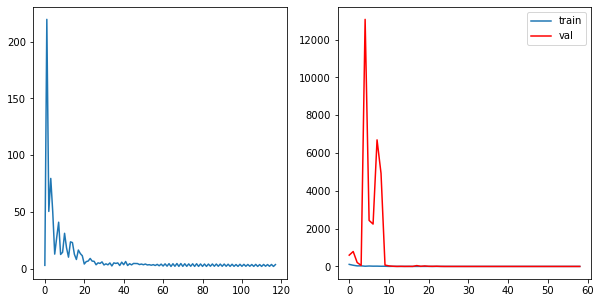

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2891, grad_fn=<L1LossBackward0>)
tensor(3.9502, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 59	 \Training Loss: 3.1196779012680054	     Validation Loss:2.37501859664917	 \ LR:1e-05


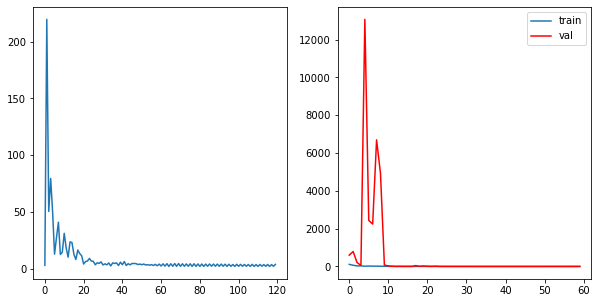

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3044, grad_fn=<L1LossBackward0>)
tensor(3.9640, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 60	 \Training Loss: 3.1341954469680786	     Validation Loss:2.3207011222839355	 \ LR:1e-05


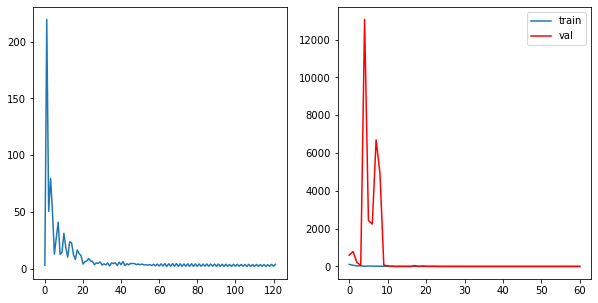

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0861, grad_fn=<L1LossBackward0>)
tensor(3.8719, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 61	 \Training Loss: 2.9789743423461914	     Validation Loss:2.3665146827697754	 \ LR:1e-05


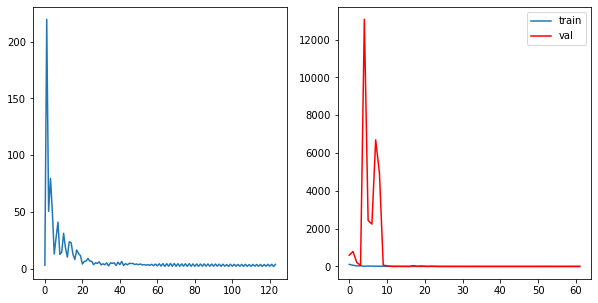

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2961, grad_fn=<L1LossBackward0>)
tensor(4.0060, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 62	 \Training Loss: 3.151076555252075	     Validation Loss:2.3390893936157227	 \ LR:1e-05


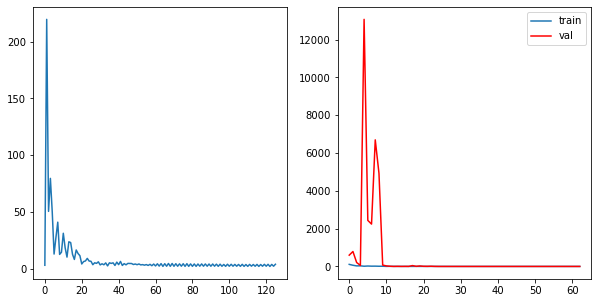

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2874, grad_fn=<L1LossBackward0>)
tensor(3.9655, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 63	 \Training Loss: 3.126443386077881	     Validation Loss:2.2901835441589355	 \ LR:1e-05


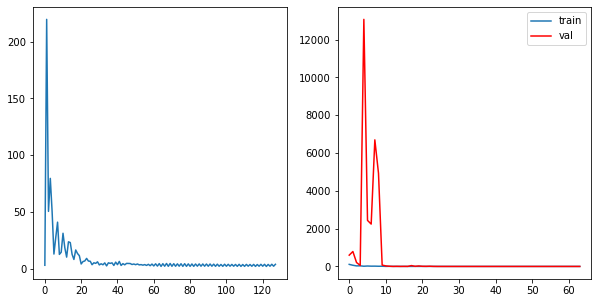

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1313, grad_fn=<L1LossBackward0>)
tensor(3.8262, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 64	 \Training Loss: 2.978735089302063	     Validation Loss:2.3378214836120605	 \ LR:1e-05


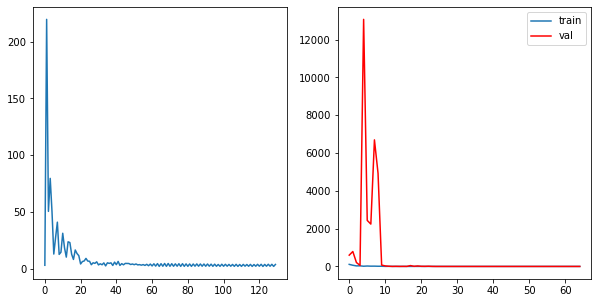

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2312, grad_fn=<L1LossBackward0>)
tensor(3.9623, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 65	 \Training Loss: 3.0967588424682617	     Validation Loss:2.3593883514404297	 \ LR:1e-05


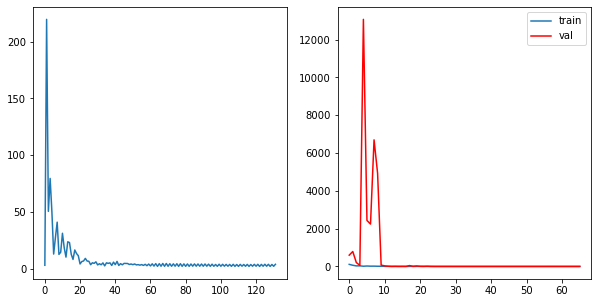

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2491, grad_fn=<L1LossBackward0>)
tensor(3.9747, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 66	 \Training Loss: 3.1119093894958496	     Validation Loss:2.3258309364318848	 \ LR:1e-05


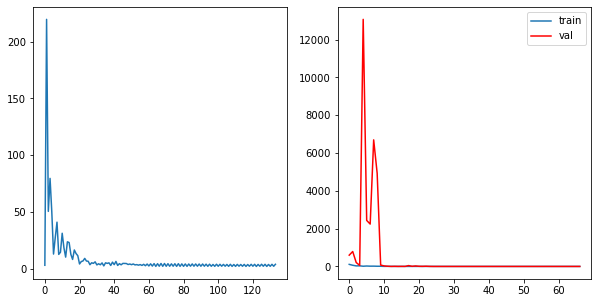

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2756, grad_fn=<L1LossBackward0>)
tensor(4.0030, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 67	 \Training Loss: 3.1392922401428223	     Validation Loss:2.271209239959717	 \ LR:1e-05


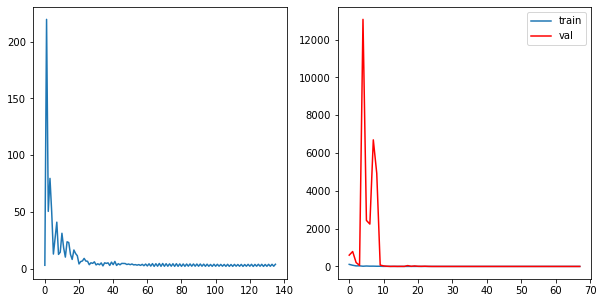

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2855, grad_fn=<L1LossBackward0>)
tensor(3.7758, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 68	 \Training Loss: 3.030614137649536	     Validation Loss:2.3532633781433105	 \ LR:1.0000000000000002e-06


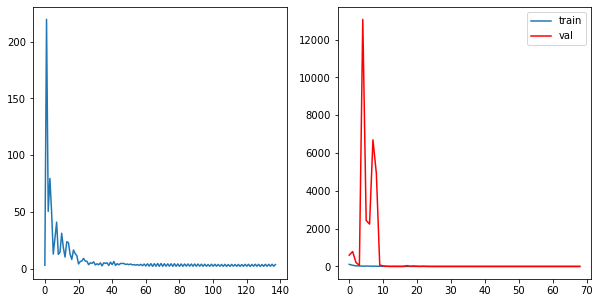

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3024, grad_fn=<L1LossBackward0>)
tensor(3.9794, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 69	 \Training Loss: 3.1409107446670532	     Validation Loss:2.3009610176086426	 \ LR:1.0000000000000002e-06


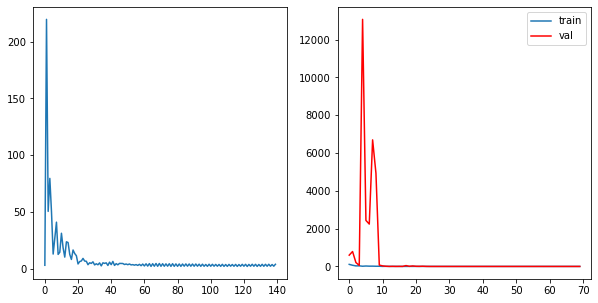

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1155, grad_fn=<L1LossBackward0>)
tensor(4.0280, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 70	 \Training Loss: 3.071779489517212	     Validation Loss:2.382270574569702	 \ LR:1.0000000000000002e-06


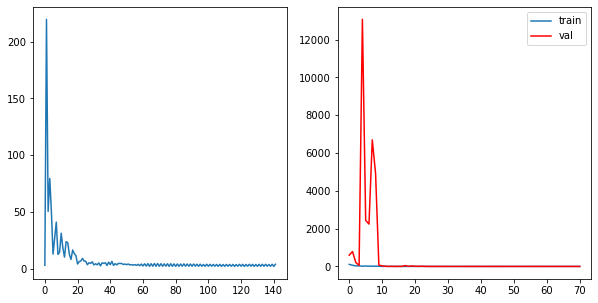

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1194, grad_fn=<L1LossBackward0>)
tensor(3.9310, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 71	 \Training Loss: 3.0251972675323486	     Validation Loss:2.3556413650512695	 \ LR:1.0000000000000002e-06


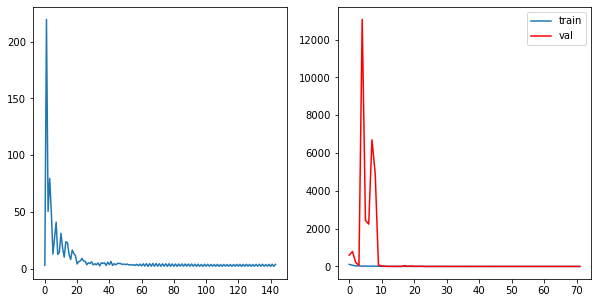

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2322, grad_fn=<L1LossBackward0>)
tensor(3.9586, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 72	 \Training Loss: 3.095372796058655	     Validation Loss:2.323194980621338	 \ LR:1.0000000000000002e-06


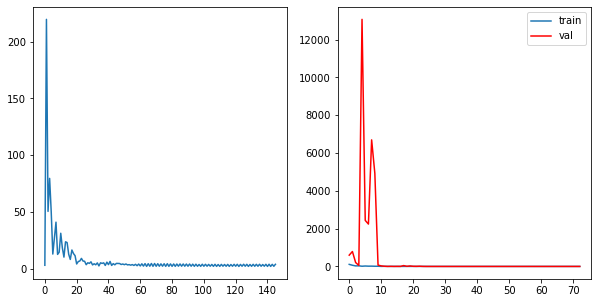

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1342, grad_fn=<L1LossBackward0>)
tensor(3.9081, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 73	 \Training Loss: 3.021169066429138	     Validation Loss:2.4038803577423096	 \ LR:1.0000000000000002e-06


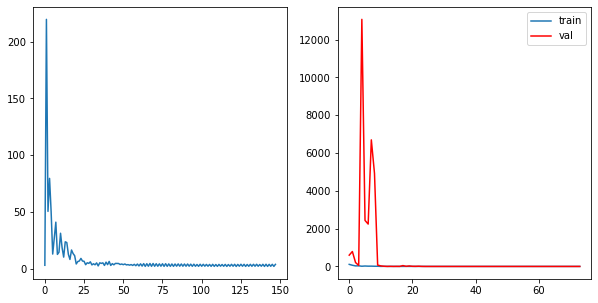

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2760, grad_fn=<L1LossBackward0>)
tensor(3.9316, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 74	 \Training Loss: 3.1037609577178955	     Validation Loss:2.3982486724853516	 \ LR:1.0000000000000002e-06


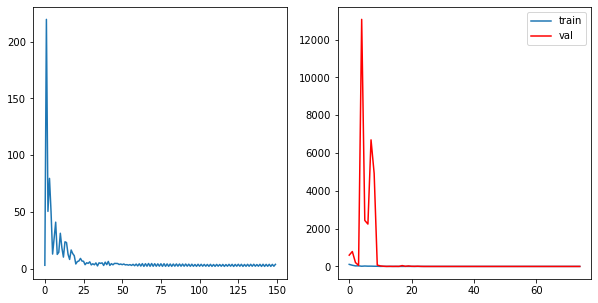

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2910, grad_fn=<L1LossBackward0>)
tensor(3.9665, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 75	 \Training Loss: 3.128730297088623	     Validation Loss:2.316105365753174	 \ LR:1.0000000000000002e-06


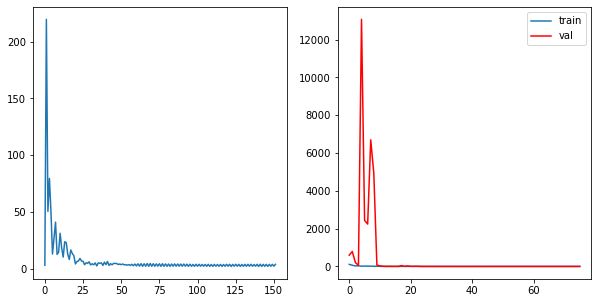

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0945, grad_fn=<L1LossBackward0>)
tensor(3.8489, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 76	 \Training Loss: 2.9717243909835815	     Validation Loss:2.3523902893066406	 \ LR:1.0000000000000002e-06


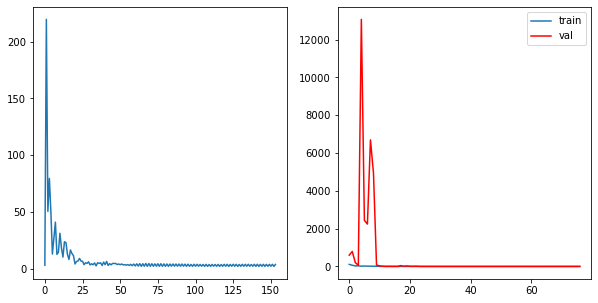

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2351, grad_fn=<L1LossBackward0>)
tensor(3.8309, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 77	 \Training Loss: 3.0330238342285156	     Validation Loss:2.35676908493042	 \ LR:1.0000000000000002e-06


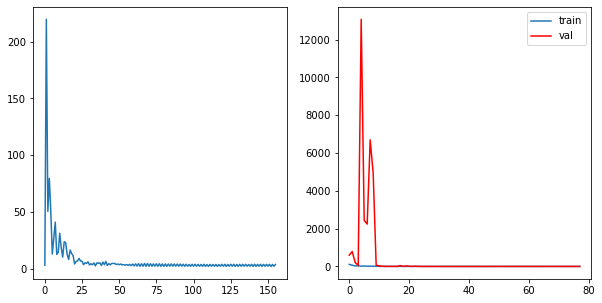

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2945, grad_fn=<L1LossBackward0>)
tensor(3.8329, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 78	 \Training Loss: 3.063698410987854	     Validation Loss:2.338381767272949	 \ LR:1.0000000000000002e-06


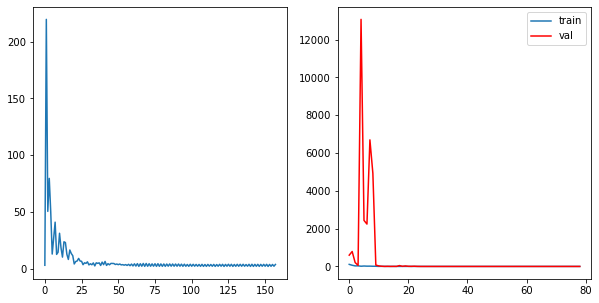

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2354, grad_fn=<L1LossBackward0>)
tensor(3.8206, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 79	 \Training Loss: 3.0279927253723145	     Validation Loss:2.361604928970337	 \ LR:1.0000000000000002e-07


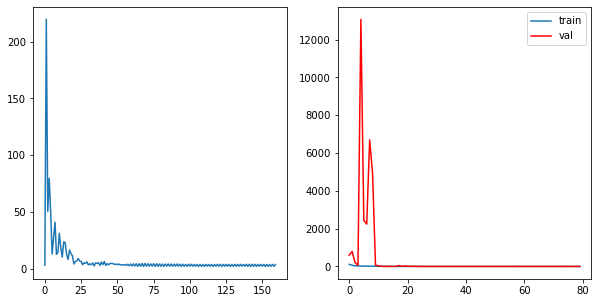

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2381, grad_fn=<L1LossBackward0>)
tensor(3.7750, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 80	 \Training Loss: 3.0065455436706543	     Validation Loss:2.3399834632873535	 \ LR:1.0000000000000002e-07


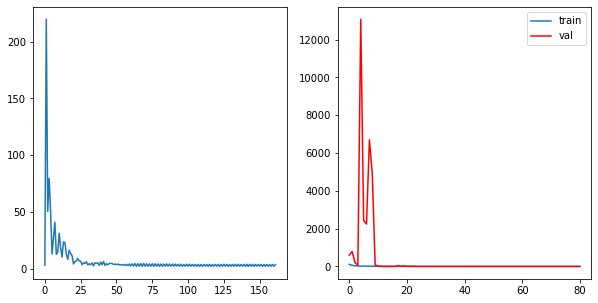

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2820, grad_fn=<L1LossBackward0>)
tensor(3.9253, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 81	 \Training Loss: 3.103628158569336	     Validation Loss:2.342571973800659	 \ LR:1.0000000000000002e-07


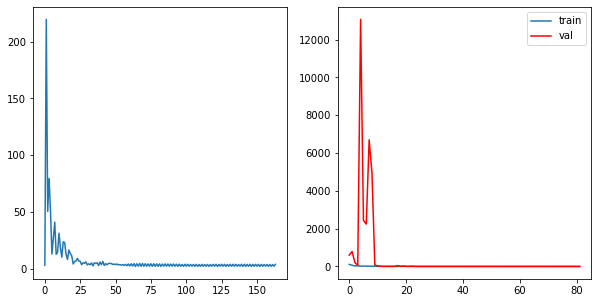

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2840, grad_fn=<L1LossBackward0>)
tensor(3.8357, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 82	 \Training Loss: 3.059868812561035	     Validation Loss:2.3996376991271973	 \ LR:1.0000000000000002e-07


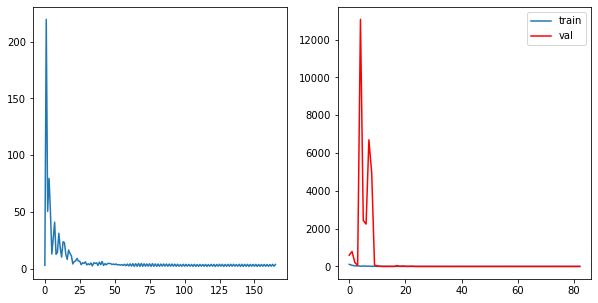

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1231, grad_fn=<L1LossBackward0>)
tensor(3.8324, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 83	 \Training Loss: 2.9777663946151733	     Validation Loss:2.351327419281006	 \ LR:1.0000000000000002e-07


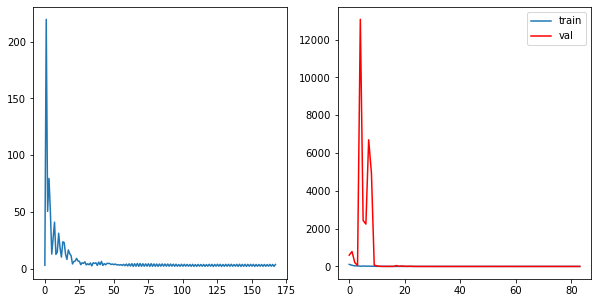

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3019, grad_fn=<L1LossBackward0>)
tensor(3.9415, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 84	 \Training Loss: 3.1217291355133057	     Validation Loss:2.325680732727051	 \ LR:1.0000000000000002e-07


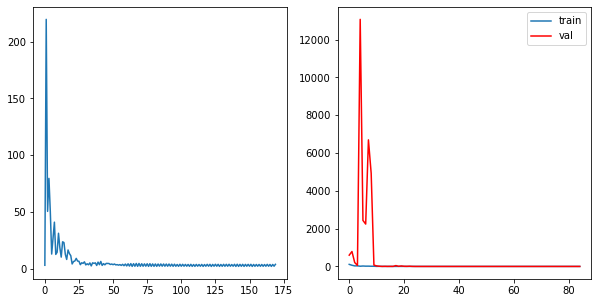

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1082, grad_fn=<L1LossBackward0>)
tensor(4.0161, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 85	 \Training Loss: 3.0621163845062256	     Validation Loss:2.3677990436553955	 \ LR:1.0000000000000002e-07


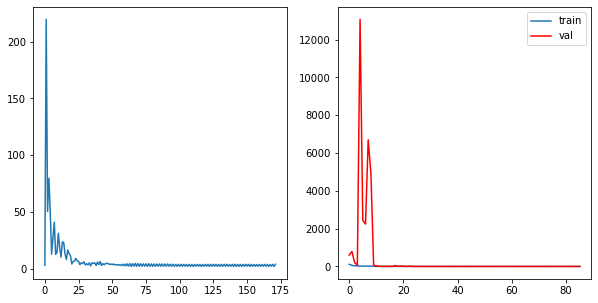

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2954, grad_fn=<L1LossBackward0>)
tensor(3.9923, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 86	 \Training Loss: 3.1438573598861694	     Validation Loss:2.2978529930114746	 \ LR:1.0000000000000002e-07


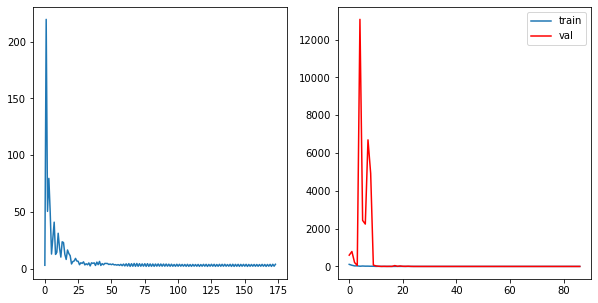

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2823, grad_fn=<L1LossBackward0>)
tensor(3.8313, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 87	 \Training Loss: 3.0568087100982666	     Validation Loss:2.374390125274658	 \ LR:1.0000000000000002e-07


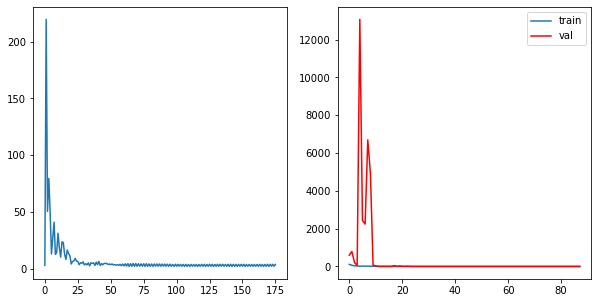

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2869, grad_fn=<L1LossBackward0>)
tensor(4.0221, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 88	 \Training Loss: 3.1545350551605225	     Validation Loss:2.2695505619049072	 \ LR:1.0000000000000002e-07


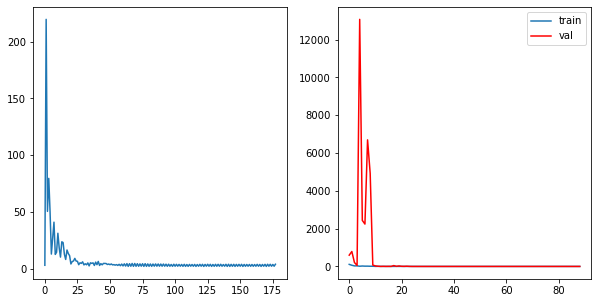

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2893, grad_fn=<L1LossBackward0>)
tensor(3.9485, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 89	 \Training Loss: 3.1189188957214355	     Validation Loss:2.3552675247192383	 \ LR:1.0000000000000002e-07


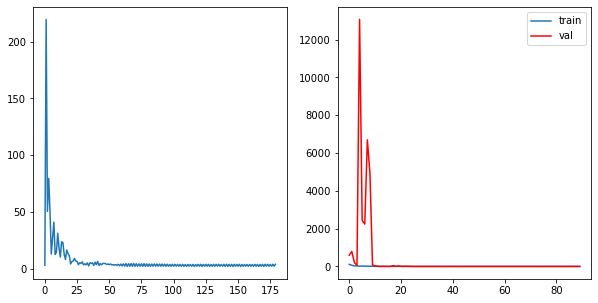

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2882, grad_fn=<L1LossBackward0>)
tensor(3.9268, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 90	 \Training Loss: 3.1074753999710083	     Validation Loss:2.35391902923584	 \ LR:1.0000000000000004e-08


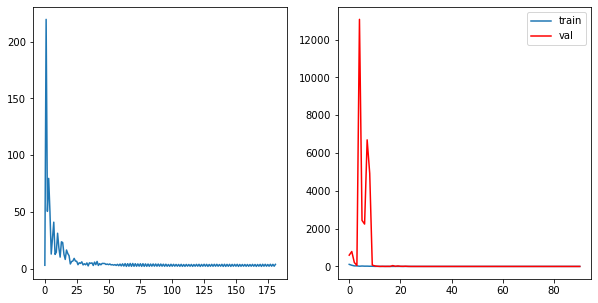

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2746, grad_fn=<L1LossBackward0>)
tensor(3.8746, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 91	 \Training Loss: 3.07461416721344	     Validation Loss:2.318336009979248	 \ LR:1.0000000000000004e-08


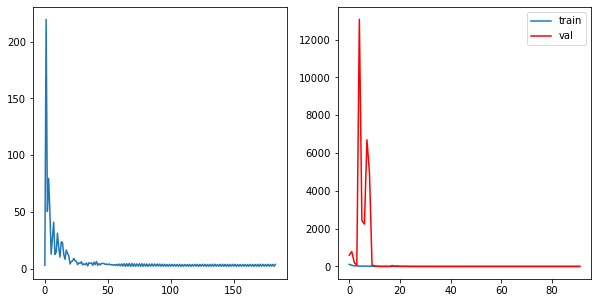

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2464, grad_fn=<L1LossBackward0>)
tensor(3.7748, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 92	 \Training Loss: 3.0106128454208374	     Validation Loss:2.350175380706787	 \ LR:1.0000000000000004e-08


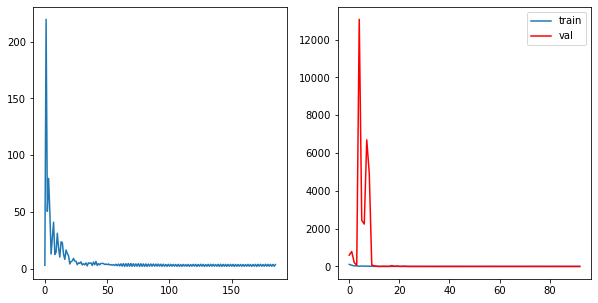

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2749, grad_fn=<L1LossBackward0>)
tensor(4.0004, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 93	 \Training Loss: 3.137629508972168	     Validation Loss:2.325434446334839	 \ LR:1.0000000000000004e-08


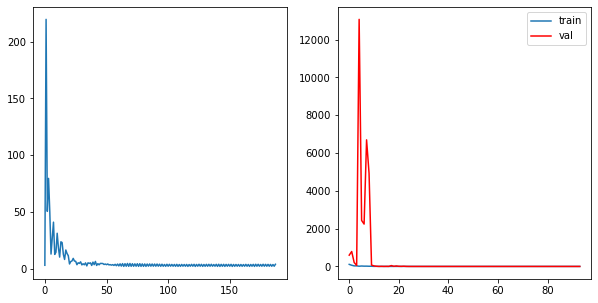

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2882, grad_fn=<L1LossBackward0>)
tensor(3.9461, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 94	 \Training Loss: 3.1171770095825195	     Validation Loss:2.3478925228118896	 \ LR:1.0000000000000004e-08


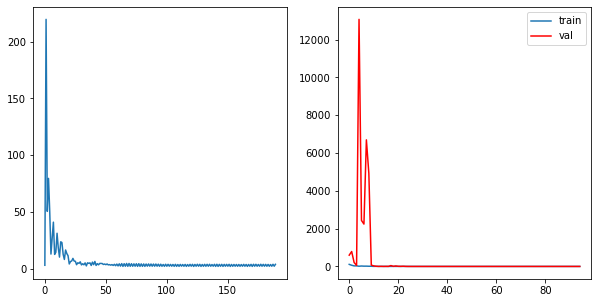

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2362, grad_fn=<L1LossBackward0>)
tensor(3.7981, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 95	 \Training Loss: 3.017147421836853	     Validation Loss:2.343593120574951	 \ LR:1.0000000000000004e-08


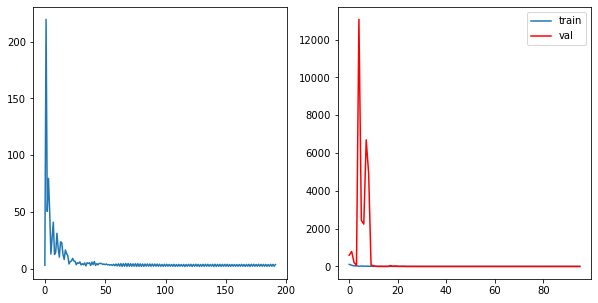

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2509, grad_fn=<L1LossBackward0>)
tensor(4.0140, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 96	 \Training Loss: 3.1324636936187744	     Validation Loss:2.395639657974243	 \ LR:1.0000000000000004e-08


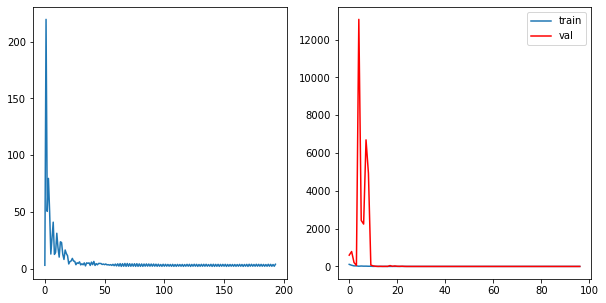

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2353, grad_fn=<L1LossBackward0>)
tensor(3.8381, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 97	 \Training Loss: 3.0366958379745483	     Validation Loss:2.36617112159729	 \ LR:1.0000000000000004e-08


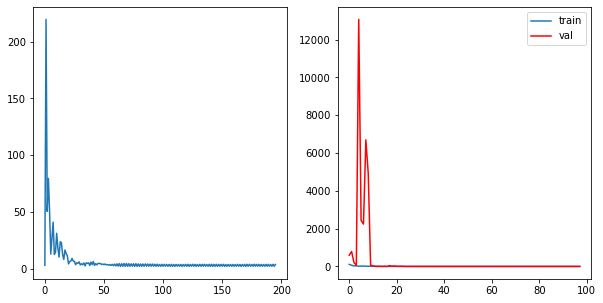

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2787, grad_fn=<L1LossBackward0>)
tensor(3.9666, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 98	 \Training Loss: 3.1226872205734253	     Validation Loss:2.404240608215332	 \ LR:1.0000000000000004e-08


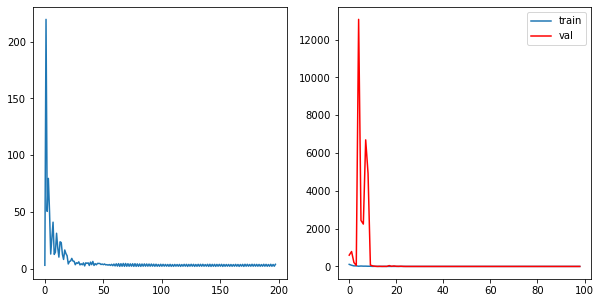

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2721, grad_fn=<L1LossBackward0>)
tensor(3.8326, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 99	 \Training Loss: 3.052343964576721	     Validation Loss:2.290963888168335	 \ LR:1.0000000000000004e-08


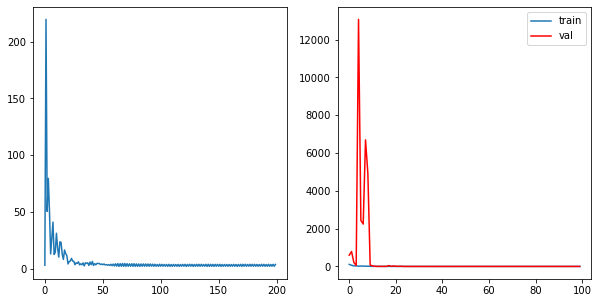

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2861, grad_fn=<L1LossBackward0>)
tensor(3.8511, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 100	 \Training Loss: 3.0686267614364624	     Validation Loss:2.3216910362243652	 \ LR:1.0000000000000004e-08


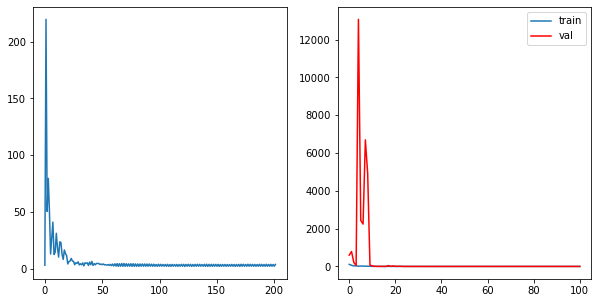

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2317, grad_fn=<L1LossBackward0>)
tensor(3.8238, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 101	 \Training Loss: 3.0277369022369385	     Validation Loss:2.3177649974823	 \ LR:1.0000000000000004e-08


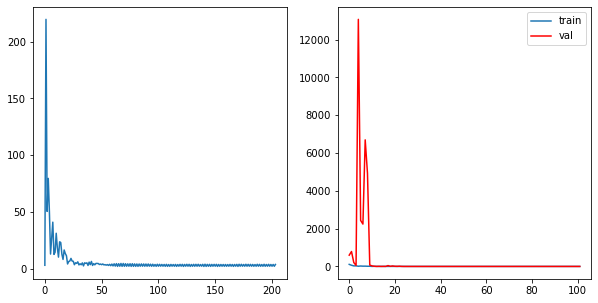

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2900, grad_fn=<L1LossBackward0>)
tensor(3.9487, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 102	 \Training Loss: 3.1193807125091553	     Validation Loss:2.3647236824035645	 \ LR:1.0000000000000004e-08


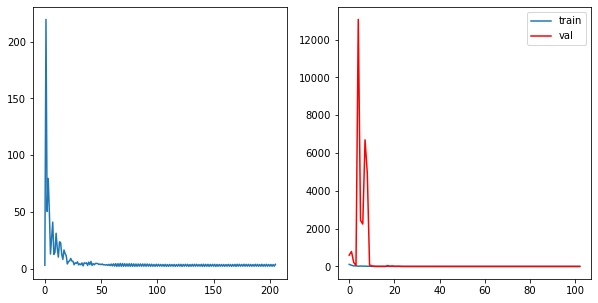

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2760, grad_fn=<L1LossBackward0>)
tensor(3.9354, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 103	 \Training Loss: 3.105709195137024	     Validation Loss:2.4172728061676025	 \ LR:1.0000000000000004e-08


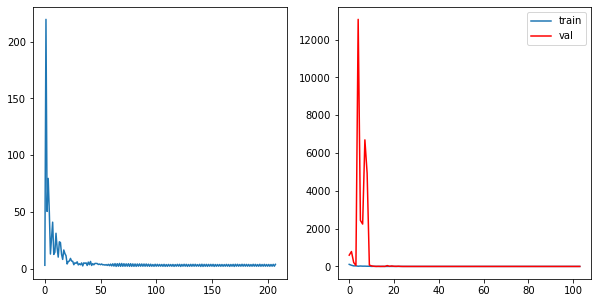

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2463, grad_fn=<L1LossBackward0>)
tensor(3.9369, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 104	 \Training Loss: 3.0916088819503784	     Validation Loss:2.3085286617279053	 \ LR:1.0000000000000004e-08


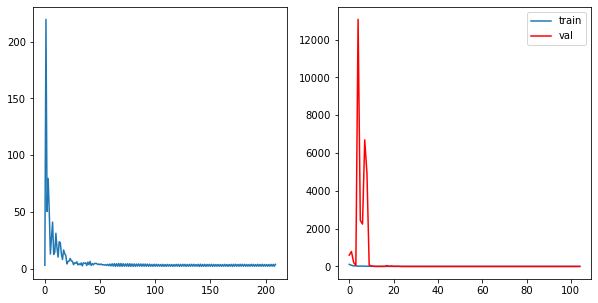

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1160, grad_fn=<L1LossBackward0>)
tensor(3.9765, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 105	 \Training Loss: 3.0462511777877808	     Validation Loss:2.3157565593719482	 \ LR:1.0000000000000004e-08


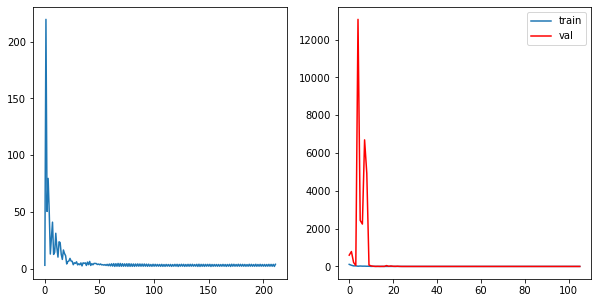

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2776, grad_fn=<L1LossBackward0>)
tensor(3.8519, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 106	 \Training Loss: 3.064788579940796	     Validation Loss:2.3775460720062256	 \ LR:1.0000000000000004e-08


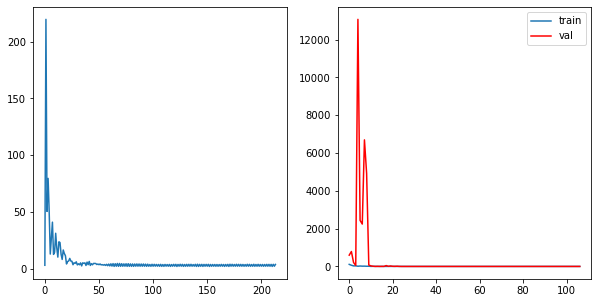

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1033, grad_fn=<L1LossBackward0>)
tensor(3.9010, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 107	 \Training Loss: 3.0021543502807617	     Validation Loss:2.3201262950897217	 \ LR:1.0000000000000004e-08


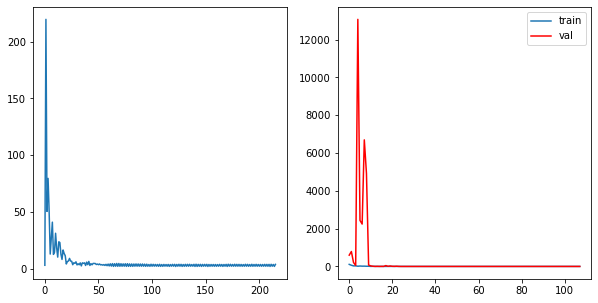

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2896, grad_fn=<L1LossBackward0>)
tensor(3.9266, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 108	 \Training Loss: 3.1081148386001587	     Validation Loss:2.3512463569641113	 \ LR:1.0000000000000004e-08


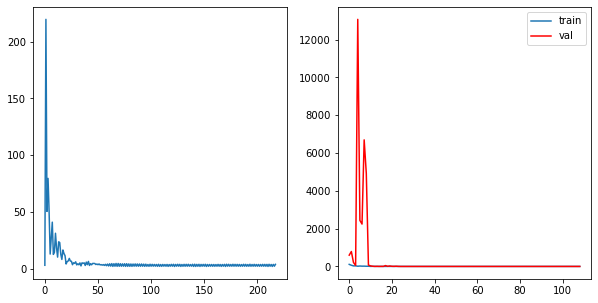

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2890, grad_fn=<L1LossBackward0>)
tensor(3.8595, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 109	 \Training Loss: 3.0742350816726685	     Validation Loss:2.400365114212036	 \ LR:1.0000000000000004e-08


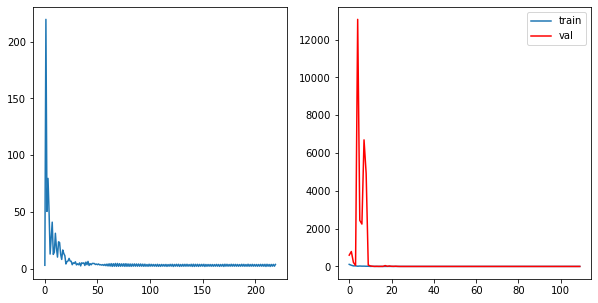

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2863, grad_fn=<L1LossBackward0>)
tensor(3.8814, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 110	 \Training Loss: 3.083814263343811	     Validation Loss:2.365649700164795	 \ LR:1.0000000000000004e-08


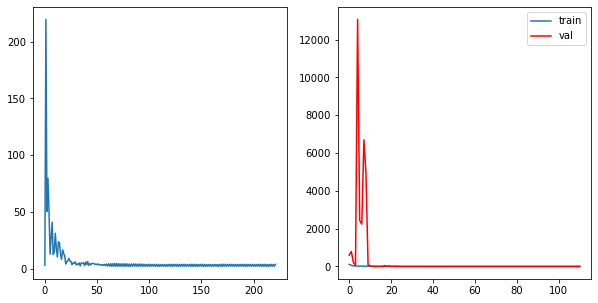

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2884, grad_fn=<L1LossBackward0>)
tensor(3.8444, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 111	 \Training Loss: 3.066410779953003	     Validation Loss:2.31414794921875	 \ LR:1.0000000000000004e-08


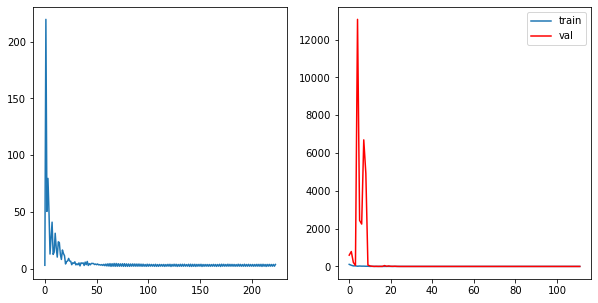

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1197, grad_fn=<L1LossBackward0>)
tensor(3.8335, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 112	 \Training Loss: 2.976552367210388	     Validation Loss:2.388457775115967	 \ LR:1.0000000000000004e-08


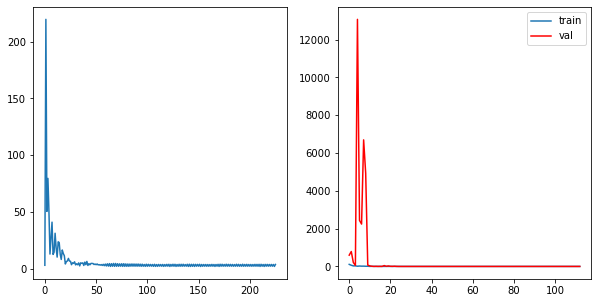

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1106, grad_fn=<L1LossBackward0>)
tensor(3.8268, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 113	 \Training Loss: 2.968719482421875	     Validation Loss:2.3027217388153076	 \ LR:1.0000000000000004e-08


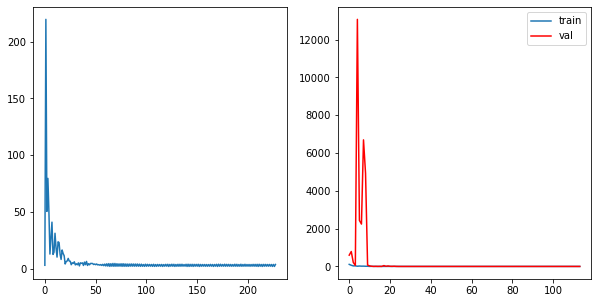

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2943, grad_fn=<L1LossBackward0>)
tensor(3.9234, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 114	 \Training Loss: 3.108826994895935	     Validation Loss:2.343801736831665	 \ LR:1.0000000000000004e-08


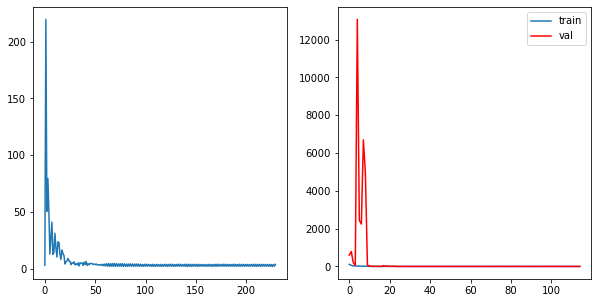

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2697, grad_fn=<L1LossBackward0>)
tensor(3.8284, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 115	 \Training Loss: 3.0490552186965942	     Validation Loss:2.2572741508483887	 \ LR:1.0000000000000004e-08


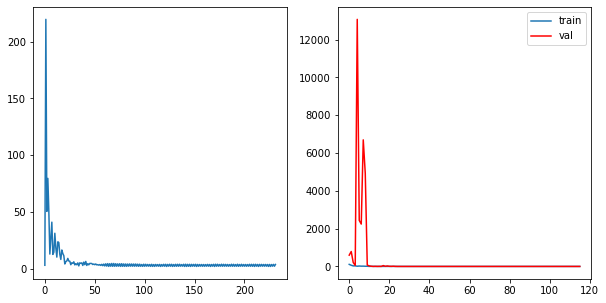

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2972, grad_fn=<L1LossBackward0>)
tensor(3.7702, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 116	 \Training Loss: 3.0336915254592896	     Validation Loss:2.269207000732422	 \ LR:1.0000000000000004e-08


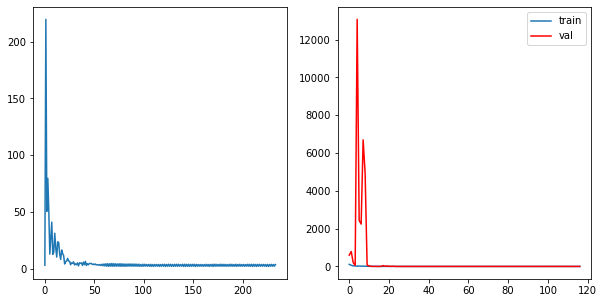

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2975, grad_fn=<L1LossBackward0>)
tensor(3.9293, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 117	 \Training Loss: 3.113416075706482	     Validation Loss:2.2728188037872314	 \ LR:1.0000000000000004e-08


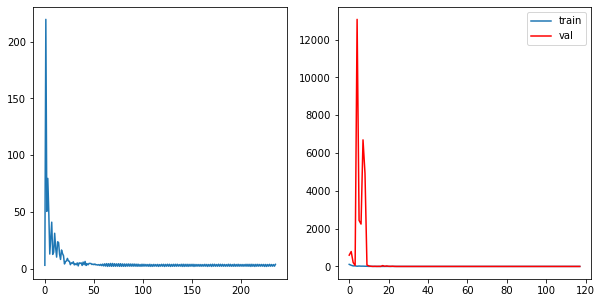

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1149, grad_fn=<L1LossBackward0>)
tensor(3.8515, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 118	 \Training Loss: 2.9831855297088623	     Validation Loss:2.3446476459503174	 \ LR:1.0000000000000004e-08


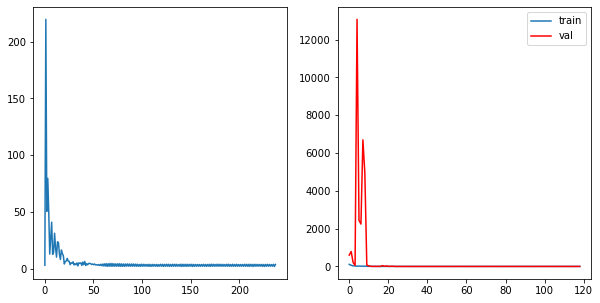

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2326, grad_fn=<L1LossBackward0>)
tensor(3.8465, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 119	 \Training Loss: 3.0395846366882324	     Validation Loss:2.3294272422790527	 \ LR:1.0000000000000004e-08


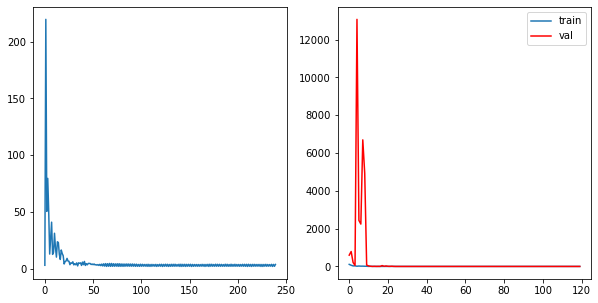

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2854, grad_fn=<L1LossBackward0>)
tensor(3.7928, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 120	 \Training Loss: 3.039068579673767	     Validation Loss:2.324664354324341	 \ LR:1.0000000000000004e-08


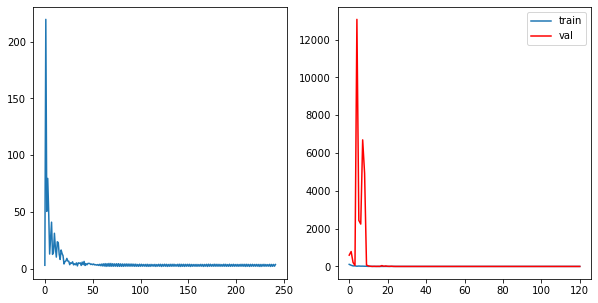

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2484, grad_fn=<L1LossBackward0>)
tensor(3.8341, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 121	 \Training Loss: 3.0412579774856567	     Validation Loss:2.272407293319702	 \ LR:1.0000000000000004e-08


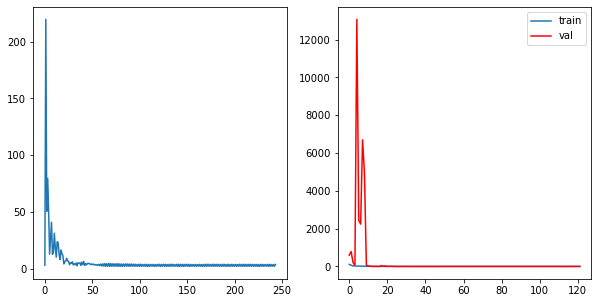

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2791, grad_fn=<L1LossBackward0>)
tensor(3.8299, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 122	 \Training Loss: 3.0544759035110474	     Validation Loss:2.3343255519866943	 \ LR:1.0000000000000004e-08


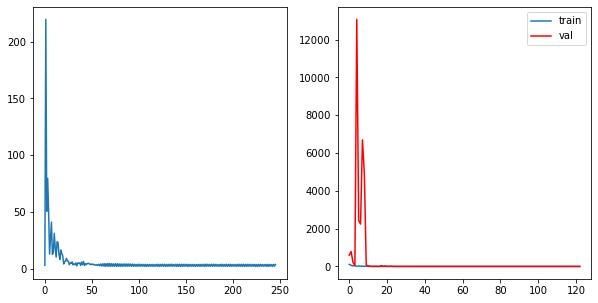

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1236, grad_fn=<L1LossBackward0>)
tensor(3.9382, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 123	 \Training Loss: 3.0308691263198853	     Validation Loss:2.297377109527588	 \ LR:1.0000000000000004e-08


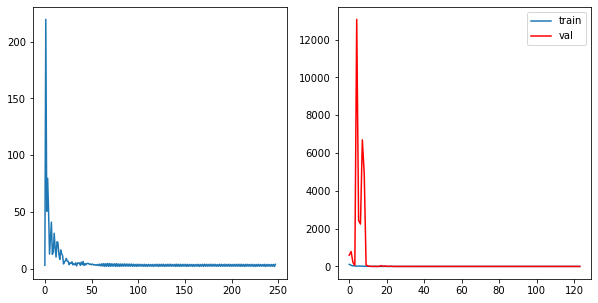

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1023, grad_fn=<L1LossBackward0>)
tensor(3.9234, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 124	 \Training Loss: 3.01286518573761	     Validation Loss:2.3196825981140137	 \ LR:1.0000000000000004e-08


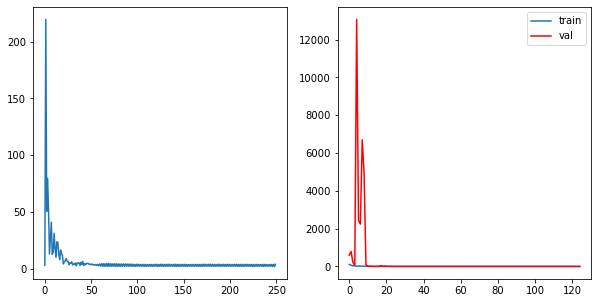

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2367, grad_fn=<L1LossBackward0>)
tensor(3.7771, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 125	 \Training Loss: 3.0069148540496826	     Validation Loss:2.3079302310943604	 \ LR:1.0000000000000004e-08


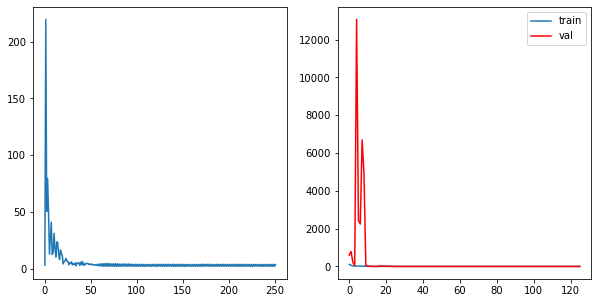

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1037, grad_fn=<L1LossBackward0>)
tensor(3.8712, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 126	 \Training Loss: 2.987490653991699	     Validation Loss:2.3460872173309326	 \ LR:1.0000000000000004e-08


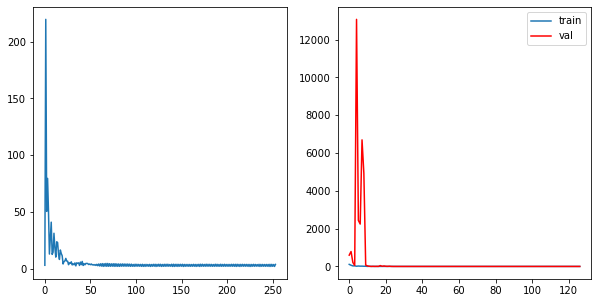

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2846, grad_fn=<L1LossBackward0>)
tensor(4.0057, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 127	 \Training Loss: 3.145159363746643	     Validation Loss:2.3660905361175537	 \ LR:1.0000000000000004e-08


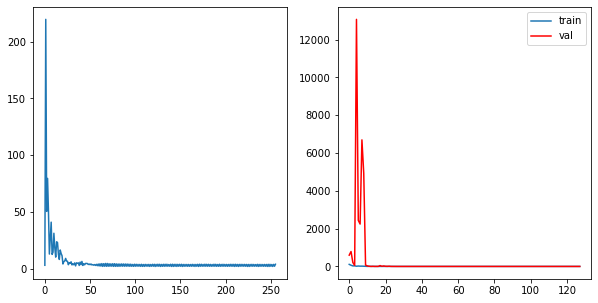

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2468, grad_fn=<L1LossBackward0>)
tensor(3.8214, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 128	 \Training Loss: 3.0340903997421265	     Validation Loss:2.356285572052002	 \ LR:1.0000000000000004e-08


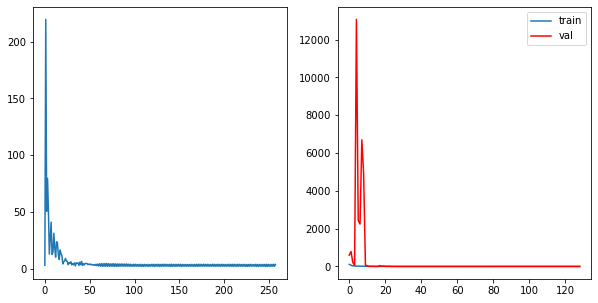

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2685, grad_fn=<L1LossBackward0>)
tensor(3.9413, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 129	 \Training Loss: 3.1049293279647827	     Validation Loss:2.429919719696045	 \ LR:1.0000000000000004e-08


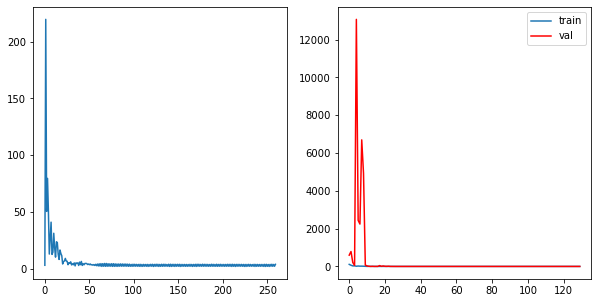

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2834, grad_fn=<L1LossBackward0>)
tensor(3.8356, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 130	 \Training Loss: 3.0595133304595947	     Validation Loss:2.2503061294555664	 \ LR:1.0000000000000004e-08


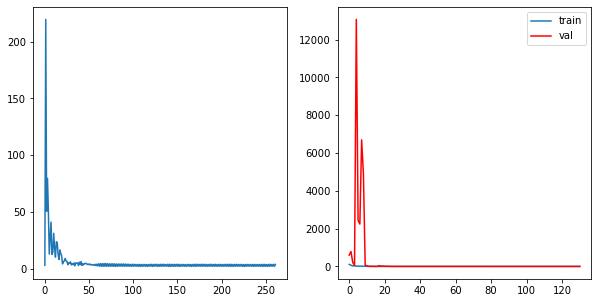

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2325, grad_fn=<L1LossBackward0>)
tensor(3.7883, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 131	 \Training Loss: 3.0104037523269653	     Validation Loss:2.3557028770446777	 \ LR:1.0000000000000004e-08


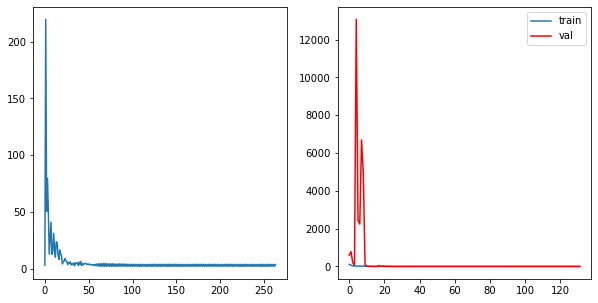

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1109, grad_fn=<L1LossBackward0>)
tensor(3.7959, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 132	 \Training Loss: 2.953403115272522	     Validation Loss:2.335066080093384	 \ LR:1.0000000000000004e-08


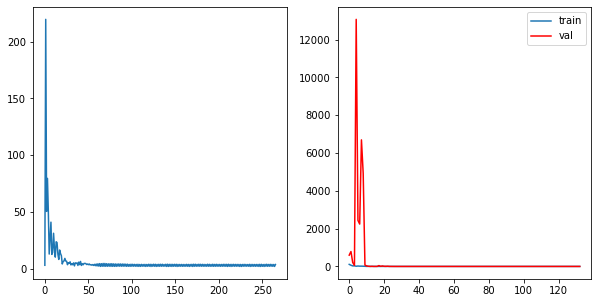

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2785, grad_fn=<L1LossBackward0>)
tensor(3.8405, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 133	 \Training Loss: 3.059509515762329	     Validation Loss:2.3449206352233887	 \ LR:1.0000000000000004e-08


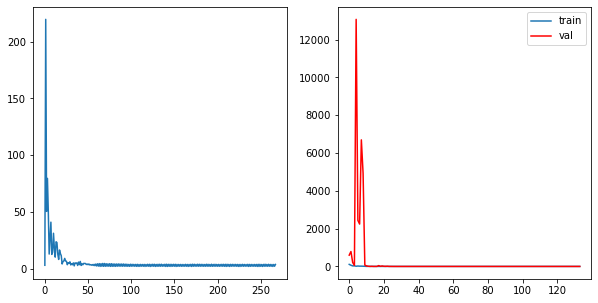

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2922, grad_fn=<L1LossBackward0>)
tensor(3.7834, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 134	 \Training Loss: 3.0377830266952515	     Validation Loss:2.4117753505706787	 \ LR:1.0000000000000004e-08


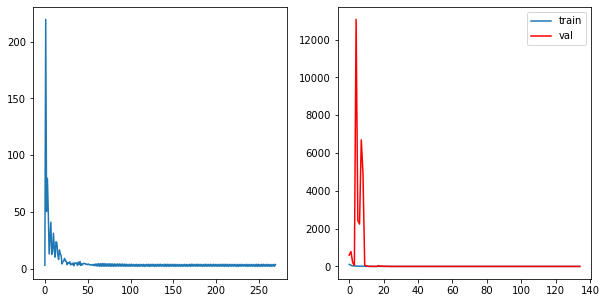

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1120, grad_fn=<L1LossBackward0>)
tensor(3.9604, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 135	 \Training Loss: 3.03622829914093	     Validation Loss:2.3390116691589355	 \ LR:1.0000000000000004e-08


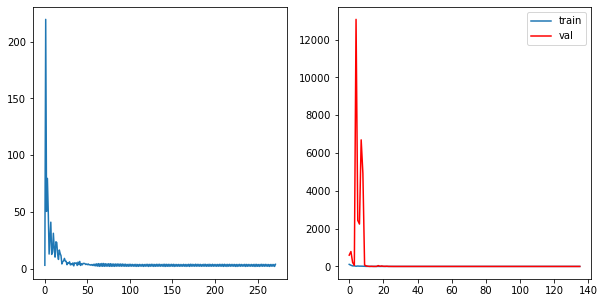

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2998, grad_fn=<L1LossBackward0>)
tensor(3.8172, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 136	 \Training Loss: 3.0585097074508667	     Validation Loss:2.3092849254608154	 \ LR:1.0000000000000004e-08


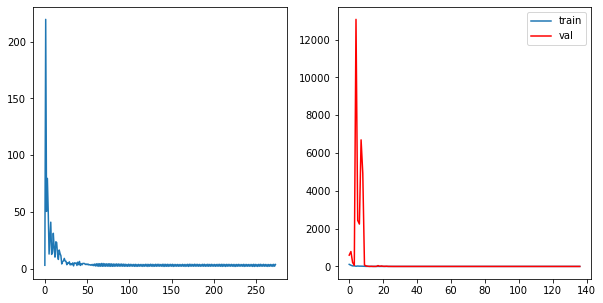

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1370, grad_fn=<L1LossBackward0>)
tensor(3.7732, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 137	 \Training Loss: 2.9551316499710083	     Validation Loss:2.3095862865448	 \ LR:1.0000000000000004e-08


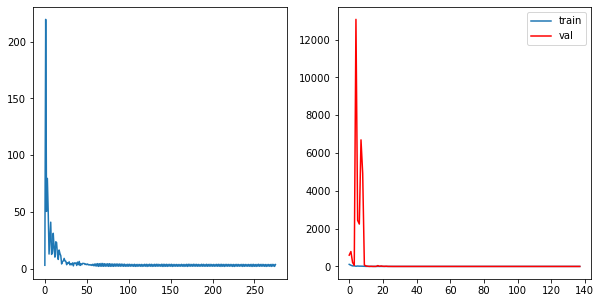

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2796, grad_fn=<L1LossBackward0>)
tensor(3.8169, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 138	 \Training Loss: 3.0482420921325684	     Validation Loss:2.4365999698638916	 \ LR:1.0000000000000004e-08


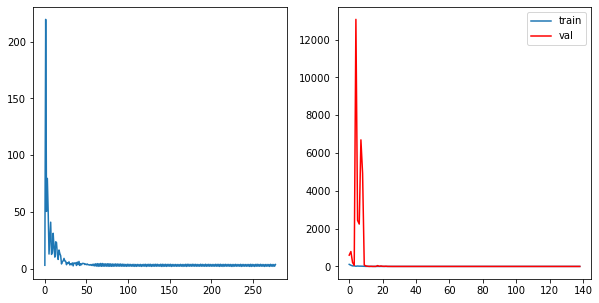

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2398, grad_fn=<L1LossBackward0>)
tensor(3.8326, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 139	 \Training Loss: 3.0362061262130737	     Validation Loss:2.408435344696045	 \ LR:1.0000000000000004e-08


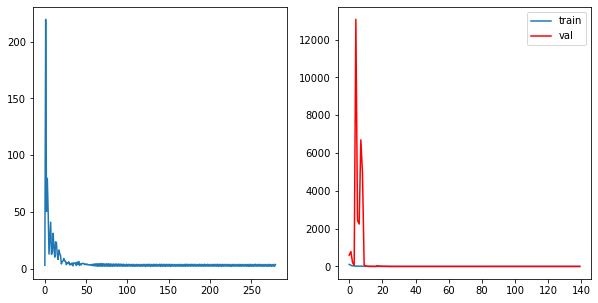

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1078, grad_fn=<L1LossBackward0>)
tensor(3.7755, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 140	 \Training Loss: 2.9416708946228027	     Validation Loss:2.319152355194092	 \ LR:1.0000000000000004e-08


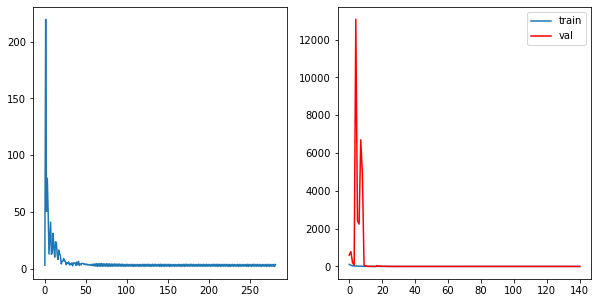

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2800, grad_fn=<L1LossBackward0>)
tensor(4.0143, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 141	 \Training Loss: 3.147140622138977	     Validation Loss:2.2755167484283447	 \ LR:1.0000000000000004e-08


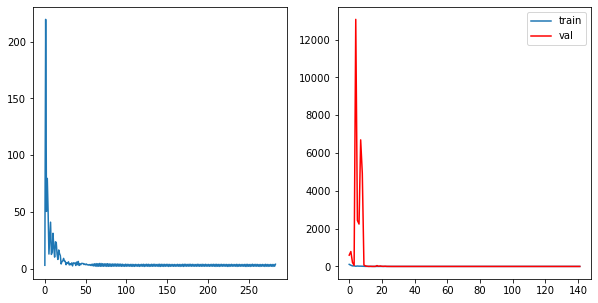

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2763, grad_fn=<L1LossBackward0>)
tensor(3.9257, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 142	 \Training Loss: 3.1010066270828247	     Validation Loss:2.3947277069091797	 \ LR:1.0000000000000004e-08


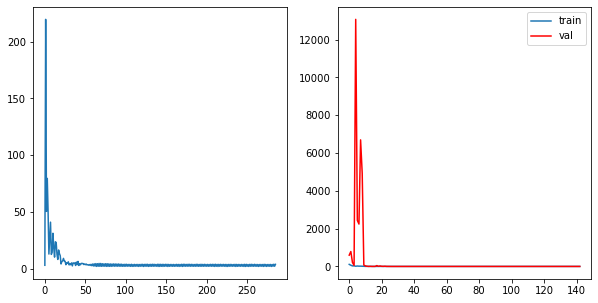

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2997, grad_fn=<L1LossBackward0>)
tensor(3.9820, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 143	 \Training Loss: 3.140819787979126	     Validation Loss:2.3738198280334473	 \ LR:1.0000000000000004e-08


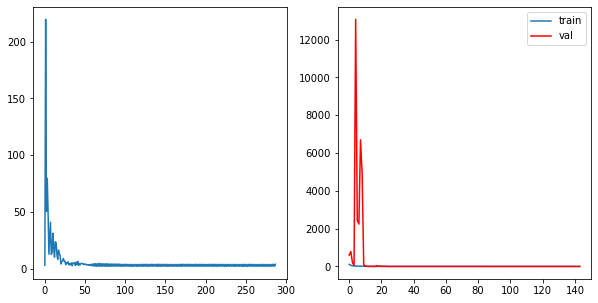

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3013, grad_fn=<L1LossBackward0>)
tensor(3.8126, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 144	 \Training Loss: 3.056926965713501	     Validation Loss:2.329723596572876	 \ LR:1.0000000000000004e-08


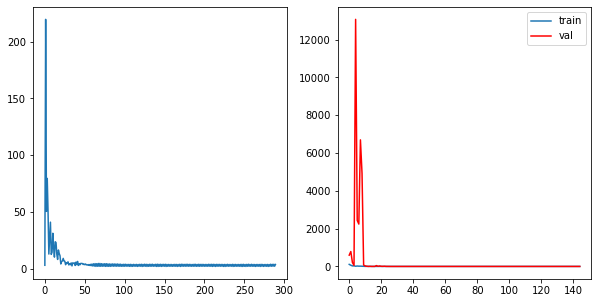

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3014, grad_fn=<L1LossBackward0>)
tensor(3.9254, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 145	 \Training Loss: 3.113357186317444	     Validation Loss:2.2646536827087402	 \ LR:1.0000000000000004e-08


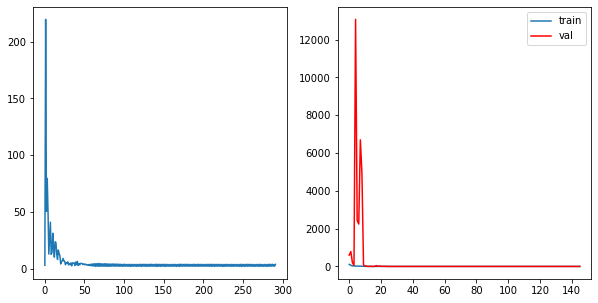

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2795, grad_fn=<L1LossBackward0>)
tensor(3.8360, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 146	 \Training Loss: 3.0577728748321533	     Validation Loss:2.344296932220459	 \ LR:1.0000000000000004e-08


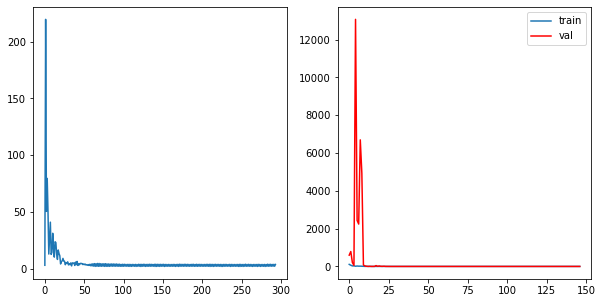

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1274, grad_fn=<L1LossBackward0>)
tensor(4.0139, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 147	 \Training Loss: 3.070666551589966	     Validation Loss:2.364819049835205	 \ LR:1.0000000000000004e-08


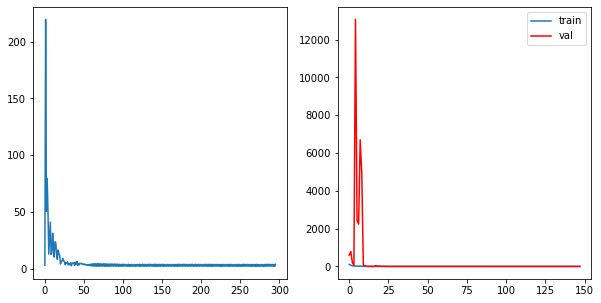

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2795, grad_fn=<L1LossBackward0>)
tensor(3.8250, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 148	 \Training Loss: 3.052254796028137	     Validation Loss:2.3771464824676514	 \ LR:1.0000000000000004e-08


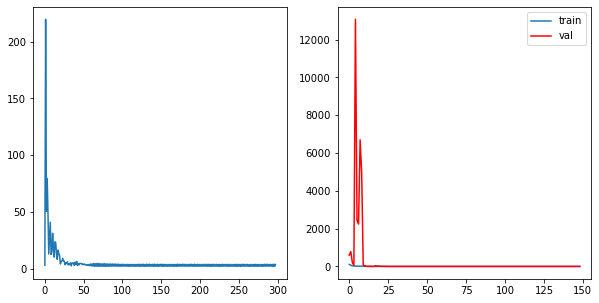

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2925, grad_fn=<L1LossBackward0>)
tensor(3.9355, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 149	 \Training Loss: 3.113972306251526	     Validation Loss:2.268069267272949	 \ LR:1.0000000000000004e-08


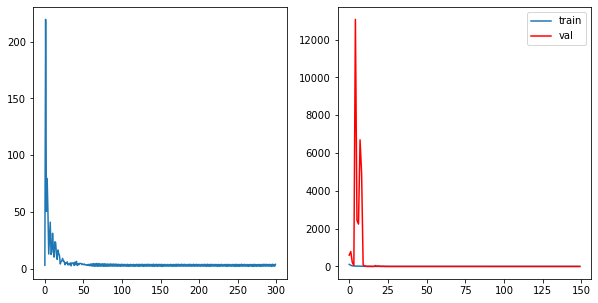

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2781, grad_fn=<L1LossBackward0>)
tensor(4.0164, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 150	 \Training Loss: 3.1472532749176025	     Validation Loss:2.2917685508728027	 \ LR:1.0000000000000004e-08


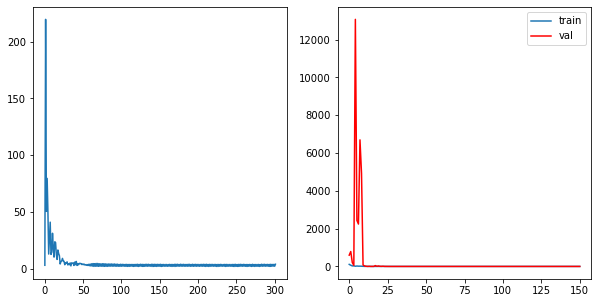

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2968, grad_fn=<L1LossBackward0>)
tensor(3.9233, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 151	 \Training Loss: 3.1100505590438843	     Validation Loss:2.3265061378479004	 \ LR:1.0000000000000004e-08


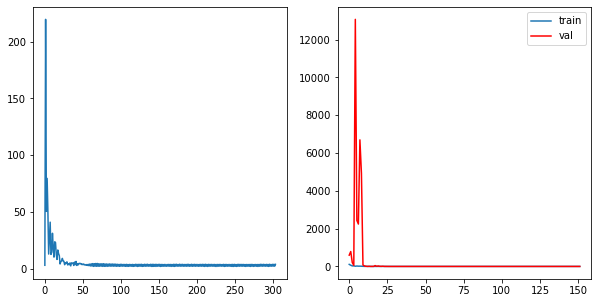

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2745, grad_fn=<L1LossBackward0>)
tensor(3.8800, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 152	 \Training Loss: 3.0772271156311035	     Validation Loss:2.3631832599639893	 \ LR:1.0000000000000004e-08


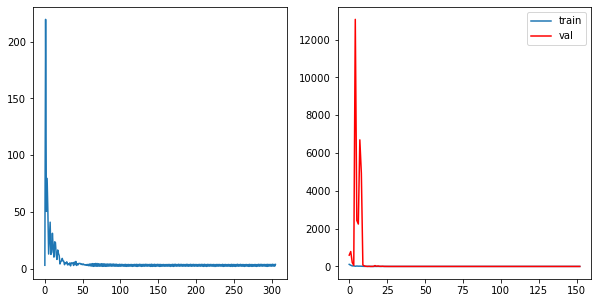

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2852, grad_fn=<L1LossBackward0>)
tensor(3.8966, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 153	 \Training Loss: 3.0909167528152466	     Validation Loss:2.3667380809783936	 \ LR:1.0000000000000004e-08


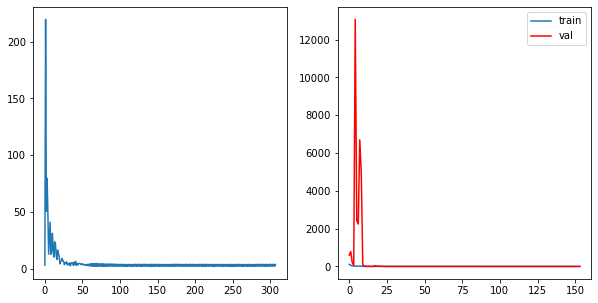

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2302, grad_fn=<L1LossBackward0>)
tensor(3.9536, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 154	 \Training Loss: 3.091901183128357	     Validation Loss:2.3734402656555176	 \ LR:1.0000000000000004e-08


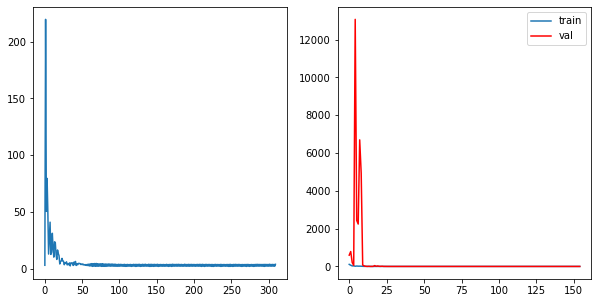

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1179, grad_fn=<L1LossBackward0>)
tensor(3.8424, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 155	 \Training Loss: 2.9801502227783203	     Validation Loss:2.3021233081817627	 \ LR:1.0000000000000004e-08


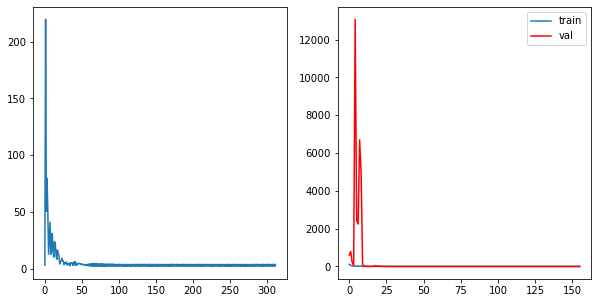

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2865, grad_fn=<L1LossBackward0>)
tensor(3.8404, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 156	 \Training Loss: 3.06346333026886	     Validation Loss:2.3089165687561035	 \ LR:1.0000000000000004e-08


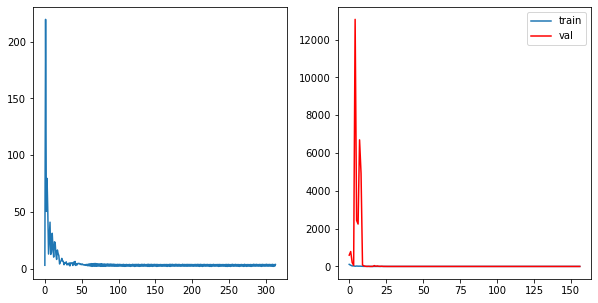

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2467, grad_fn=<L1LossBackward0>)
tensor(3.7841, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 157	 \Training Loss: 3.0153647661209106	     Validation Loss:2.368285655975342	 \ LR:1.0000000000000004e-08


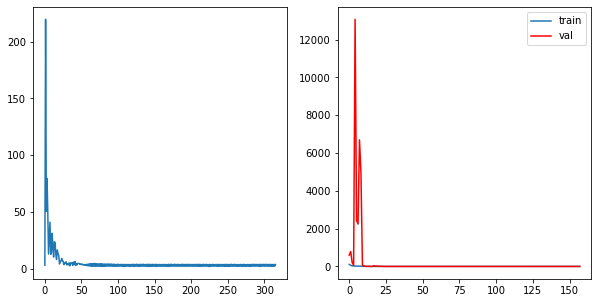

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2862, grad_fn=<L1LossBackward0>)
tensor(3.8408, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 158	 \Training Loss: 3.0635048151016235	     Validation Loss:2.3819704055786133	 \ LR:1.0000000000000004e-08


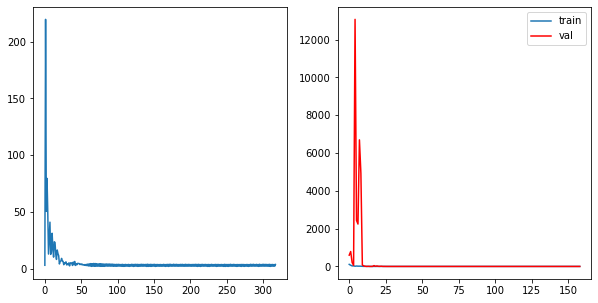

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2245, grad_fn=<L1LossBackward0>)
tensor(3.7637, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 159	 \Training Loss: 2.994124412536621	     Validation Loss:2.3597254753112793	 \ LR:1.0000000000000004e-08


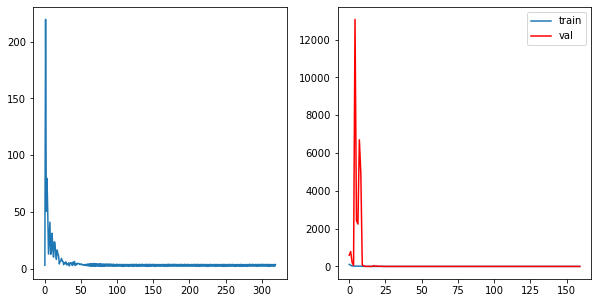

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2485, grad_fn=<L1LossBackward0>)
tensor(3.8162, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 160	 \Training Loss: 3.0323123931884766	     Validation Loss:2.3500912189483643	 \ LR:1.0000000000000004e-08


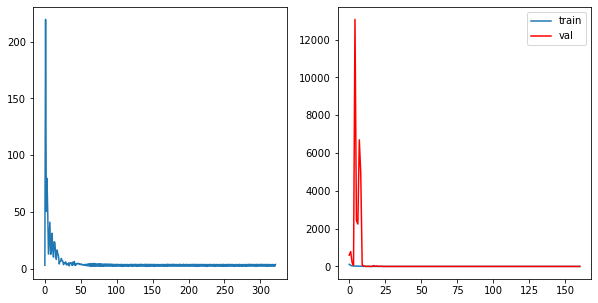

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2723, grad_fn=<L1LossBackward0>)
tensor(3.7915, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 161	 \Training Loss: 3.031922936439514	     Validation Loss:2.3637783527374268	 \ LR:1.0000000000000004e-08


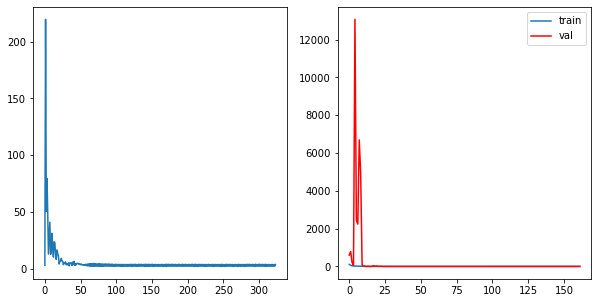

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1244, grad_fn=<L1LossBackward0>)
tensor(3.7693, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 162	 \Training Loss: 2.94687020778656	     Validation Loss:2.389732837677002	 \ LR:1.0000000000000004e-08


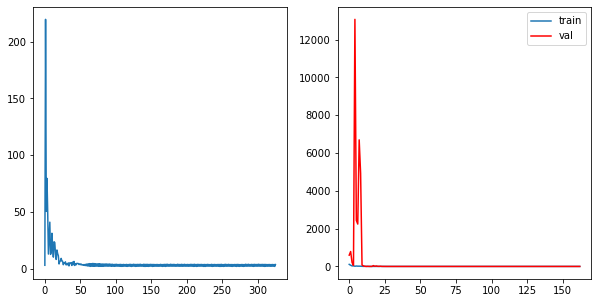

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3019, grad_fn=<L1LossBackward0>)
tensor(3.7948, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 163	 \Training Loss: 3.048313021659851	     Validation Loss:2.3492491245269775	 \ LR:1.0000000000000004e-08


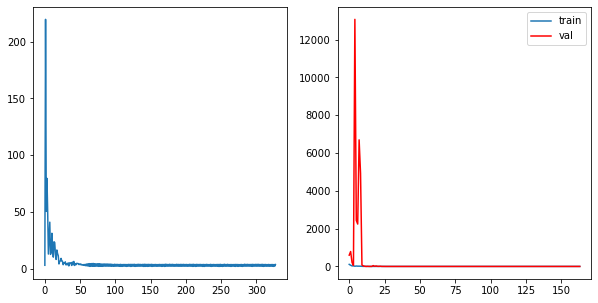

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2918, grad_fn=<L1LossBackward0>)
tensor(3.9243, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 164	 \Training Loss: 3.1080591678619385	     Validation Loss:2.4436686038970947	 \ LR:1.0000000000000004e-08


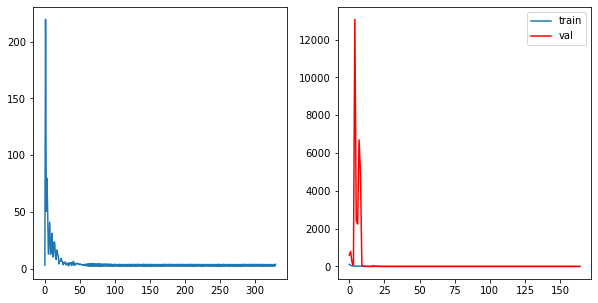

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2997, grad_fn=<L1LossBackward0>)
tensor(4.0098, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 165	 \Training Loss: 3.15470552444458	     Validation Loss:2.347095489501953	 \ LR:1.0000000000000004e-08


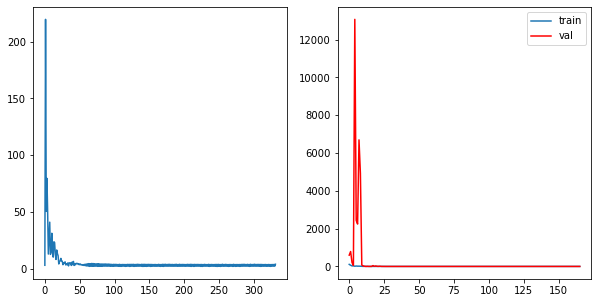

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2830, grad_fn=<L1LossBackward0>)
tensor(3.8326, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 166	 \Training Loss: 3.0578041076660156	     Validation Loss:2.330965518951416	 \ LR:1.0000000000000004e-08


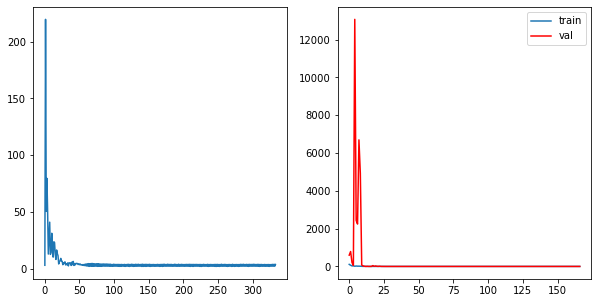

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2913, grad_fn=<L1LossBackward0>)
tensor(3.8264, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 167	 \Training Loss: 3.058868885040283	     Validation Loss:2.338148355484009	 \ LR:1.0000000000000004e-08


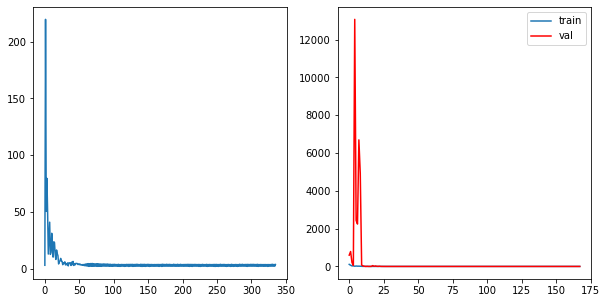

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2962, grad_fn=<L1LossBackward0>)
tensor(3.8762, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 168	 \Training Loss: 3.086167573928833	     Validation Loss:2.359710931777954	 \ LR:1.0000000000000004e-08


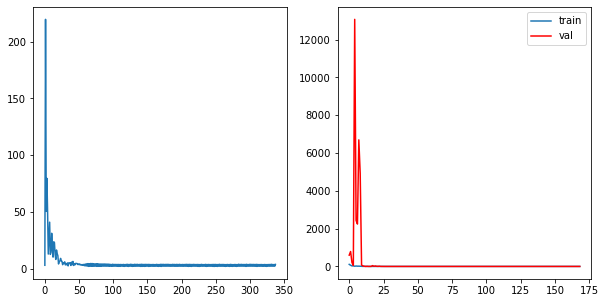

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1205, grad_fn=<L1LossBackward0>)
tensor(3.7735, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 169	 \Training Loss: 2.9469900131225586	     Validation Loss:2.321596384048462	 \ LR:1.0000000000000004e-08


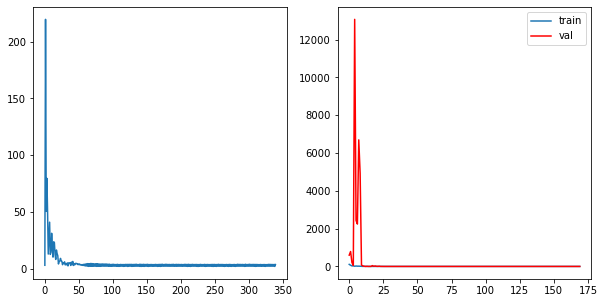

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2882, grad_fn=<L1LossBackward0>)
tensor(3.9793, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 170	 \Training Loss: 3.1337519884109497	     Validation Loss:2.283918619155884	 \ LR:1.0000000000000004e-08


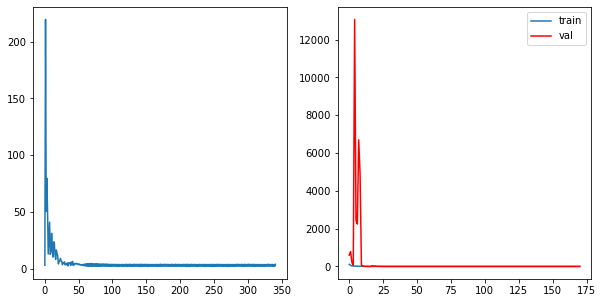

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2840, grad_fn=<L1LossBackward0>)
tensor(3.9662, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 171	 \Training Loss: 3.125069499015808	     Validation Loss:2.4030051231384277	 \ LR:1.0000000000000004e-08


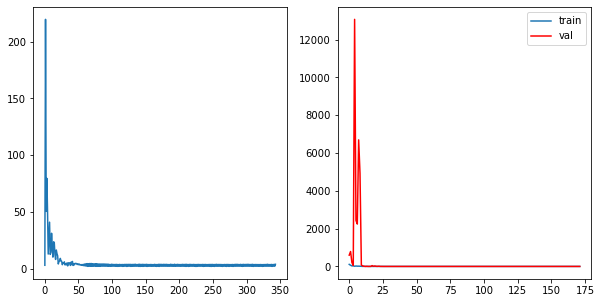

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2823, grad_fn=<L1LossBackward0>)
tensor(3.9672, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 172	 \Training Loss: 3.1247737407684326	     Validation Loss:2.317962646484375	 \ LR:1.0000000000000004e-08


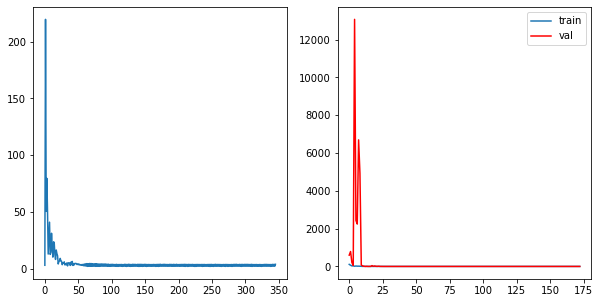

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2874, grad_fn=<L1LossBackward0>)
tensor(3.8481, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 173	 \Training Loss: 3.067755103111267	     Validation Loss:2.322899580001831	 \ LR:1.0000000000000004e-08


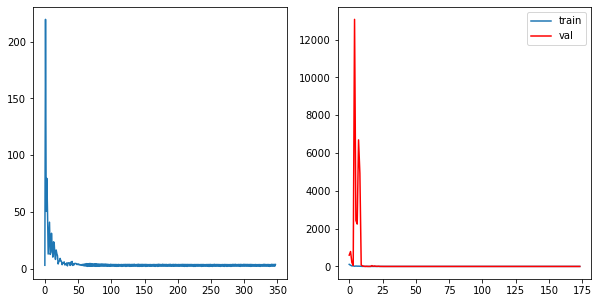

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1207, grad_fn=<L1LossBackward0>)
tensor(3.7588, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 174	 \Training Loss: 2.9397218227386475	     Validation Loss:2.374943256378174	 \ LR:1.0000000000000004e-08


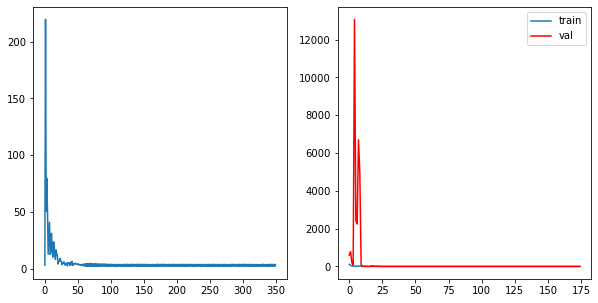

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2773, grad_fn=<L1LossBackward0>)
tensor(3.7742, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 175	 \Training Loss: 3.0257456302642822	     Validation Loss:2.374793529510498	 \ LR:1.0000000000000004e-08


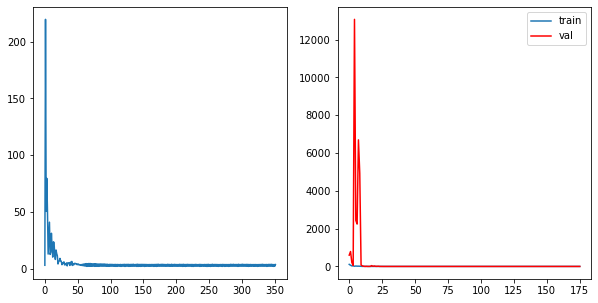

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2813, grad_fn=<L1LossBackward0>)
tensor(3.8313, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 176	 \Training Loss: 3.0563082695007324	     Validation Loss:2.3684356212615967	 \ LR:1.0000000000000004e-08


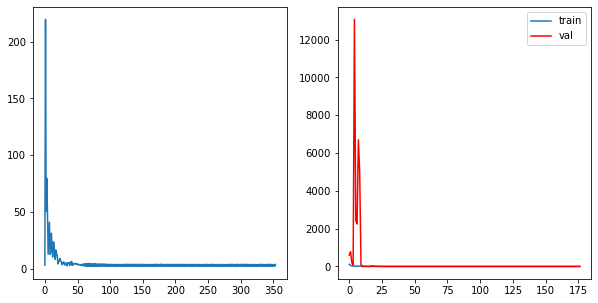

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2551, grad_fn=<L1LossBackward0>)
tensor(4.0161, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 177	 \Training Loss: 3.1356171369552612	     Validation Loss:2.414362907409668	 \ LR:1.0000000000000004e-08


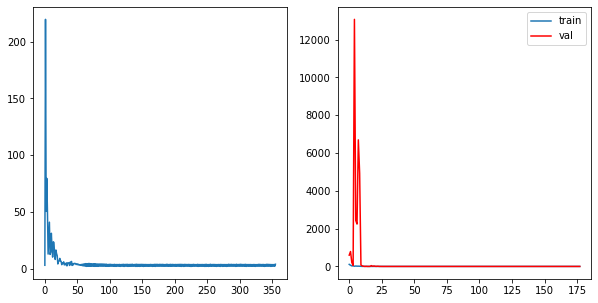

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1200, grad_fn=<L1LossBackward0>)
tensor(3.9331, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 178	 \Training Loss: 3.026551127433777	     Validation Loss:2.299330711364746	 \ LR:1.0000000000000004e-08


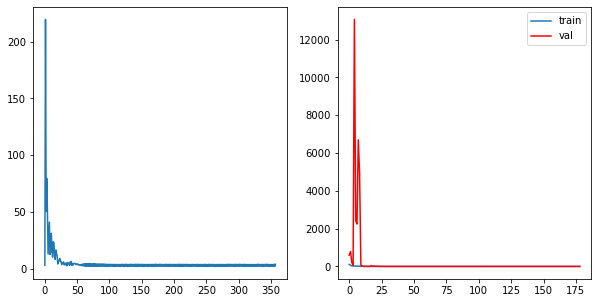

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1302, grad_fn=<L1LossBackward0>)
tensor(4.0232, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 179	 \Training Loss: 3.0767072439193726	     Validation Loss:2.329280138015747	 \ LR:1.0000000000000004e-08


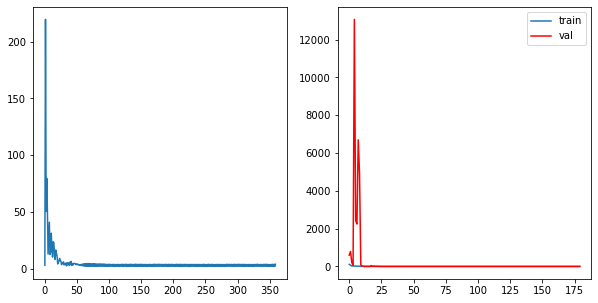

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1036, grad_fn=<L1LossBackward0>)
tensor(3.7865, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 180	 \Training Loss: 2.9450483322143555	     Validation Loss:2.3131983280181885	 \ LR:1.0000000000000004e-08


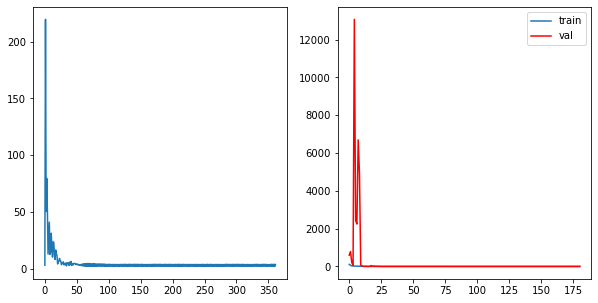

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2193, grad_fn=<L1LossBackward0>)
tensor(4.0174, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 181	 \Training Loss: 3.1183634996414185	     Validation Loss:2.322242259979248	 \ LR:1.0000000000000004e-08


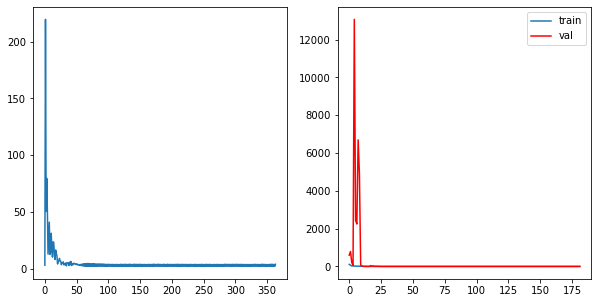

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2889, grad_fn=<L1LossBackward0>)
tensor(3.8231, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 182	 \Training Loss: 3.0559780597686768	     Validation Loss:2.307701826095581	 \ LR:1.0000000000000004e-08


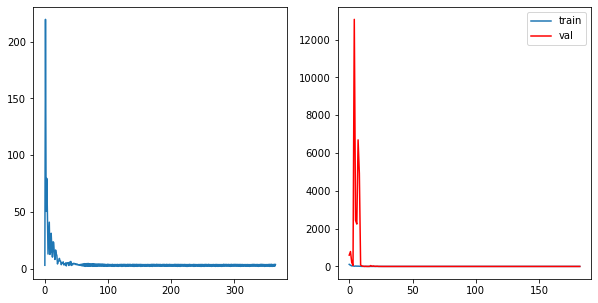

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0977, grad_fn=<L1LossBackward0>)
tensor(3.8330, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 183	 \Training Loss: 2.9653422832489014	     Validation Loss:2.273815870285034	 \ LR:1.0000000000000004e-08


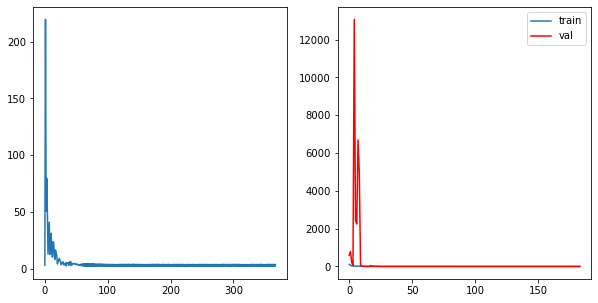

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2420, grad_fn=<L1LossBackward0>)
tensor(3.9984, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 184	 \Training Loss: 3.120225429534912	     Validation Loss:2.336008071899414	 \ LR:1.0000000000000004e-08


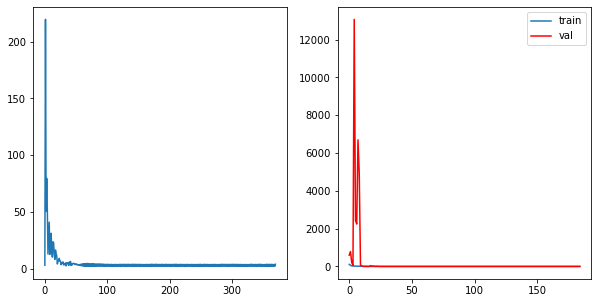

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2773, grad_fn=<L1LossBackward0>)
tensor(3.8632, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 185	 \Training Loss: 3.070221424102783	     Validation Loss:2.3077287673950195	 \ LR:1.0000000000000004e-08


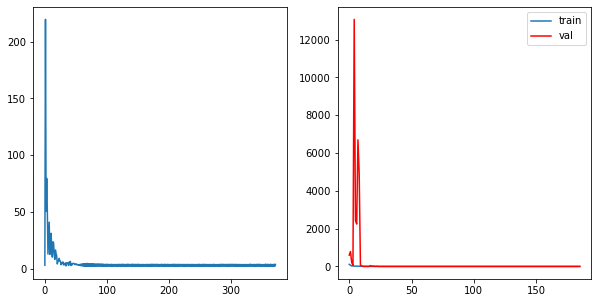

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2481, grad_fn=<L1LossBackward0>)
tensor(3.9635, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 186	 \Training Loss: 3.105778455734253	     Validation Loss:2.319431781768799	 \ LR:1.0000000000000004e-08


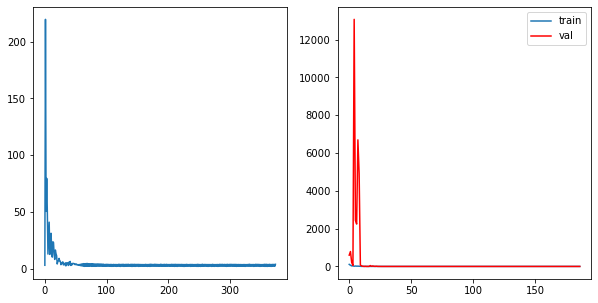

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2395, grad_fn=<L1LossBackward0>)
tensor(3.8493, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 187	 \Training Loss: 3.0444226264953613	     Validation Loss:2.378859043121338	 \ LR:1.0000000000000004e-08


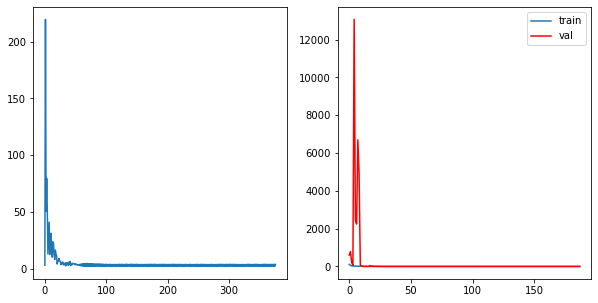

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.3001, grad_fn=<L1LossBackward0>)
tensor(3.8449, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 188	 \Training Loss: 3.072495222091675	     Validation Loss:2.3544135093688965	 \ LR:1.0000000000000004e-08


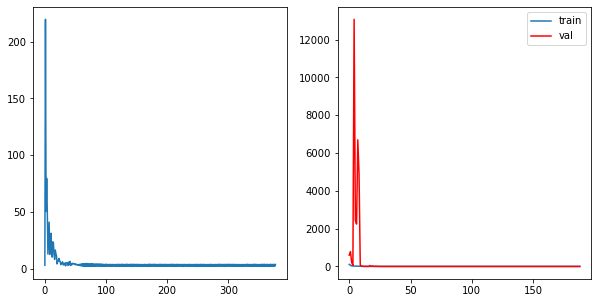

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2391, grad_fn=<L1LossBackward0>)
tensor(3.7879, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 189	 \Training Loss: 3.0135128498077393	     Validation Loss:2.3561904430389404	 \ LR:1.0000000000000004e-08


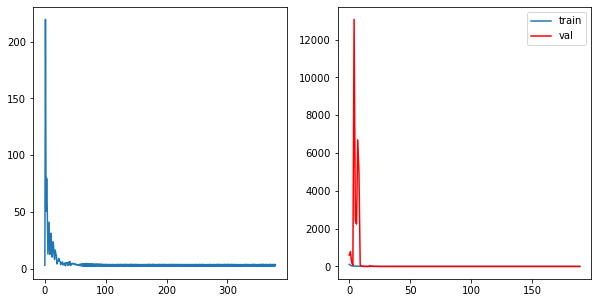

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.0940, grad_fn=<L1LossBackward0>)
tensor(3.8518, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 190	 \Training Loss: 2.972929000854492	     Validation Loss:2.3350765705108643	 \ LR:1.0000000000000004e-08


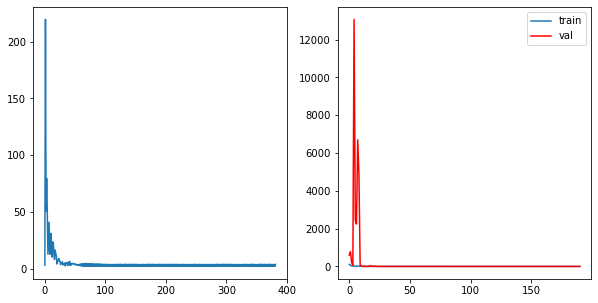

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2917, grad_fn=<L1LossBackward0>)
tensor(3.9222, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 191	 \Training Loss: 3.106939673423767	     Validation Loss:2.362489938735962	 \ LR:1.0000000000000004e-08


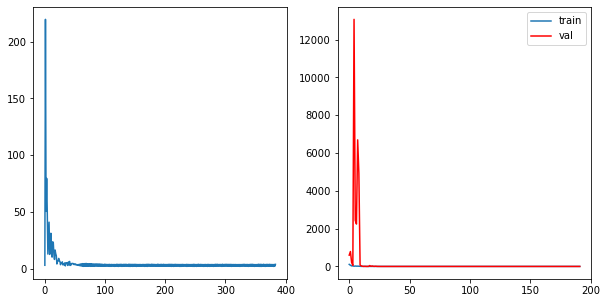

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2883, grad_fn=<L1LossBackward0>)
tensor(3.8476, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 192	 \Training Loss: 3.067947745323181	     Validation Loss:2.318650007247925	 \ LR:1.0000000000000004e-08


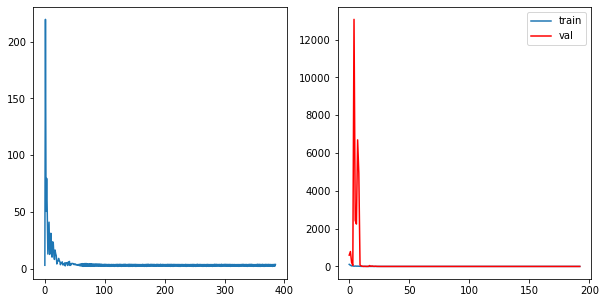

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2269, grad_fn=<L1LossBackward0>)
tensor(3.8604, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 193	 \Training Loss: 3.0436785221099854	     Validation Loss:2.4009838104248047	 \ LR:1.0000000000000004e-08


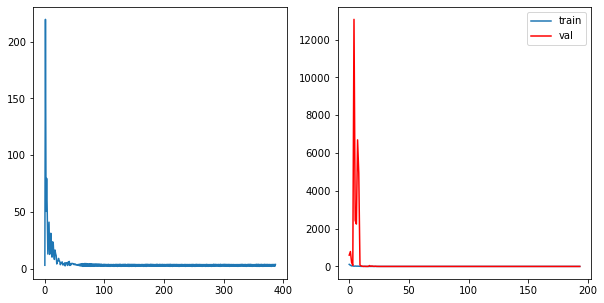

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.1027, grad_fn=<L1LossBackward0>)
tensor(3.7702, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 194	 \Training Loss: 2.9364962577819824	     Validation Loss:2.349022388458252	 \ LR:1.0000000000000004e-08


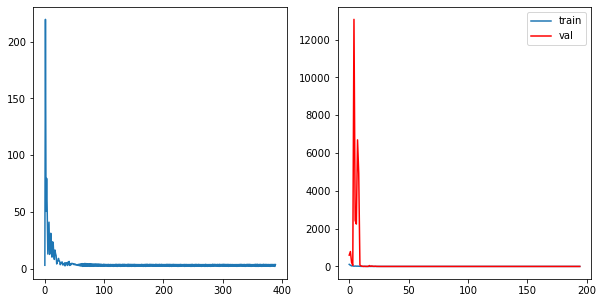

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2733, grad_fn=<L1LossBackward0>)
tensor(3.9443, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 195	 \Training Loss: 3.1087669134140015	     Validation Loss:2.370431661605835	 \ LR:1.0000000000000004e-08


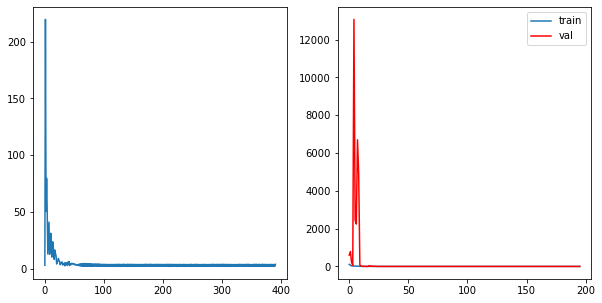

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2750, grad_fn=<L1LossBackward0>)
tensor(3.7623, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 196	 \Training Loss: 3.0186656713485718	     Validation Loss:2.4273924827575684	 \ LR:1.0000000000000004e-08


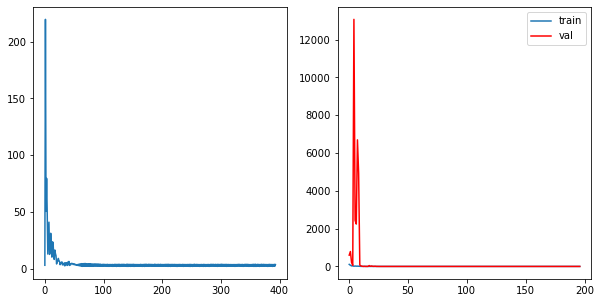

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2703, grad_fn=<L1LossBackward0>)
tensor(3.8156, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 197	 \Training Loss: 3.042951822280884	     Validation Loss:2.4038212299346924	 \ LR:1.0000000000000004e-08


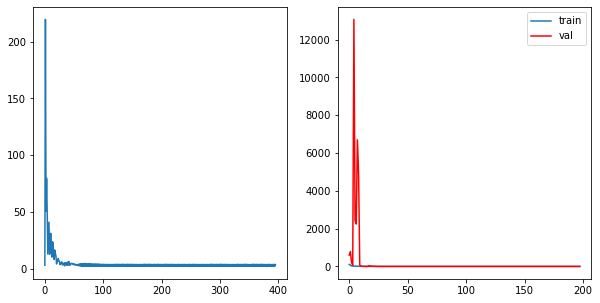

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2376, grad_fn=<L1LossBackward0>)
tensor(3.8437, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 198	 \Training Loss: 3.0406285524368286	     Validation Loss:2.370352268218994	 \ LR:1.0000000000000004e-08


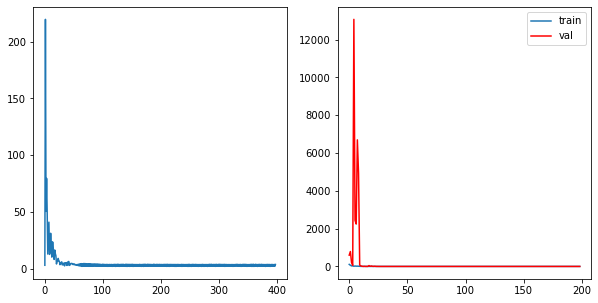

  0%|          | 0/2 [00:00<?, ?it/s]

tensor(2.2834, grad_fn=<L1LossBackward0>)
tensor(3.9375, grad_fn=<L1LossBackward0>)


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 199	 \Training Loss: 3.1104214191436768	     Validation Loss:2.2680130004882812	 \ LR:1.0000000000000004e-08


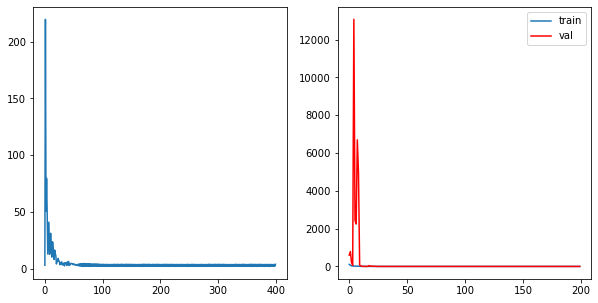

In [36]:
from tqdm.notebook import tqdm
step_losses = []
epoch_losses_train = []
epoch_losses_val = []
best_loss = 10000

for epoch in tqdm(range(epochs)):
    epoch_loss = 0
    epoch_loss_test = 0
    model.train()
    for X, Y in tqdm(data_loader, total=len(data_loader)):
        X, Y = X.to(device), Y.to(device)
        optimizer.zero_grad()
        Y_pred = model(X)
        loss = criterion(Y_pred, Y.float().view(-1, 1))
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        step_losses.append(loss.item())
        print(loss)
    if epoch % 5 == 0:
        state = {'info':  "house floors resnet_18 MAE + aug checkpoint: house_floors_resnet_18_MSE_aug_65 random optimizer "+str(optimizer.param_groups[0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    model.state_dict(),        # параметры модели
         'optimizer': optimizer.state_dict()}    # состояние оптимизатора
        torch.save(state, '/house_floors_checkpoint_MaE_aug_random_opt_' + str(epoch)+ '.pth')
    with torch.no_grad():
        model.eval()
        for X, Y in tqdm(data_loader_val, total=len(data_loader_val), leave=False):
            X, Y = X.to(device), Y.to(device)
            Y_pred = model(X)
            loss_test = criterion(Y_pred, Y.float().view(-1, 1))
            epoch_loss_test += loss_test.item()
    if epoch_loss_test/len(data_loader_val)<best_loss:
        best_loss = epoch_loss_test/len(data_loader_val)
        best_model = model
        best_epoch = epoch
        best_optimizer = optimizer.state_dict()
    epoch_losses_val.append(epoch_loss_test/len(data_loader_val))
    epoch_losses_train.append(epoch_loss/len(data_loader))
    scheduler.step(epoch_loss_test/len(data_loader_val))
    curr_lr = optimizer.param_groups[0]['lr']
    
  
    print(f'Epoch {epoch}\t \Training Loss: {epoch_loss/len(data_loader)}\t \
    Validation Loss:{epoch_loss_test/len(data_loader_val)}\t \ LR:{curr_lr}')
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].plot(step_losses)
    axes[1].plot(epoch_losses_train, label = 'train')
    axes[1].plot(epoch_losses_val, color = 'red', label = 'val')
    axes[1].legend()
    plt.show()


In [20]:
state = {'info':  "BEST house floors resnet_18 MAE + aug checkpoint: house_floors_resnet_18_MSE_aug_65  "+str(best_optimizer['param_groups'][0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    best_model.state_dict(),        # параметры модели
         'optimizer': best_optimizer}    # состояние оптимизатора
torch.save(state, '/house_floors_checkpoint_BEST_MaE_aug_' + str(best_epoch)+ '.pth')

Тестирование последнего эксперимента

Создаем тестовый датасет

In [16]:
alls_images = os.listdir('/house/test/images')
alls_images_train = []
for i in range(len(alls_images)):
    alls_images_train.append(Path('/house/test/images/'+alls_images[i]))

alls_masks = os.listdir('/house/test/masks')
alls_masks_new = []
for i in range(len(alls_images)):
    for j in range(len(alls_masks)):
        if alls_images[i][0:3] == alls_masks[j][0:3]:
            alls_masks_new.append(alls_masks[j])

alls_masks_train = []
for i in range(len(alls_masks_new)):
    alls_masks_train.append(Path('/house/test/masks/'+alls_masks_new[i]))
    
floor = [17, 17, 6, 5, 14, 17, 10, 14, 17]    


df_test = pd.DataFrame(list(zip(alls_images_train, alls_masks_train, floor)), columns = ['images', 'masks', 'floors'])

In [9]:
state = torch.load('/house_floors_checkpoint_BEST_MaE_aug_random_optimizer_35.pth', map_location=torch.device('cpu'))
model = resnet18(pretrained_model=pretrained_model)
#optimizer = optim.Adam(model.parameters(), lr=0.001)
model.load_state_dict(state['model'])        # получаем параметры модели
#optimizer.load_state_dict(state['optimizer'])    # получаем состояние оптимизатора

print(state['info'], state['date'])
#model.eval()

BEST house floors resnet_18 MAE + aug checkpoint: house_floors_resnet_18_MSE_aug_65 random optimizer  0.001 2023-03-12 22:33:40.110190


Тест на валидационной выборке

In [17]:
dataset_val = Dataset_new(df_val)
data_loader_val = DataLoader(dataset_test, batch_size=5)
X, Y = iter(data_loader_val).next()
X, Y = X.to(device), Y.to(device)
print(X.shape, Y.shape)

torch.Size([5, 3, 256, 256]) torch.Size([5])


In [18]:
criterion= nn.L1Loss()
with torch.no_grad():
    model.eval()
    Y_pred = model(X)
    print(criterion(torch.round(Y_pred), Y.float().view(-1, 1)))

tensor(2.4000)


Тестирование на тестовой выборке

In [19]:
dataset_test = Dataset_new(df_test)
data_loader_test = DataLoader(dataset_test, batch_size=9)
X, Y = iter(data_loader_test).next()
X, Y = X.to(device), Y.to(device)
print(X.shape, Y.shape)

torch.Size([9, 3, 256, 256]) torch.Size([9])


In [20]:
criterion= nn.L1Loss()
with torch.no_grad():
    model.eval()
    Y_pred = model(X)
    print(criterion(torch.round(Y_pred), Y.float().view(-1, 1)))

tensor(5.)
